In [ ]:

from google.colab import drive
drive.mount('drive', force_remount=True)

KeyboardInterrupt: 

In [ ]:
%cd /content/drive/MyDrive/F_child_tt2

/content/drive/MyDrive/F_child_tt2


In [ ]:
#for rename the .wav files
!pip install transformers



## 1) Rename .wav from 1.wav,2.wav...

In [ ]:
#Rename *.wav file from 1.wav to so on

import os


def rename_wave_files(folder_path):
    files = os.listdir(folder_path)
    wav_files = [f for f in files if f.lower().endswith('.wav')]

    print(f'Folder path: {folder_path}')
    print(f'All files in the folder: {files}')
    print(f'Wave files found: {len(wav_files)}')

    for index, wav_file in enumerate(wav_files, start=1):
        old_path = os.path.join(folder_path, wav_file)
        new_path = os.path.join(folder_path, f'{index}.wav')
        os.rename(old_path, new_path)
        print(f'Renamed {old_path} to {new_path}')


if __name__ == "__main__":
    folder_path = r'/content/drive/MyDrive/F_child_tt2/fchild_wav'  # Change this to your wav file folder
    rename_wave_files(folder_path)
    print("Wave files renamed successfully!")

Folder path: /content/drive/MyDrive/F_child_tt2/fchild_wav
All files in the folder: ['fchild (29).wav', 'fchild (28).wav', 'fchild (27).wav', 'fchild (26).wav', 'fchild (25).wav', 'fchild (24).wav', 'fchild (23).wav', 'fchild (22).wav', 'fchild (21).wav', 'fchild (20).wav', 'fchild (2).wav', 'fchild (19).wav', 'fchild (18).wav', 'fchild (17).wav', 'fchild (16).wav', 'fchild (15).wav', 'fchild (14).wav', 'fchild (13).wav', 'fchild (12).wav', 'fchild (11).wav', 'fchild (10).wav', 'fchild (1).wav', 'fchild (3).wav', 'fchild (4).wav', 'fchild (5).wav', 'fchild (7).wav', 'fchild (8).wav', 'fchild (9).wav', 'fchild (6).wav', 'fchild (30).wav']
Wave files found: 30
Renamed /content/drive/MyDrive/F_child_tt2/fchild_wav/fchild (29).wav to /content/drive/MyDrive/F_child_tt2/fchild_wav/1.wav
Renamed /content/drive/MyDrive/F_child_tt2/fchild_wav/fchild (28).wav to /content/drive/MyDrive/F_child_tt2/fchild_wav/2.wav
Renamed /content/drive/MyDrive/F_child_tt2/fchild_wav/fchild (27).wav to /content/d

In [ ]:
!pip install Cython

In [ ]:
!pip install torch

In [ ]:
!pip install Cython
!pip install torch
!pip install torchaudio
!pip install transformers

## 2) make transcribe list.txt for tacotron2 voice cloning


In [ ]:
#text.list creating
#select range


import os
import torch
import os
import torch
import torchaudio
from transformers import Wav2Vec2ForCTC, Wav2Vec2Processor

# Define the path where the .wav files are located
wav_directory = "/content/drive/MyDrive/F_child_tt2/fchild_wav"  # Add your wav dir

# Define the output file name
output_file = os.path.join(wav_directory, "list.txt")

# Define the range of .wav files (1 to 165)
# Change the 165 to what ever amount of wav files you have if 100 the change it to 101
wav_files_range = range(1, 144)

# Initialize the list to store file paths and transcripts
file_and_transcripts = []

# Initialize the wav2vec model and processor
model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-large-960h")
processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-large-960h")

# Iterate through the .wav files
for i in wav_files_range:
    wav_file = os.path.join(wav_directory, f"{i}.wav")

    # Check if the .wav file exists
    if os.path.exists(wav_file):
        # Recognize the speech in the .wav file
        try:
            waveform, sample_rate = torchaudio.load(wav_file)
            waveform = waveform.squeeze()  # Squeeze the batch dimension
            resampler = torchaudio.transforms.Resample(
                orig_freq=sample_rate, new_freq=16000)
            waveform = resampler(waveform)
            input_values = processor(
                waveform, return_tensors="pt", sampling_rate=16000).input_values
            logits = model(input_values).logits
            predicted_ids = torch.argmax(logits, dim=-1)
            transcript = processor.decode(predicted_ids[0])
        except FileNotFoundError:
            print(f"File not found: {wav_file}")
            continue

        # Append the desired path format and transcript to the list
        file_and_transcripts.append(
            f"/content/TTS-TT2/wavs/{i}.wav|{transcript}")
    else:
        print(f"File not found: {wav_file}")

# Write the file paths and transcripts to the output file
with open(output_file, "w") as f:
    for line in file_and_transcripts:
        f.write(f"{line}\n")

print(f"File '{output_file}' created successfully.")

Some weights of the model checkpoint at facebook/wav2vec2-large-960h were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_g', 'wav2vec2.encoder.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-large-960h and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.masked_spec_embed', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1']
You s

RuntimeError: Expected 2D (unbatched) or 3D (batched) input to conv1d, but got input of size: [1, 1, 2, 48592]

In [ ]:
import os
import torch
import torchaudio
from transformers import Wav2Vec2ForCTC, Wav2Vec2Processor

# Define the path where the .wav files are located
wav_directory = "/content/drive/MyDrive/F_child_tt2/fchild_wav"  # Add your wav dir

# Define the output file name
output_file = os.path.join(wav_directory, "list.txt")

# Define the range of .wav files (1 to 165)
# Change the 165 to whatever number of wav files you have
wav_files_range = range(1, 144)

# Initialize the list to store file paths and transcripts
file_and_transcripts = []

# Initialize the wav2vec model and processor
model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-large-960h")
processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-large-960h")

# Iterate through the .wav files
for i in wav_files_range:
    wav_file = os.path.join(wav_directory, f"{i}.wav")

    # Check if the .wav file exists
    if os.path.exists(wav_file):
        # Recognize the speech in the .wav file
        try:
            waveform, sample_rate = torchaudio.load(wav_file)
            waveform = waveform.squeeze(0)  # Remove the batch dimension
            waveform = waveform / waveform.abs().max()  # Normalize to [-1, 1]

            # Adjust the input tensor shape
            input_values = input_values.squeeze(0)
            print(input_values.shape)
            logits = model(input_values).logits
            predicted_ids = torch.argmax(logits, dim=-1)
            transcript = processor.batch_decode(predicted_ids)
        except FileNotFoundError:
            print(f"File not found: {wav_file}")
            continue
        print(input_values.shape)
        # Append the desired path format and transcript to the list
        file_and_transcripts.append(
            f"/content/drive/MyDrive/F_child_tt2/fchild_wav/{i}.wav|{transcript[0]}")
    else:
        print(f"File not found: {wav_file}")

# Write the file paths and transcripts to the output file
with open(output_file, "w") as f:
    for line in file_and_transcripts:
        f.write(f"{line}\n")

print(f"File '{output_file}' created successfully.")


Some weights of the model checkpoint at facebook/wav2vec2-large-960h were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_g', 'wav2vec2.encoder.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-large-960h and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.masked_spec_embed', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1']
You s

torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size([2, 48592])
torch.Size(

## 3) Preprocessed the wav files

In [ ]:
#preprocessed wav file

import os
import librosa
import soundfile as sf

input_path = "/content/drive/MyDrive/F_child_tt2/fchild_wav"  # Add your path
output_path = "/content/drive/MyDrive/F_child_tt2/secwavs"  # Add your path

if not os.path.exists(output_path):
    os.makedirs(output_path)

for filename in os.listdir(input_path):
    if filename.endswith(".wav"):
        # Load the .wav file
        filepath = os.path.join(input_path, filename)
        y, sr = librosa.load(filepath, sr=22050)

        # Trim silence
        trimmed_audio, _ = librosa.effects.trim(y, top_db=20)

        # Normalize audio
        normalized_audio = librosa.util.normalize(trimmed_audio)

        # Save processed .wav file to the output folder
        output_filepath = os.path.join(output_path, filename)
        sf.write(output_filepath, normalized_audio, sr, subtype='PCM_16')

print("All .wav files have been preprocessed and saved to the output folder.")

All .wav files have been preprocessed and saved to the output folder.


In [ ]:
!pip install pytaglib


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.7/949.7 kB 12.6 MB/s eta 0:00:00


In [ ]:
#upload metadata ,add title and track number to .wav file
import os
import shutil
import taglib


def update_metadata(input_folder, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for i in range(1, 31):  # change  this to the number of files in your folder + 1
        input_file = os.path.join(input_folder, f"{i}.wav")
        output_file = os.path.join(output_folder, f"{i}.wav")

        if os.path.exists(input_file):
            # Load WAV file and update metadata
            with taglib.File(input_file) as audio:
                # Set the title to match the file name without the extension
                audio.tags["TITLE"] = [f"{i}"]
                # Set the track number to match the file name without the extension
                audio.tags["TRACKNUMBER"] = [f"{i}"]

                # Save updated WAV file
                audio.save()

            # Copy the updated file to the output folder instead of moving it
            shutil.copy2(input_file, output_file)

            print(
                f"Updated metadata for {i}.wav: title='{i}', track number={i}")  # Update the print statement as well
        else:
            print(f"File {i}.wav not found.")


if __name__ == "__main__":
    input_folder = "/content/drive/MyDrive/F_child_tt2/secwavs"  # your path
    output_folder = "/content/drive/MyDrive/F_child_tt2/wavs"  # your path
    update_metadata(input_folder, output_folder)

Updated metadata for 1.wav: title='1', track number=1
Updated metadata for 2.wav: title='2', track number=2
Updated metadata for 3.wav: title='3', track number=3
Updated metadata for 4.wav: title='4', track number=4
Updated metadata for 5.wav: title='5', track number=5
Updated metadata for 6.wav: title='6', track number=6
Updated metadata for 7.wav: title='7', track number=7
Updated metadata for 8.wav: title='8', track number=8
Updated metadata for 9.wav: title='9', track number=9
Updated metadata for 10.wav: title='10', track number=10
Updated metadata for 11.wav: title='11', track number=11
Updated metadata for 12.wav: title='12', track number=12
Updated metadata for 13.wav: title='13', track number=13
Updated metadata for 14.wav: title='14', track number=14
Updated metadata for 15.wav: title='15', track number=15
Updated metadata for 16.wav: title='16', track number=16
Updated metadata for 17.wav: title='17', track number=17
Updated metadata for 18.wav: title='18', track number=18
U

In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-ccbe0085-5816-0508-4c3e-2a703f5a5c52)


## 4) Install tacotron2

In [ ]:
#tacotron installation

%matplotlib inline
import os
import io
%cd /content/
if not os.path.isdir("/content/TTS-TT2/"):
  print("Cloning justinjohn0306/TTS-TT2")
  !git clone https://github.com/justinjohn0306/ARPAtaco2.git TTS-TT2
  %cd /content/TTS-TT2/
  !git submodule init
  !git submodule update
%cd /content/TTS-TT2/
#NVIDIA's requirements
#I believe Colab gives us PyTorch and TF by default so we don't need anything else
#Versions specified in requirements.txt have conflicts so that's why we simply get current versions
print("Downloading tacotron2 requirements")
!pip install matplotlib numpy inflect scipy Unidecode pillow
#Our requirements
#We'll need gdown to download some really cool things
!pip install git+https://github.com/wkentaro/gdown.git
import gdown
!git submodule init
!git submodule update
!pip install ffmpeg-normalize
!pip install -q unidecode tensorboardX
!apt-get -qq install sox
!apt-get install pv
!apt-get install jq
!wget https://raw.githubusercontent.com/tonikelope/megadown/master/megadown -O megadown.sh
!chmod 755 megadown.sh
#Download NVIDIA's LJSpeech model
tt2_pretrained = "https://drive.google.com/uc?id=1c5ZTuT7J08wLUoVZ2KkUs_VdZuJ86ZqA"
if not os.path.isfile("/content/TTS-TT2/pretrained_model"):
  print("Downloading tt2 pretrained")
  gdown.download(tt2_pretrained, "/content/TTS-TT2/pretrained_model", quiet=False)

latest_downloaded = None

import time
import logging

logging.getLogger('matplotlib').setLevel(logging.WARNING)
logging.getLogger('numba').setLevel(logging.WARNING)
logging.getLogger('librosa').setLevel(logging.WARNING)


import argparse
import math
from numpy import finfo

import torch
from distributed import apply_gradient_allreduce
import torch.distributed as dist
from torch.utils.data.distributed import DistributedSampler
from torch.utils.data import DataLoader

from model import Tacotron2
from data_utils import TextMelLoader, TextMelCollate
from loss_function import Tacotron2Loss
from logger import Tacotron2Logger
from hparams import create_hparams

import random
import numpy as np

import layers
from utils import load_wav_to_torch, load_filepaths_and_text
from text import text_to_sequence
from math import e
#from tqdm import tqdm # Terminal
#from tqdm import tqdm_notebook as tqdm # Legacy Notebook TQDM
from tqdm.notebook import tqdm # Modern Notebook TQDM
from distutils.dir_util import copy_tree
import matplotlib.pylab as plt

def download_from_google_drive(file_id, file_name):
  # download a file from the Google Drive link
  !rm -f ./cookie
  !curl -c ./cookie -s -L "https://drive.google.com/uc?export=download&id={file_id}" > /dev/null
  confirm_text = !awk '/download/ {print $NF}' ./cookie
  confirm_text = confirm_text[0]
  !curl -Lb ./cookie "https://drive.google.com/uc?export=download&confirm={confirm_text}&id={file_id}" -o {file_name}

def create_mels():
    print("Generating Mels")
    stft = layers.TacotronSTFT(
                hparams.filter_length, hparams.hop_length, hparams.win_length,
                hparams.n_mel_channels, hparams.sampling_rate, hparams.mel_fmin,
                hparams.mel_fmax)
    def save_mel(filename):
        audio, sampling_rate = load_wav_to_torch(filename)
        if sampling_rate != stft.sampling_rate:
            raise ValueError("{} {} SR doesn't match target {} SR".format(filename,
                sampling_rate, stft.sampling_rate))
        audio_norm = audio / hparams.max_wav_value
        audio_norm = audio_norm.unsqueeze(0)
        audio_norm = torch.autograd.Variable(audio_norm, requires_grad=False)
        melspec = stft.mel_spectrogram(audio_norm)
        melspec = torch.squeeze(melspec, 0).cpu().numpy()
        np.save(filename.replace('.wav', ''), melspec)

    import glob
    wavs = glob.glob('wavs/*.wav')
    for i in tqdm(wavs):
        save_mel(i)


def reduce_tensor(tensor, n_gpus):
    rt = tensor.clone()
    dist.all_reduce(rt, op=dist.reduce_op.SUM)
    rt /= n_gpus
    return rt


def init_distributed(hparams, n_gpus, rank, group_name):
    assert torch.cuda.is_available(), "Distributed mode requires CUDA."
    print("Initializing Distributed")

    # Set cuda device so everything is done on the right GPU.
    torch.cuda.set_device(rank % torch.cuda.device_count())

    # Initialize distributed communication
    dist.init_process_group(
        backend=hparams.dist_backend, init_method=hparams.dist_url,
        world_size=n_gpus, rank=rank, group_name=group_name)

    print("Done initializing distributed")


def prepare_dataloaders(hparams):
    # Get data, data loaders and collate function ready
    trainset = TextMelLoader(hparams.training_files, hparams)
    valset = TextMelLoader(hparams.validation_files, hparams)
    collate_fn = TextMelCollate(hparams.n_frames_per_step)

    if hparams.distributed_run:
        train_sampler = DistributedSampler(trainset)
        shuffle = False
    else:
        train_sampler = None
        shuffle = True

    train_loader = DataLoader(trainset, num_workers=1, shuffle=shuffle,
                              sampler=train_sampler,
                              batch_size=hparams.batch_size, pin_memory=False,
                              drop_last=True, collate_fn=collate_fn)
    return train_loader, valset, collate_fn


def prepare_directories_and_logger(output_directory, log_directory, rank):
    if rank == 0:
        if not os.path.isdir(output_directory):
            os.makedirs(output_directory)
            os.chmod(output_directory, 0o775)
        logger = Tacotron2Logger(os.path.join(output_directory, log_directory))
    else:
        logger = None
    return logger


def load_model(hparams):
    model = Tacotron2(hparams).cuda()
    if hparams.fp16_run:
        model.decoder.attention_layer.score_mask_value = finfo('float16').min

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    return model


def warm_start_model(checkpoint_path, model, ignore_layers):
    assert os.path.isfile(checkpoint_path)
    print("Warm starting model from checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model_dict = checkpoint_dict['state_dict']
    if len(ignore_layers) > 0:
        model_dict = {k: v for k, v in model_dict.items()
                      if k not in ignore_layers}
        dummy_dict = model.state_dict()
        dummy_dict.update(model_dict)
        model_dict = dummy_dict
    model.load_state_dict(model_dict)
    return model


def load_checkpoint(checkpoint_path, model, optimizer):
    assert os.path.isfile(checkpoint_path)
    print("Loading checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model.load_state_dict(checkpoint_dict['state_dict'])
    optimizer.load_state_dict(checkpoint_dict['optimizer'])
    learning_rate = checkpoint_dict['learning_rate']
    iteration = checkpoint_dict['iteration']
    print("Loaded checkpoint '{}' from iteration {}" .format(
        checkpoint_path, iteration))
    return model, optimizer, learning_rate, iteration


def save_checkpoint(model, optimizer, learning_rate, iteration, filepath):
    import random
    if True:
        print("Saving model and optimizer state at iteration {} to {}".format(
            iteration, filepath))
        try:
            torch.save({'iteration': iteration,
                    'state_dict': model.state_dict(),
                    'optimizer': optimizer.state_dict(),
                    'learning_rate': learning_rate}, filepath)
        except KeyboardInterrupt:
            print("interrupt received while saving, waiting for save to complete.")
            torch.save({'iteration': iteration,'state_dict': model.state_dict(),'optimizer': optimizer.state_dict(),'learning_rate': learning_rate}, filepath)
        print("Model Saved")

def plot_alignment(alignment, info=None):
    %matplotlib inline
    fig, ax = plt.subplots(figsize=(int(alignment_graph_width/100), int(alignment_graph_height/100)))
    im = ax.imshow(alignment, cmap='inferno', aspect='auto', origin='lower',
                   interpolation='none')
    ax.autoscale(enable=True, axis="y", tight=True)
    fig.colorbar(im, ax=ax)
    xlabel = 'Decoder timestep'
    if info is not None:
        xlabel += '\n\n' + info
    plt.xlabel(xlabel)
    plt.ylabel('Encoder timestep')
    plt.tight_layout()
    fig.canvas.draw()
    plt.show()

def validate(model, criterion, valset, iteration, batch_size, n_gpus,
             collate_fn, logger, distributed_run, rank, epoch, start_eposh, learning_rate):
    """Handles all the validation scoring and printing"""
    model.eval()
    with torch.no_grad():
        val_sampler = DistributedSampler(valset) if distributed_run else None
        val_loader = DataLoader(valset, sampler=val_sampler, num_workers=1,
                                shuffle=False, batch_size=batch_size,
                                pin_memory=False, collate_fn=collate_fn)

        val_loss = 0.0
        for i, batch in enumerate(val_loader):
            x, y = model.parse_batch(batch)
            y_pred = model(x)
            loss = criterion(y_pred, y)
            if distributed_run:
                reduced_val_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_val_loss = loss.item()
            val_loss += reduced_val_loss
        val_loss = val_loss / (i + 1)

    model.train()
    if rank == 0:
        print("Epoch: {} Validation loss {}: {:9f}  Time: {:.1f}m LR: {:.6f}".format(epoch, iteration, val_loss,(time.perf_counter()-start_eposh)/60, learning_rate))
        logger.log_validation(val_loss, model, y, y_pred, iteration)
        if hparams.show_alignments:
            %matplotlib inline
            _, mel_outputs, gate_outputs, alignments = y_pred
            idx = random.randint(0, alignments.size(0) - 1)
            plot_alignment(alignments[idx].data.cpu().numpy().T)

def train(output_directory, log_directory, checkpoint_path, warm_start, n_gpus,
          rank, group_name, hparams, log_directory2, save_interval, backup_interval):
    """Training and validation logging results to tensorboard and stdout

    Params
    ------
    output_directory (string): directory to save checkpoints
    log_directory (string) directory to save tensorboard logs
    checkpoint_path(string): checkpoint path
    n_gpus (int): number of gpus
    rank (int): rank of current gpu
    hparams (object): comma separated list of "name=value" pairs.
    """
    if hparams.distributed_run:
        init_distributed(hparams, n_gpus, rank, group_name)

    torch.manual_seed(hparams.seed)
    torch.cuda.manual_seed(hparams.seed)

    model = load_model(hparams)
    learning_rate = hparams.learning_rate
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate,
                                 weight_decay=hparams.weight_decay)

    if hparams.fp16_run:
        from apex import amp
        model, optimizer = amp.initialize(
            model, optimizer, opt_level='O2')

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    criterion = Tacotron2Loss()

    logger = prepare_directories_and_logger(
        output_directory, log_directory, rank)

    train_loader, valset, collate_fn = prepare_dataloaders(hparams)

    # Load checkpoint if one exists
    iteration = 0
    epoch_offset = 0
    if checkpoint_path is not None and os.path.isfile(checkpoint_path):
        if warm_start:
            model = warm_start_model(
                checkpoint_path, model, hparams.ignore_layers)
        else:
            model, optimizer, _learning_rate, iteration = load_checkpoint(
                checkpoint_path, model, optimizer)
            if hparams.use_saved_learning_rate:
                learning_rate = _learning_rate
            iteration += 1  # next iteration is iteration + 1
            epoch_offset = max(0, int(iteration / len(train_loader)))
    else:
      os.path.isfile("/content/TTS-TT2/pretrained_model")
      %cd /dev/null
      !/content/TTS-TT2/megadown.sh https://mega.nz/#!WXY3RILA!KyoGHtfB_sdhmLFoykG2lKWhh0GFdwMkk7OwAjpQHRo --o pretrained_model
      %cd /content/TTS-TT2
      model = warm_start_model("/content/TTS-TT2/pretrained_model", model, hparams.ignore_layers)
      # download LJSpeech pretrained model if no checkpoint already exists

    start_eposh = time.perf_counter()
    learning_rate = 0.0
    model.train()
    is_overflow = False
    # ================ MAIN TRAINNIG LOOP! ===================
    for epoch in tqdm(range(epoch_offset, hparams.epochs)):
        print("\nStarting Epoch: {} Iteration: {}".format(epoch, iteration))
        start_eposh = time.perf_counter() # eposh is russian, not a typo
        for i, batch in tqdm(enumerate(train_loader), total=len(train_loader)):
            start = time.perf_counter()
            if iteration < hparams.decay_start: learning_rate = hparams.A_
            else: iteration_adjusted = iteration - hparams.decay_start; learning_rate = (hparams.A_*(e**(-iteration_adjusted/hparams.B_))) + hparams.C_
            learning_rate = max(hparams.min_learning_rate, learning_rate) # output the largest number
            for param_group in optimizer.param_groups:
                param_group['lr'] = learning_rate

            model.zero_grad()
            x, y = model.parse_batch(batch)
            y_pred = model(x)

            loss = criterion(y_pred, y)
            if hparams.distributed_run:
                reduced_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_loss = loss.item()
            if hparams.fp16_run:
                with amp.scale_loss(loss, optimizer) as scaled_loss:
                    scaled_loss.backward()
            else:
                loss.backward()

            if hparams.fp16_run:
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    amp.master_params(optimizer), hparams.grad_clip_thresh)
                is_overflow = math.isnan(grad_norm)
            else:
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    model.parameters(), hparams.grad_clip_thresh)

            optimizer.step()

            if not is_overflow and rank == 0:
                duration = time.perf_counter() - start
                logger.log_training(
                    reduced_loss, grad_norm, learning_rate, duration, iteration)
                #print("Batch {} loss {:.6f} Grad Norm {:.6f} Time {:.6f}".format(iteration, reduced_loss, grad_norm, duration), end='\r', flush=True)

            iteration += 1
        validate(model, criterion, valset, iteration,
                 hparams.batch_size, n_gpus, collate_fn, logger,
                 hparams.distributed_run, rank, epoch, start_eposh, learning_rate)
        if (epoch+1) % save_interval == 0 or (epoch+1) == hparams.epochs: # not sure if the latter is necessary
            save_checkpoint(model, optimizer, learning_rate, iteration, checkpoint_path)
        if backup_interval > 0 and (epoch+1) % backup_interval == 0:
            save_checkpoint(model, optimizer, learning_rate, iteration, checkpoint_path + "_epoch_%s" % (epoch+1))
        if log_directory2 != None:
            copy_tree(log_directory, log_directory2)
def check_dataset(hparams):
    from utils import load_wav_to_torch, load_filepaths_and_text
    import os
    import numpy as np
    def check_arr(filelist_arr):
        for i, file in enumerate(filelist_arr):
            if len(file) > 2:
                print("|".join(file), "\nhas multiple '|', this may not be an error.")
            if hparams.load_mel_from_disk and '.wav' in file[0]:
                print("[WARNING]", file[0], " in filelist while expecting .npy .")
            else:
                if not hparams.load_mel_from_disk and '.npy' in file[0]:
                    print("[WARNING]", file[0], " in filelist while expecting .wav .")
            if (not os.path.exists(file[0])):
                print("|".join(file), "\n[WARNING] does not exist.")
            if len(file[1]) < 3:
                print("|".join(file), "\n[info] has no/very little text.")
            if not ((file[1].strip())[-1] in r"!?,.;:"):
                print("|".join(file), "\n[info] has no ending punctuation.")
            mel_length = 1
            if hparams.load_mel_from_disk and '.npy' in file[0]:
                melspec = torch.from_numpy(np.load(file[0], allow_pickle=True))
                mel_length = melspec.shape[1]
            if mel_length == 0:
                print("|".join(file), "\n[WARNING] has 0 duration.")
    print("Checking Training Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.training_files) # get split lines from training_files text file.
    check_arr(audiopaths_and_text)
    print("Checking Validation Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.validation_files) # get split lines from validation_files text file.
    check_arr(audiopaths_and_text)
    print("Finished Checking")

warm_start=False#sorry bout that
n_gpus=1
rank=0
group_name=None

# ---- DEFAULT PARAMETERS DEFINED HERE ----
hparams = create_hparams()
model_filename = 'current_model'
hparams.training_files = "filelists/clipper_train_filelist.txt"
hparams.validation_files = "filelists/clipper_val_filelist.txt"
#hparams.use_mmi=True,          # not used in this notebook
#hparams.use_gaf=True,          # not used in this notebook
#hparams.max_gaf=0.5,           # not used in this notebook
#hparams.drop_frame_rate = 0.2  # not used in this notebook
hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1
hparams.decay_start = 15000
hparams.A_ = 5e-4
hparams.B_ = 8000
hparams.C_ = 0
hparams.min_learning_rate = 1e-5
generate_mels = True
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000
hparams.batch_size = 32
hparams.load_mel_from_disk = True
hparams.ignore_layers = []
hparams.epochs = 10000
torch.backends.cudnn.enabled = hparams.cudnn_enabled
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark
output_directory = '/content/drive/My Drive/colab/outdir' # Location to save Checkpoints
log_directory = '/content/TTS-TT2/logs' # Location to save Log files locally
log_directory2 = '/content/drive/My Drive/colab/logs' # Location to copy log files (done at the end of each epoch to cut down on I/O)
checkpoint_path = output_directory+(r'/')+model_filename

# ---- Replace .wav with .npy in filelists ----
!sed -i -- 's,.wav|,.npy|,g' filelists/*.txt
!sed -i -- 's,.wav|,.npy|,g' {hparams.training_files}
!sed -i -- 's,.wav|,.npy|,g' {hparams.validation_files}
# ---- Replace .wav with .npy in filelists ----

%cd /content/TTS-TT2

data_path = 'wavs'
!mkdir {data_path}

/content
/content/TTS-TT2
  Cloning https://github.com/wkentaro/gdown.git to /tmp/pip-req-build-wt8d_29q
  Running command git clone --filter=blob:none --quiet https://github.com/wkentaro/gdown.git /tmp/pip-req-build-wt8d_29q
  Resolved https://github.com/wkentaro/gdown.git to commit 8ddd2916a3d6b09eeeddf2f59718d61c87a9c440
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 3.0 MB/s eta 0:00:00
Selecting previously unselected package libopencore-amrnb0:amd64.
(Reading database ... 121730 files and directories currently installed.)
Preparing to unpack .../0-libopencore-amrnb0_0.1.5-1_amd64.deb ...
Unpacking libopencore-amrnb0:amd64 (0.1.5-1) ...
Selecting previously unselected package libopencore-amrwb0:amd64.
Preparing to unpack .../1-libopencore-amrwb0_0.1.5-1_amd64.deb ...
Unpacking libopencore-amrwb0:amd64 (0.1.5-1) ...
Selecting previously

Downloading...
From (original): https://drive.google.com/uc?id=1c5ZTuT7J08wLUoVZ2KkUs_VdZuJ86ZqA
From (redirected): https://drive.google.com/uc?id=1c5ZTuT7J08wLUoVZ2KkUs_VdZuJ86ZqA&confirm=t&uuid=9f3d794f-d9d4-42f5-923e-17898a54d6fc
To: /content/TTS-TT2/pretrained_model
100%|██████████| 113M/113M [00:02<00:00, 37.6MB/s]


sed: can't read filelists/clipper_train_filelist.txt: No such file or directory
sed: can't read filelists/clipper_val_filelist.txt: No such file or directory
/content/TTS-TT2


In [ ]:
import shutil

# Replace 'your_directory_path' with the path of the directory you want to zip
directory_to_zip = '/content/drive/MyDrive/F_child_tt2/wavs'

# Replace 'your_zip_filename.zip' with the desired name for your zip file
zip_filename = '/content/drive/MyDrive/F_child_tt2/wavs'

# Create a zip file of the directory
shutil.make_archive(zip_filename, 'zip', directory_to_zip)

print(f"Zip file created: {zip_filename}")


Zip file created: /content/drive/MyDrive/F_child_tt2/wavs


## 5) give the zip file in which last (*.wav) files folder

In [ ]:
# give the zip file in which last .wav files created after adding title and track number
audio_processing = True
drive_path = "/content/drive/MyDrive/F_child_tt2/wavs.zip"

from google.colab import files
import zipfile
import os
import wave
import shutil
import datetime

if os.listdir('/content/TTS-TT2/wavs/'):
  !rm /content/TTS-TT2/wavs/*

with open('/content/audios.sh', 'w') as rsh:
    rsh.write('''\
for file in /content/TTS-TT2/wavs/*.wav
do
    ffmpeg -y -i "$file" -ar 22050 /content/tempwav/srtmp.wav -loglevel error
    ffmpeg -y -i /content/tempwav/srtmp.wav -c copy -fflags +bitexact -flags:v +bitexact -flags:a +bitexact -ar 22050 /content/tempwav/poop.wav -loglevel error
    rm "$file"
    mv /content/tempwav/poop.wav "$file"
    rm /content/tempwav/*
done
''')

%cd /content/TTS-TT2/wavs

drive_path = drive_path.strip()

if drive_path:
  if os.path.exists(drive_path):
    print(f"\n\033[34m\033[1mAudio imported from Drive.\n\033[90m")
    if zipfile.is_zipfile(drive_path):
      !unzip -q -j "$drive_path" -d /content/TTS-TT2/wavs

    else:
      fp = drive_path + "/."
      !cp -a "$fp" "/content/TTS-TT2/wavs"
  else:
    print(f"\n\033[33m\033[1m[NOTICE] The path {drive_path} is not found, check for errors and try again.")
    print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
    uploaded = files.upload()
else:
  print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
  uploaded = files.upload()

  for fn in uploaded.keys():
    if zipfile.is_zipfile(fn):
      !unzip -q -j "$fn" -d /content/TTS-TT2/wavs
      !rm "$fn"

if os.path.exists("/content/TTS-TT2/wavs/wavs"):
    for file in os.listdir("/content/TTS-TT2/wavs/wavs"):
      !mv /content/TTS-TT2/wavs/wavs/"$file"  /content/TTS-TT2/wavs/"$file"
!rm /content/TTS-TT2/wavs/list.txt
if audio_processing:
  print(f"\n\033[37mMetadata removal and audio verification...")
  !mkdir /content/tempwav
  !bash /content/audios.sh

totalduration = 0
for file_name in [x for x in os.listdir() if os.path.isfile(x)]:
    with wave.open(file_name, "rb") as wave_file:
        frames = wave_file.getnframes()
        rate = wave_file.getframerate()
        duration = frames / float(rate)
        totalduration += duration

        if duration >= 12:
          print(f"\n\033[33m\033[1m[NOTICE] {file_name} is longer than 12 seconds. Lack of RAM can"
                " occur in a large batch size!")

wav_count = len(os.listdir("/content/TTS-TT2/wavs"))
print(f"\n{wav_count} processed audios. total duration: {str(datetime.timedelta(seconds=round(totalduration, 0)))}\n")

#shutil.make_archive("/content/processedwavs", 'zip', '/content/TTS-TT2/wavs')
#files.download('/content/processedwavs.zip')

print("\n\033[32m\033[1mAll set, please proceed.")

/content/TTS-TT2/wavs

Audio imported from Drive.

rm: cannot remove '/content/TTS-TT2/wavs/list.txt': No such file or directory

Metadata removal and audio verification...
mkdir: cannot create directory ‘/content/tempwav’: File exists

30 processed audios. total duration: 0:01:18


All set, please proceed.


### 6) Upload list.txt file(transcribe)

In [ ]:
#upload list.txt file label file
from google.colab import files
import os

%cd /content/TTS-TT2/filelists/
!rm /content/TTS-TT2/filelists/list.txt

print("\n\033[34m\033[1mUpload your transcript(list)...")
listfn, length = files.upload().popitem()

if listfn != "list.txt":
  !mv "$listfn" list.txt


with open('list.txt', 'r') as f:
    lines = f.readlines()


new_lines = []
for line in lines:
    audio_file_path = '/content/TTS-TT2/' + line.split('|')[0]

    if os.path.exists(audio_file_path):
        new_lines.append(line)


with open('list.txt', 'w') as f:
    f.writelines(new_lines)

%cd /content/TTS-TT2/
print("\n\033[32m\033[1mAll set, please proceed.")

/content/TTS-TT2/filelists

Upload your transcript(list)...


Saving list.txt to list.txt
/content/TTS-TT2

All set, please proceed.


## 6) Model Training provide (model-name, list.txt ,output-directories)

In [ ]:
#name model and give list.txt path and change batchsize etc according to your dataset
import torch
model_filename = 'female_child'


Training_file = "/content/list.txt"
hparams.training_files = Training_file
hparams.validation_files = Training_file




# hparams to Tune
#hparams.use_mmi=True,          # not used in this notebook
#hparams.use_gaf=True,          # not used in this notebook
#hparams.max_gaf=0.5,           # not used in this notebook
#hparams.drop_frame_rate = 0.2  # not used in this notebook
hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1

# Learning Rate             # https://www.desmos.com/calculator/ptgcz4vzsw / http://boards.4channel.org/mlp/thread/34778298#p34789030
hparams.decay_start = 15000         # wait till decay_start to start decaying learning rate


# Start/Max Learning Rate
hparams.A_ = 3e-4 #hprams["3e-6", "1e-5", "1e-4", "5e-4", "1e-3"] {type:"raw", allow-input: true}
hparams.B_ = 8000                   # Decay Rate
hparams.C_ = 0                      # Shift learning rate equation by this value
hparams.min_learning_rate = 1e-5    # Min Learning Rate

# Quality of Life
generate_mels = True
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000


hparams.batch_size = 2
hparams.load_mel_from_disk = True
hparams.ignore_layers = [] # Layers to reset (None by default, other than foreign languages this param can be ignored)
use_cmudict = True

hparams.epochs =  500

torch.backends.cudnn.enabled = hparams.cudnn_enabled
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark


output_directory = '/content/model/'
log_directory = '/content/TTS-TT2/logs' # Location to save Log files locally
log_directory2 = '/content/drive/My Drive/colab/logs' # Location to copy log files (done at the end of each epoch to cut down on I/O)
checkpoint_path = output_directory+(r'/')+model_filename

#train the model from scratch? (If yes, then uncheck the box below):
#warm_start=True #@param {type:"boolean"}


hparams.text_cleaners=["english_cleaners"] + (["cmudict_cleaners"] if use_cmudict is True else [])


In [ ]:

if generate_mels:
    create_mels()

print("Checking for missing files")
# ---- Replace .wav with .npy in filelists ----
!sed -i -- 's,.wav|,.npy|,g' {hparams.training_files}; sed -i -- 's,.wav|,.npy|,g' {hparams.validation_files}

check_dataset(hparams)

Generating Mels


  0%|          | 0/30 [00:00<?, ?it/s]

Checking for missing files
Checking Training Files
/content/TTS-TT2/wavs/1.npy|WELL YOU SEE MISTER HARBEY I'VE BEM WORKING ON MY THIRD BOOK 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/2.npy|I LOUNCH MY ONLINE STORE 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/3.npy|AND I ALSO WROTE A SONG FOR MY MOMY BUTTERFLY 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/4.npy|YOU SEE WHEN I WAS TWO I WAS IN THE KIDD GARDEN 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/5.npy|MY FAVOURIT SUBJECT IS SCIENCE BECAUSE I REALLY WANNA BE SCIENTIST INVENTOR 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/6.npy|MACHINE THAT I CALL MY EST ITS STANDS FOR EMOTIONAL SENSOR TOY 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/7.npy|AS SENSOR IN A I IN USES AI SO THINKS LIKE A HUMAN 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/8.npy|SO ITS UNDERSTAND WHAT IT SEEMS 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/9.npy|AND I WILL THAT

In [ ]:

%cd /content/TTS-TT2/
import text
print(text.sequence_to_text(text.text_to_sequence("We must capture an Earth creature, K 9, and return it back with us to Mars.", ["cmudict_cleaners", "english_cleaners"])))

/content/TTS-TT2
{W IY1} {M AH1 S T} {K AE1 P CH ER0} {AE1 N} {ER1 TH} {K R IY1 CH ER0} , {K EY1} nine , {AH0 N D} {R IH0 T ER1 N} {IH1 T} {B AE1 K} {W IH1 DH} {AH1 S} {T UW1} {M AA1 R Z} .


Model ready to train

FP16 Run: False
Dynamic Loss Scaling: True
Distributed Run: False
cuDNN Enabled: True
cuDNN Benchmark: False
[Errno 20] Not a directory: '/dev/null'
/content/TTS-TT2

Reading link metadata...


/content/TTS-TT2
Warm starting model from checkpoint '/content/TTS-TT2/pretrained_model'


  0%|          | 0/500 [00:00<?, ?it/s]


Starting Epoch: 0 Iteration: 0


  0%|          | 0/15 [00:00<?, ?it/s]

/content/TTS-TT2/utils.py:8: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:83.)
  ids = torch.arange(0, max_len, out=torch.cuda.LongTensor(max_len))


Epoch: 0 Validation loss 15:  0.685167  Time: 0.4m LR: 0.000300


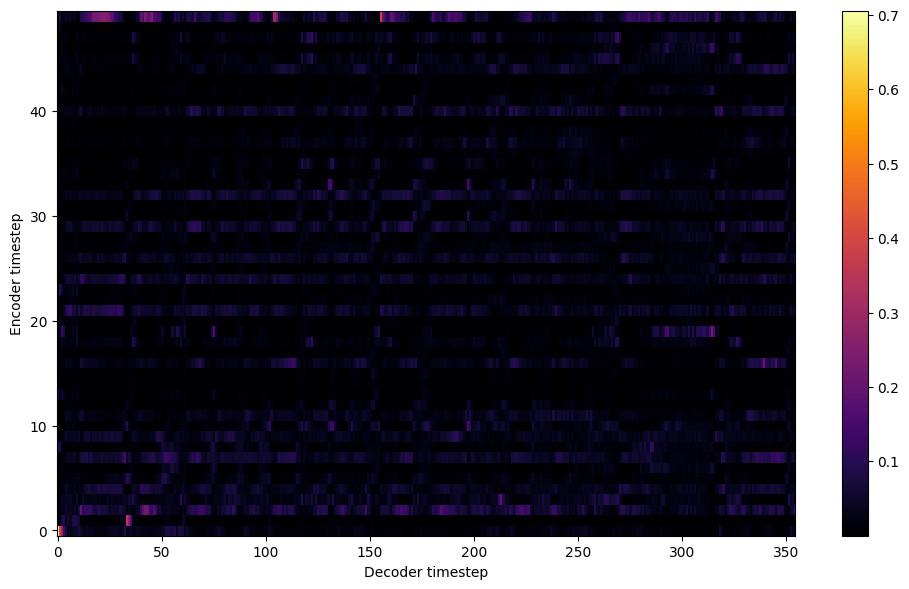


Starting Epoch: 1 Iteration: 15


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 1 Validation loss 30:  0.622270  Time: 0.3m LR: 0.000300


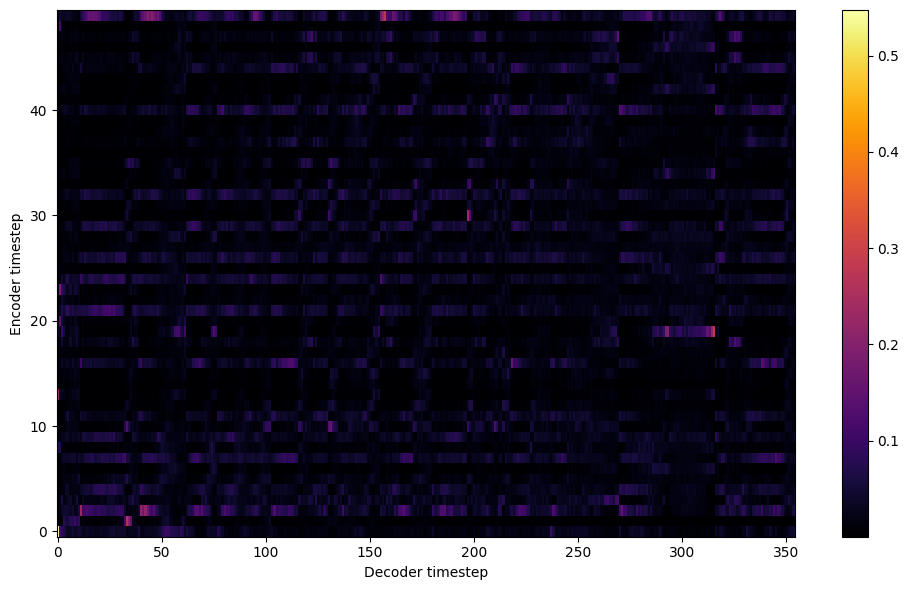


Starting Epoch: 2 Iteration: 30


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 2 Validation loss 45:  0.554766  Time: 0.3m LR: 0.000300


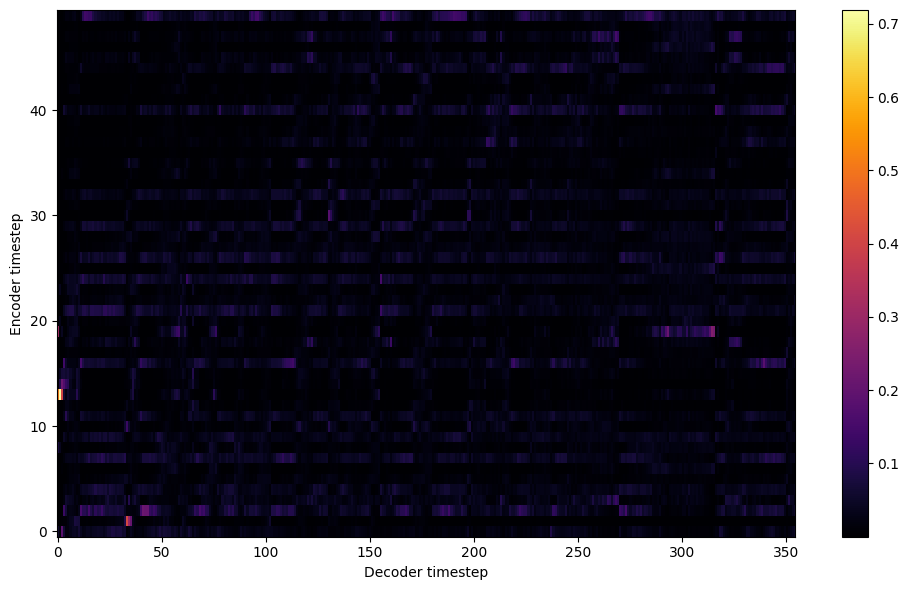


Starting Epoch: 3 Iteration: 45


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 3 Validation loss 60:  0.547166  Time: 0.3m LR: 0.000300


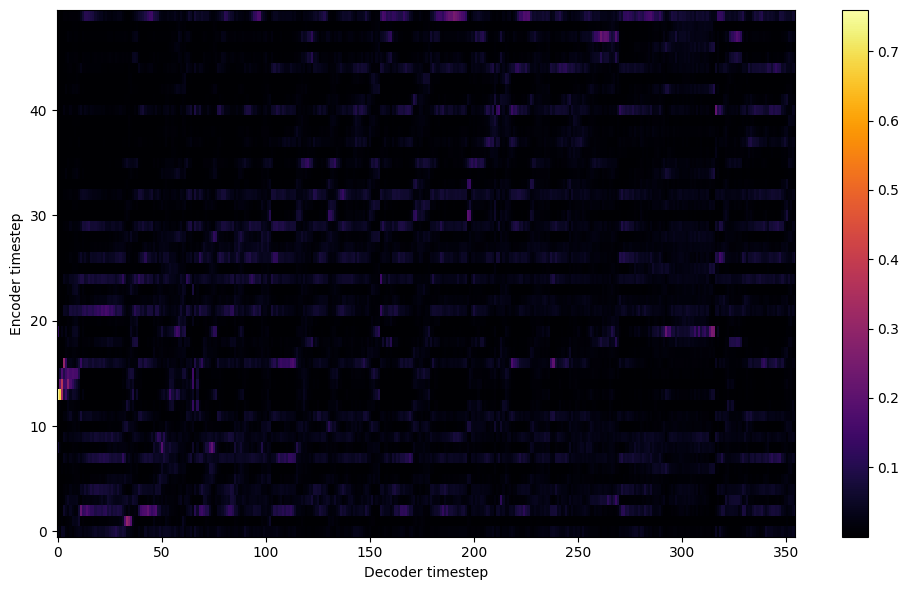


Starting Epoch: 4 Iteration: 60


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 4 Validation loss 75:  0.534683  Time: 0.3m LR: 0.000300


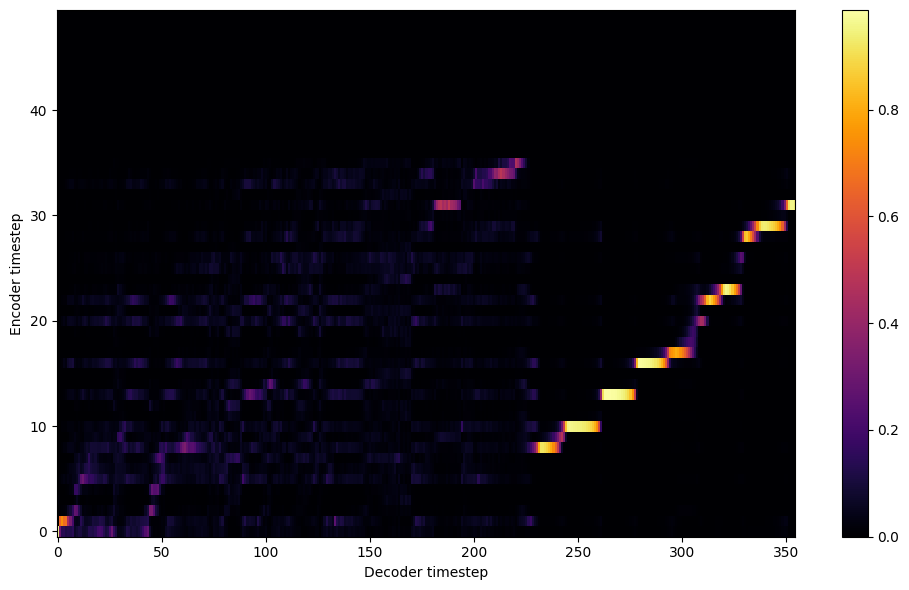


Starting Epoch: 5 Iteration: 75


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 5 Validation loss 90:  0.508734  Time: 0.3m LR: 0.000300


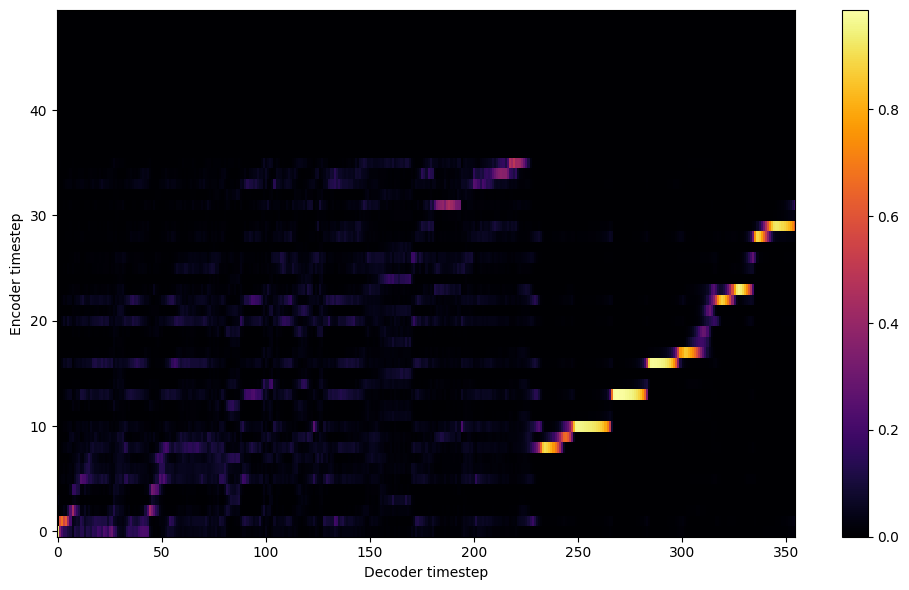


Starting Epoch: 6 Iteration: 90


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 6 Validation loss 105:  0.468468  Time: 0.3m LR: 0.000300


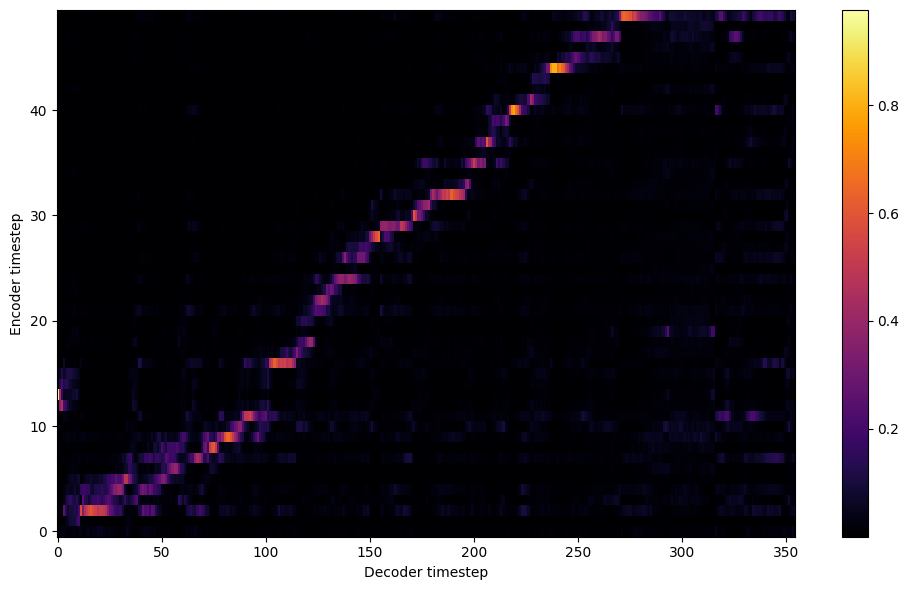


Starting Epoch: 7 Iteration: 105


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 7 Validation loss 120:  0.475750  Time: 0.3m LR: 0.000300


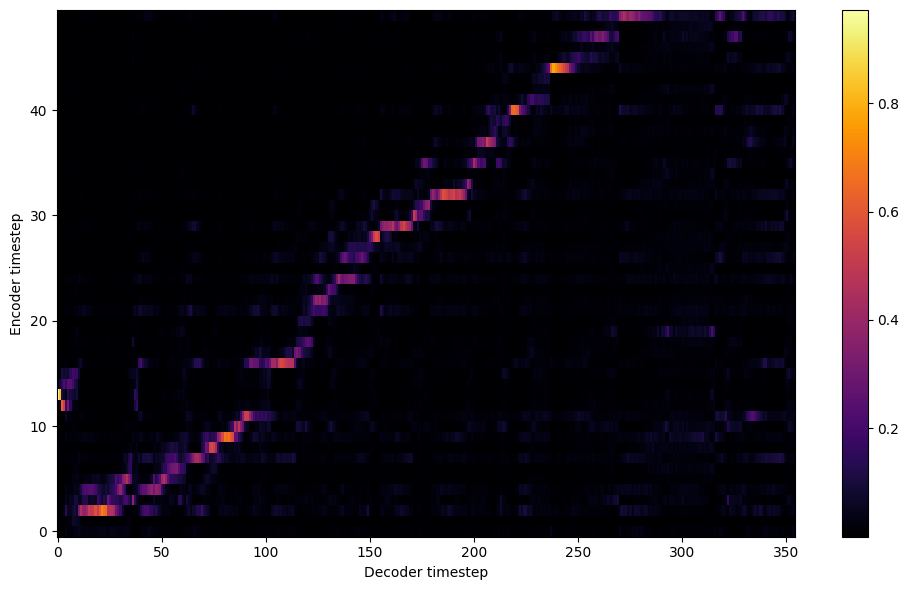


Starting Epoch: 8 Iteration: 120


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 8 Validation loss 135:  0.437359  Time: 0.3m LR: 0.000300


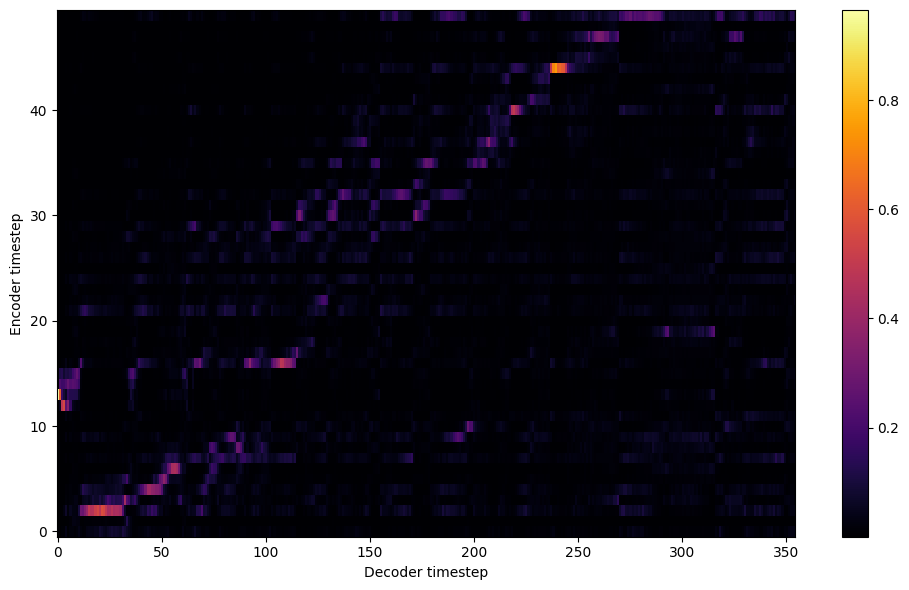


Starting Epoch: 9 Iteration: 135


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 9 Validation loss 150:  0.406531  Time: 0.3m LR: 0.000300


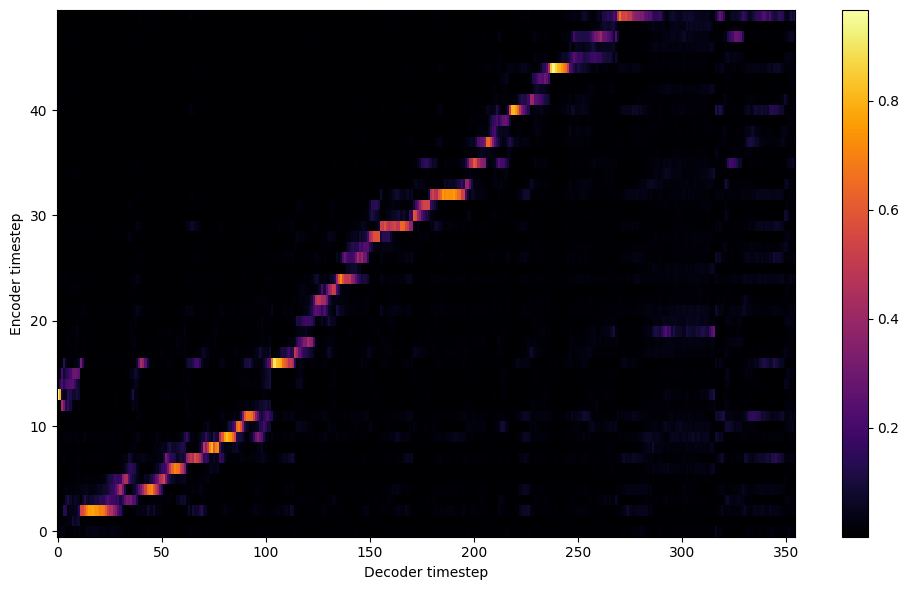

Saving model and optimizer state at iteration 150 to /content/model//female_child
Model Saved

Starting Epoch: 10 Iteration: 150


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 10 Validation loss 165:  0.412673  Time: 0.3m LR: 0.000300


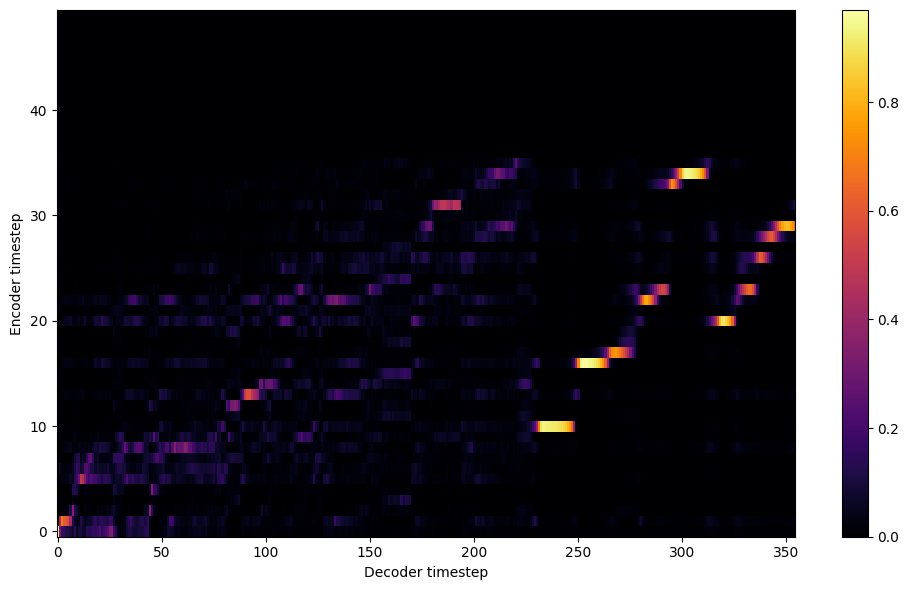


Starting Epoch: 11 Iteration: 165


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 11 Validation loss 180:  0.396856  Time: 0.3m LR: 0.000300


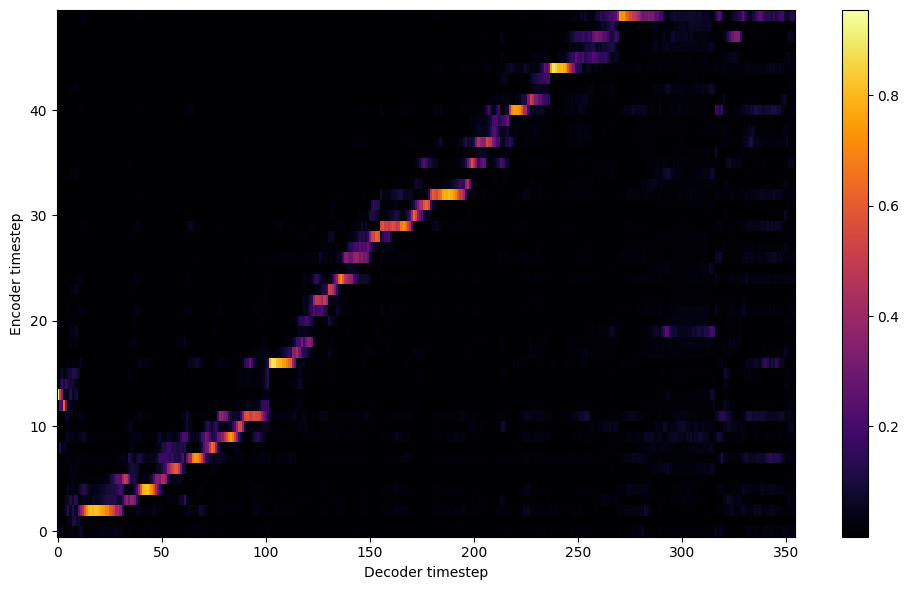


Starting Epoch: 12 Iteration: 180


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 12 Validation loss 195:  0.389905  Time: 0.3m LR: 0.000300


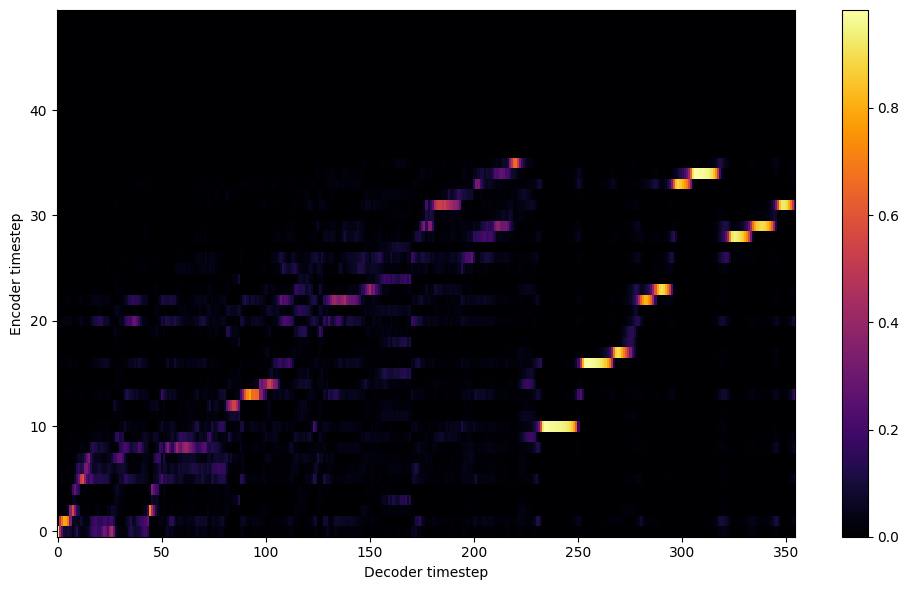


Starting Epoch: 13 Iteration: 195


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 13 Validation loss 210:  0.373651  Time: 0.3m LR: 0.000300


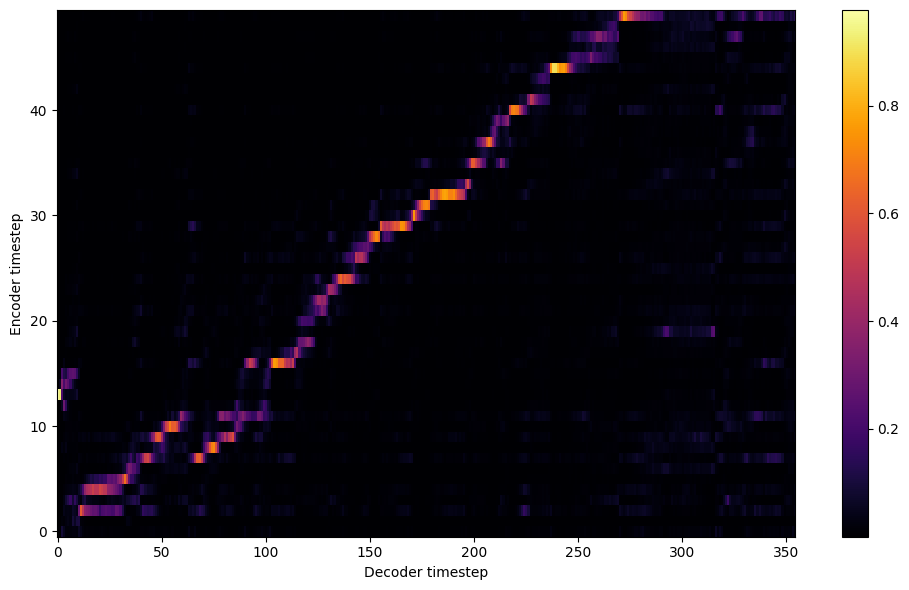


Starting Epoch: 14 Iteration: 210


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 14 Validation loss 225:  0.356320  Time: 0.3m LR: 0.000300


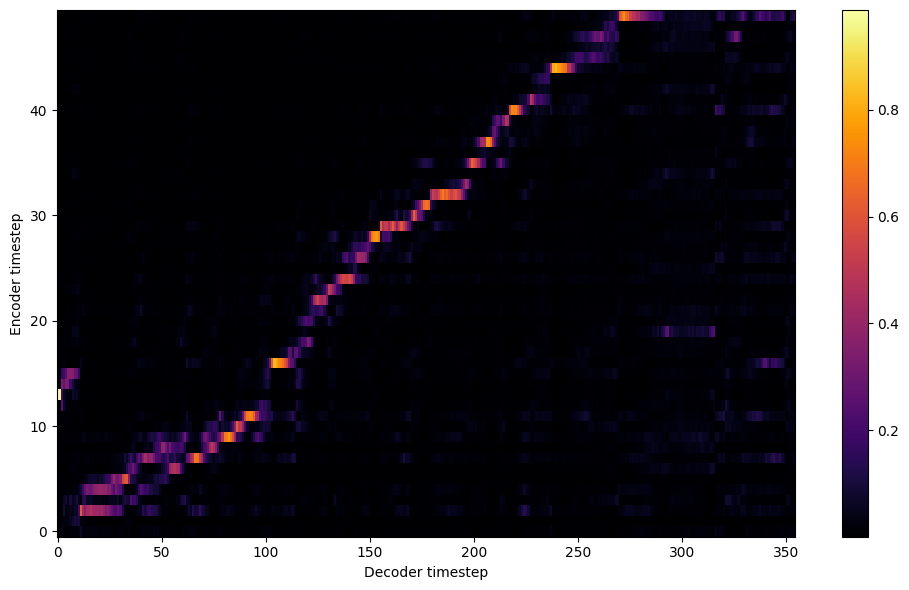


Starting Epoch: 15 Iteration: 225


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 15 Validation loss 240:  0.343101  Time: 0.3m LR: 0.000300


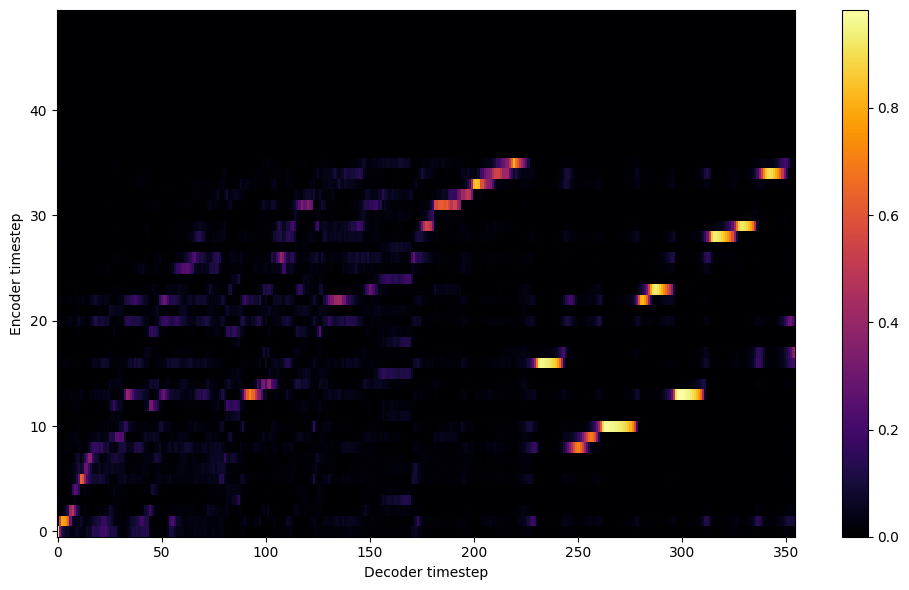


Starting Epoch: 16 Iteration: 240


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 16 Validation loss 255:  0.334056  Time: 0.3m LR: 0.000300


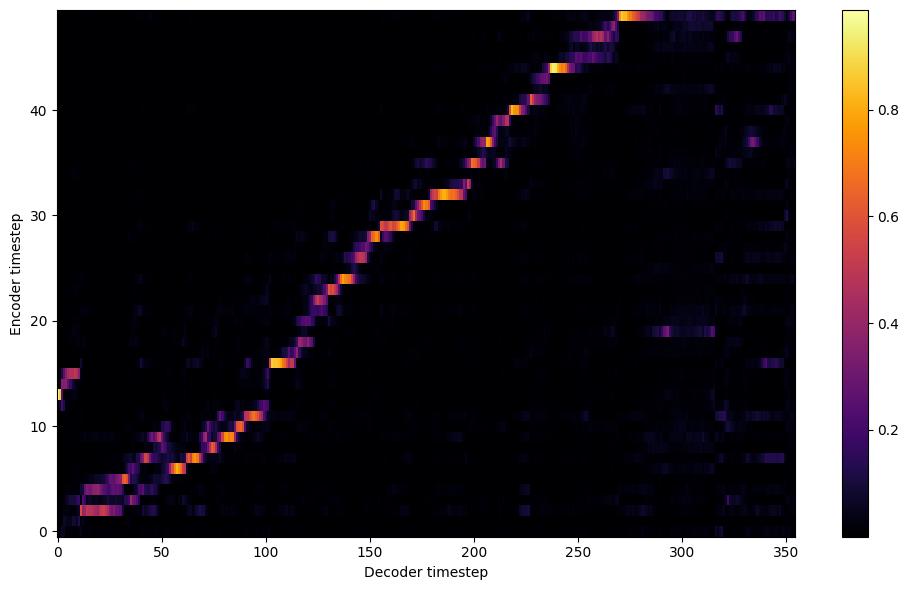


Starting Epoch: 17 Iteration: 255


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 17 Validation loss 270:  0.336972  Time: 0.3m LR: 0.000300


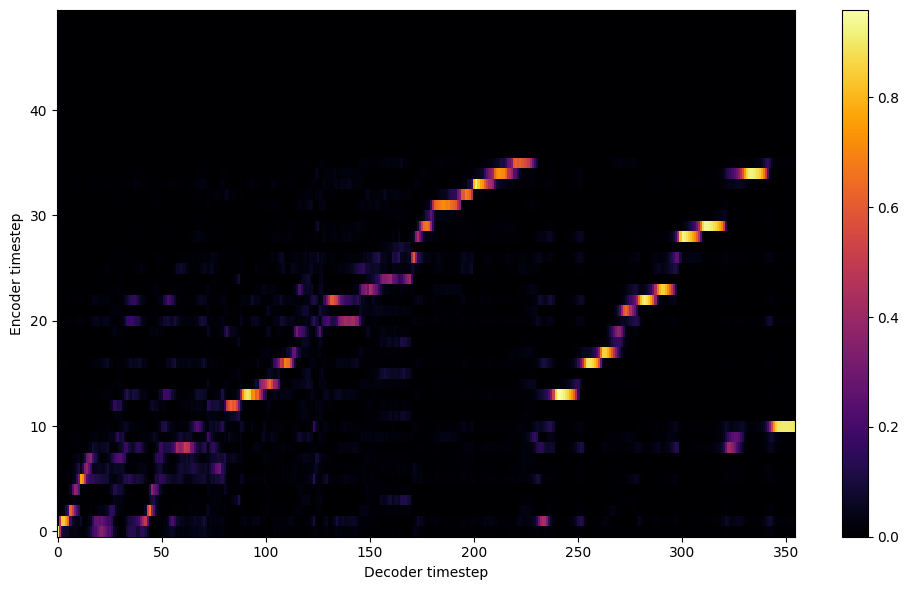


Starting Epoch: 18 Iteration: 270


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 18 Validation loss 285:  0.317971  Time: 0.3m LR: 0.000300


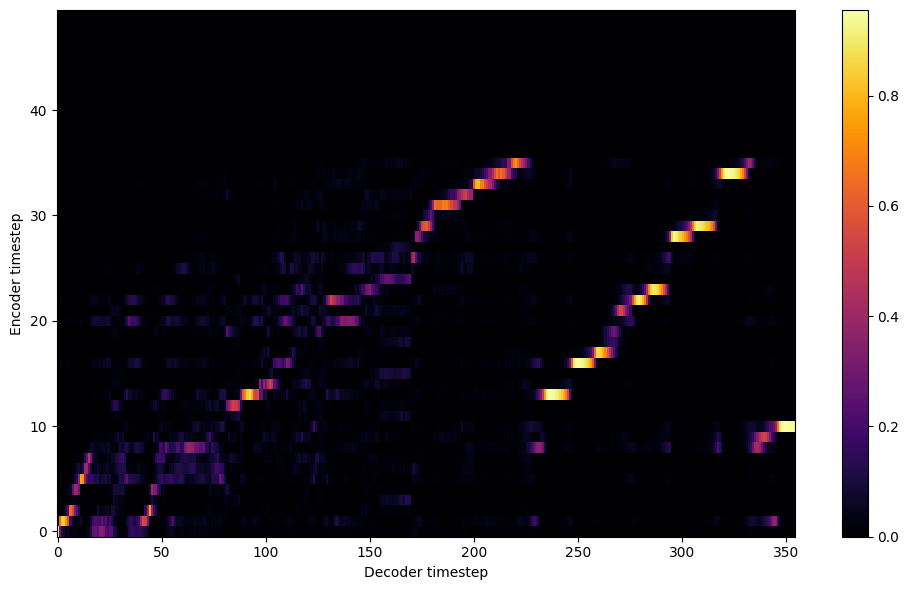


Starting Epoch: 19 Iteration: 285


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 19 Validation loss 300:  0.307820  Time: 0.3m LR: 0.000300


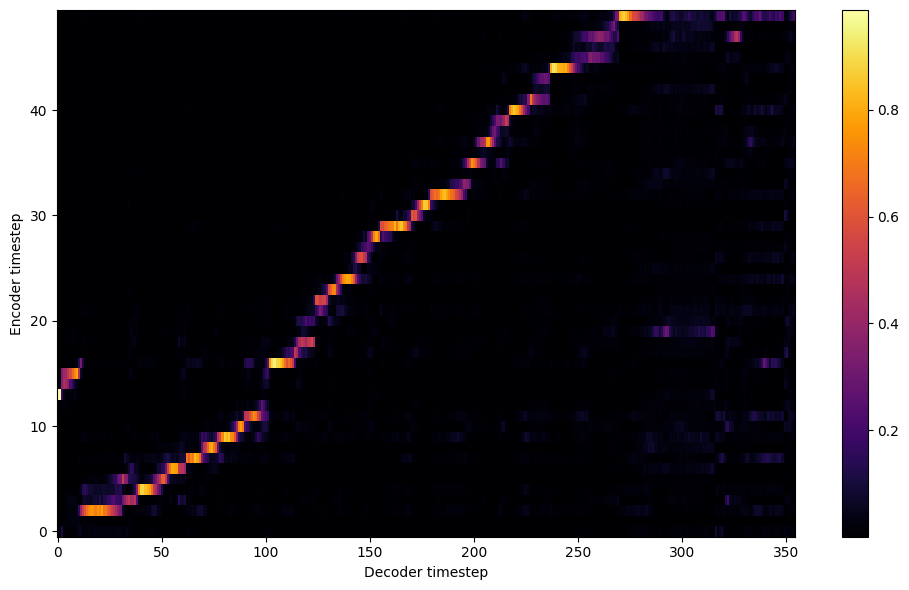

Saving model and optimizer state at iteration 300 to /content/model//female_child
Model Saved

Starting Epoch: 20 Iteration: 300


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 20 Validation loss 315:  0.307859  Time: 0.3m LR: 0.000300


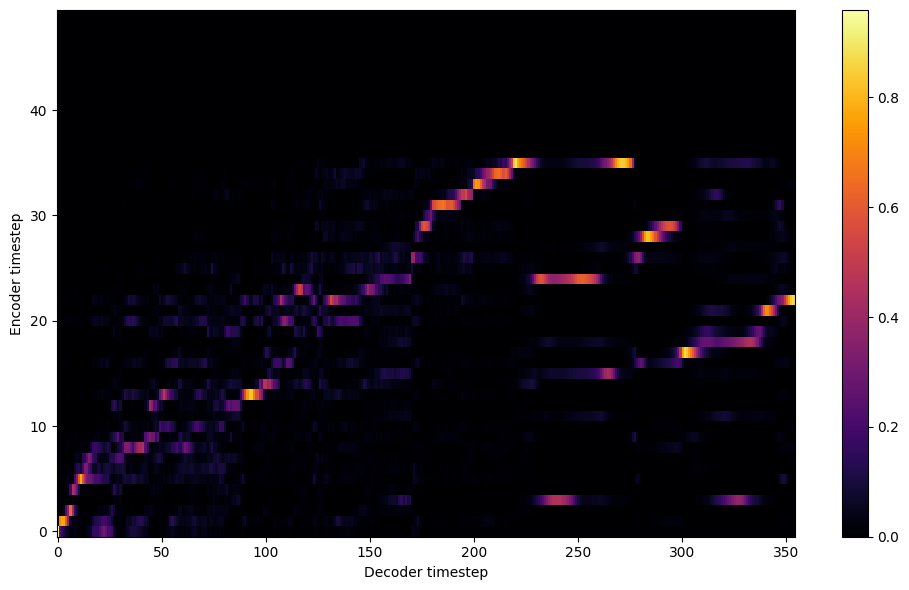


Starting Epoch: 21 Iteration: 315


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 21 Validation loss 330:  0.318400  Time: 0.3m LR: 0.000300


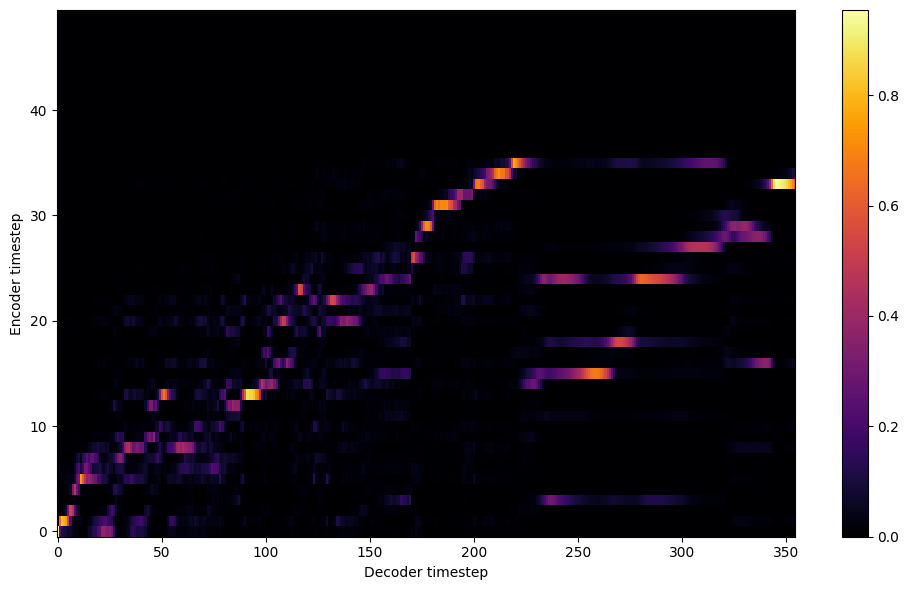


Starting Epoch: 22 Iteration: 330


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 22 Validation loss 345:  0.296991  Time: 0.3m LR: 0.000300


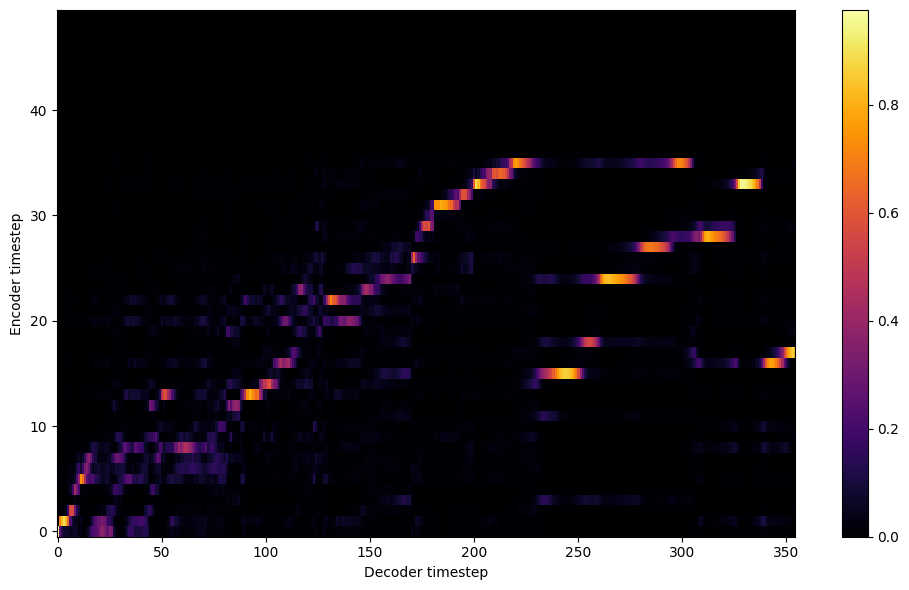


Starting Epoch: 23 Iteration: 345


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 23 Validation loss 360:  0.301005  Time: 0.3m LR: 0.000300


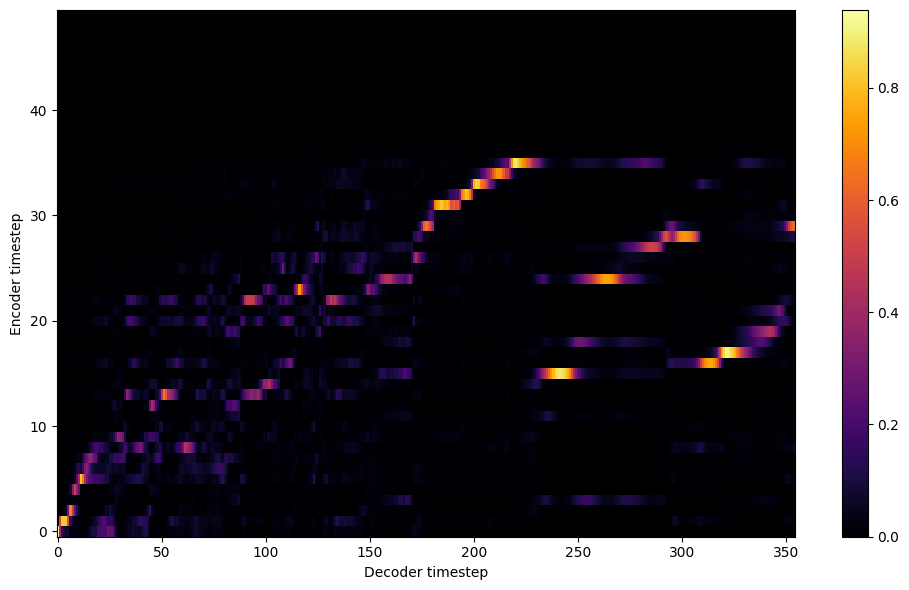


Starting Epoch: 24 Iteration: 360


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 24 Validation loss 375:  0.278563  Time: 0.3m LR: 0.000300


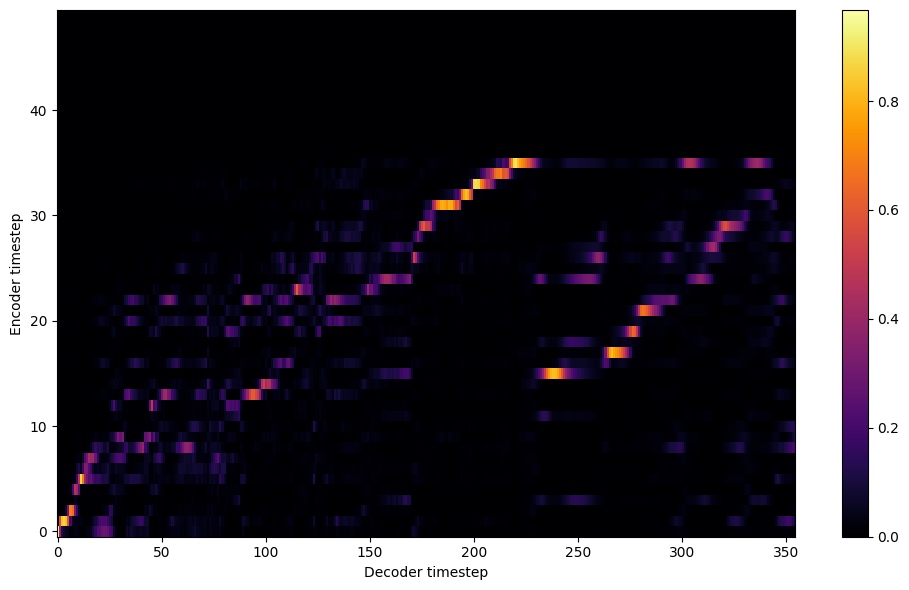


Starting Epoch: 25 Iteration: 375


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 25 Validation loss 390:  0.279629  Time: 0.3m LR: 0.000300


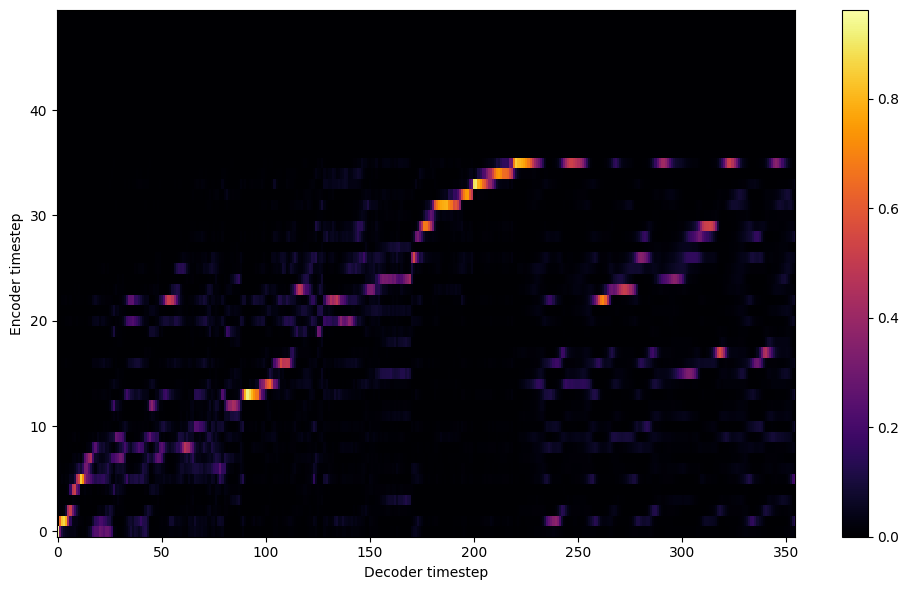


Starting Epoch: 26 Iteration: 390


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 26 Validation loss 405:  0.267275  Time: 0.3m LR: 0.000300


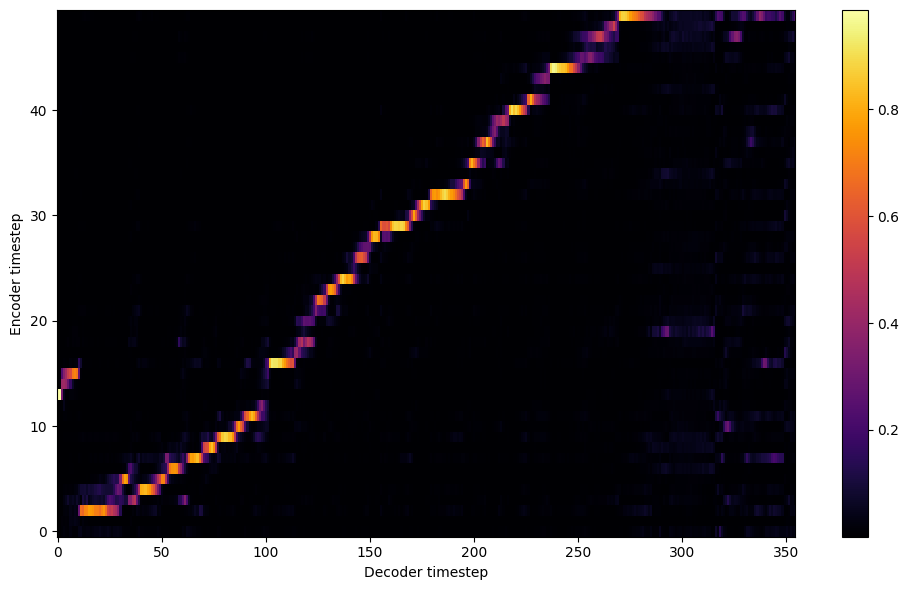


Starting Epoch: 27 Iteration: 405


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 27 Validation loss 420:  0.257809  Time: 0.3m LR: 0.000300


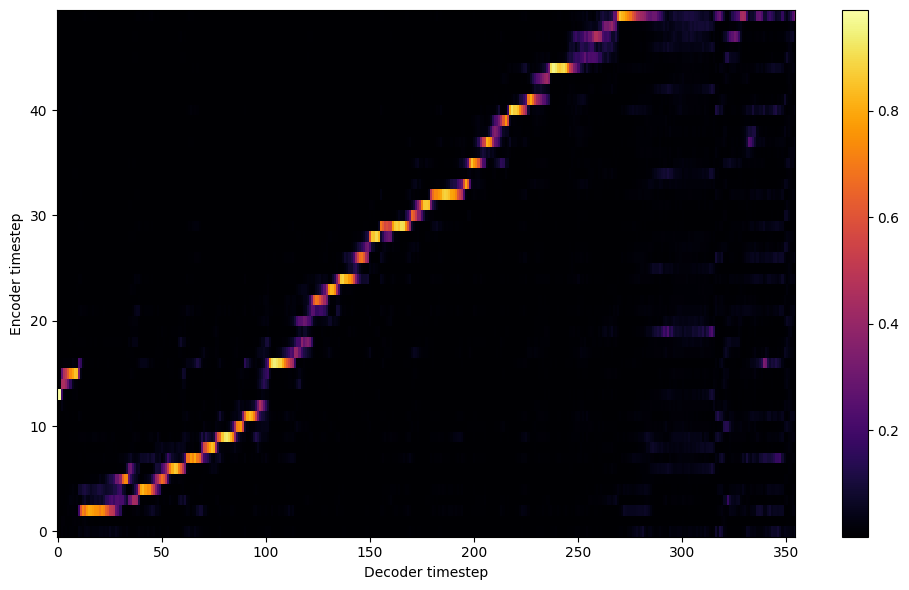


Starting Epoch: 28 Iteration: 420


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 28 Validation loss 435:  0.269060  Time: 0.3m LR: 0.000300


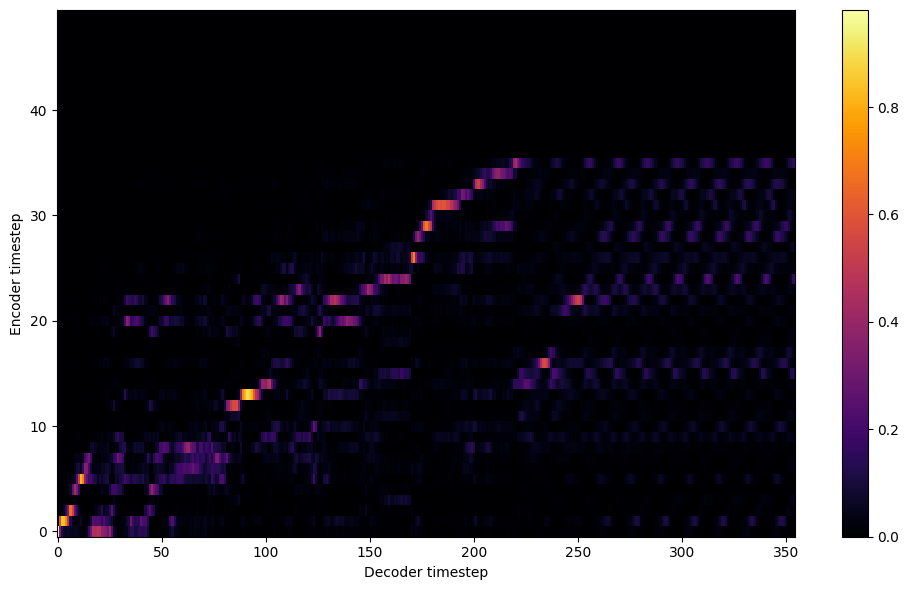


Starting Epoch: 29 Iteration: 435


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 29 Validation loss 450:  0.256784  Time: 0.3m LR: 0.000300


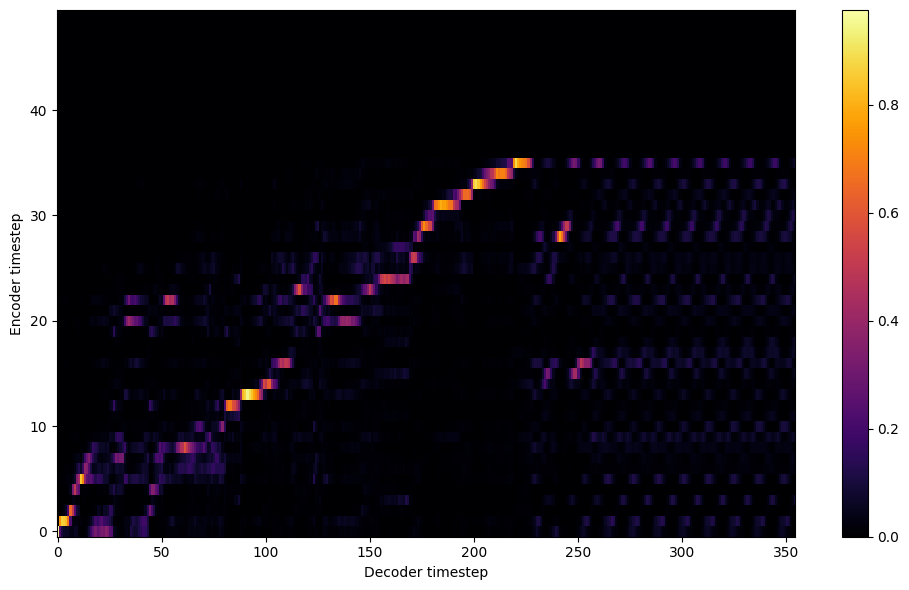

Saving model and optimizer state at iteration 450 to /content/model//female_child
Model Saved

Starting Epoch: 30 Iteration: 450


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 30 Validation loss 465:  0.253742  Time: 0.3m LR: 0.000300


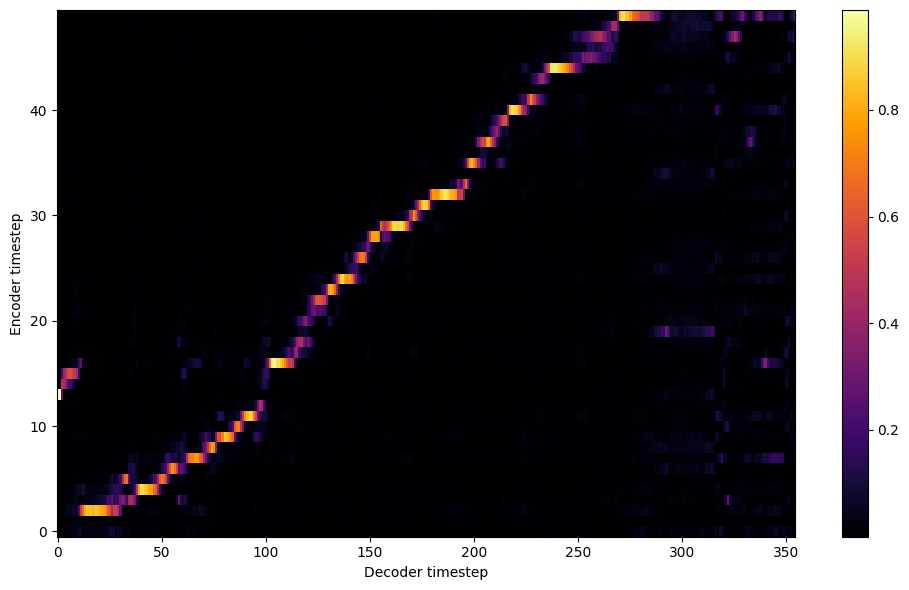


Starting Epoch: 31 Iteration: 465


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 31 Validation loss 480:  0.253938  Time: 0.3m LR: 0.000300


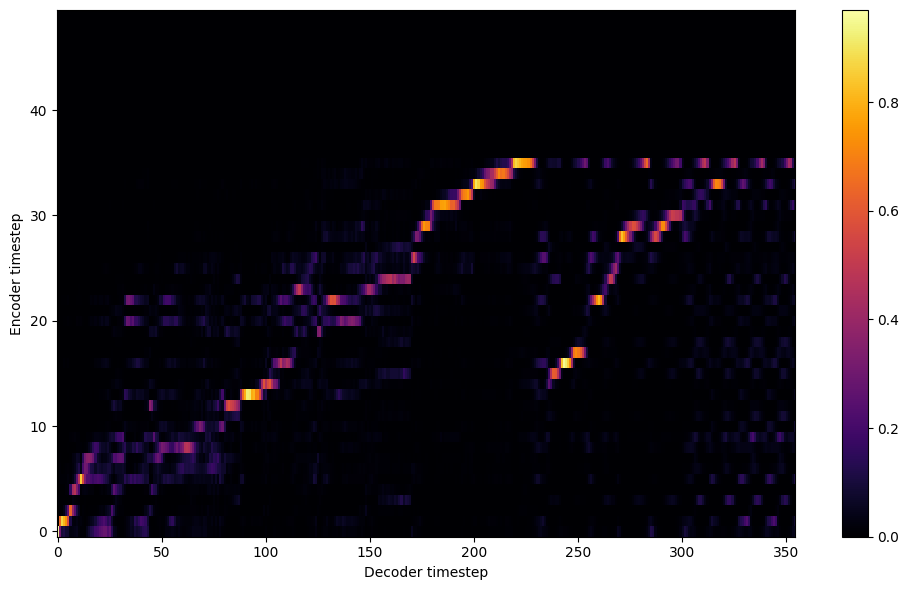


Starting Epoch: 32 Iteration: 480


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 32 Validation loss 495:  0.242687  Time: 0.3m LR: 0.000300


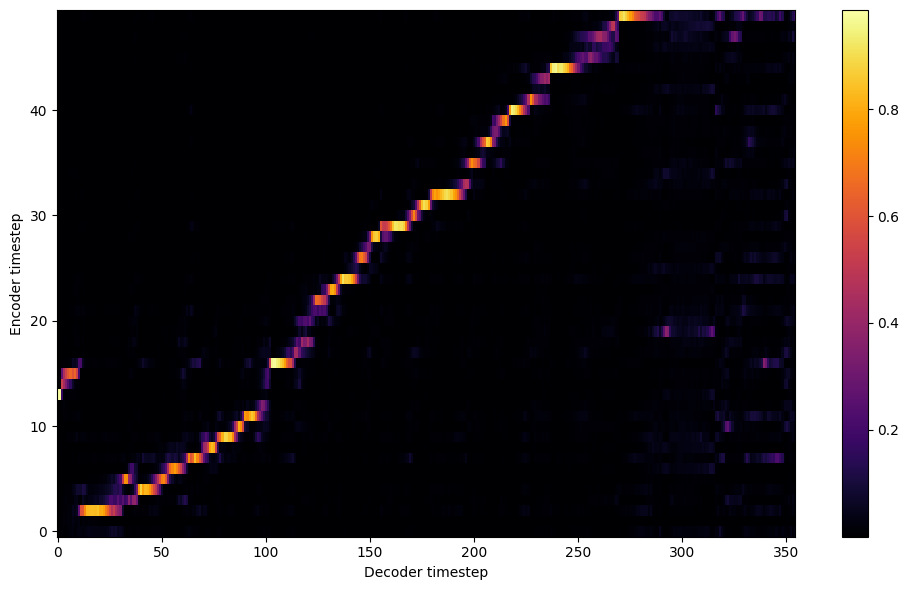


Starting Epoch: 33 Iteration: 495


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 33 Validation loss 510:  0.237446  Time: 0.3m LR: 0.000300


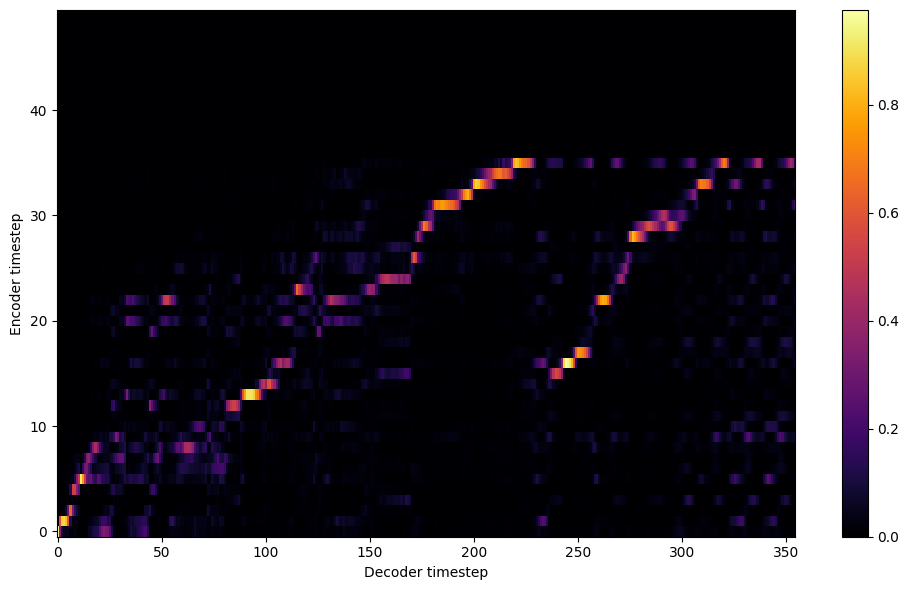


Starting Epoch: 34 Iteration: 510


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 34 Validation loss 525:  0.239768  Time: 0.3m LR: 0.000300


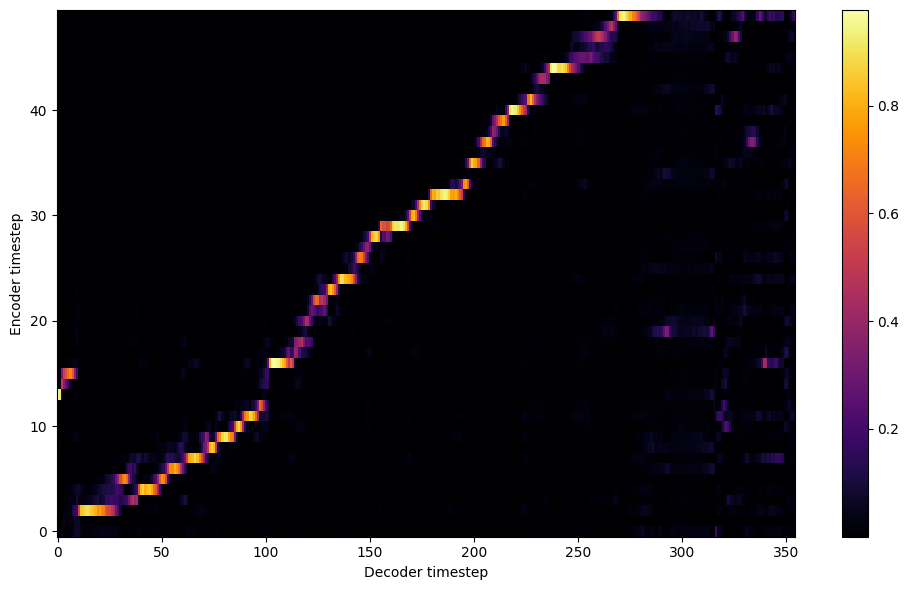


Starting Epoch: 35 Iteration: 525


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 35 Validation loss 540:  0.232992  Time: 0.3m LR: 0.000300


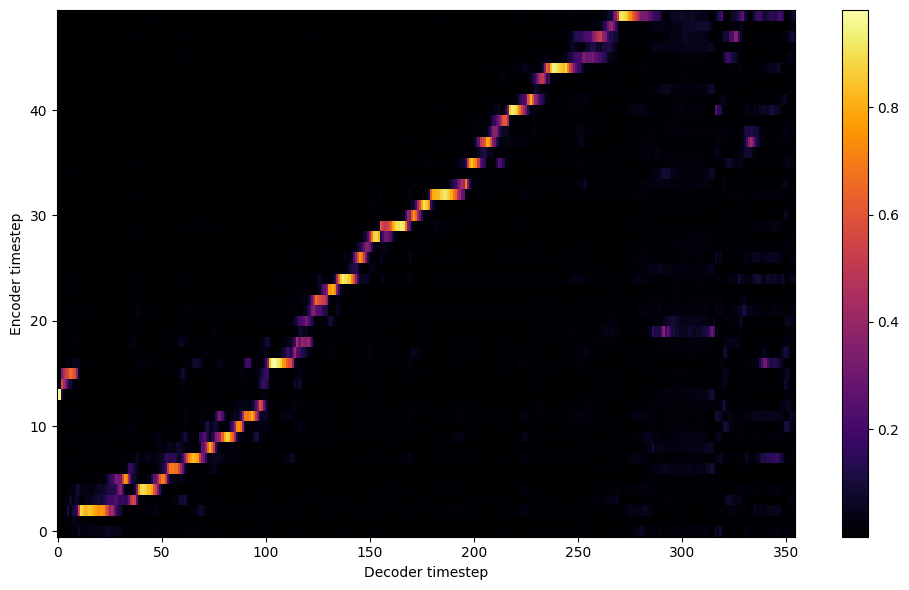


Starting Epoch: 36 Iteration: 540


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 36 Validation loss 555:  0.225545  Time: 0.4m LR: 0.000300


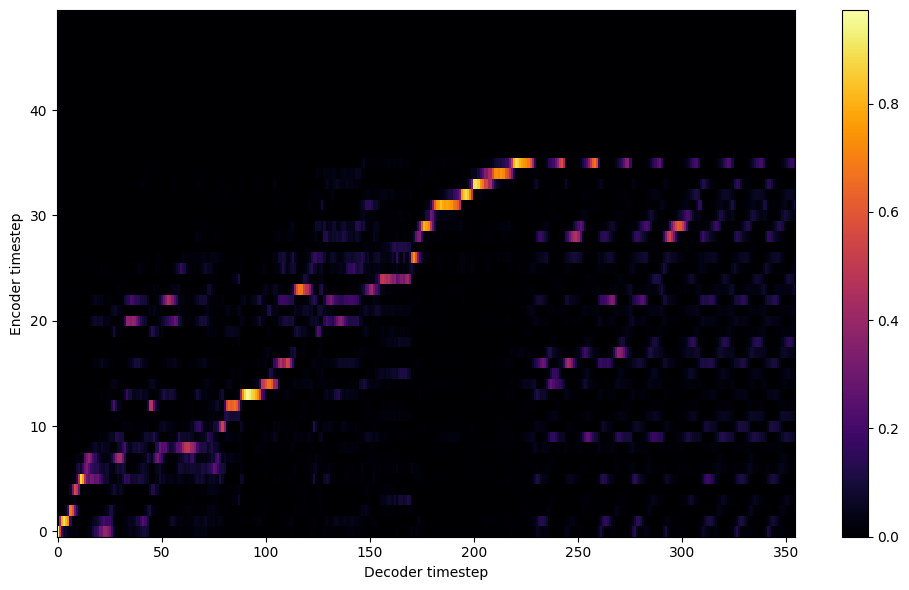


Starting Epoch: 37 Iteration: 555


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 37 Validation loss 570:  0.220979  Time: 0.3m LR: 0.000300


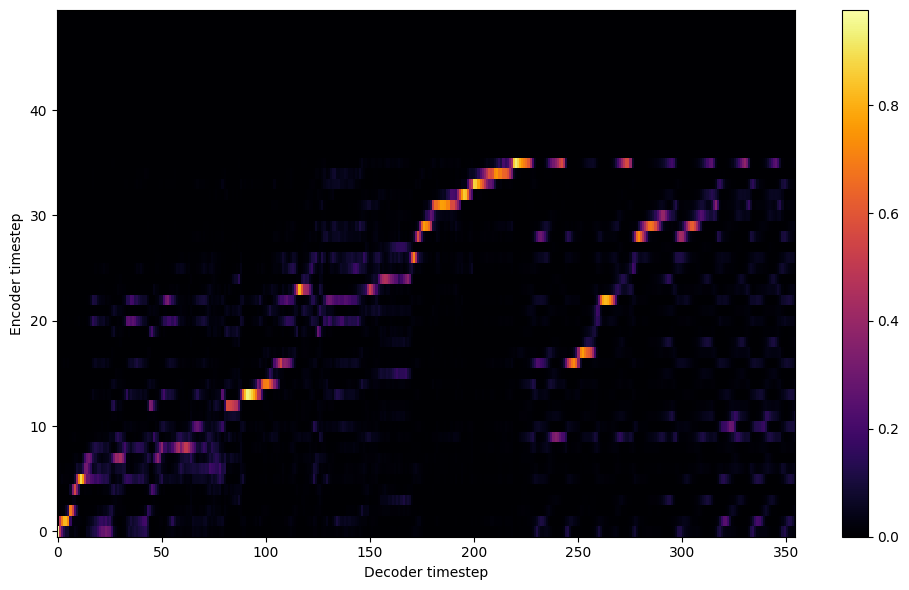


Starting Epoch: 38 Iteration: 570


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 38 Validation loss 585:  0.219232  Time: 0.3m LR: 0.000300


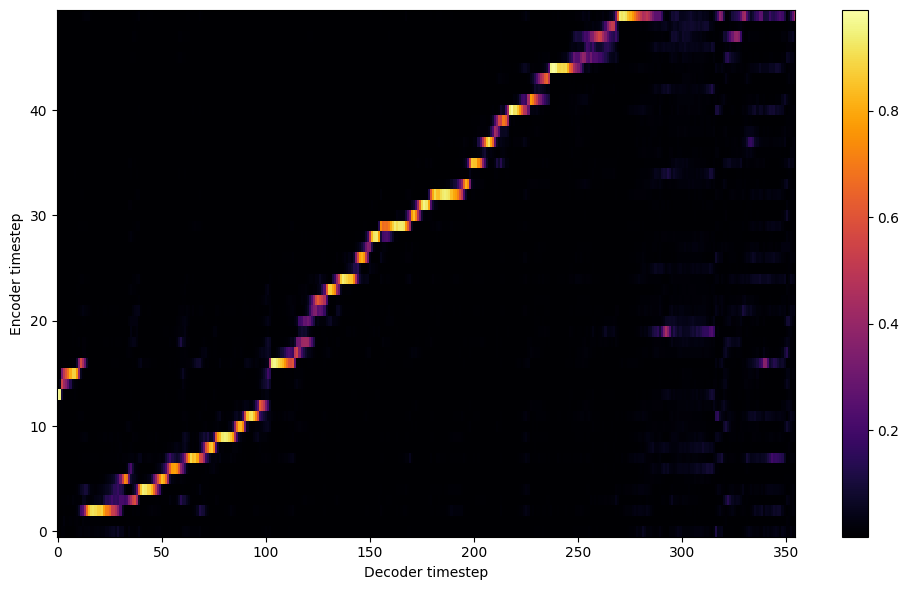


Starting Epoch: 39 Iteration: 585


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 39 Validation loss 600:  0.218402  Time: 0.3m LR: 0.000300


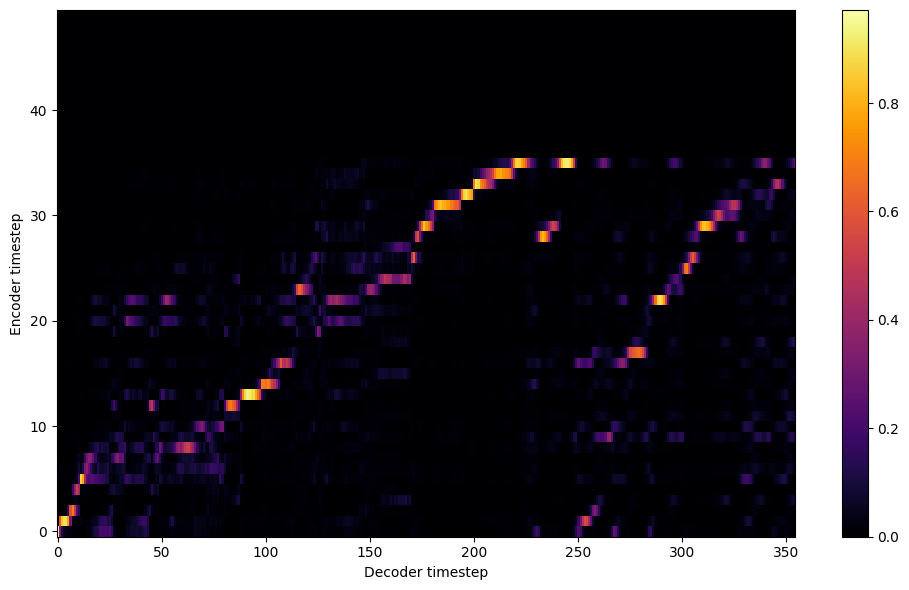

Saving model and optimizer state at iteration 600 to /content/model//female_child
Model Saved

Starting Epoch: 40 Iteration: 600


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 40 Validation loss 615:  0.213713  Time: 0.3m LR: 0.000300


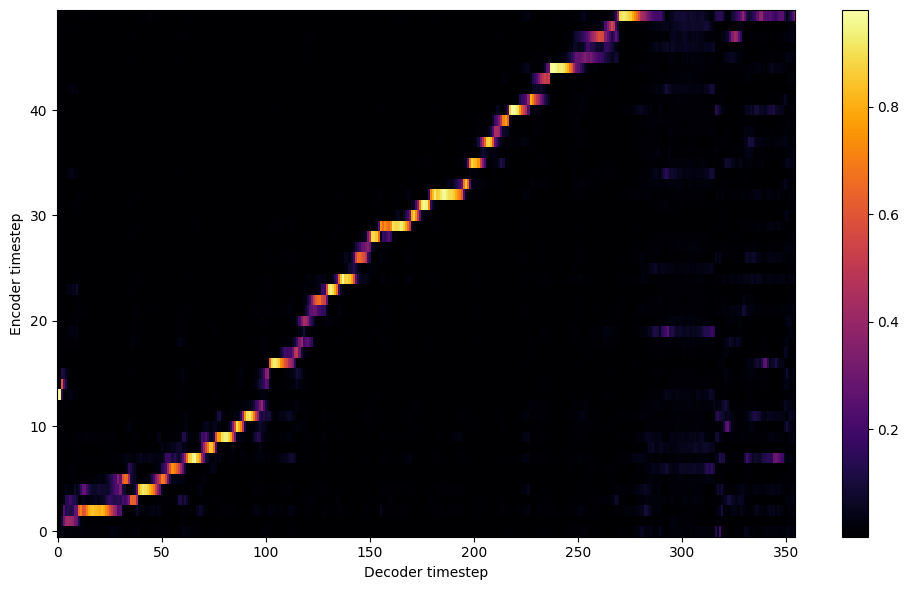


Starting Epoch: 41 Iteration: 615


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 41 Validation loss 630:  0.209353  Time: 0.3m LR: 0.000300


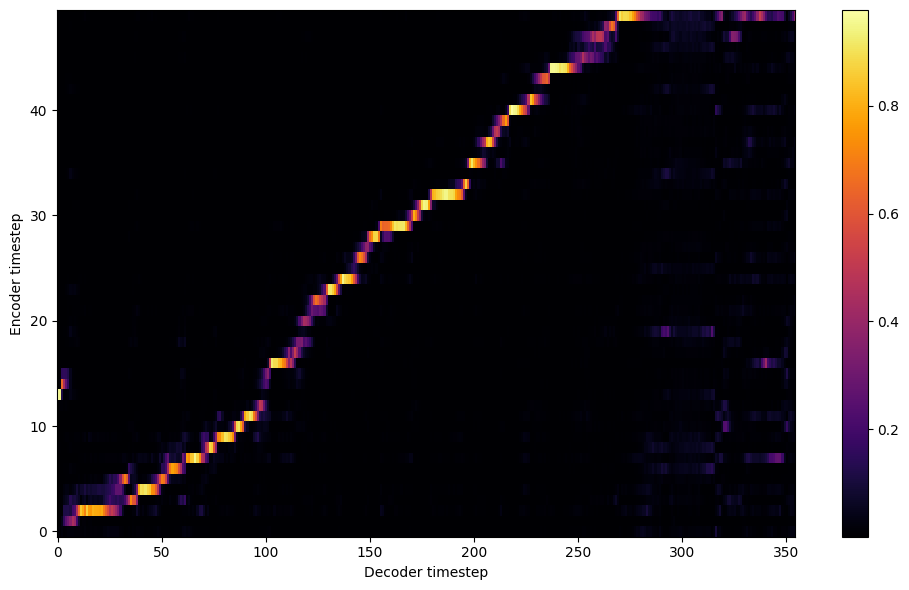


Starting Epoch: 42 Iteration: 630


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 42 Validation loss 645:  0.206670  Time: 0.3m LR: 0.000300


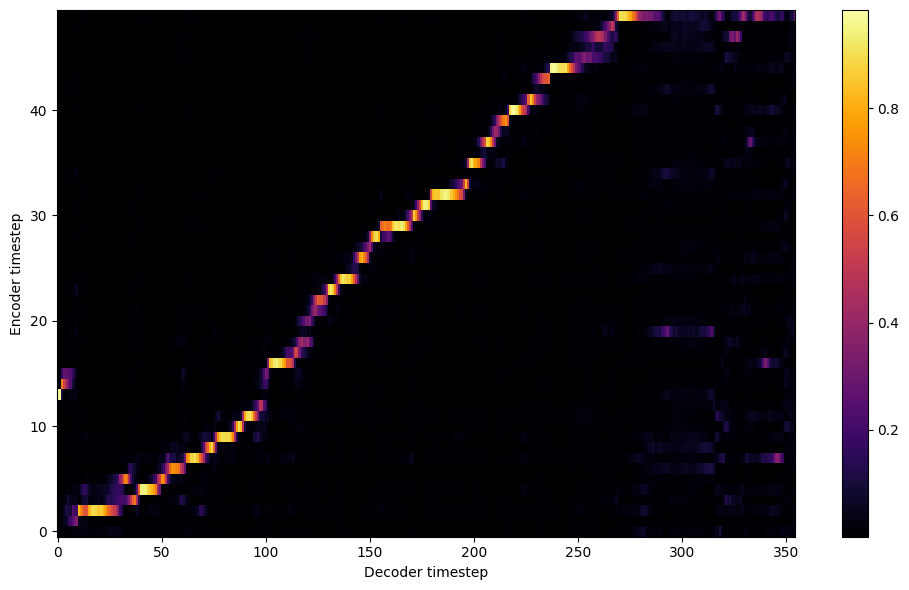


Starting Epoch: 43 Iteration: 645


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 43 Validation loss 660:  0.201377  Time: 0.4m LR: 0.000300


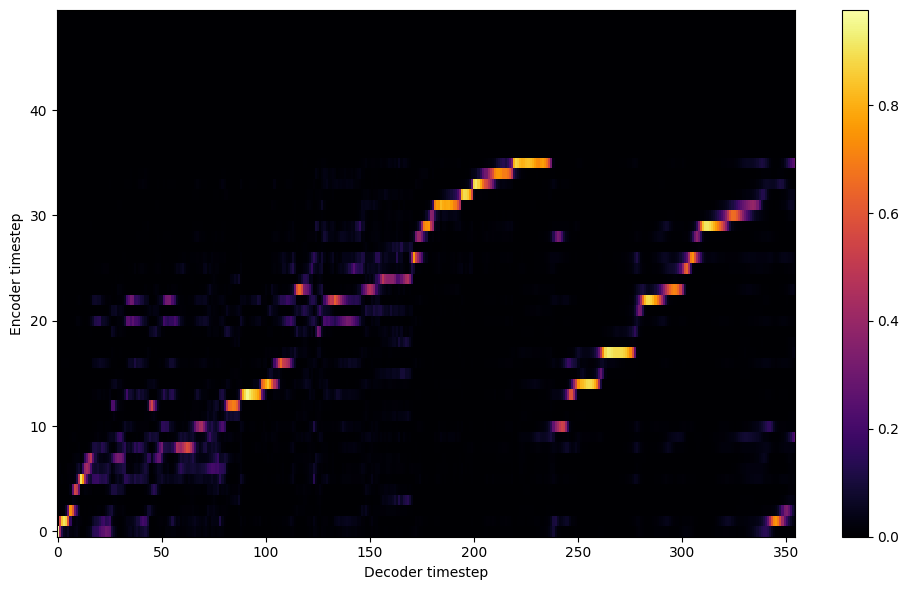


Starting Epoch: 44 Iteration: 660


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 44 Validation loss 675:  0.208909  Time: 0.3m LR: 0.000300


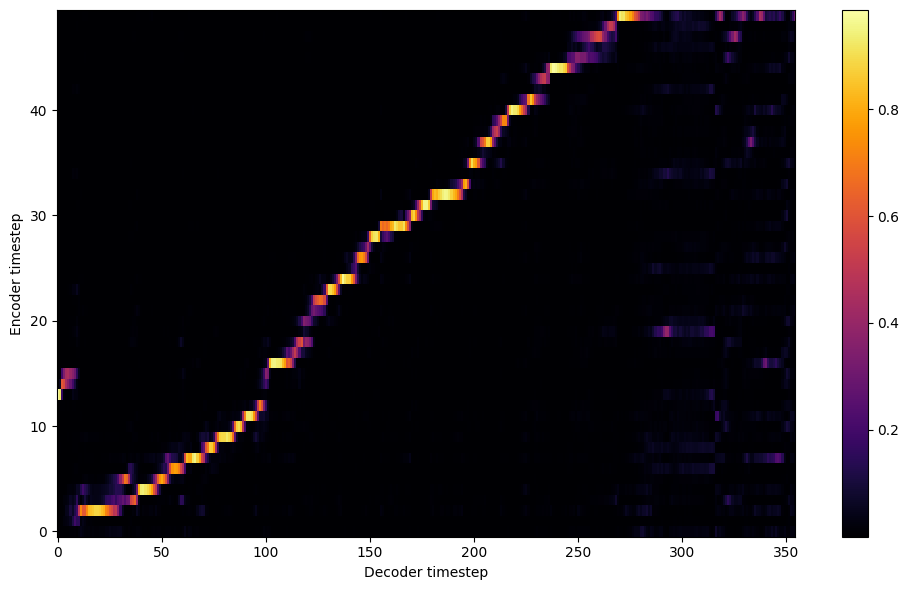


Starting Epoch: 45 Iteration: 675


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 45 Validation loss 690:  0.192935  Time: 0.3m LR: 0.000300


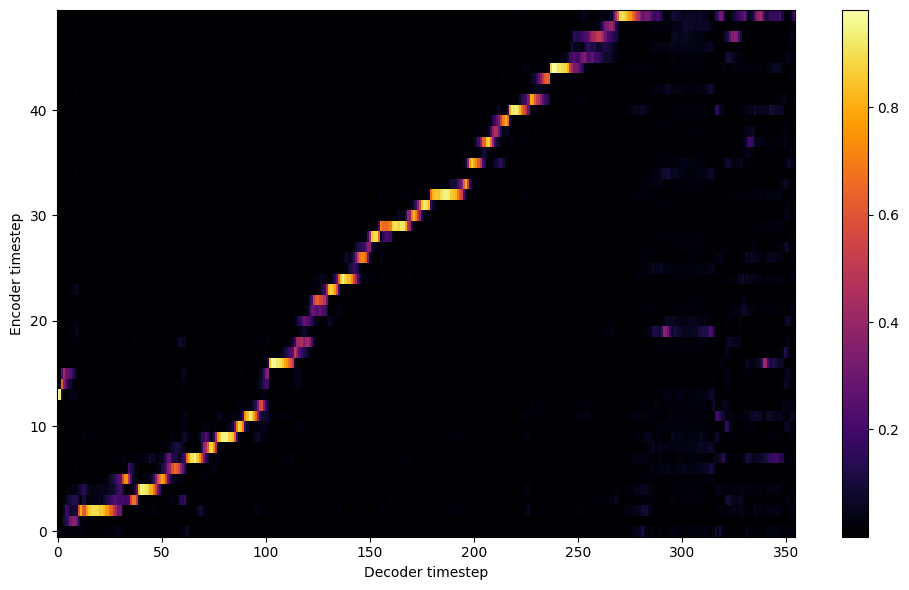


Starting Epoch: 46 Iteration: 690


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 46 Validation loss 705:  0.188357  Time: 0.3m LR: 0.000300


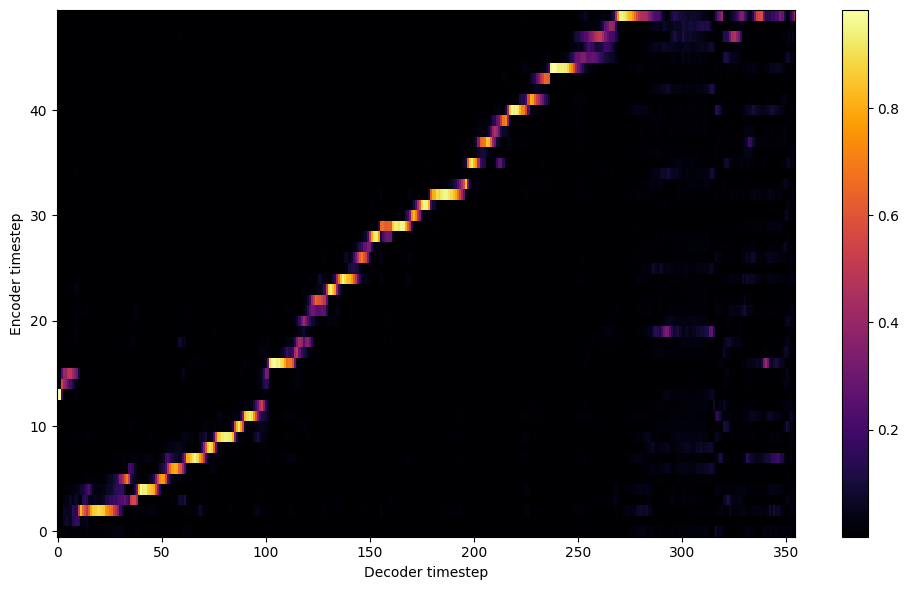


Starting Epoch: 47 Iteration: 705


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 47 Validation loss 720:  0.188464  Time: 0.3m LR: 0.000300


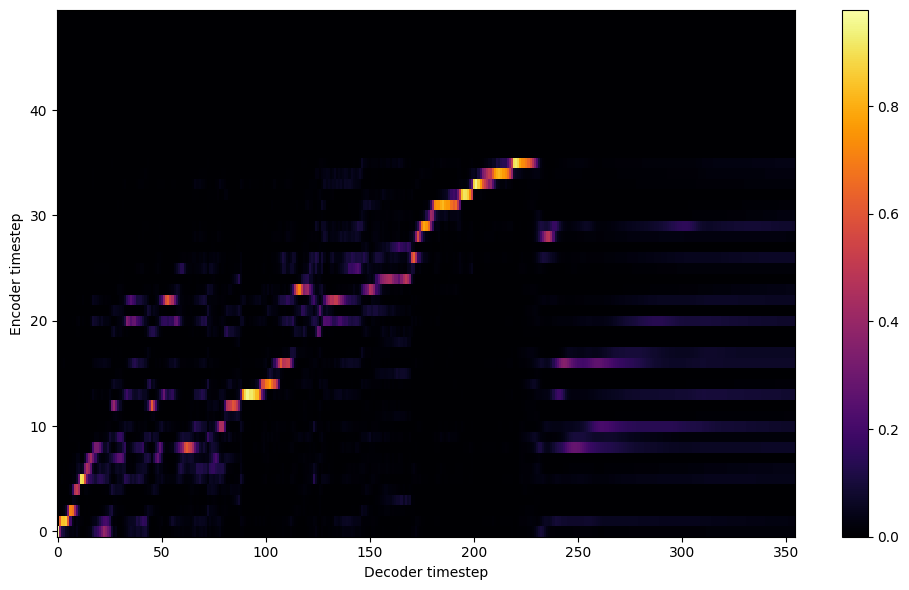


Starting Epoch: 48 Iteration: 720


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 48 Validation loss 735:  0.189282  Time: 0.3m LR: 0.000300


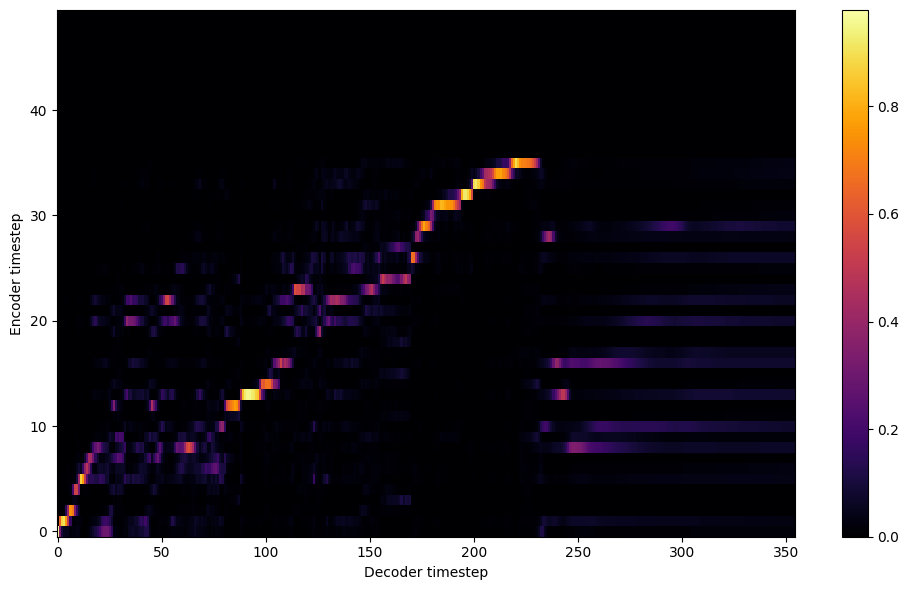


Starting Epoch: 49 Iteration: 735


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 49 Validation loss 750:  0.185418  Time: 0.3m LR: 0.000300


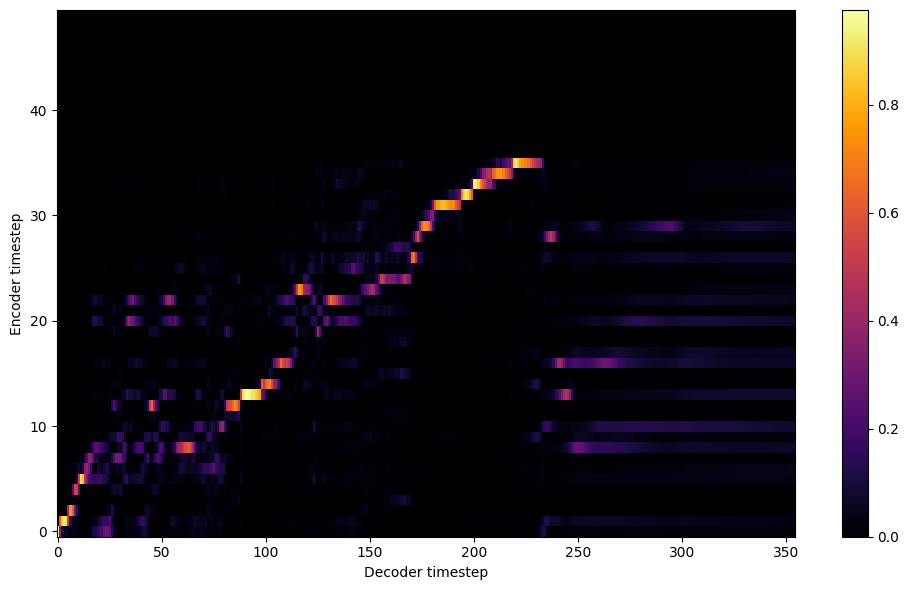

Saving model and optimizer state at iteration 750 to /content/model//female_child
Model Saved

Starting Epoch: 50 Iteration: 750


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 50 Validation loss 765:  0.182947  Time: 0.3m LR: 0.000300


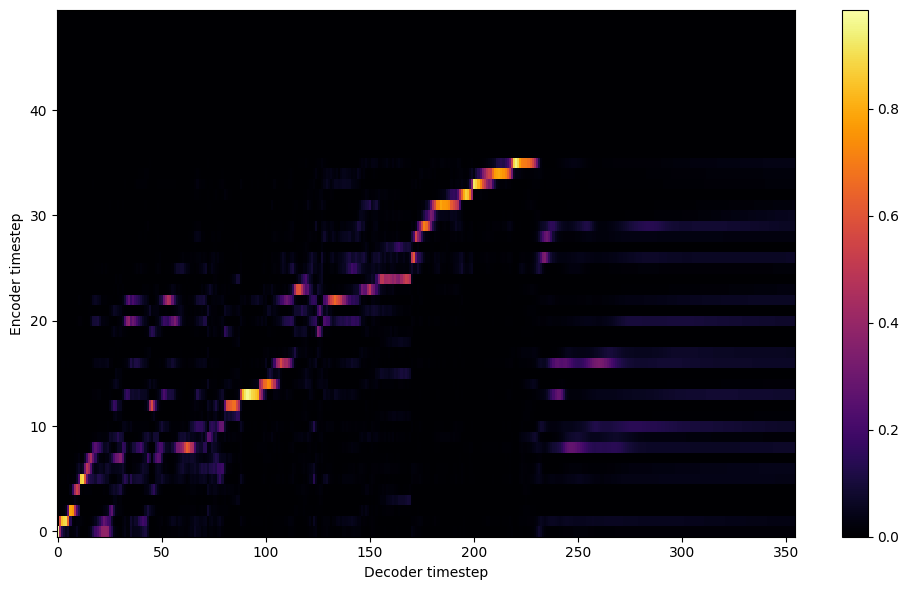


Starting Epoch: 51 Iteration: 765


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 51 Validation loss 780:  0.178405  Time: 0.3m LR: 0.000300


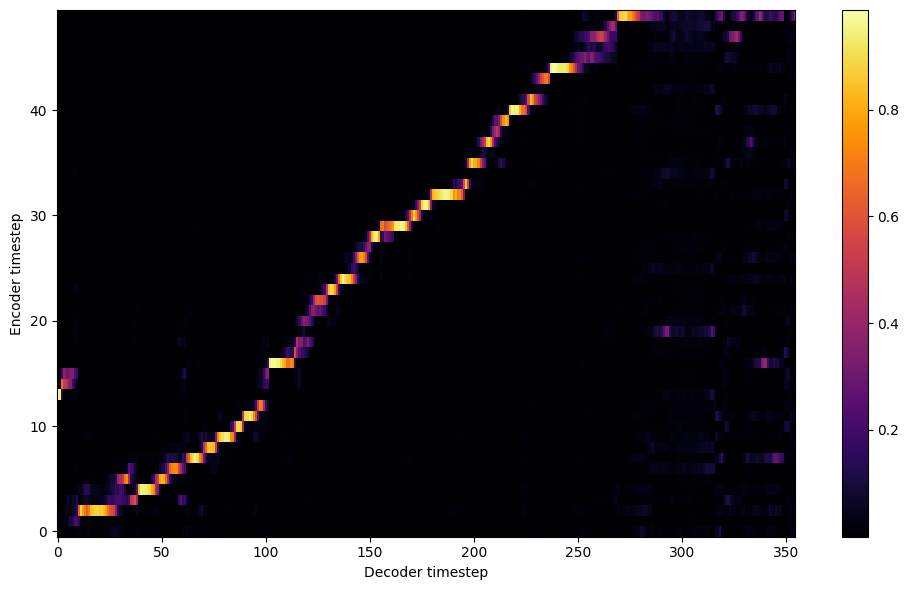


Starting Epoch: 52 Iteration: 780


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 52 Validation loss 795:  0.178015  Time: 0.3m LR: 0.000300


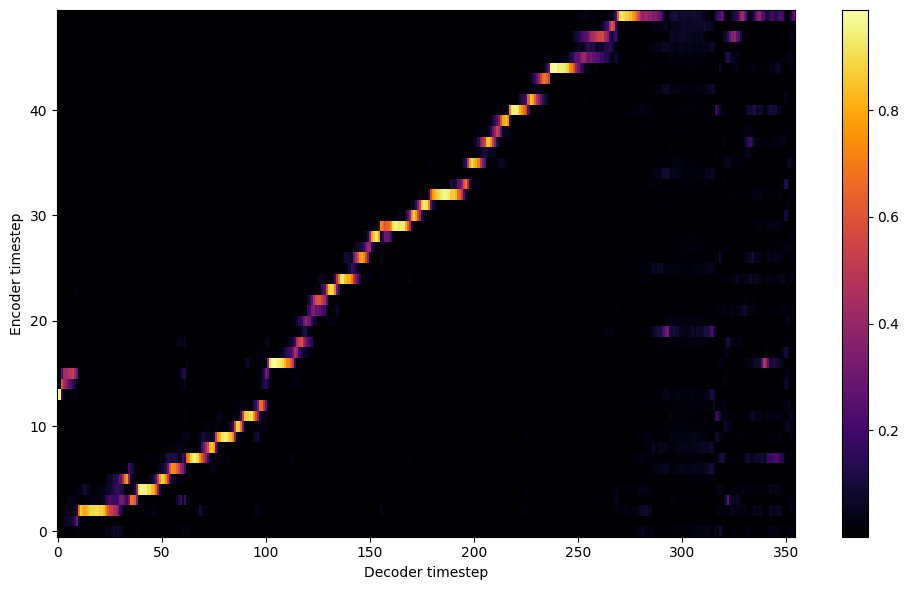


Starting Epoch: 53 Iteration: 795


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 53 Validation loss 810:  0.180983  Time: 0.3m LR: 0.000300


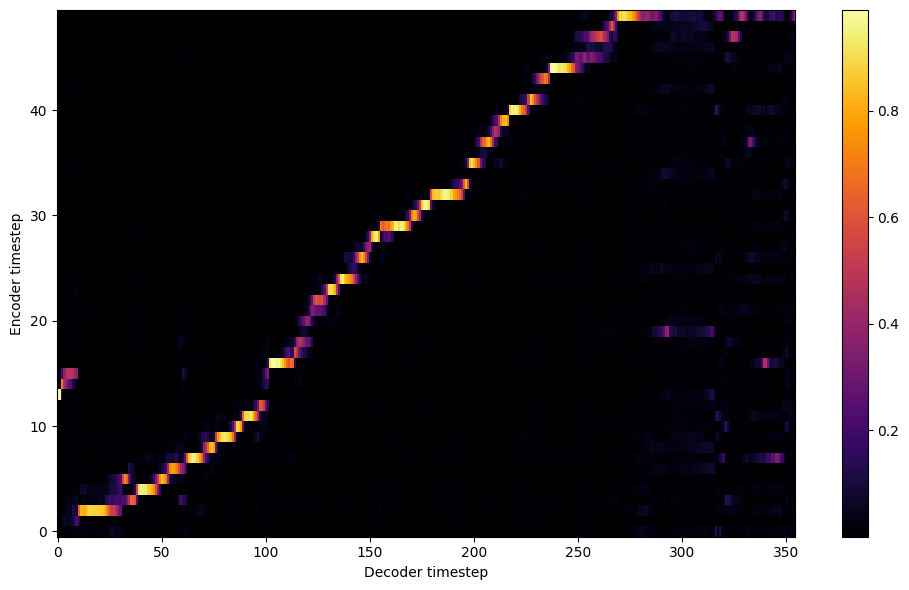


Starting Epoch: 54 Iteration: 810


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 54 Validation loss 825:  0.175310  Time: 0.3m LR: 0.000300


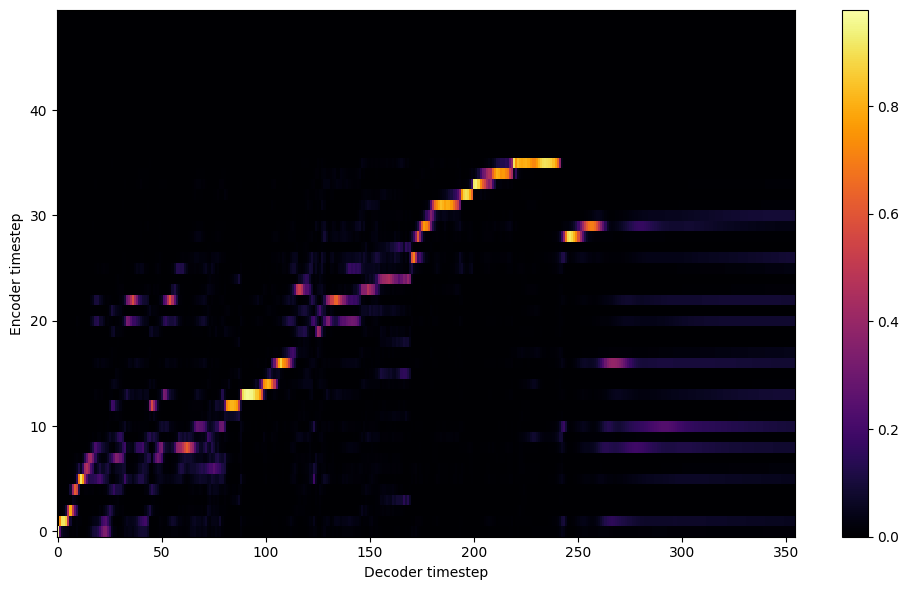


Starting Epoch: 55 Iteration: 825


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 55 Validation loss 840:  0.171631  Time: 0.3m LR: 0.000300


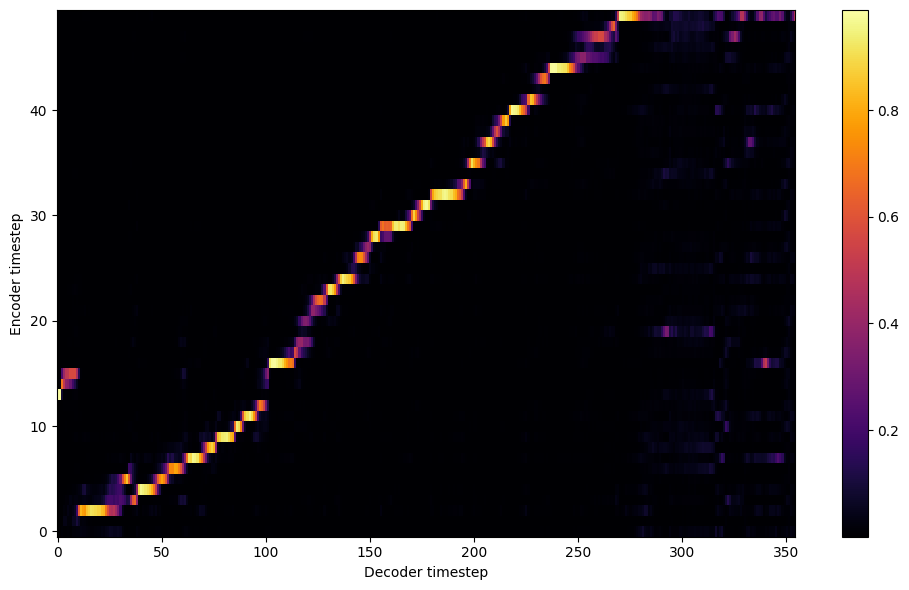


Starting Epoch: 56 Iteration: 840


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 56 Validation loss 855:  0.166932  Time: 0.3m LR: 0.000300


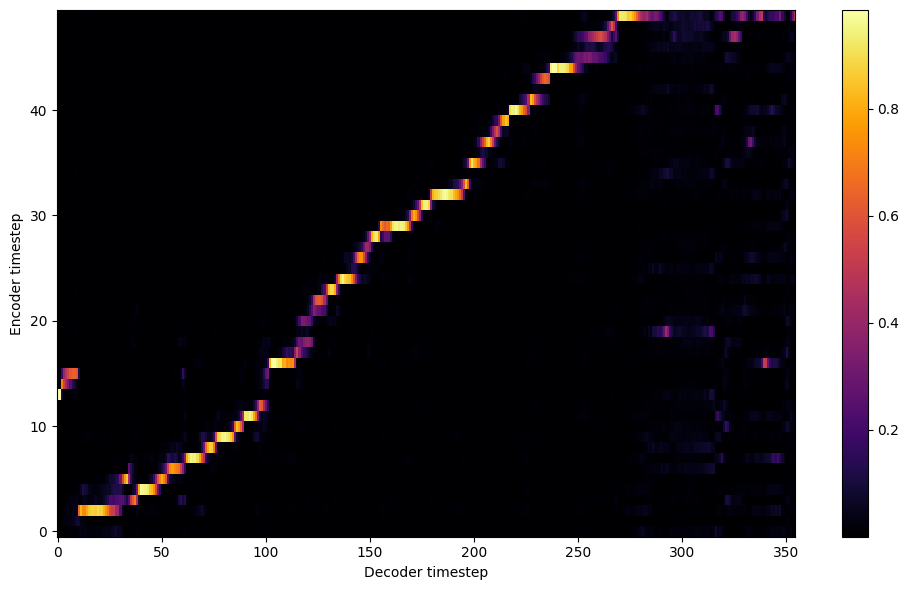


Starting Epoch: 57 Iteration: 855


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 57 Validation loss 870:  0.166459  Time: 0.3m LR: 0.000300


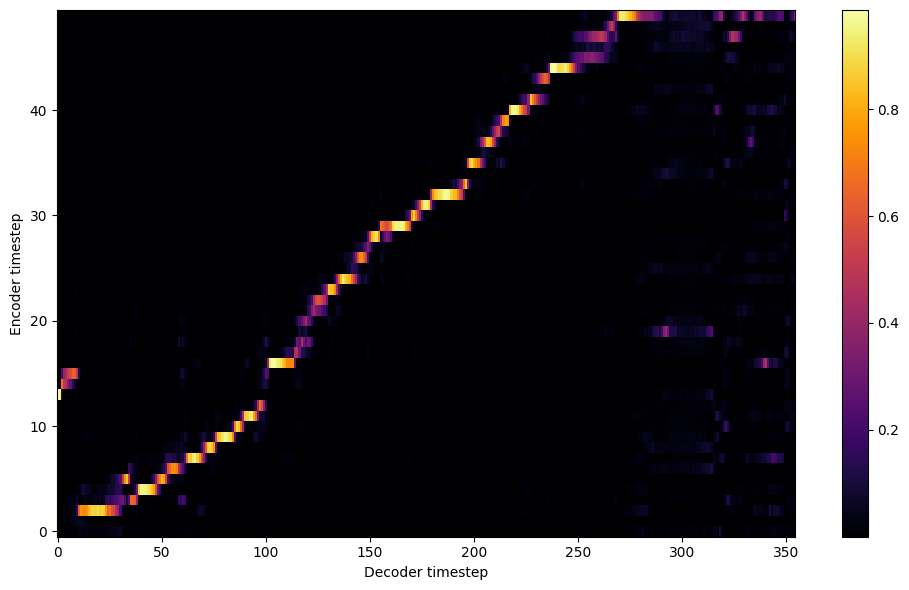


Starting Epoch: 58 Iteration: 870


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 58 Validation loss 885:  0.163604  Time: 0.3m LR: 0.000300


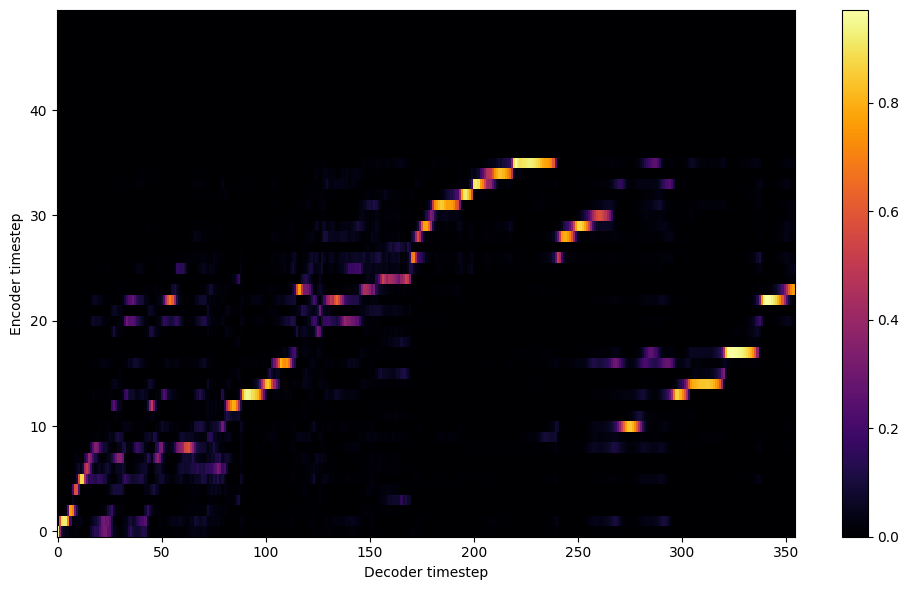


Starting Epoch: 59 Iteration: 885


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 59 Validation loss 900:  0.165002  Time: 0.3m LR: 0.000300


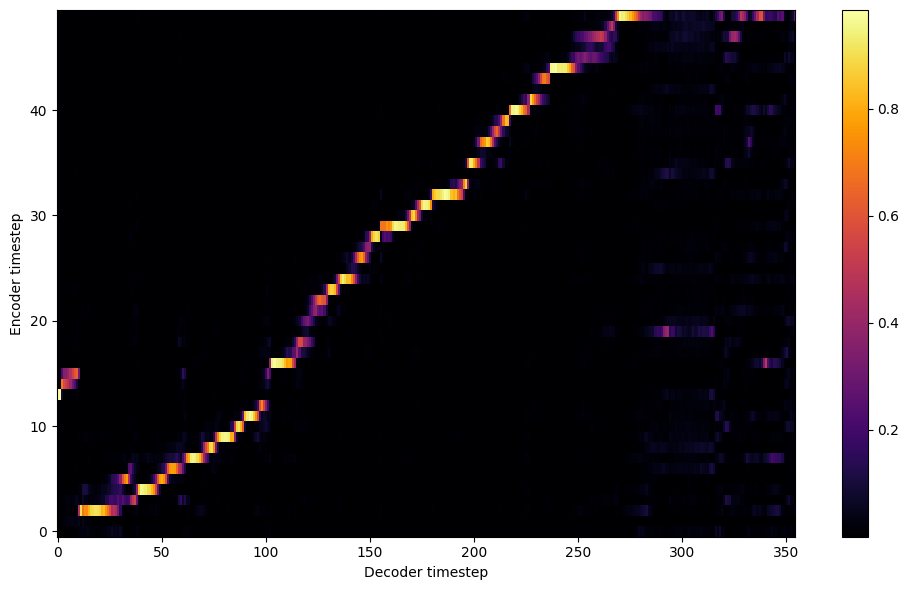

Saving model and optimizer state at iteration 900 to /content/model//female_child
Model Saved

Starting Epoch: 60 Iteration: 900


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 60 Validation loss 915:  0.165123  Time: 0.3m LR: 0.000300


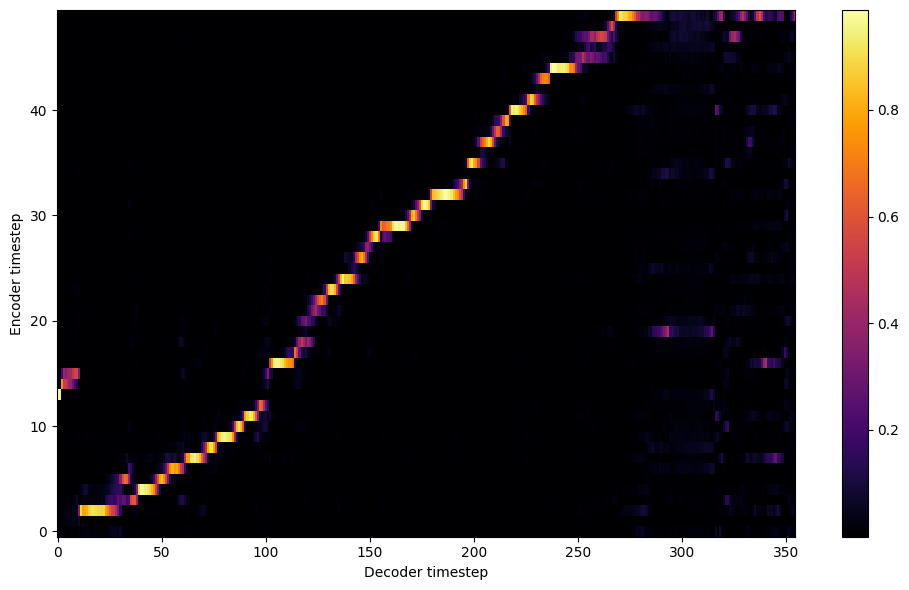


Starting Epoch: 61 Iteration: 915


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 61 Validation loss 930:  0.159467  Time: 0.4m LR: 0.000300


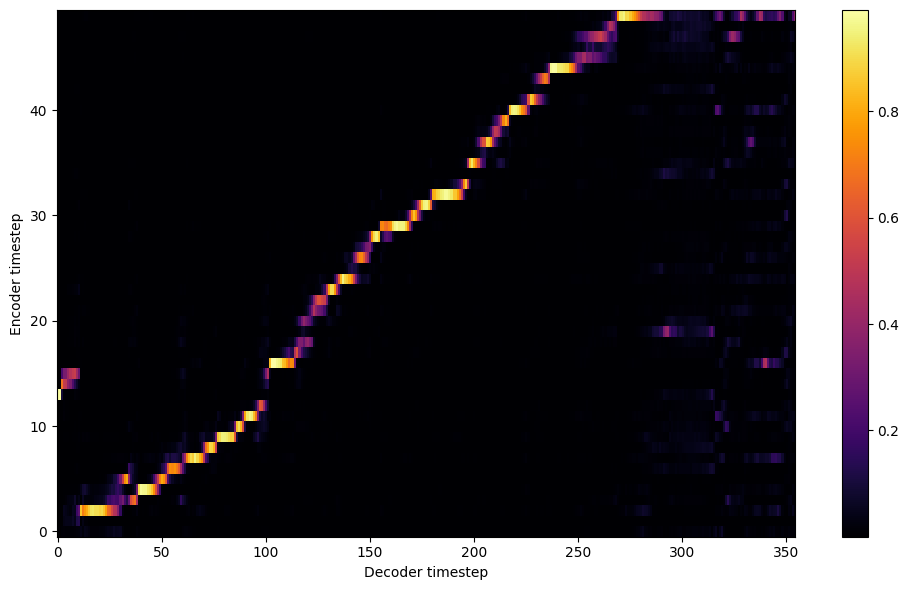


Starting Epoch: 62 Iteration: 930


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 62 Validation loss 945:  0.157397  Time: 0.3m LR: 0.000300


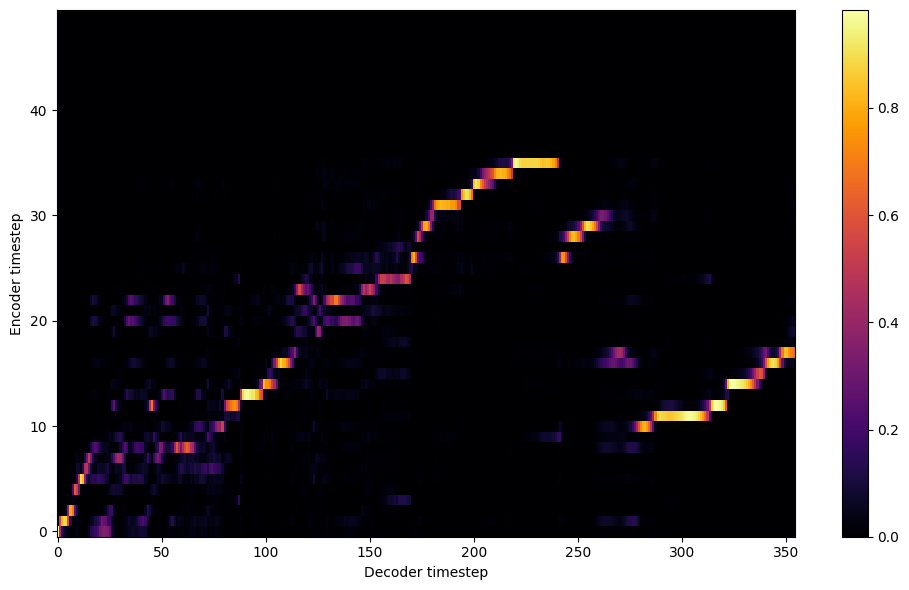


Starting Epoch: 63 Iteration: 945


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 63 Validation loss 960:  0.157360  Time: 0.3m LR: 0.000300


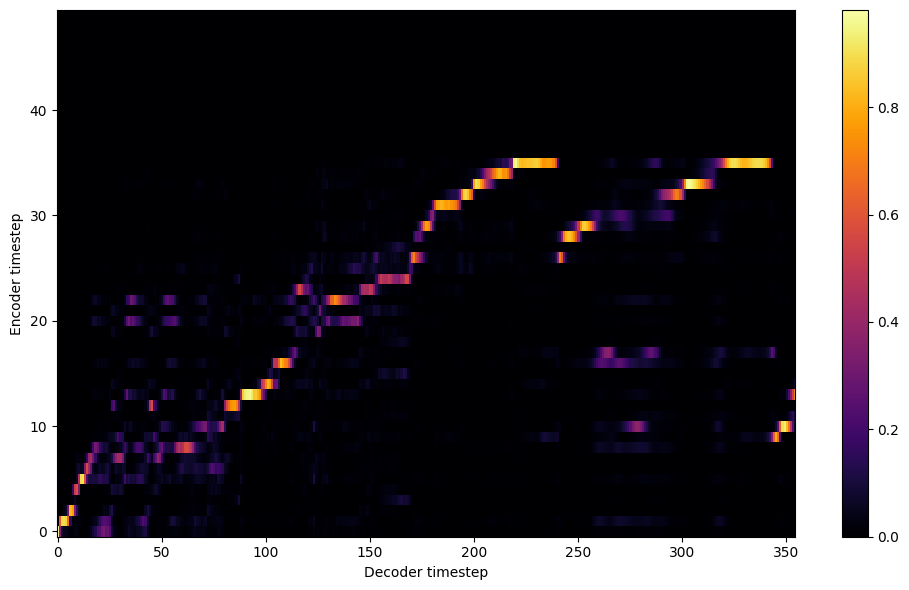


Starting Epoch: 64 Iteration: 960


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 64 Validation loss 975:  0.152223  Time: 0.3m LR: 0.000300


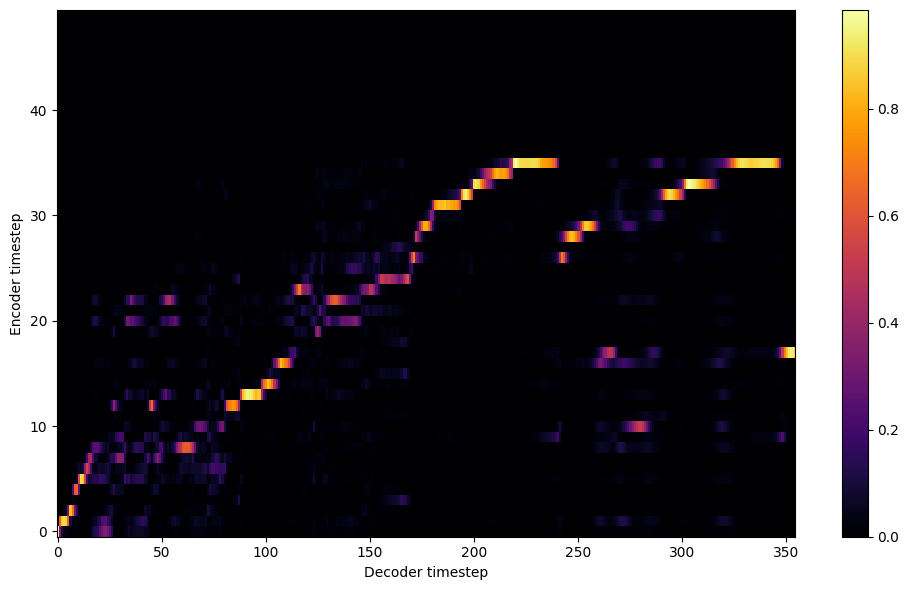


Starting Epoch: 65 Iteration: 975


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 65 Validation loss 990:  0.153667  Time: 0.3m LR: 0.000300


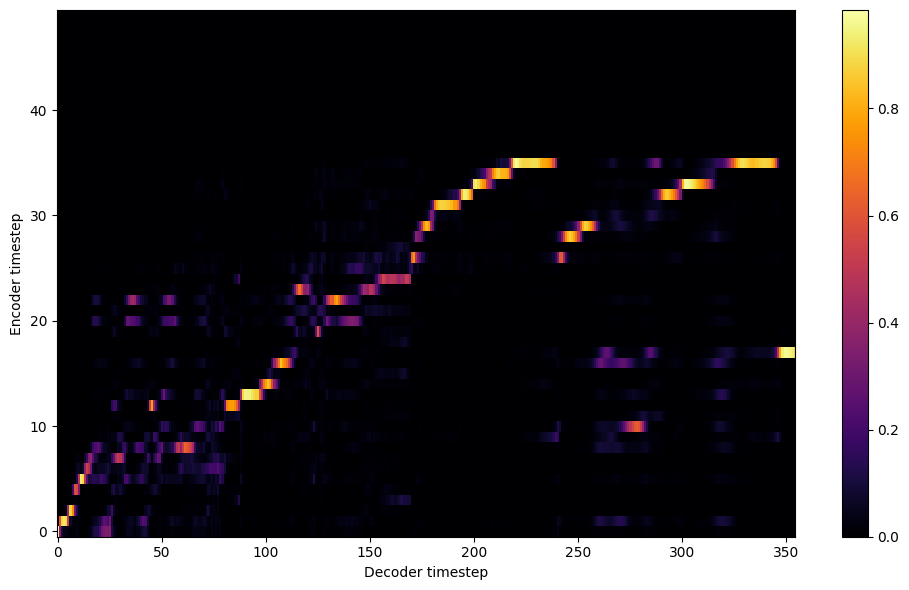


Starting Epoch: 66 Iteration: 990


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 66 Validation loss 1005:  0.154430  Time: 0.3m LR: 0.000300


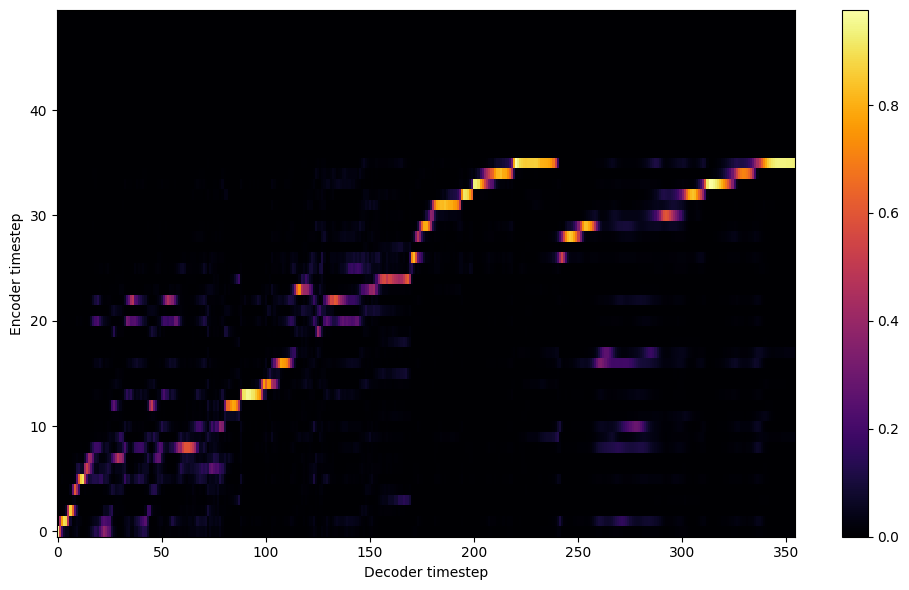


Starting Epoch: 67 Iteration: 1005


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 67 Validation loss 1020:  0.145563  Time: 0.3m LR: 0.000300


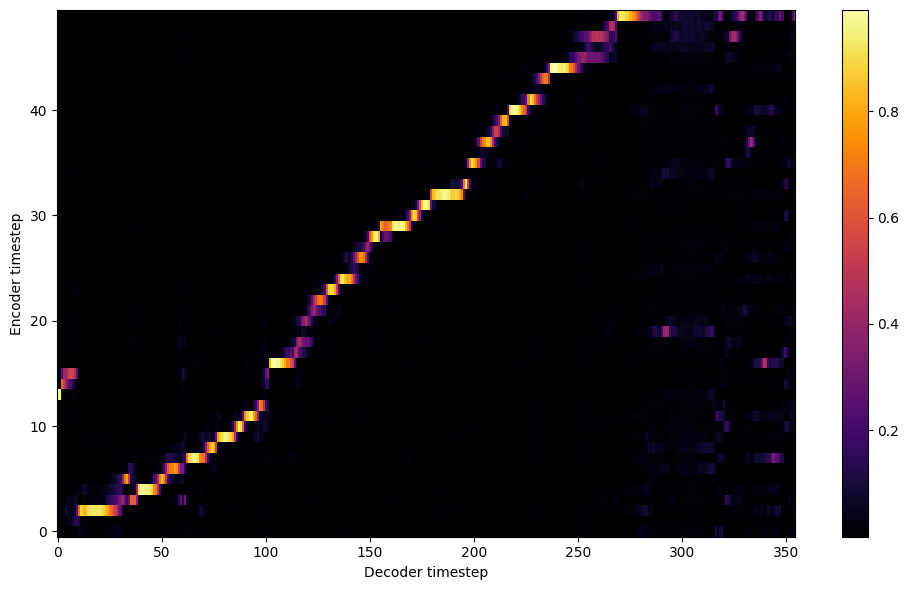


Starting Epoch: 68 Iteration: 1020


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 68 Validation loss 1035:  0.146662  Time: 0.3m LR: 0.000300


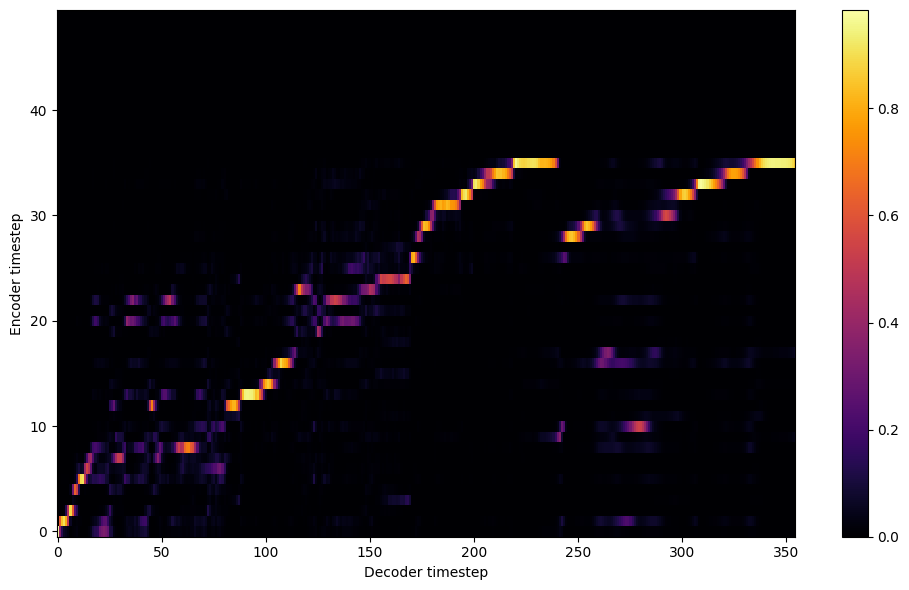


Starting Epoch: 69 Iteration: 1035


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 69 Validation loss 1050:  0.144719  Time: 0.3m LR: 0.000300


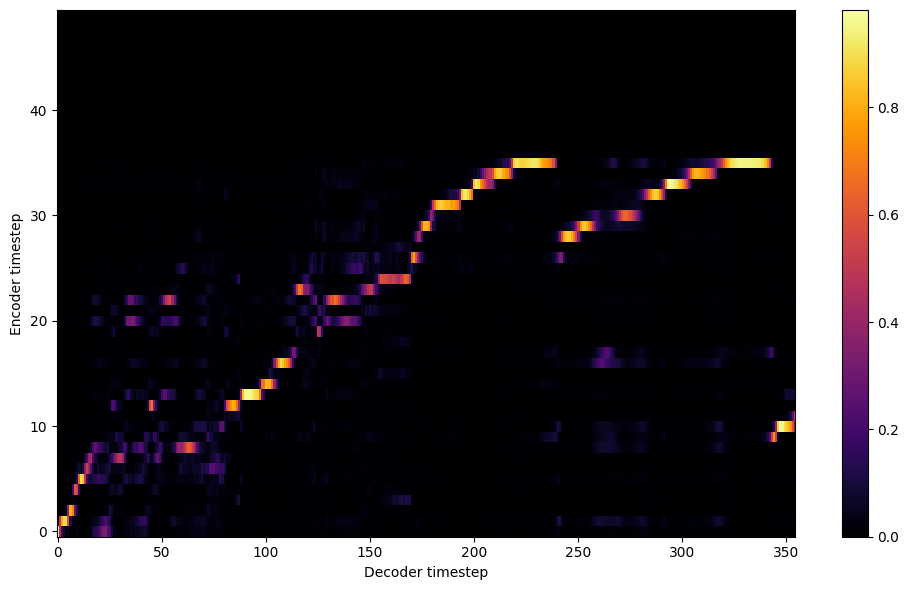

Saving model and optimizer state at iteration 1050 to /content/model//female_child
Model Saved

Starting Epoch: 70 Iteration: 1050


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 70 Validation loss 1065:  0.148121  Time: 0.3m LR: 0.000300


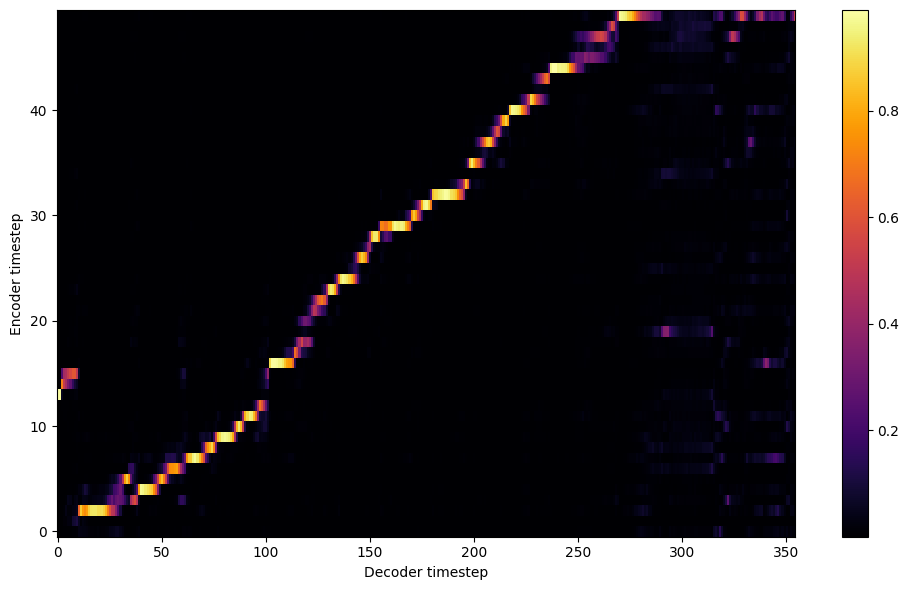


Starting Epoch: 71 Iteration: 1065


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 71 Validation loss 1080:  0.147716  Time: 0.4m LR: 0.000300


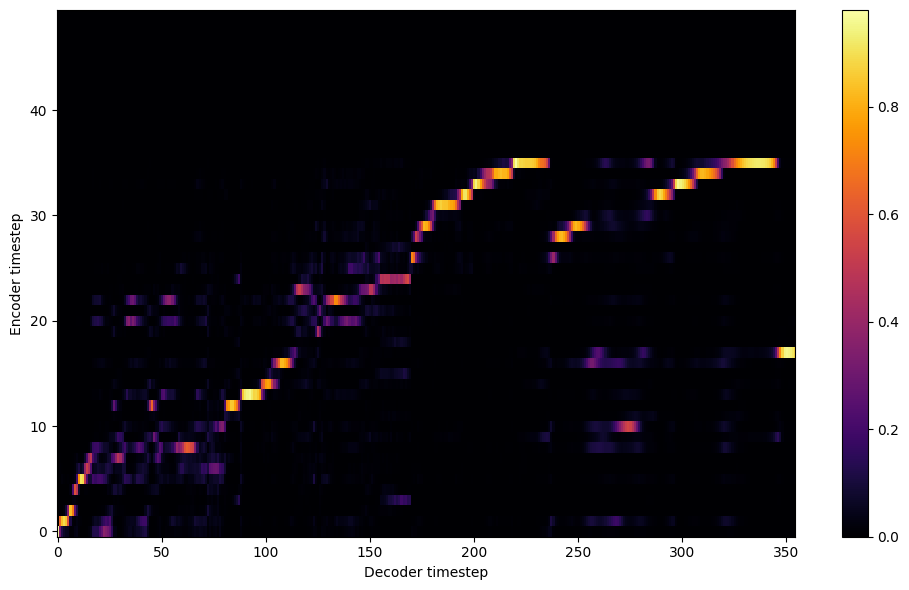


Starting Epoch: 72 Iteration: 1080


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 72 Validation loss 1095:  0.145431  Time: 0.3m LR: 0.000300


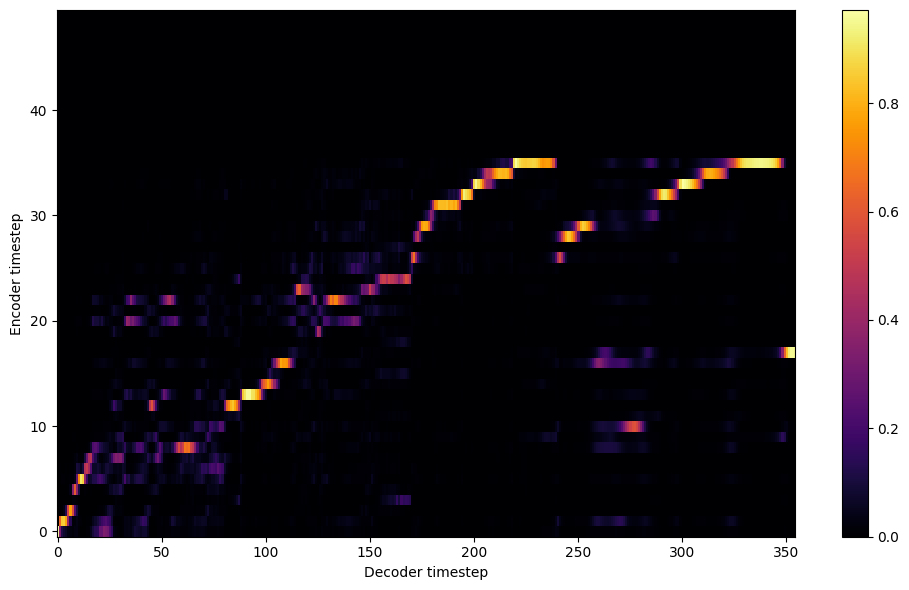


Starting Epoch: 73 Iteration: 1095


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 73 Validation loss 1110:  0.141806  Time: 0.3m LR: 0.000300


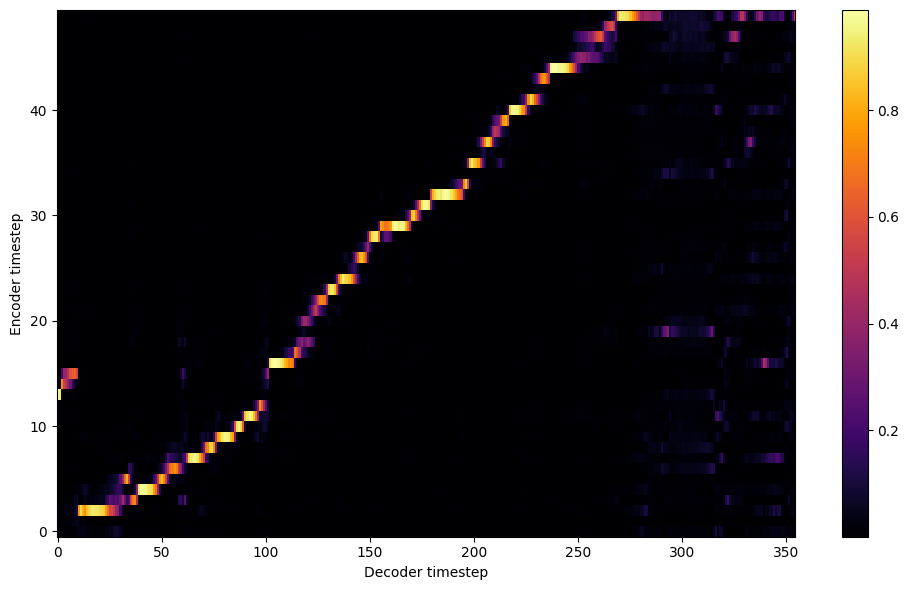


Starting Epoch: 74 Iteration: 1110


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 74 Validation loss 1125:  0.142600  Time: 0.3m LR: 0.000300


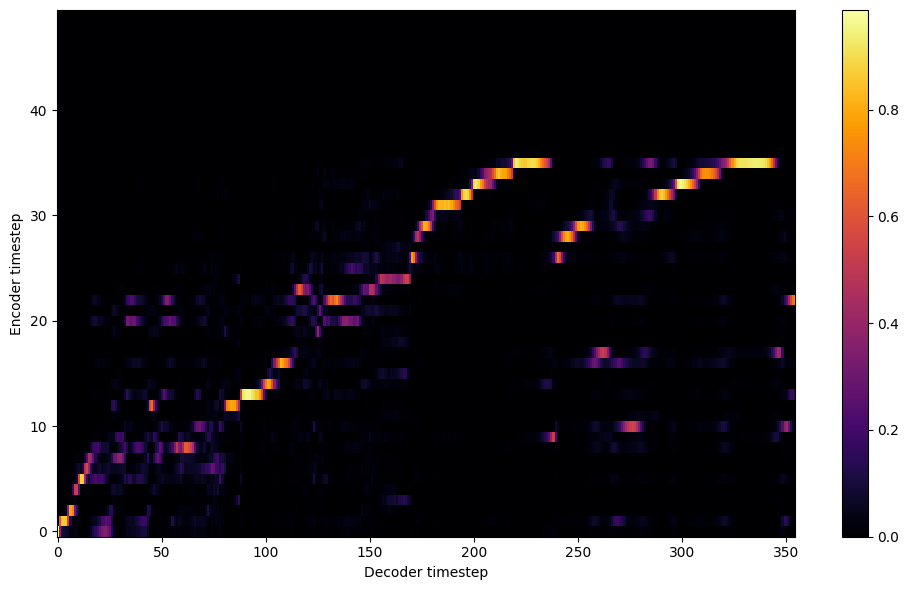


Starting Epoch: 75 Iteration: 1125


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 75 Validation loss 1140:  0.142056  Time: 0.3m LR: 0.000300


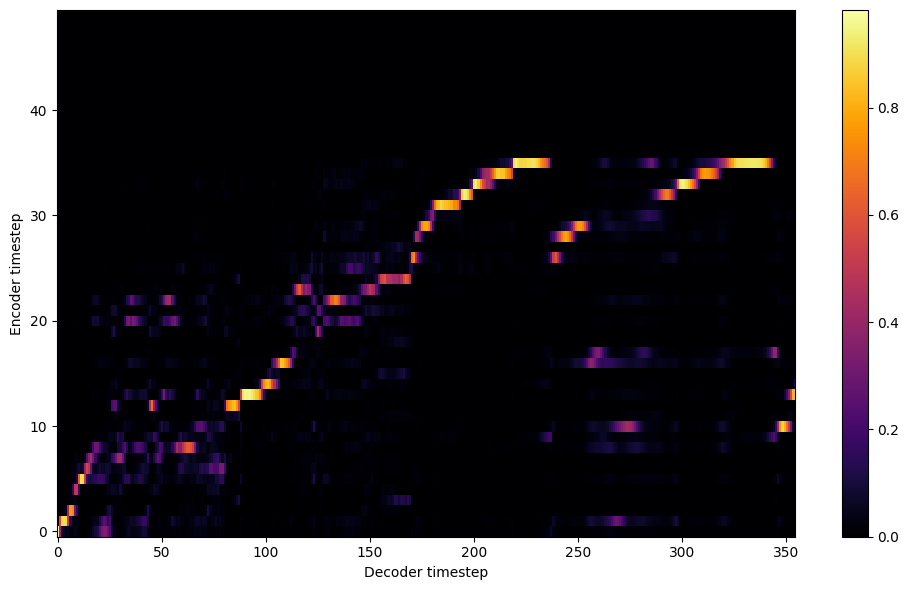


Starting Epoch: 76 Iteration: 1140


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 76 Validation loss 1155:  0.134627  Time: 0.3m LR: 0.000300


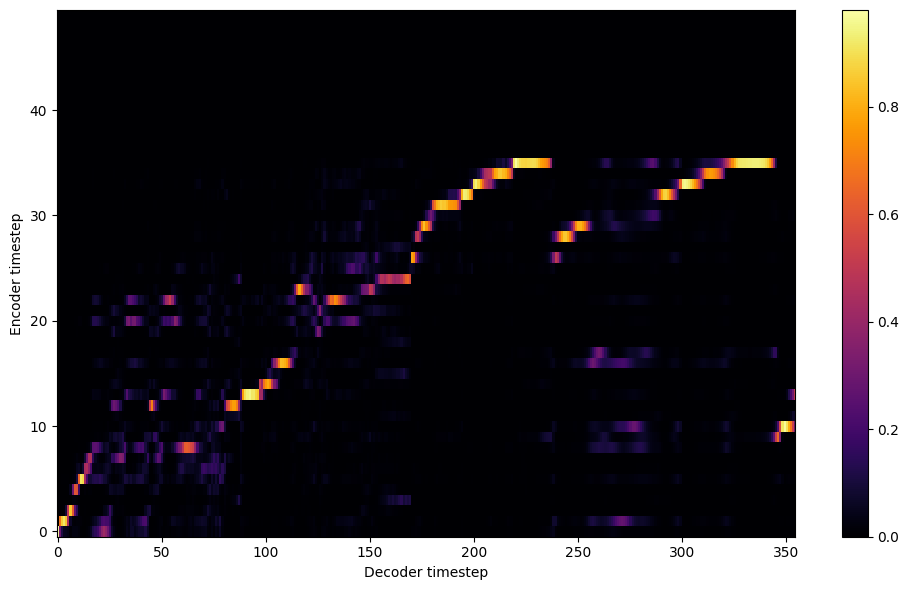


Starting Epoch: 77 Iteration: 1155


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 77 Validation loss 1170:  0.132875  Time: 0.3m LR: 0.000300


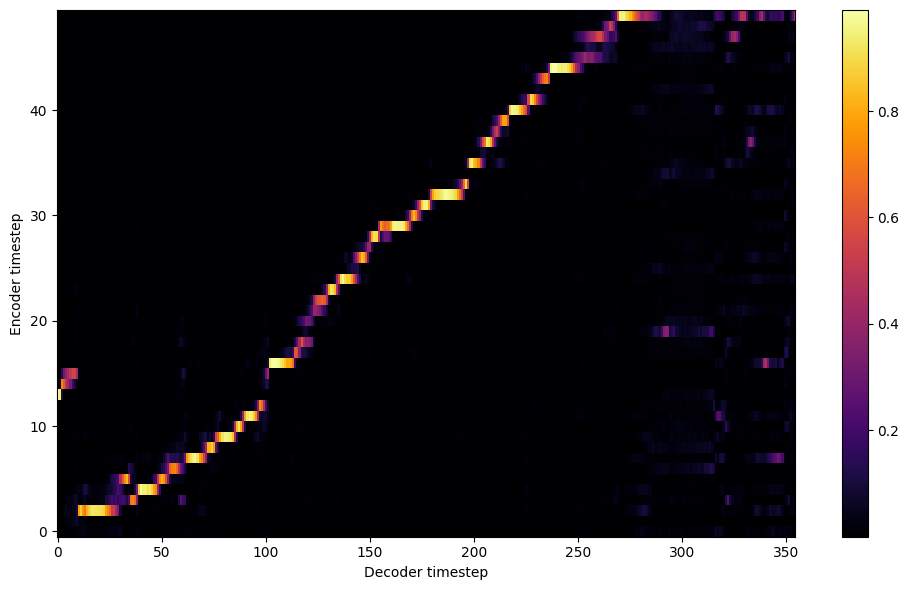


Starting Epoch: 78 Iteration: 1170


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 78 Validation loss 1185:  0.134500  Time: 0.3m LR: 0.000300


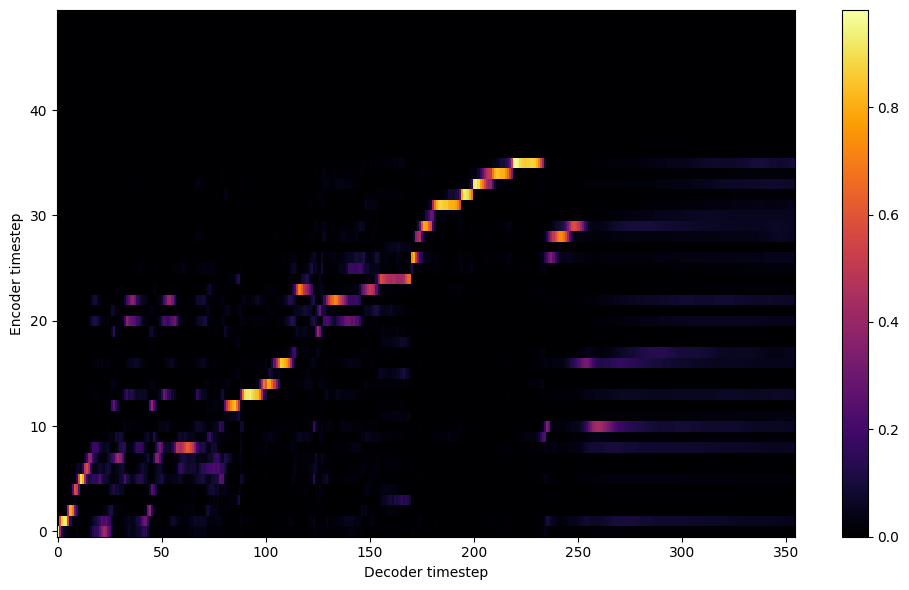


Starting Epoch: 79 Iteration: 1185


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 79 Validation loss 1200:  0.133430  Time: 0.3m LR: 0.000300


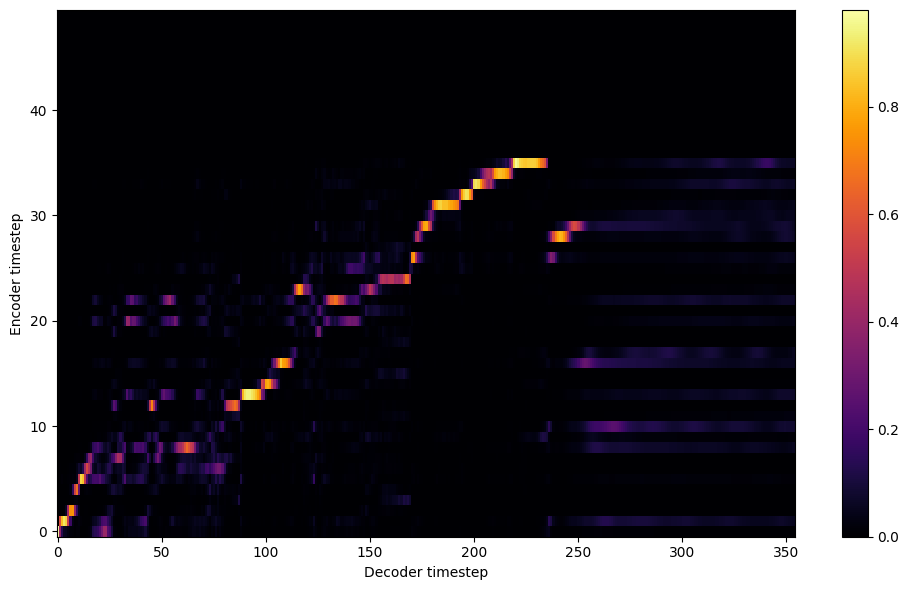

Saving model and optimizer state at iteration 1200 to /content/model//female_child
Model Saved

Starting Epoch: 80 Iteration: 1200


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 80 Validation loss 1215:  0.130660  Time: 0.4m LR: 0.000300


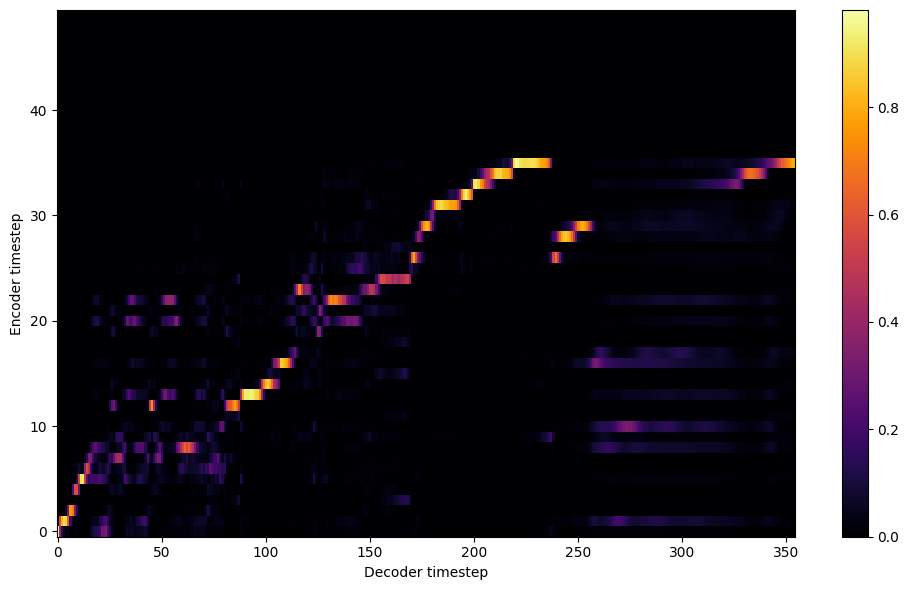


Starting Epoch: 81 Iteration: 1215


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 81 Validation loss 1230:  0.133121  Time: 0.3m LR: 0.000300


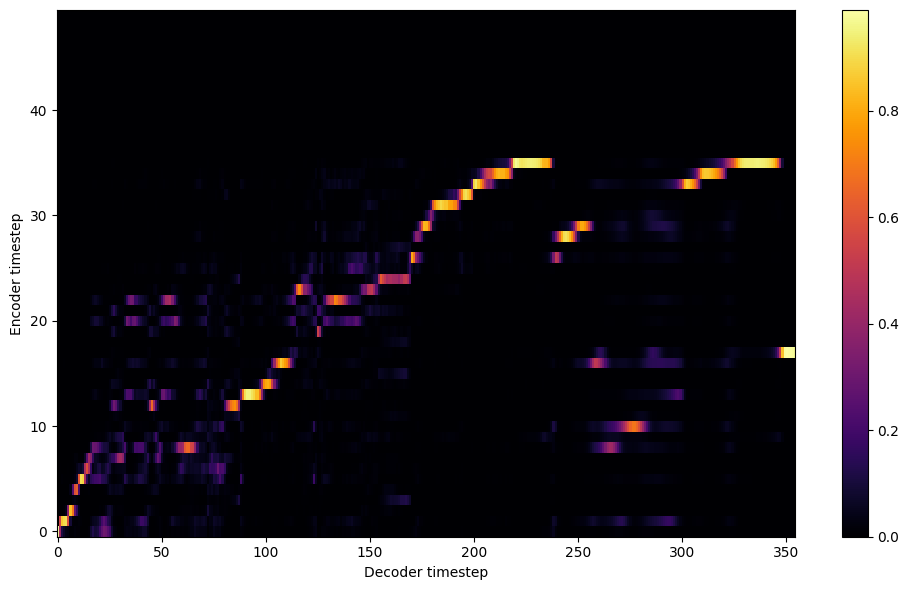


Starting Epoch: 82 Iteration: 1230


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 82 Validation loss 1245:  0.133867  Time: 0.3m LR: 0.000300


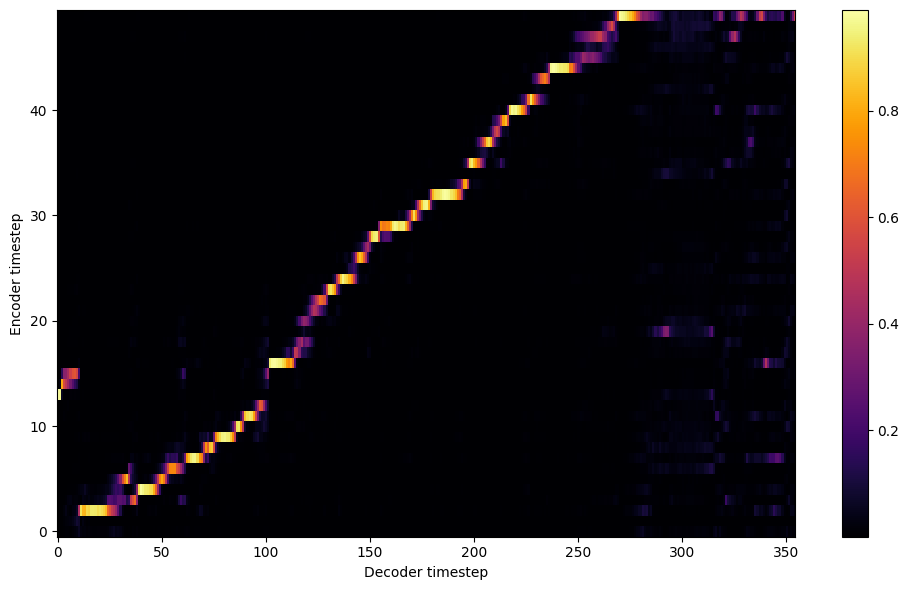


Starting Epoch: 83 Iteration: 1245


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 83 Validation loss 1260:  0.129699  Time: 0.3m LR: 0.000300


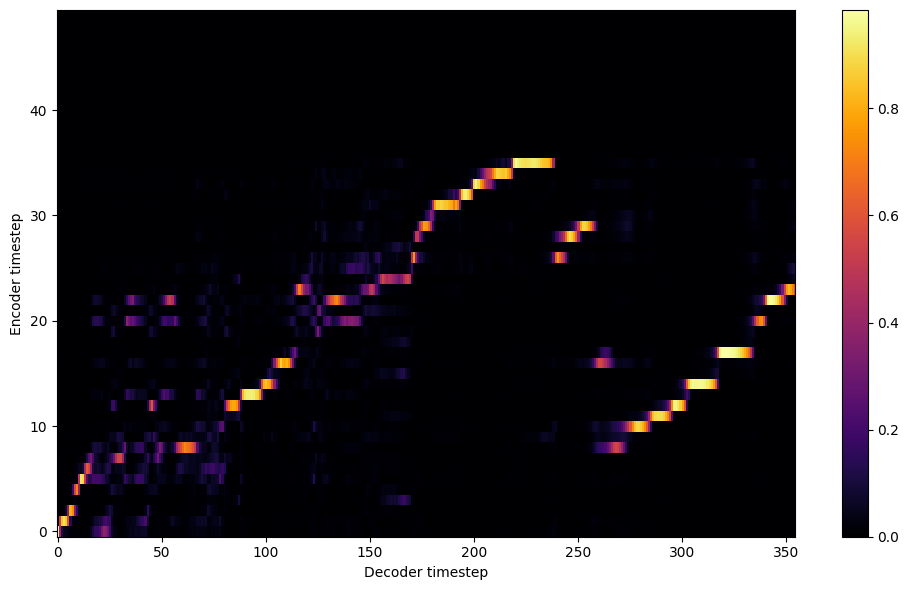


Starting Epoch: 84 Iteration: 1260


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 84 Validation loss 1275:  0.128458  Time: 0.3m LR: 0.000300


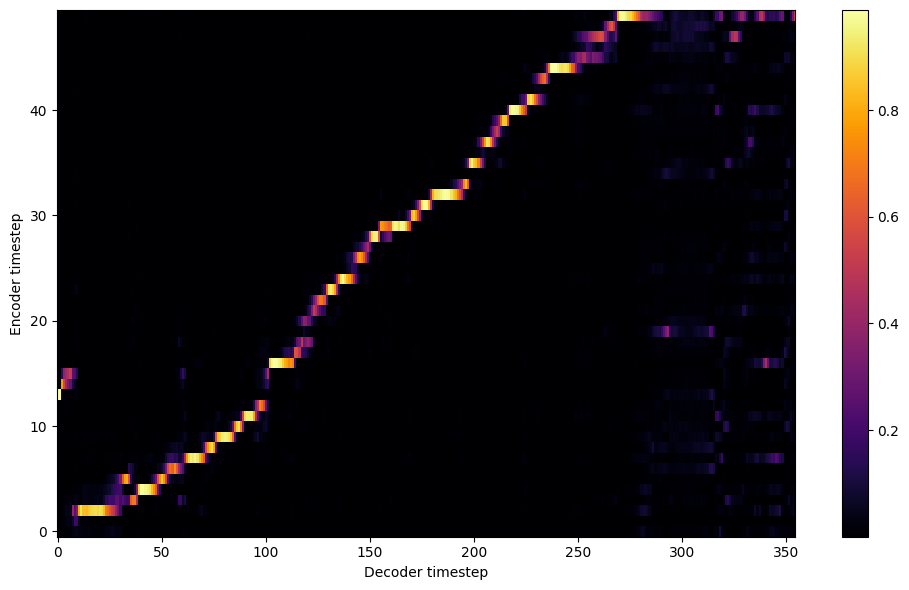


Starting Epoch: 85 Iteration: 1275


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 85 Validation loss 1290:  0.125759  Time: 0.3m LR: 0.000300


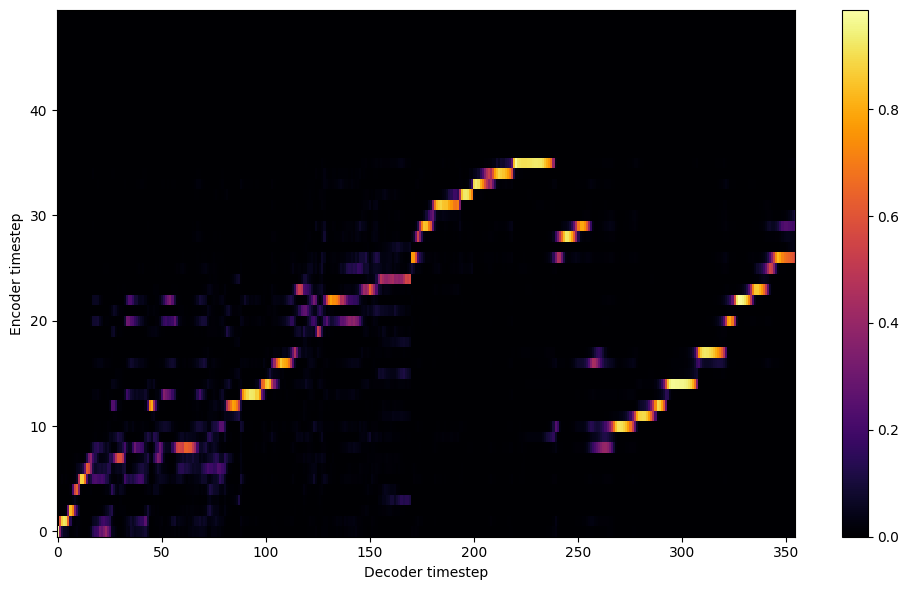


Starting Epoch: 86 Iteration: 1290


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 86 Validation loss 1305:  0.124565  Time: 0.3m LR: 0.000300


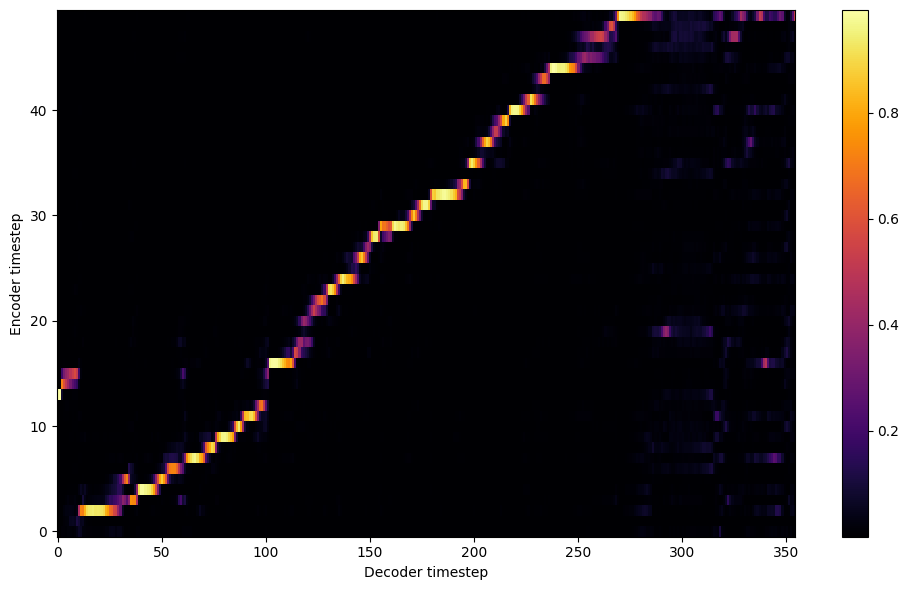


Starting Epoch: 87 Iteration: 1305


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 87 Validation loss 1320:  0.123325  Time: 0.3m LR: 0.000300


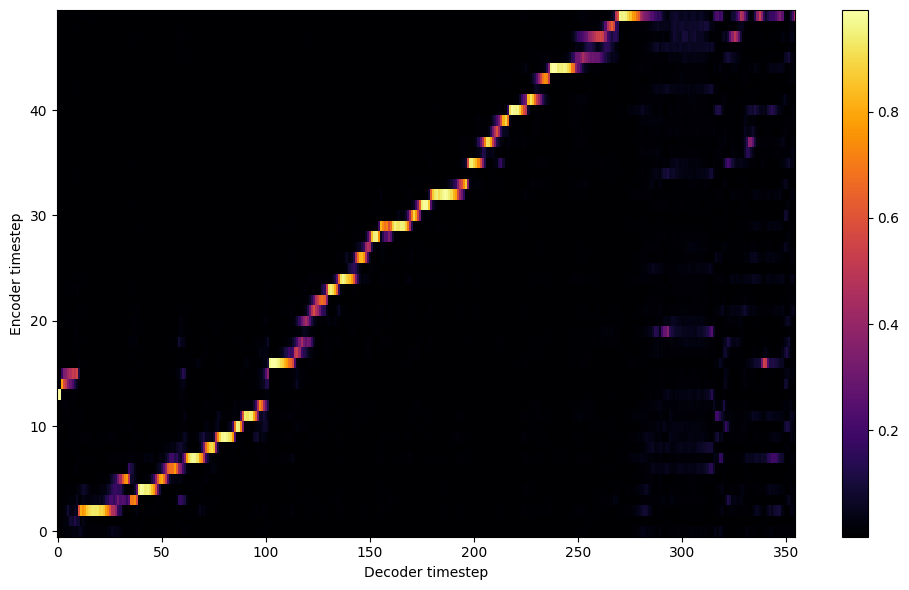


Starting Epoch: 88 Iteration: 1320


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 88 Validation loss 1335:  0.124455  Time: 0.4m LR: 0.000300


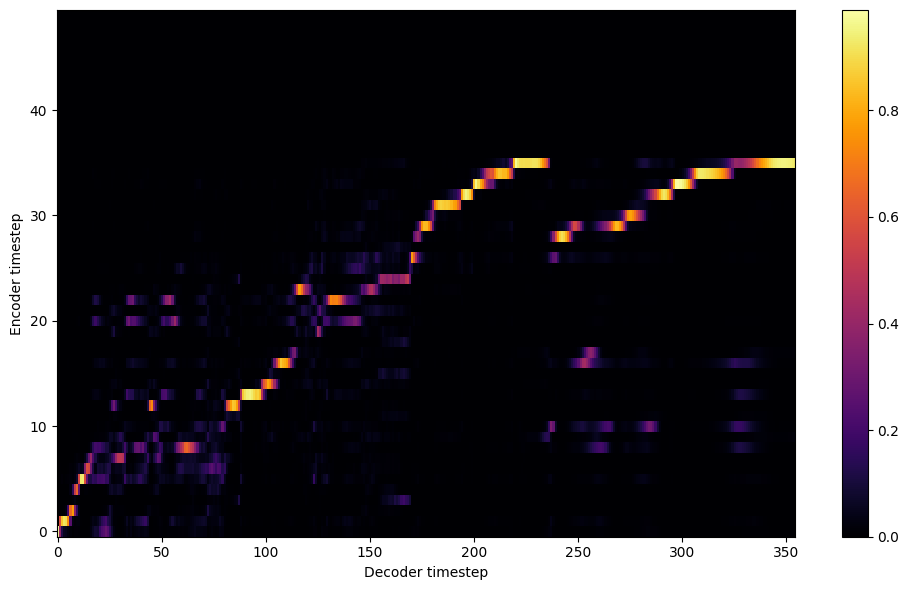


Starting Epoch: 89 Iteration: 1335


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 89 Validation loss 1350:  0.128111  Time: 0.4m LR: 0.000300


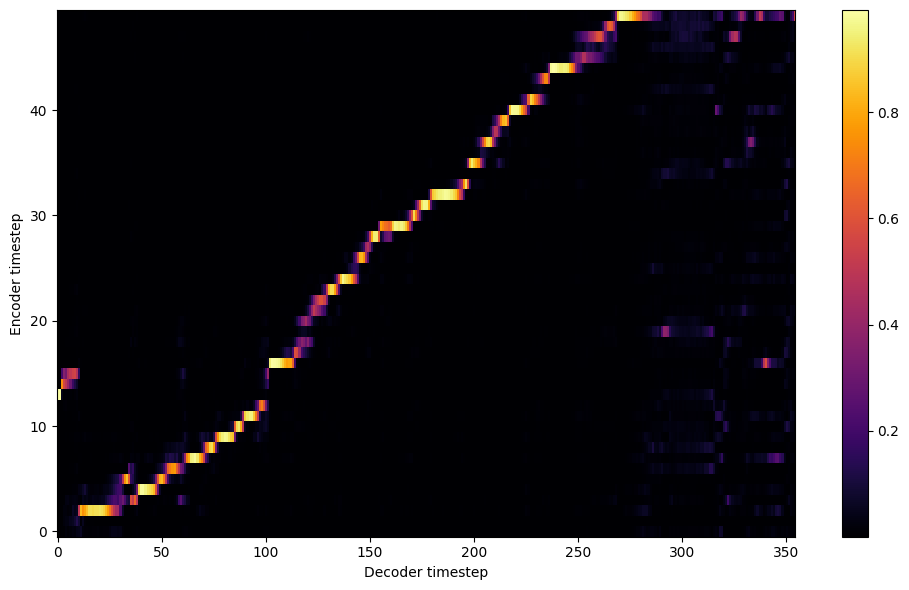

Saving model and optimizer state at iteration 1350 to /content/model//female_child
Model Saved

Starting Epoch: 90 Iteration: 1350


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 90 Validation loss 1365:  0.125305  Time: 0.4m LR: 0.000300


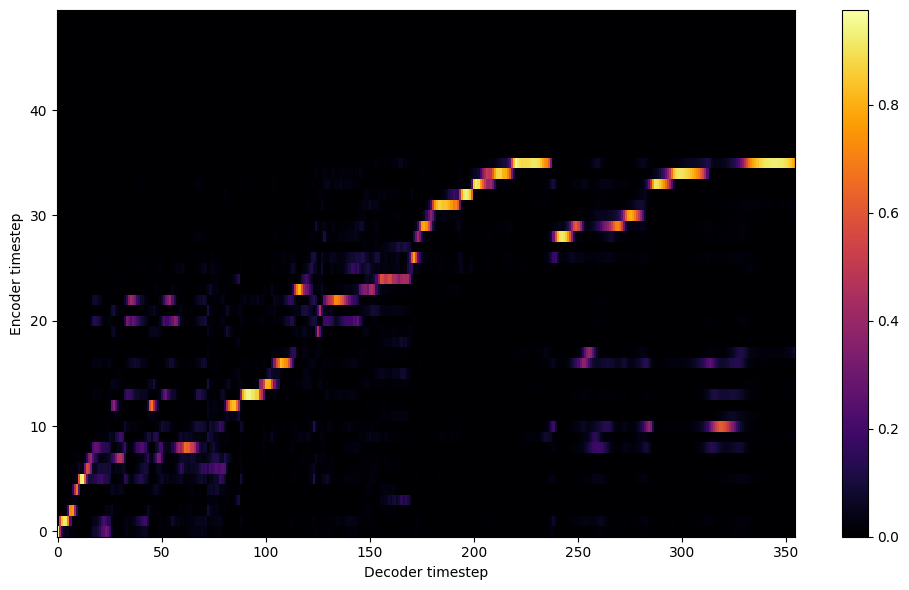


Starting Epoch: 91 Iteration: 1365


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 91 Validation loss 1380:  0.122907  Time: 0.3m LR: 0.000300


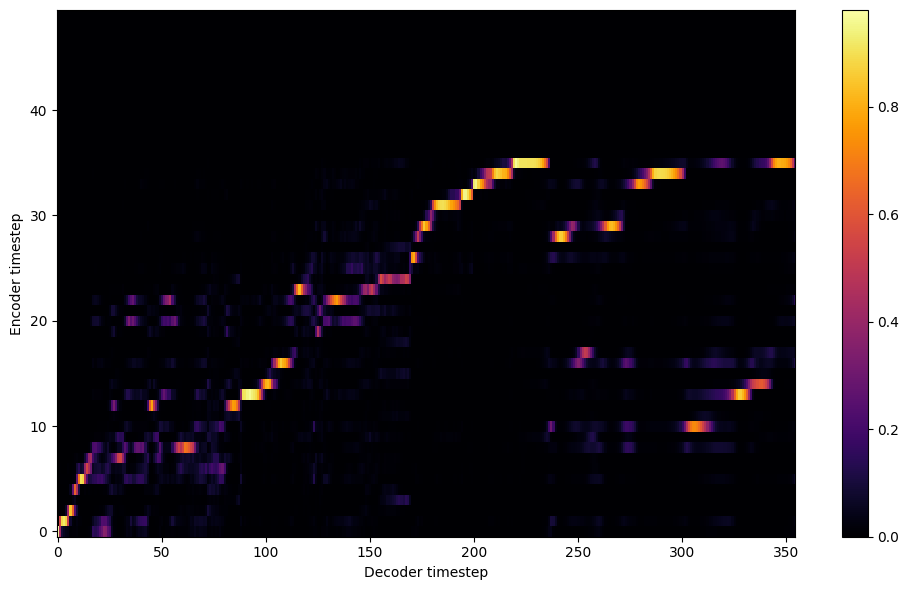


Starting Epoch: 92 Iteration: 1380


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 92 Validation loss 1395:  0.117334  Time: 0.3m LR: 0.000300


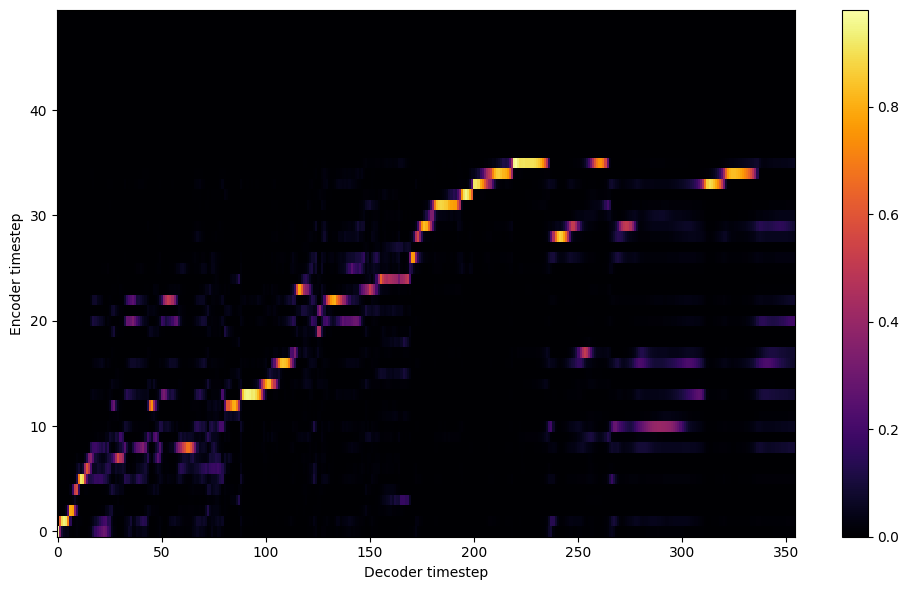


Starting Epoch: 93 Iteration: 1395


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 93 Validation loss 1410:  0.122041  Time: 0.4m LR: 0.000300


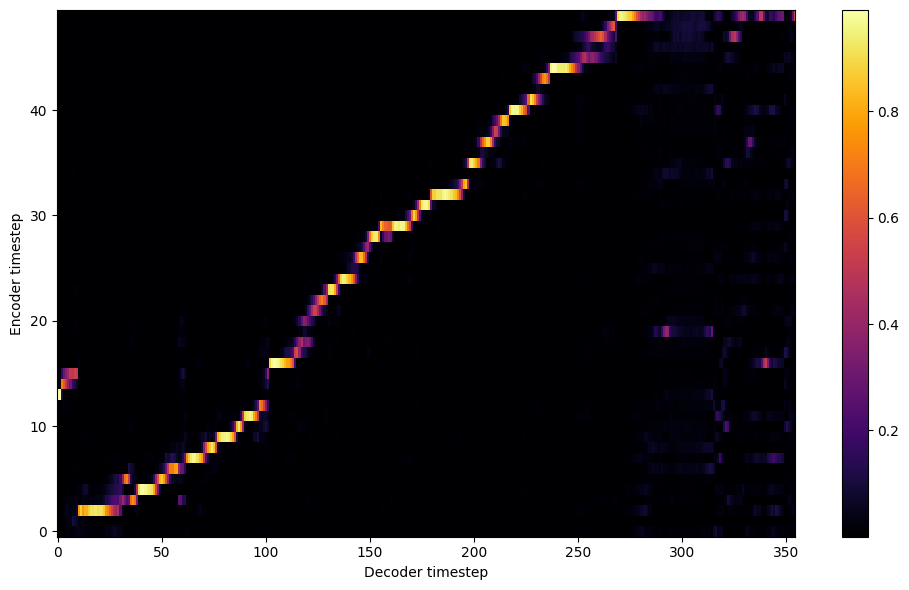


Starting Epoch: 94 Iteration: 1410


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 94 Validation loss 1425:  0.117403  Time: 0.4m LR: 0.000300


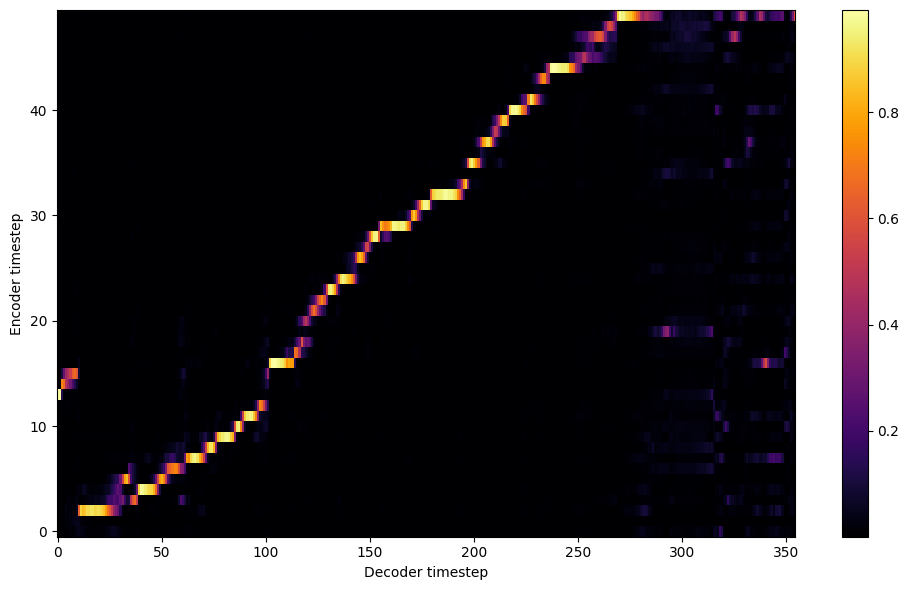


Starting Epoch: 95 Iteration: 1425


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 95 Validation loss 1440:  0.117550  Time: 0.3m LR: 0.000300


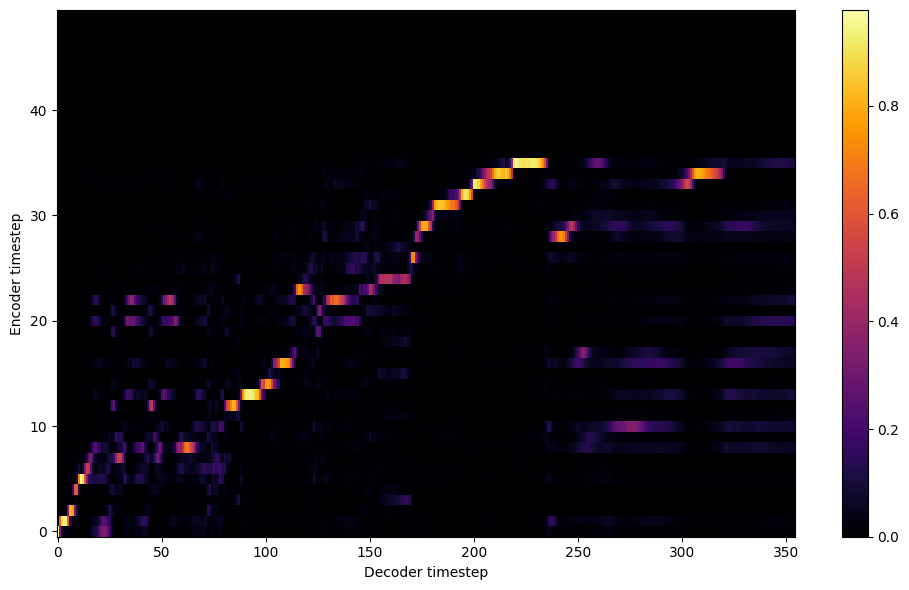


Starting Epoch: 96 Iteration: 1440


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 96 Validation loss 1455:  0.116623  Time: 0.3m LR: 0.000300


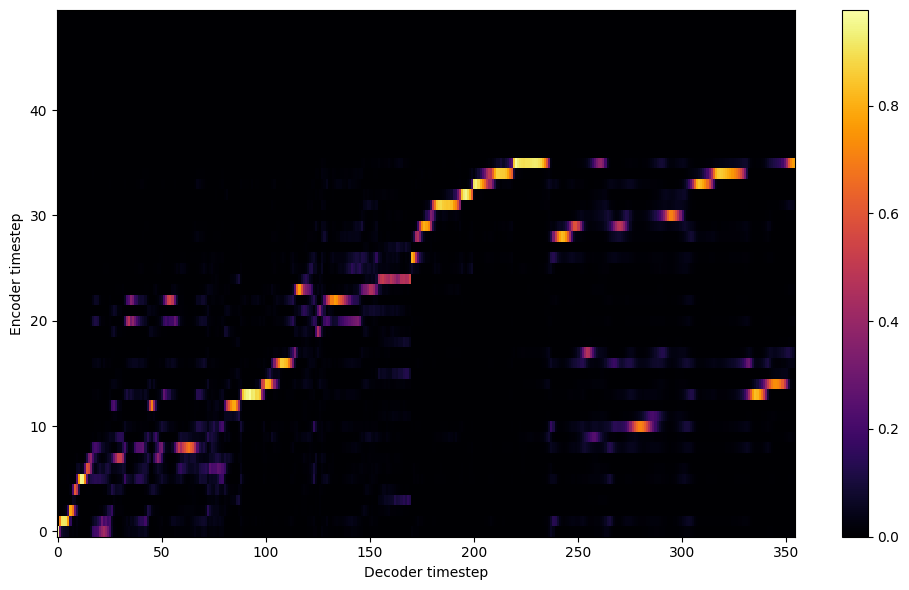


Starting Epoch: 97 Iteration: 1455


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 97 Validation loss 1470:  0.115704  Time: 0.4m LR: 0.000300


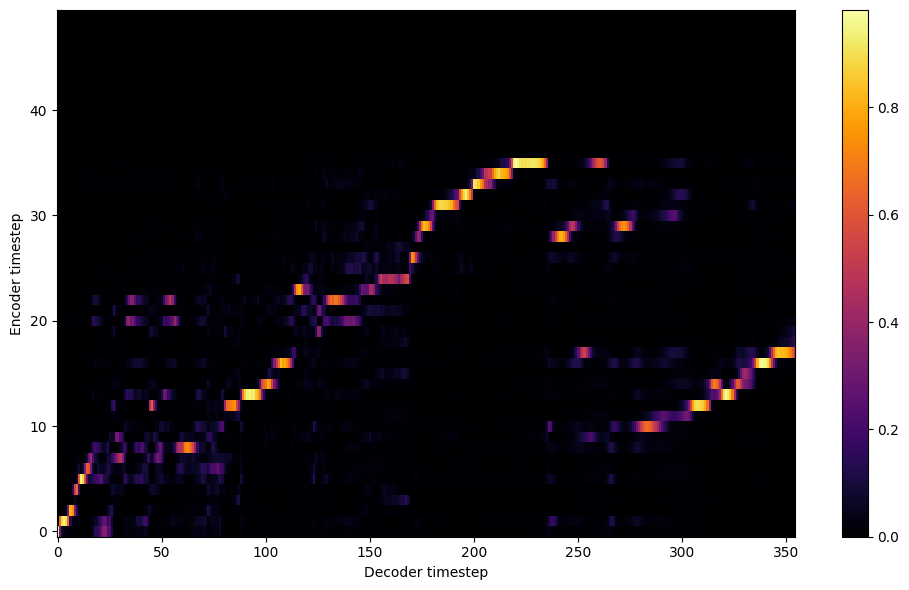


Starting Epoch: 98 Iteration: 1470


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 98 Validation loss 1485:  0.113582  Time: 0.4m LR: 0.000300


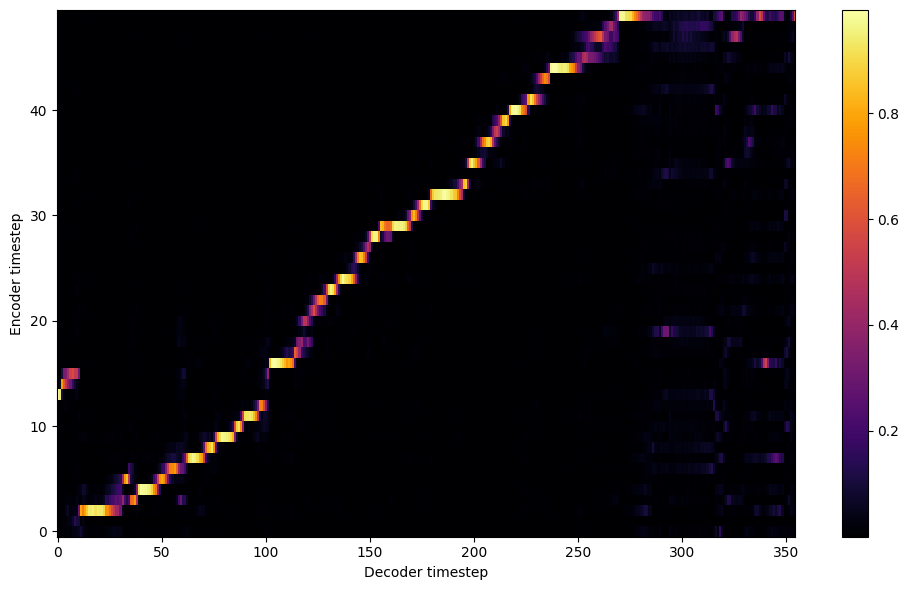


Starting Epoch: 99 Iteration: 1485


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 99 Validation loss 1500:  0.119794  Time: 0.3m LR: 0.000300


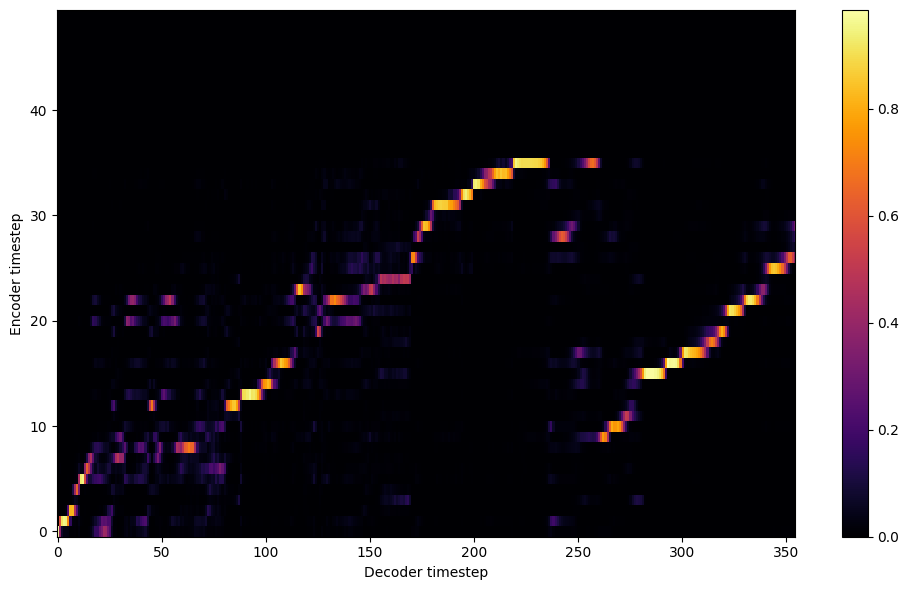

Saving model and optimizer state at iteration 1500 to /content/model//female_child
Model Saved

Starting Epoch: 100 Iteration: 1500


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 100 Validation loss 1515:  0.117025  Time: 0.4m LR: 0.000300


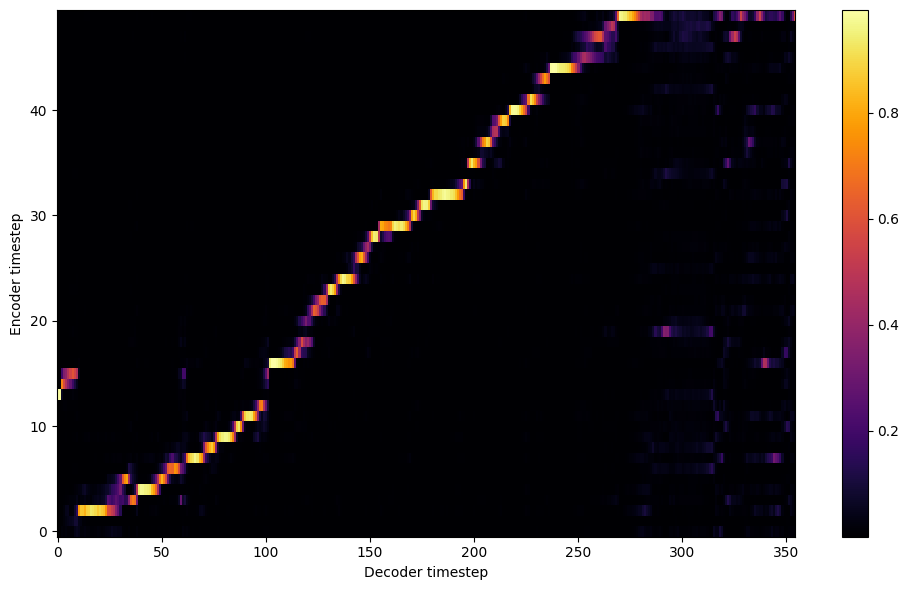


Starting Epoch: 101 Iteration: 1515


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 101 Validation loss 1530:  0.114055  Time: 0.4m LR: 0.000300


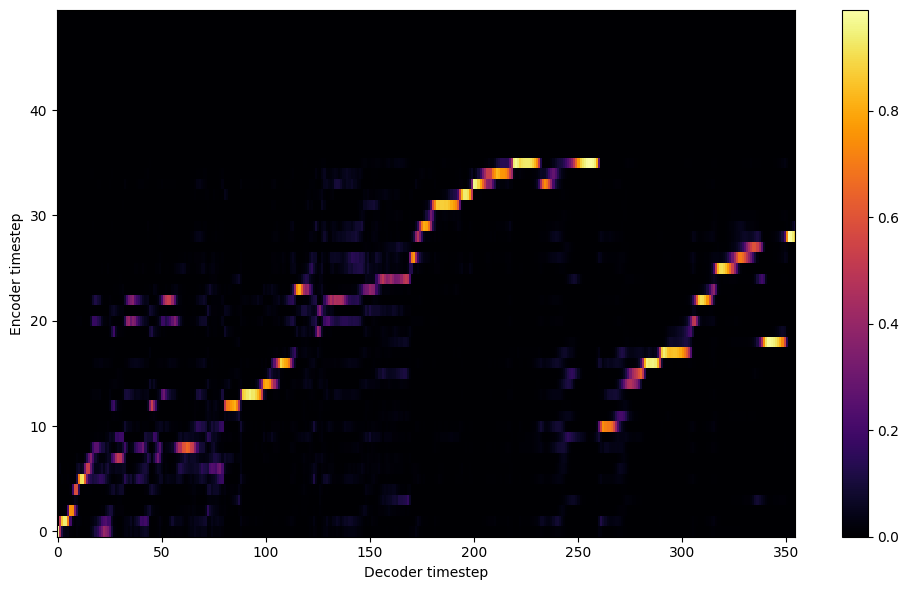


Starting Epoch: 102 Iteration: 1530


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 102 Validation loss 1545:  0.117058  Time: 0.4m LR: 0.000300


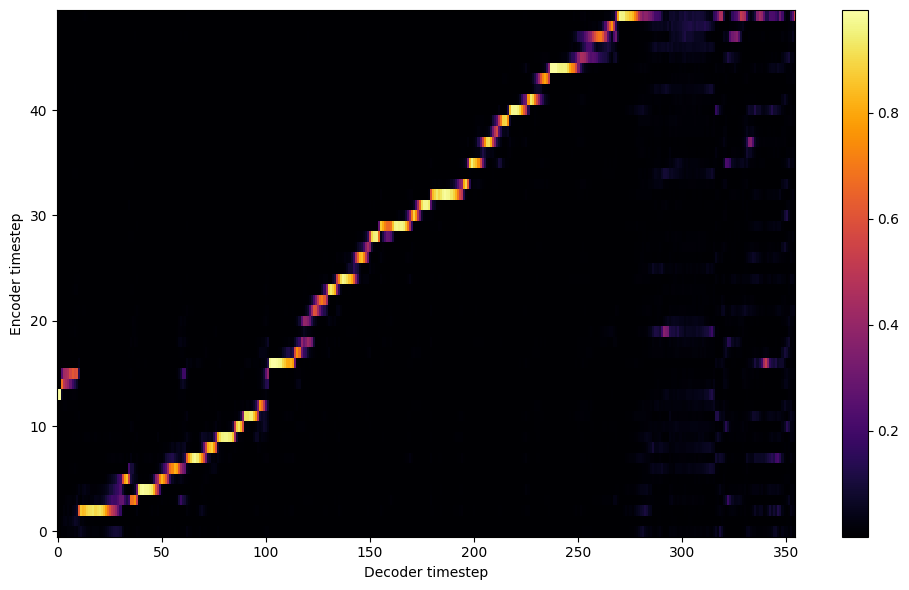


Starting Epoch: 103 Iteration: 1545


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 103 Validation loss 1560:  0.114943  Time: 0.4m LR: 0.000300


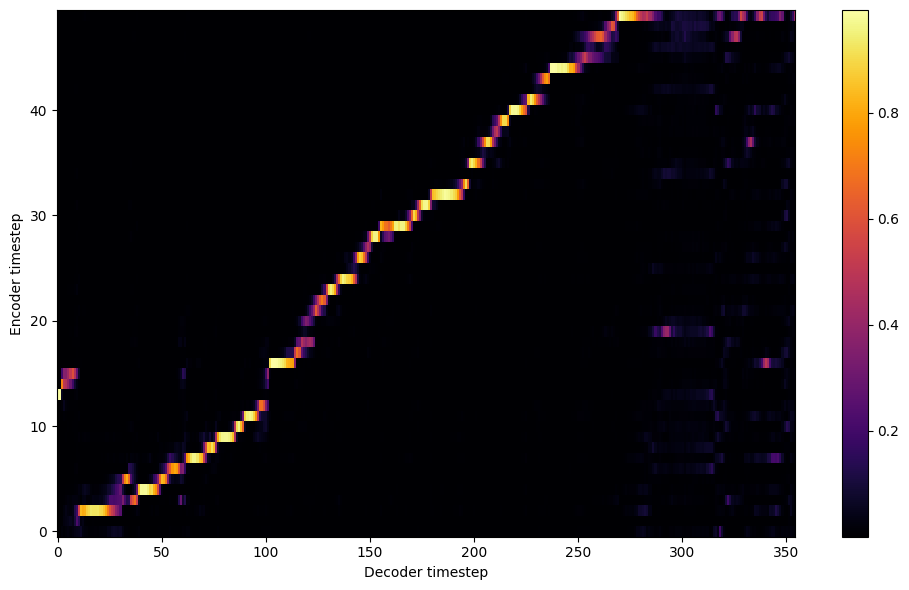


Starting Epoch: 104 Iteration: 1560


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 104 Validation loss 1575:  0.112496  Time: 0.4m LR: 0.000300


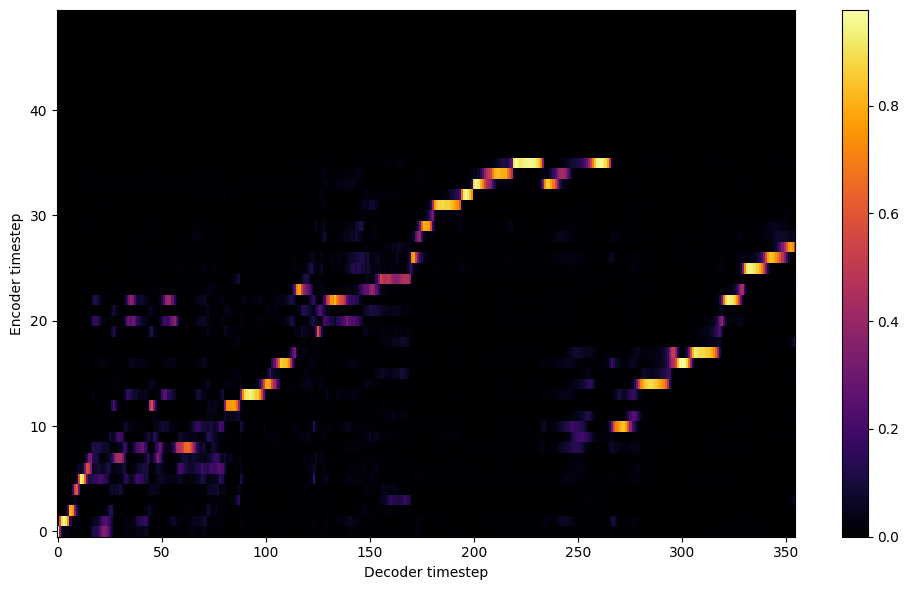


Starting Epoch: 105 Iteration: 1575


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 105 Validation loss 1590:  0.113939  Time: 0.4m LR: 0.000300


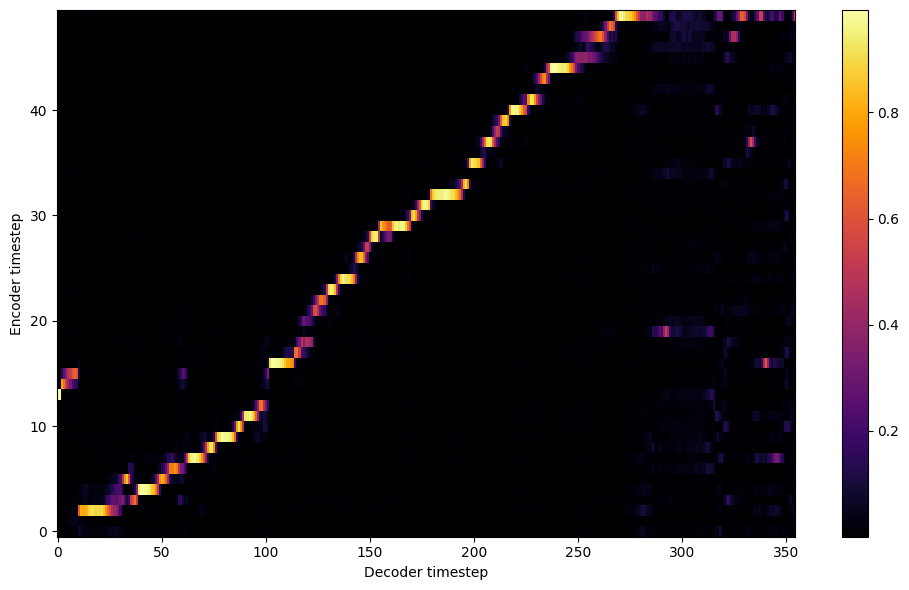


Starting Epoch: 106 Iteration: 1590


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 106 Validation loss 1605:  0.114057  Time: 0.4m LR: 0.000300


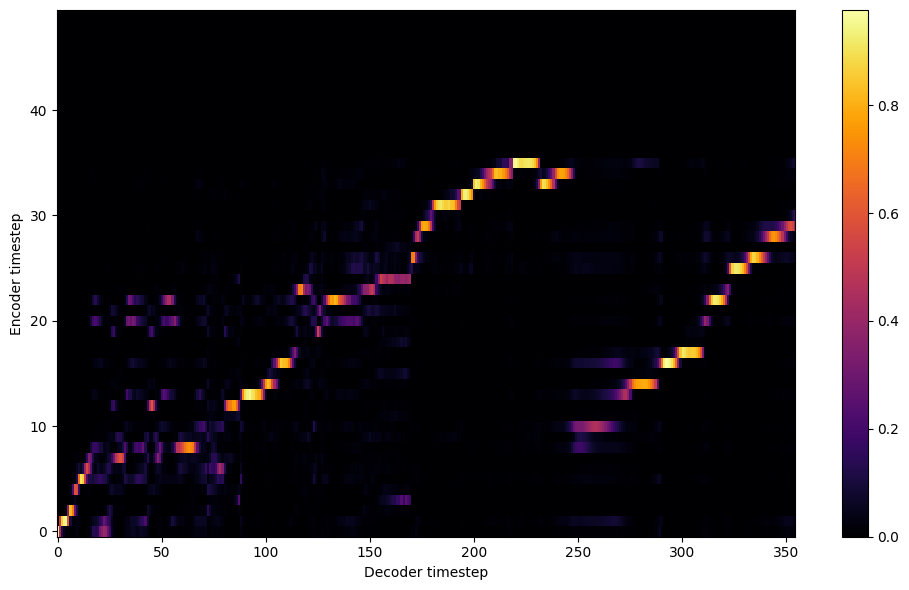


Starting Epoch: 107 Iteration: 1605


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 107 Validation loss 1620:  0.111539  Time: 0.4m LR: 0.000300


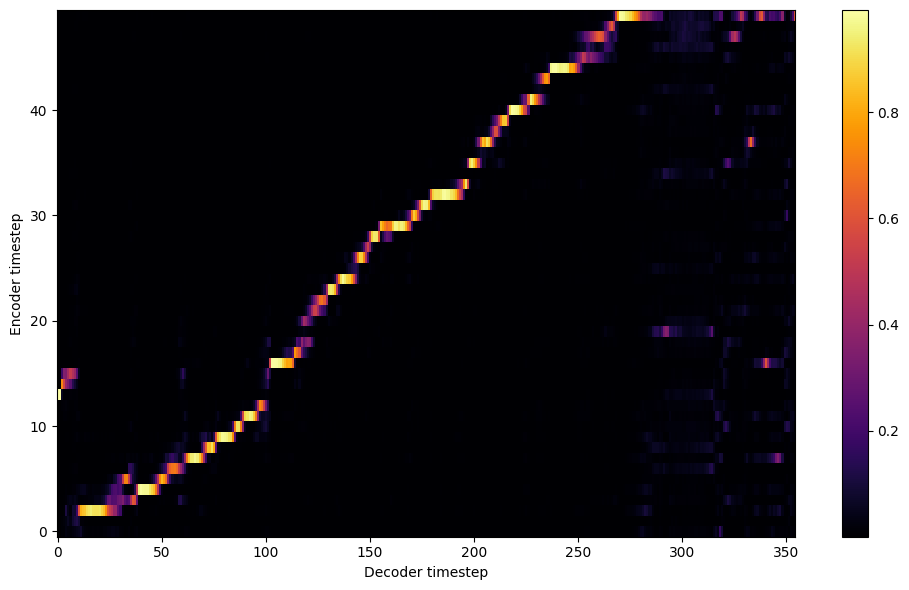


Starting Epoch: 108 Iteration: 1620


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 108 Validation loss 1635:  0.107741  Time: 0.4m LR: 0.000300


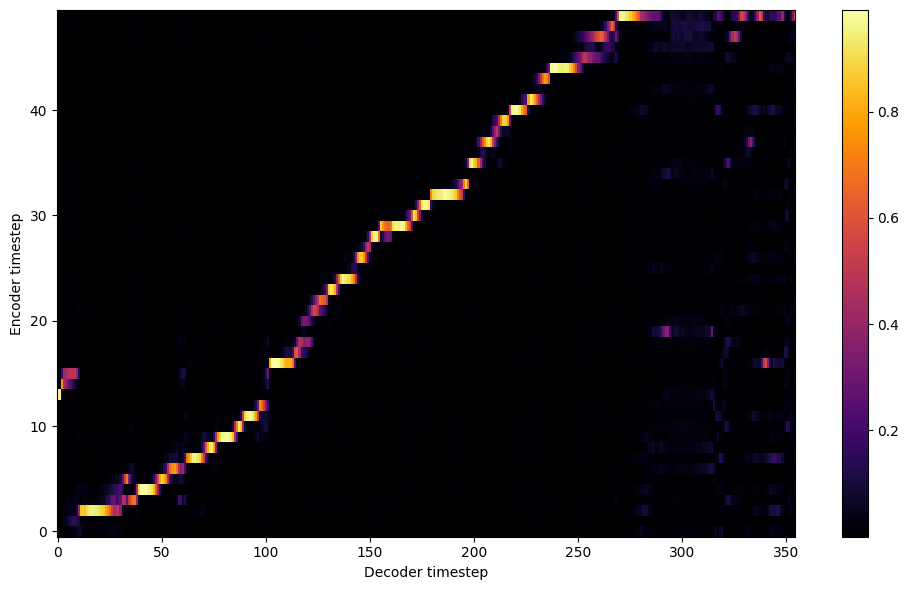


Starting Epoch: 109 Iteration: 1635


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 109 Validation loss 1650:  0.114605  Time: 0.3m LR: 0.000300


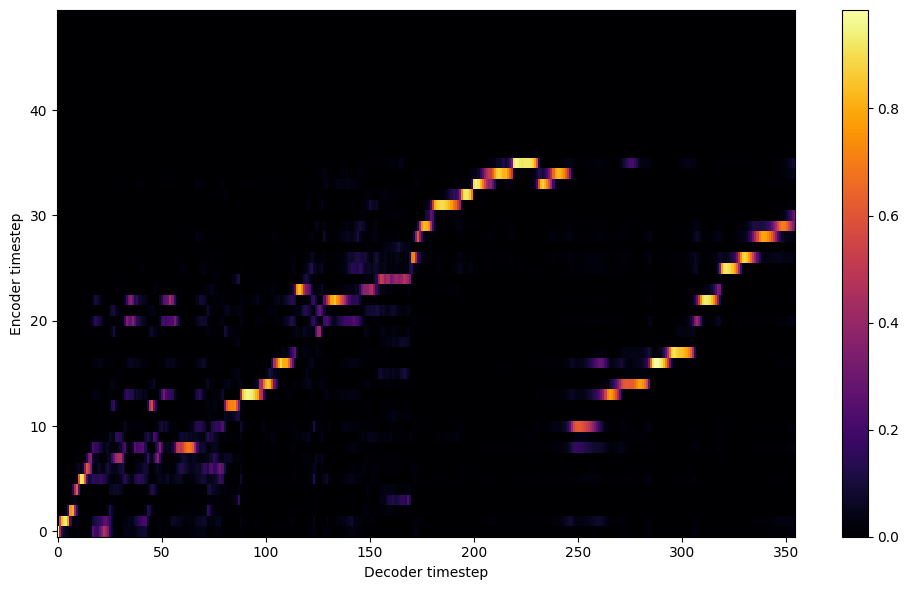

Saving model and optimizer state at iteration 1650 to /content/model//female_child
Model Saved

Starting Epoch: 110 Iteration: 1650


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 110 Validation loss 1665:  0.109881  Time: 0.4m LR: 0.000300


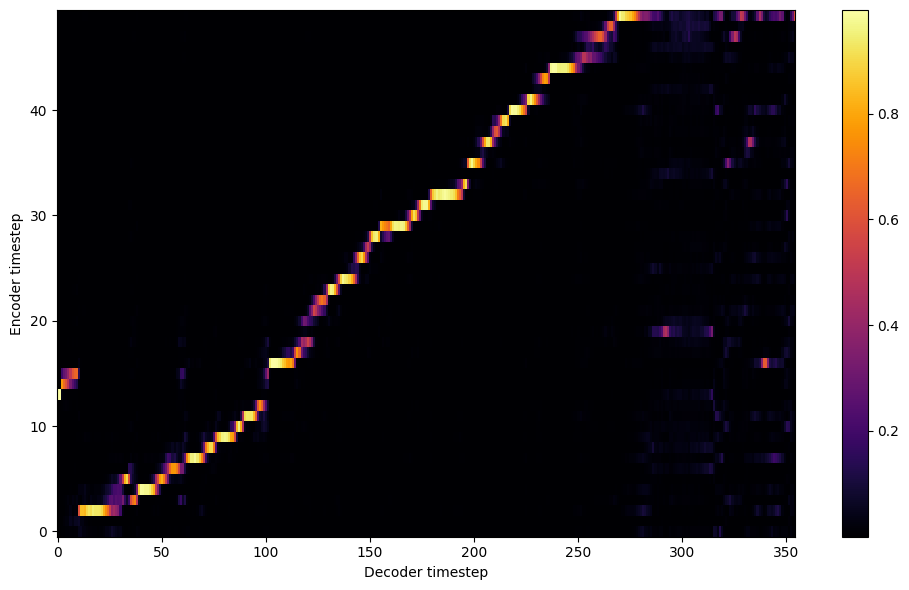


Starting Epoch: 111 Iteration: 1665


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 111 Validation loss 1680:  0.105447  Time: 0.4m LR: 0.000300


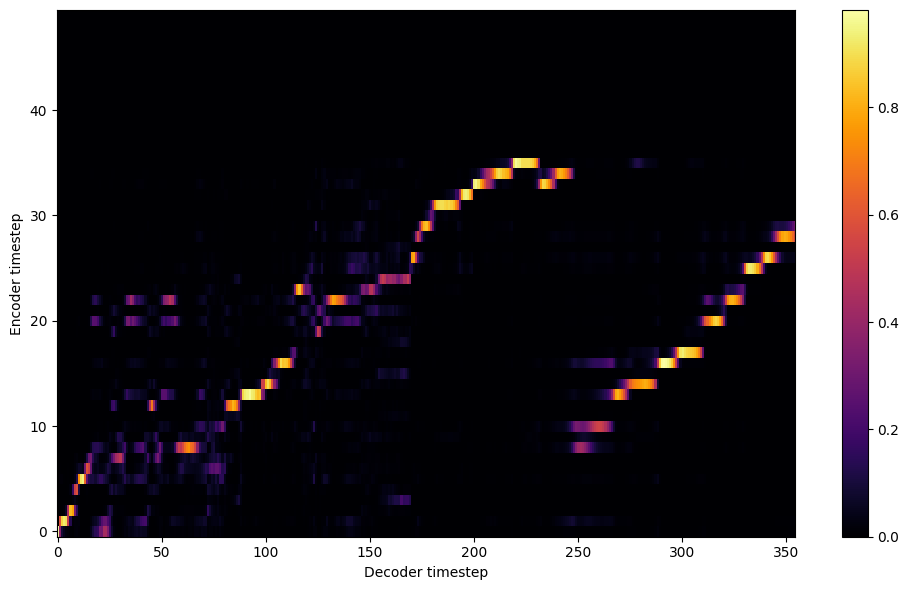


Starting Epoch: 112 Iteration: 1680


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 112 Validation loss 1695:  0.104819  Time: 0.3m LR: 0.000300


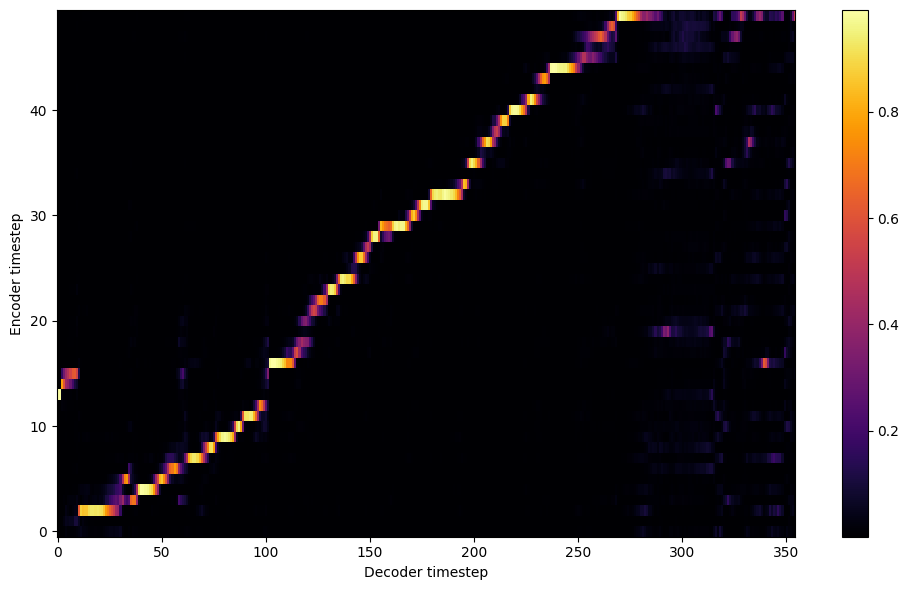


Starting Epoch: 113 Iteration: 1695


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 113 Validation loss 1710:  0.104118  Time: 0.4m LR: 0.000300


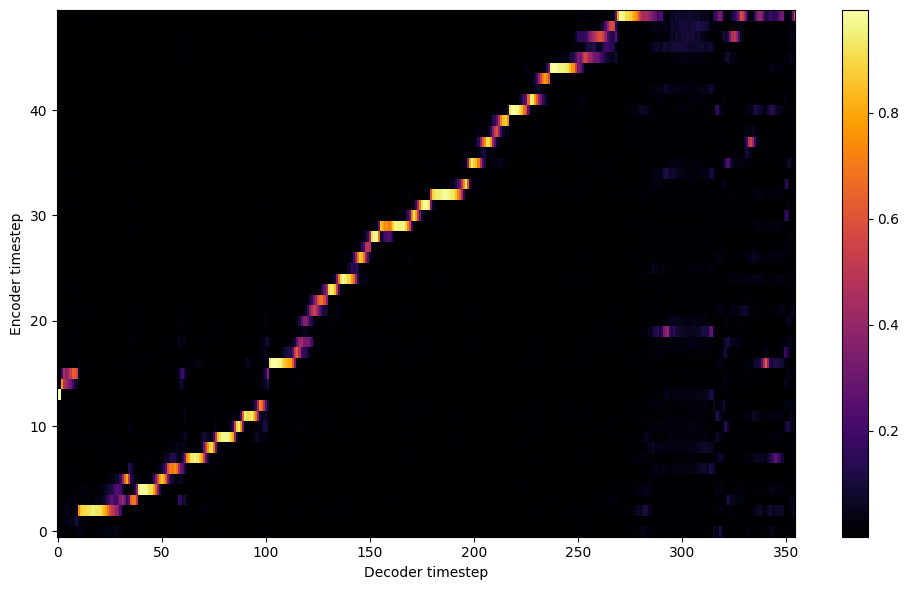


Starting Epoch: 114 Iteration: 1710


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 114 Validation loss 1725:  0.102497  Time: 0.4m LR: 0.000300


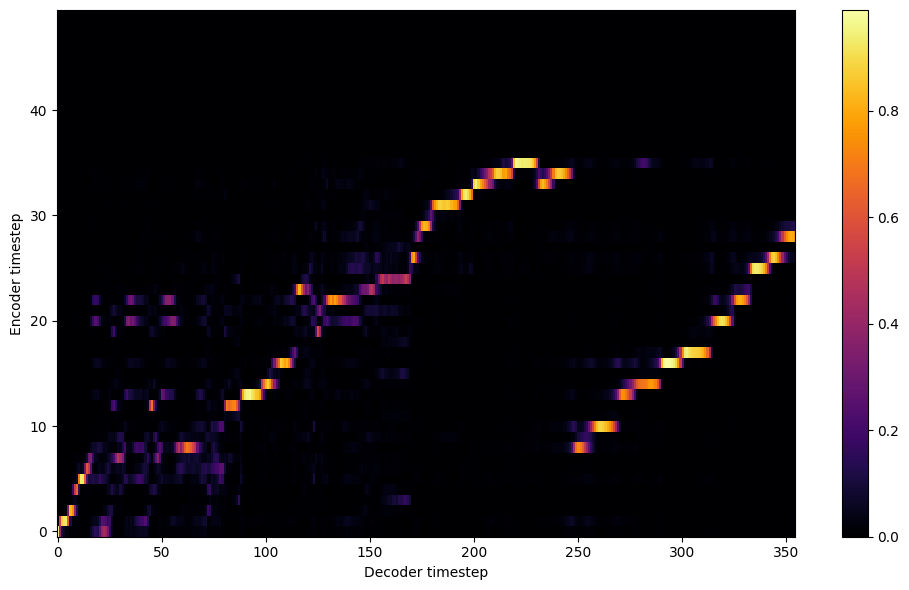


Starting Epoch: 115 Iteration: 1725


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 115 Validation loss 1740:  0.104746  Time: 0.3m LR: 0.000300


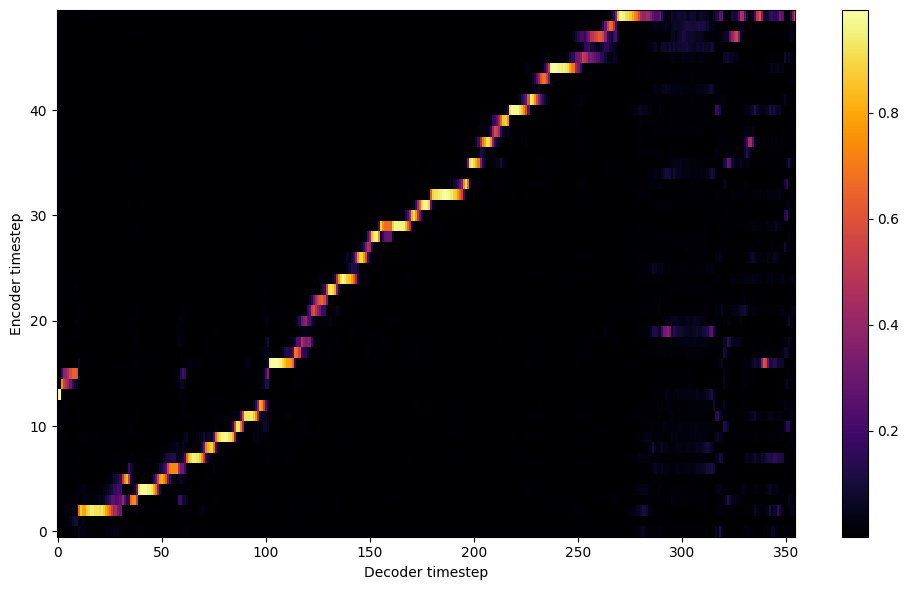


Starting Epoch: 116 Iteration: 1740


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 116 Validation loss 1755:  0.104435  Time: 0.4m LR: 0.000300


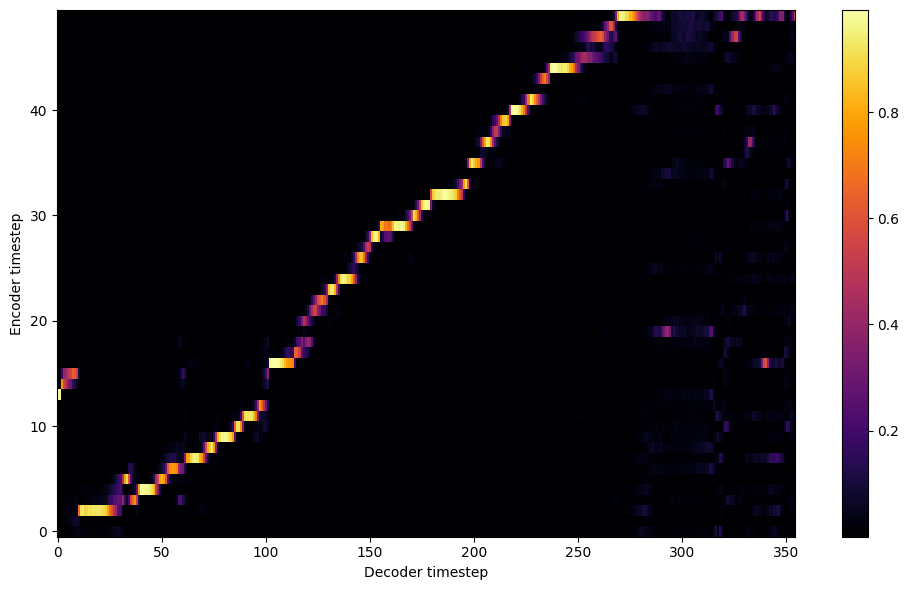


Starting Epoch: 117 Iteration: 1755


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 117 Validation loss 1770:  0.102251  Time: 0.4m LR: 0.000300


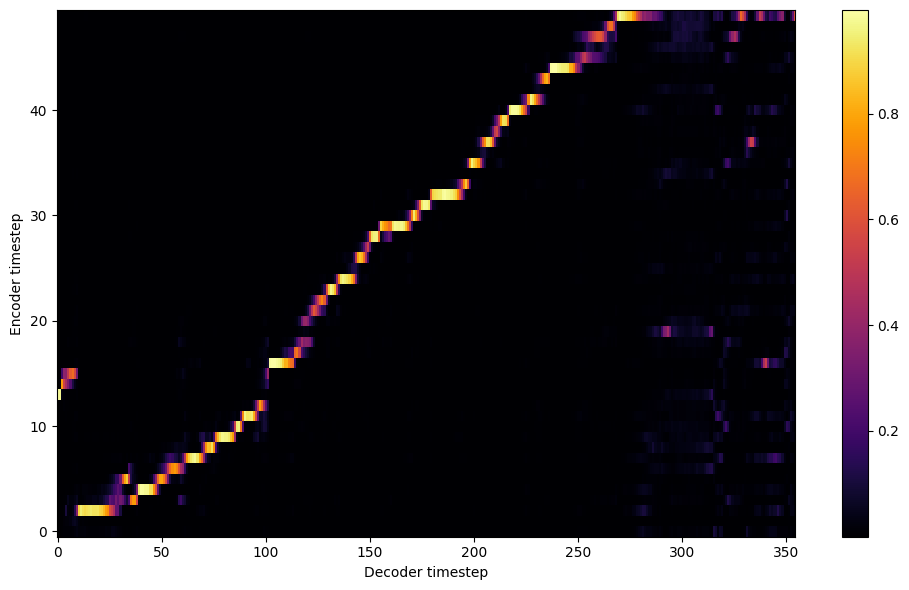


Starting Epoch: 118 Iteration: 1770


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 118 Validation loss 1785:  0.103295  Time: 0.3m LR: 0.000300


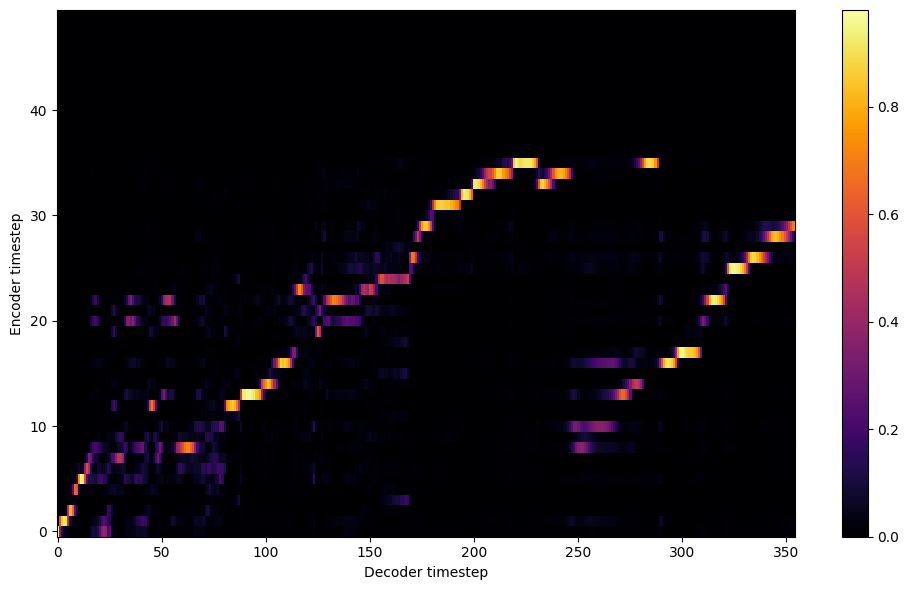


Starting Epoch: 119 Iteration: 1785


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 119 Validation loss 1800:  0.100402  Time: 0.4m LR: 0.000300


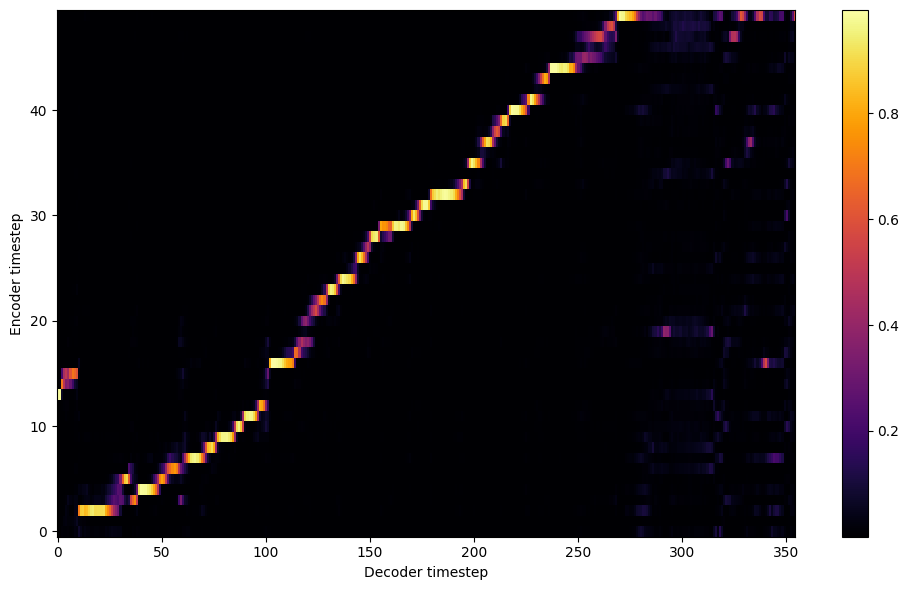

Saving model and optimizer state at iteration 1800 to /content/model//female_child
Model Saved

Starting Epoch: 120 Iteration: 1800


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 120 Validation loss 1815:  0.101626  Time: 0.4m LR: 0.000300


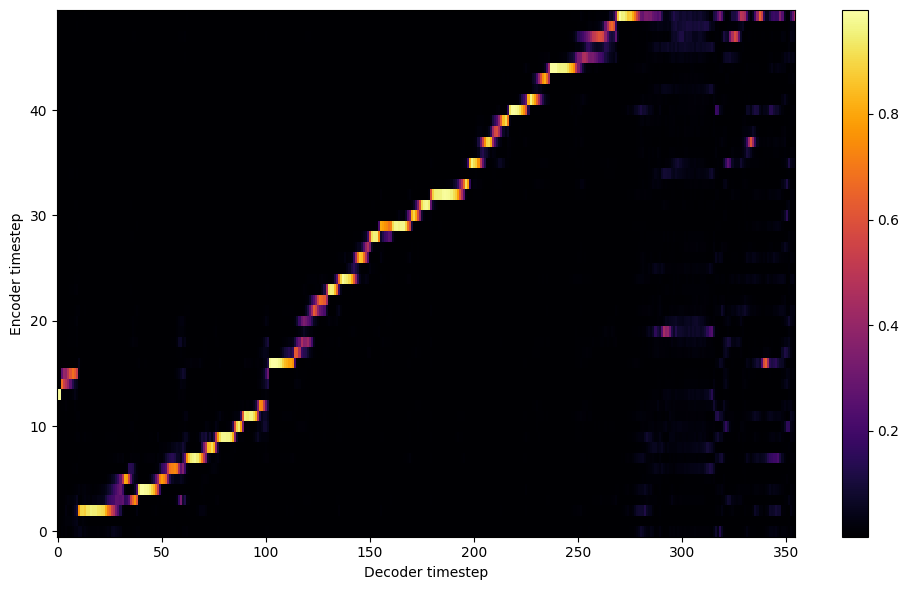


Starting Epoch: 121 Iteration: 1815


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 121 Validation loss 1830:  0.101358  Time: 0.4m LR: 0.000300


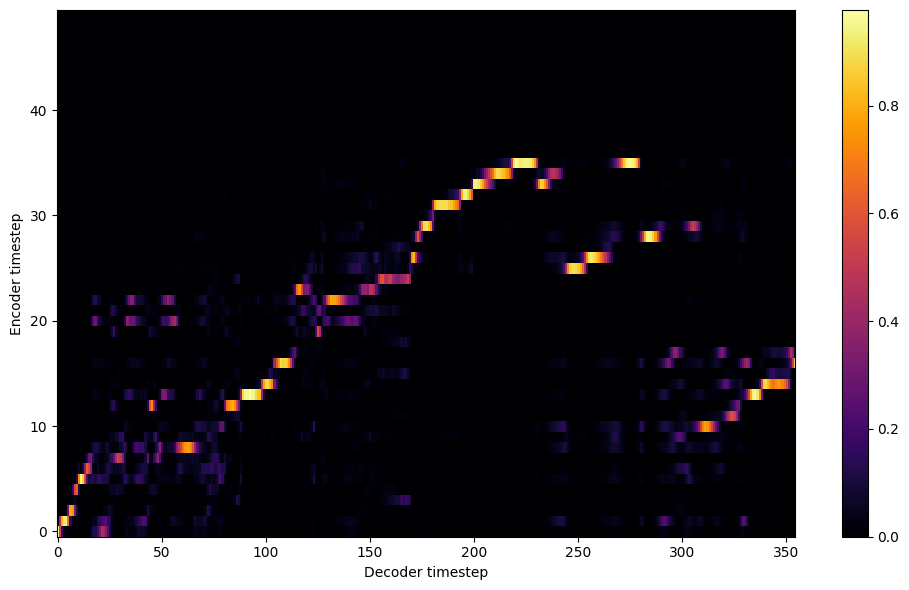


Starting Epoch: 122 Iteration: 1830


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 122 Validation loss 1845:  0.103599  Time: 0.4m LR: 0.000300


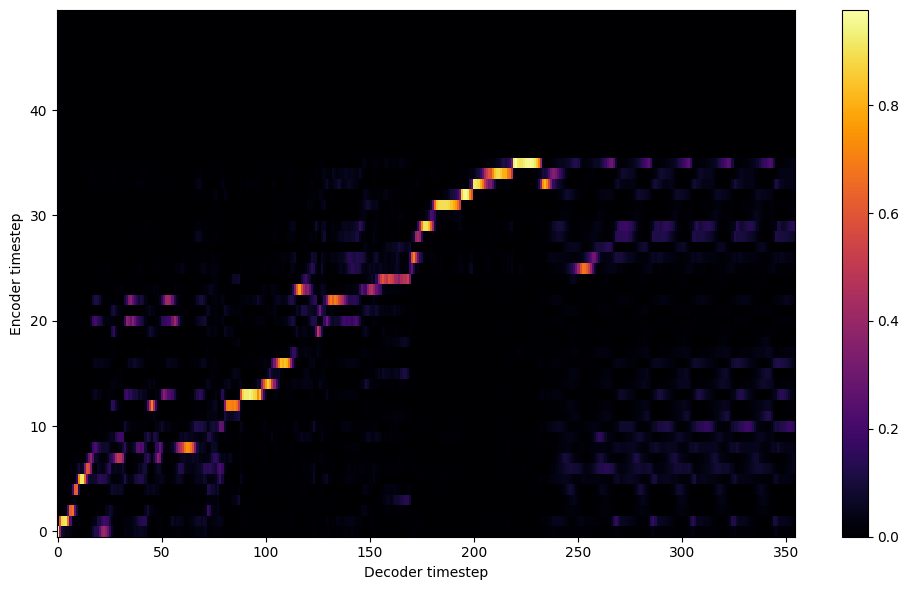


Starting Epoch: 123 Iteration: 1845


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 123 Validation loss 1860:  0.100431  Time: 0.4m LR: 0.000300


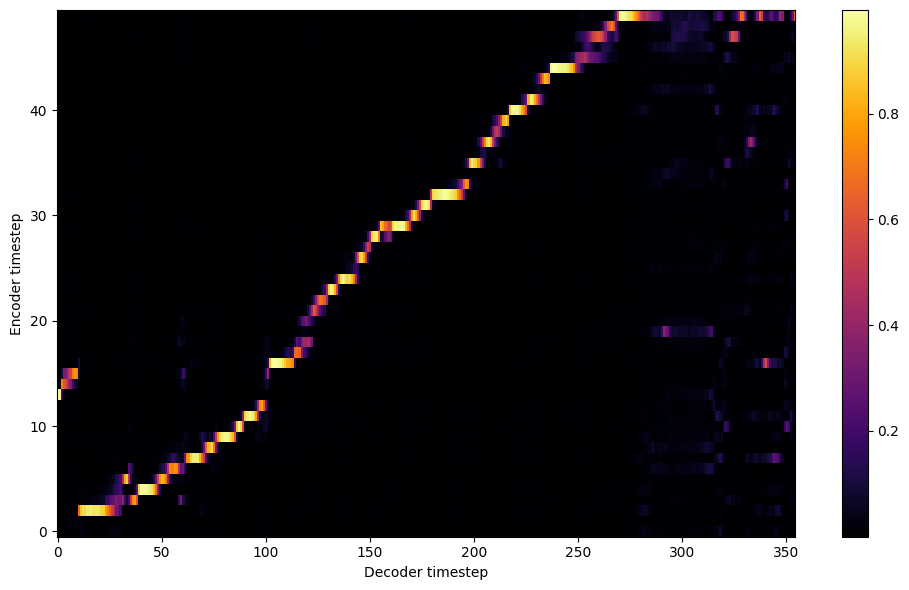


Starting Epoch: 124 Iteration: 1860


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 124 Validation loss 1875:  0.100686  Time: 0.4m LR: 0.000300


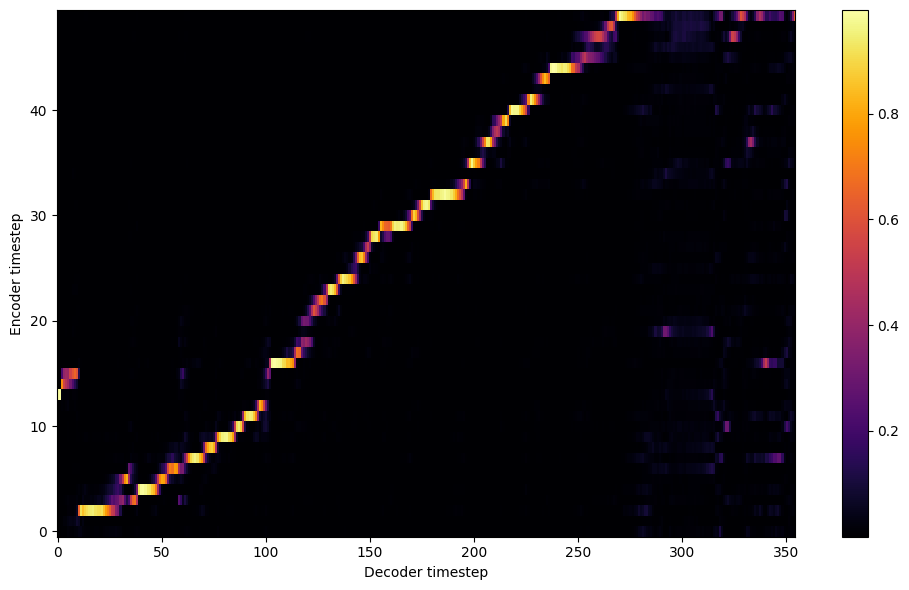


Starting Epoch: 125 Iteration: 1875


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 125 Validation loss 1890:  0.102104  Time: 0.4m LR: 0.000300


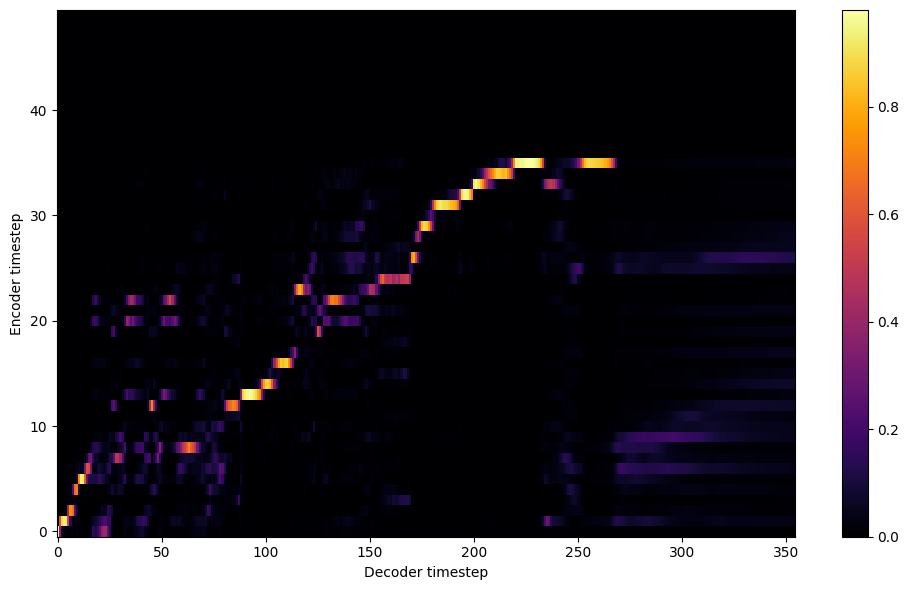


Starting Epoch: 126 Iteration: 1890


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 126 Validation loss 1905:  0.100685  Time: 0.4m LR: 0.000300


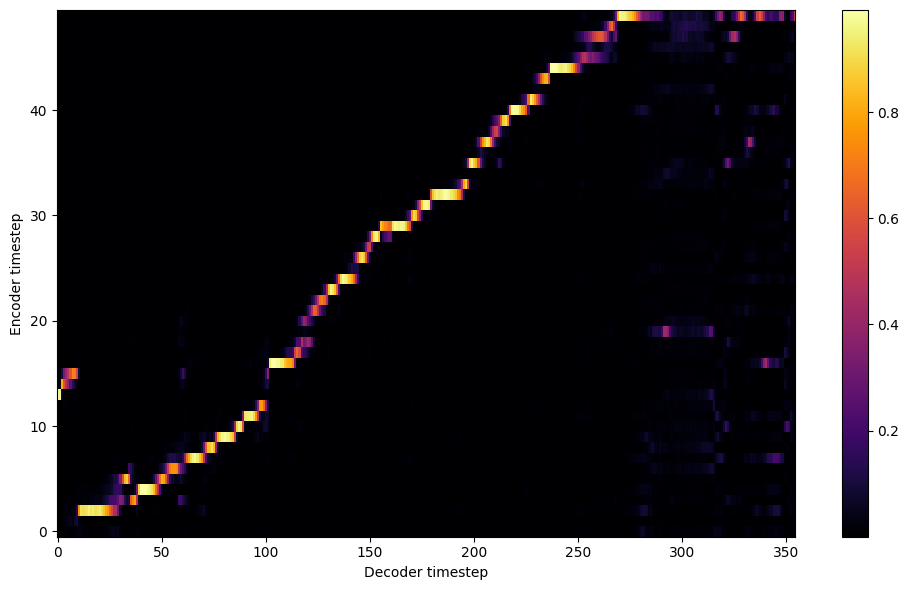


Starting Epoch: 127 Iteration: 1905


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 127 Validation loss 1920:  0.104163  Time: 0.3m LR: 0.000300


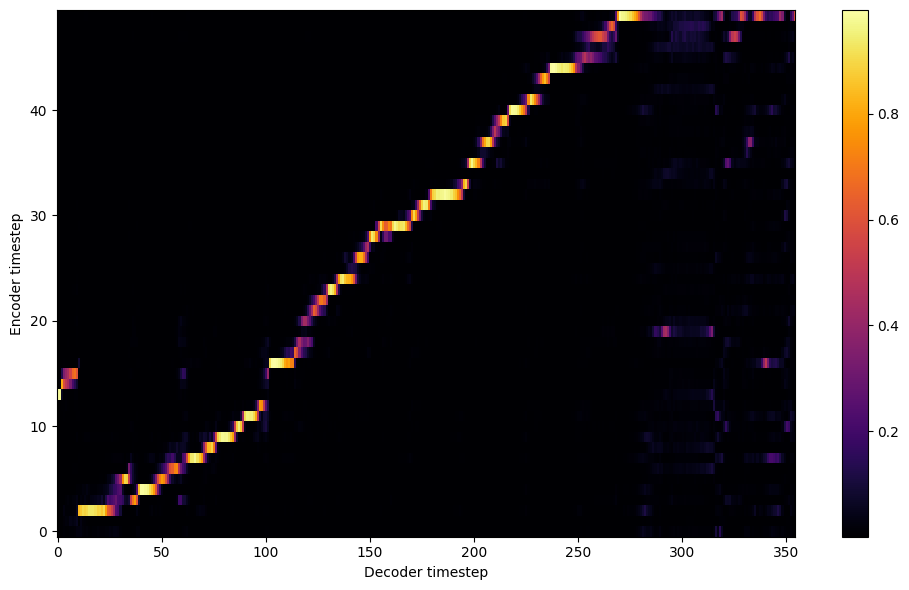


Starting Epoch: 128 Iteration: 1920


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 128 Validation loss 1935:  0.102578  Time: 0.4m LR: 0.000300


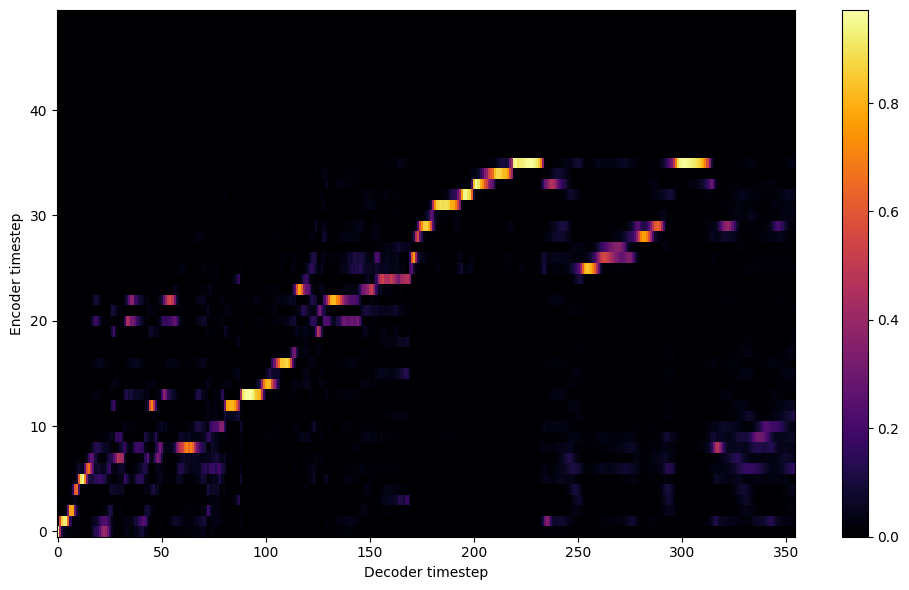


Starting Epoch: 129 Iteration: 1935


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 129 Validation loss 1950:  0.099872  Time: 0.4m LR: 0.000300


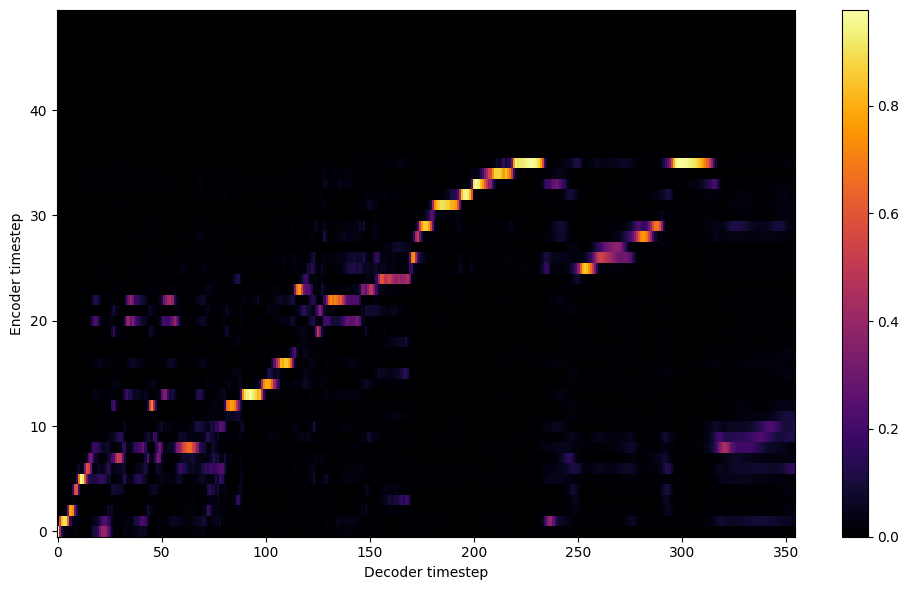

Saving model and optimizer state at iteration 1950 to /content/model//female_child
Model Saved

Starting Epoch: 130 Iteration: 1950


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 130 Validation loss 1965:  0.096848  Time: 0.4m LR: 0.000300


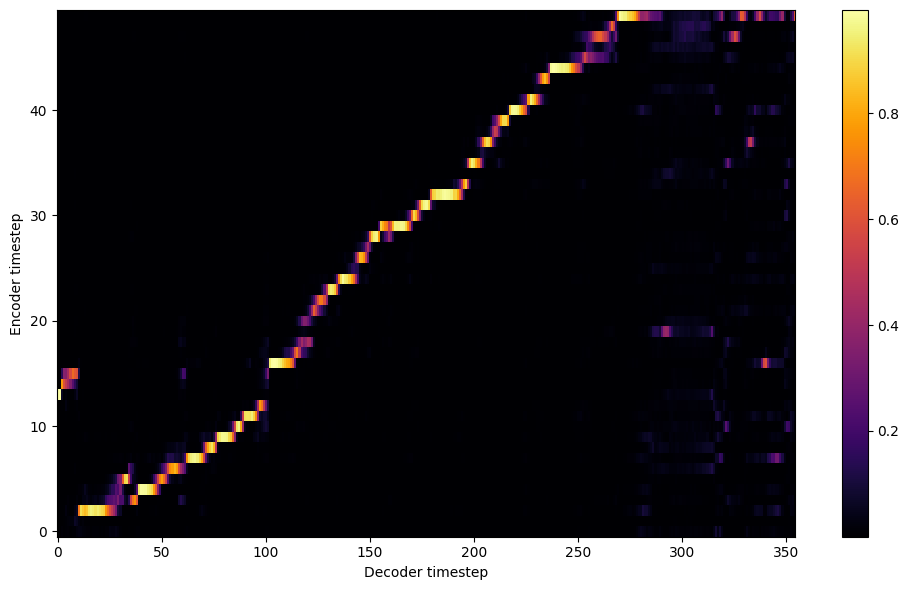


Starting Epoch: 131 Iteration: 1965


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 131 Validation loss 1980:  0.092621  Time: 0.4m LR: 0.000300


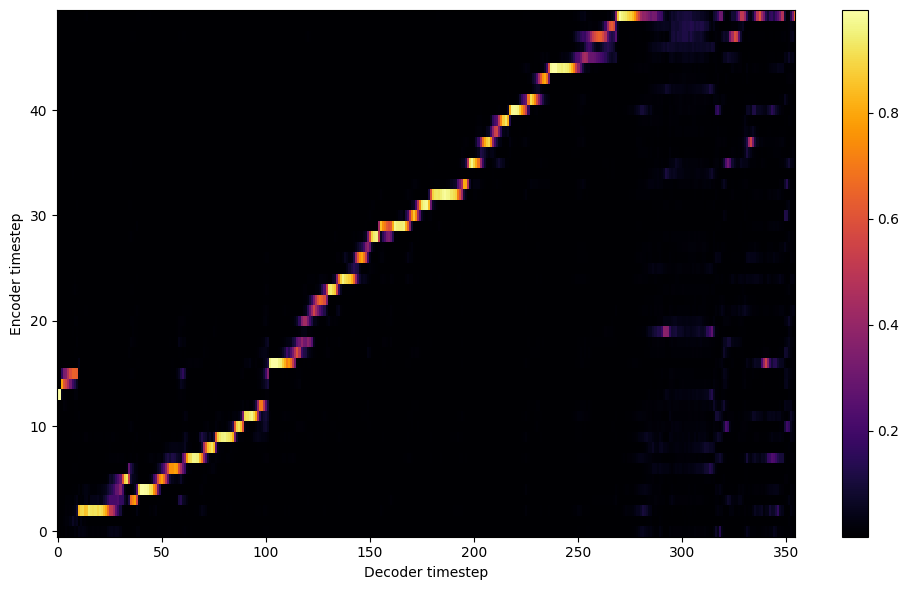


Starting Epoch: 132 Iteration: 1980


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 132 Validation loss 1995:  0.091624  Time: 0.3m LR: 0.000300


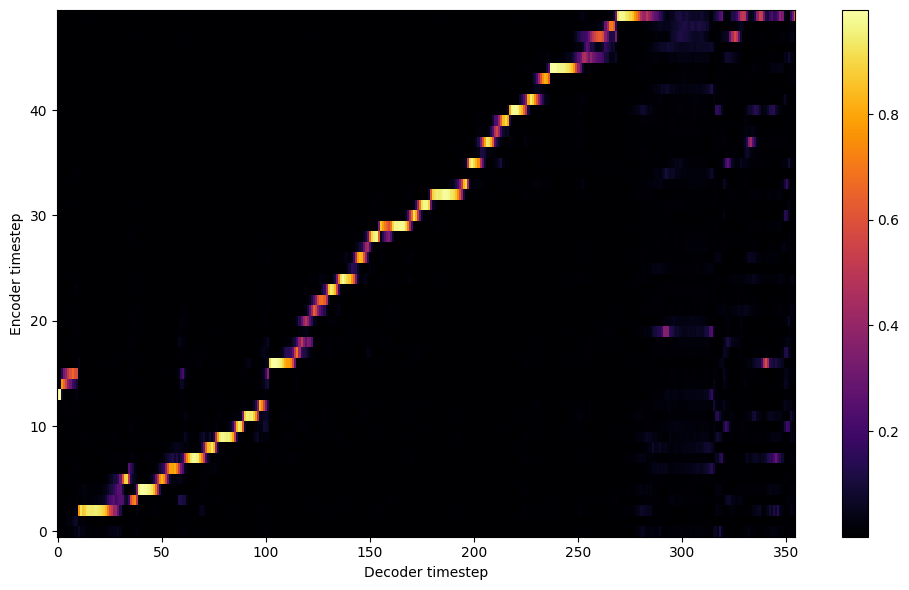


Starting Epoch: 133 Iteration: 1995


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 133 Validation loss 2010:  0.094097  Time: 0.4m LR: 0.000300


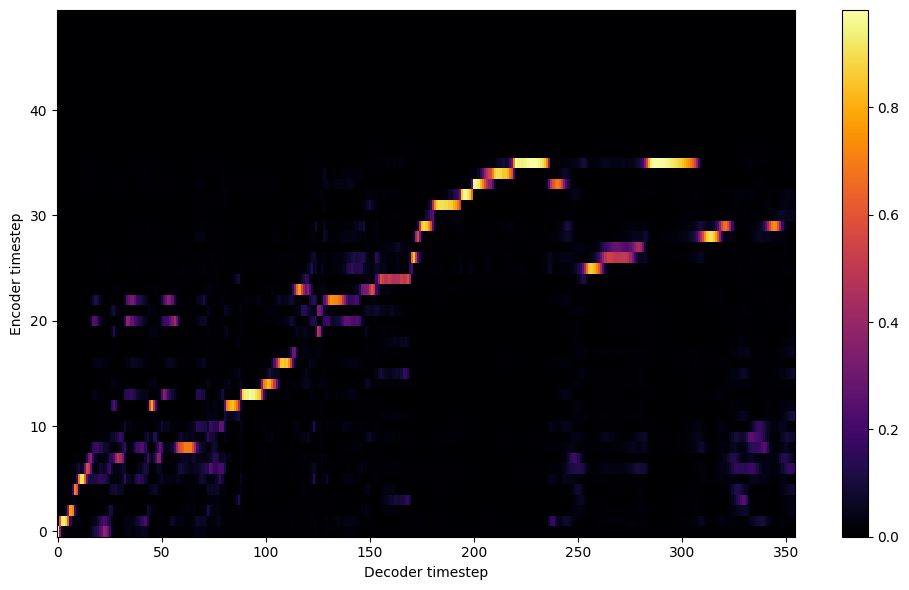


Starting Epoch: 134 Iteration: 2010


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 134 Validation loss 2025:  0.094502  Time: 0.4m LR: 0.000300


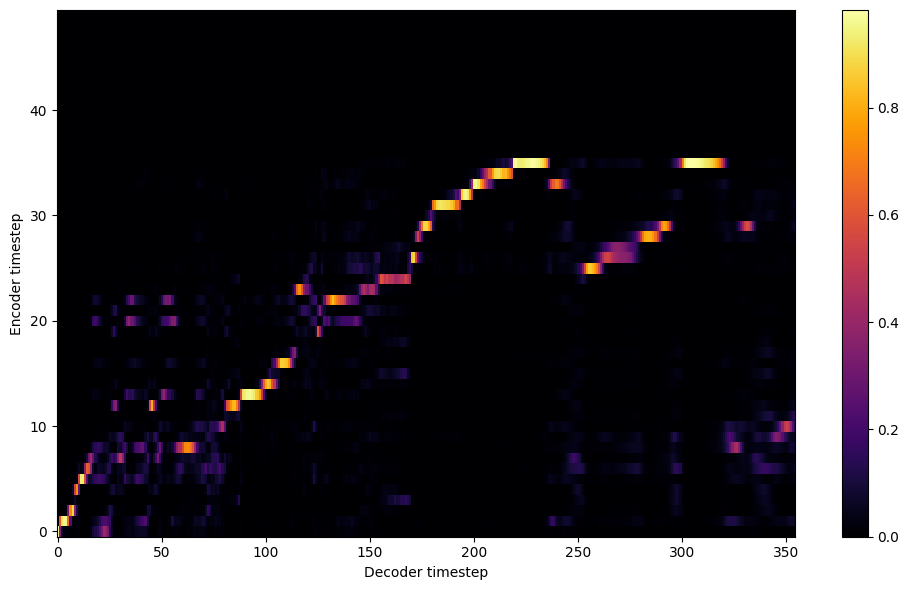


Starting Epoch: 135 Iteration: 2025


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 135 Validation loss 2040:  0.095991  Time: 0.4m LR: 0.000300


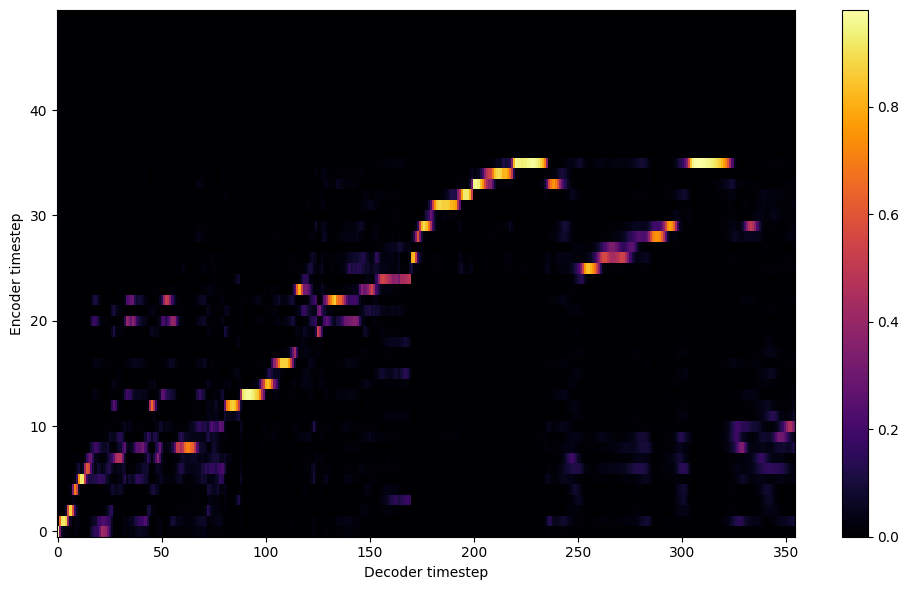


Starting Epoch: 136 Iteration: 2040


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 136 Validation loss 2055:  0.094124  Time: 0.4m LR: 0.000300


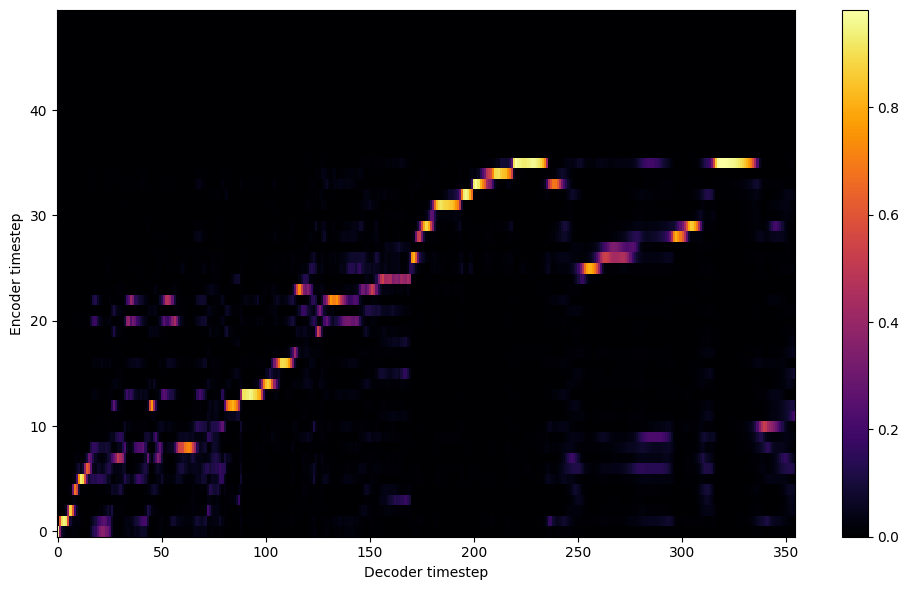


Starting Epoch: 137 Iteration: 2055


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 137 Validation loss 2070:  0.093811  Time: 0.4m LR: 0.000300


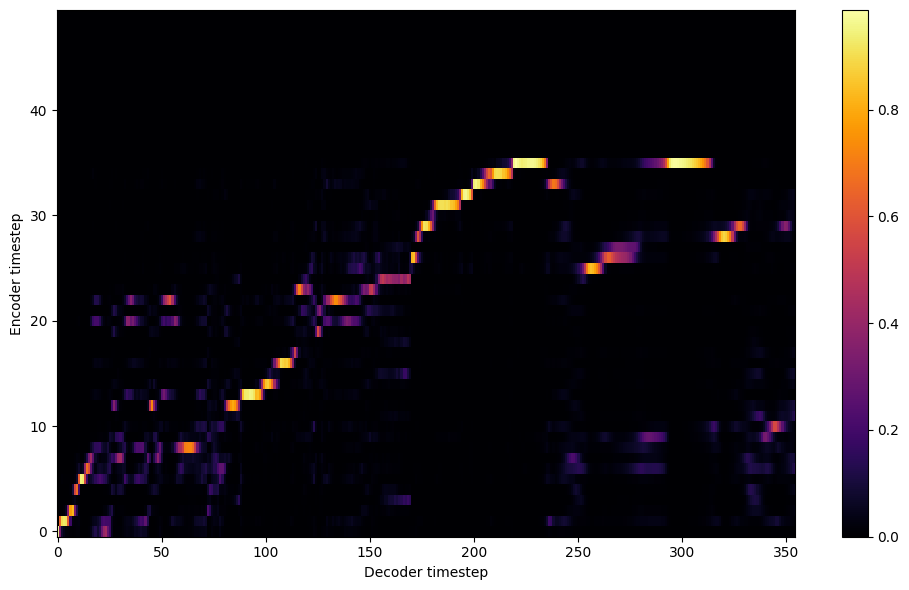


Starting Epoch: 138 Iteration: 2070


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 138 Validation loss 2085:  0.093074  Time: 0.4m LR: 0.000300


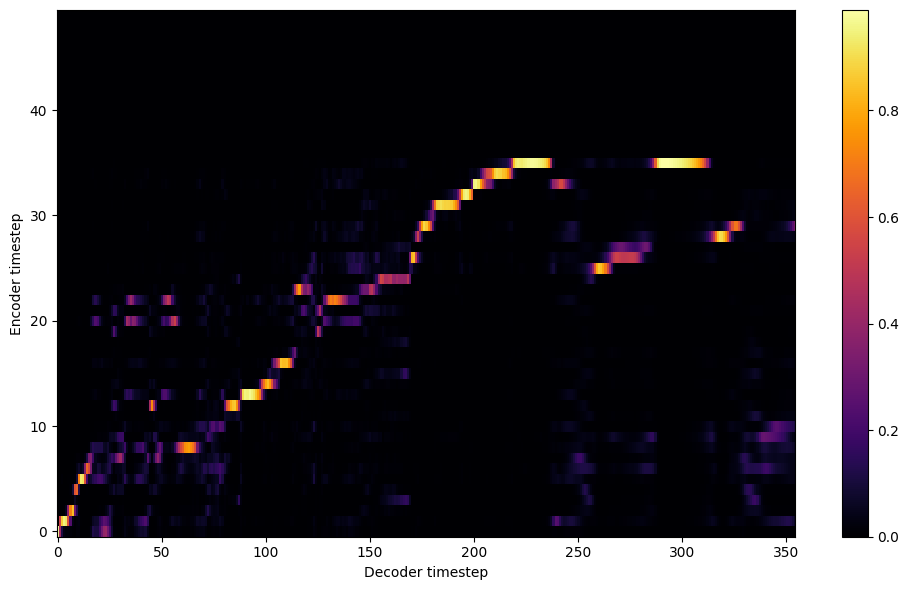


Starting Epoch: 139 Iteration: 2085


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 139 Validation loss 2100:  0.095099  Time: 0.3m LR: 0.000300


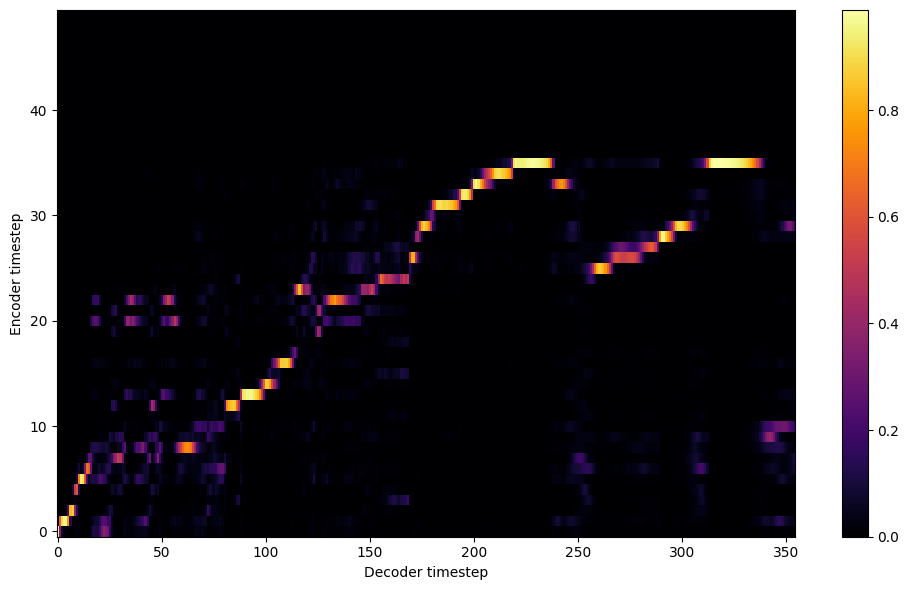

Saving model and optimizer state at iteration 2100 to /content/model//female_child
Model Saved

Starting Epoch: 140 Iteration: 2100


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 140 Validation loss 2115:  0.093409  Time: 0.4m LR: 0.000300


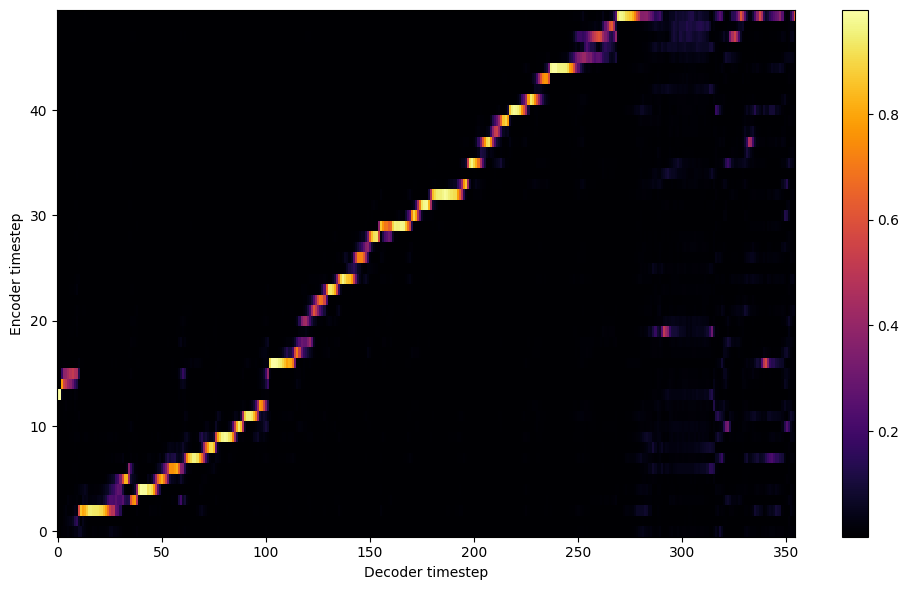


Starting Epoch: 141 Iteration: 2115


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 141 Validation loss 2130:  0.093198  Time: 0.4m LR: 0.000300


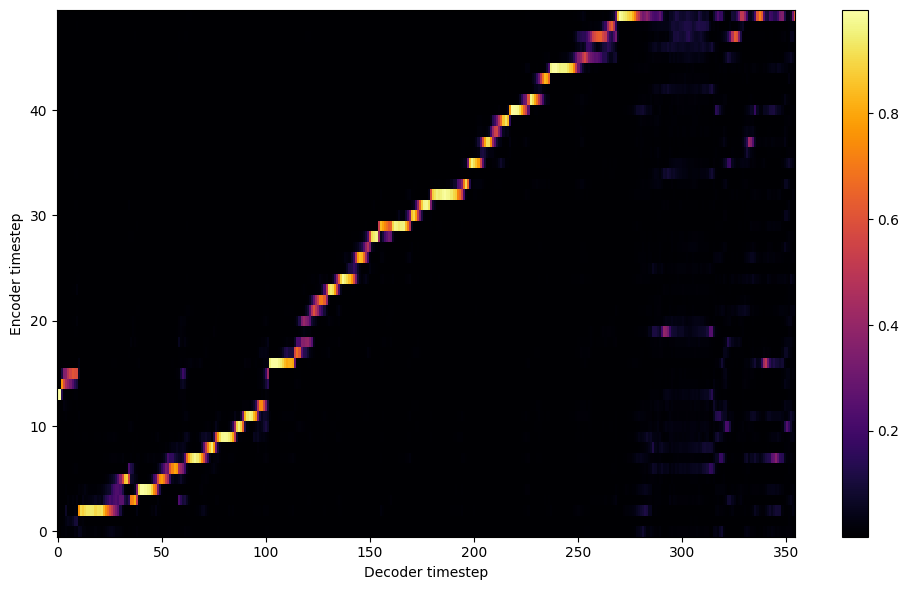


Starting Epoch: 142 Iteration: 2130


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 142 Validation loss 2145:  0.090882  Time: 0.4m LR: 0.000300


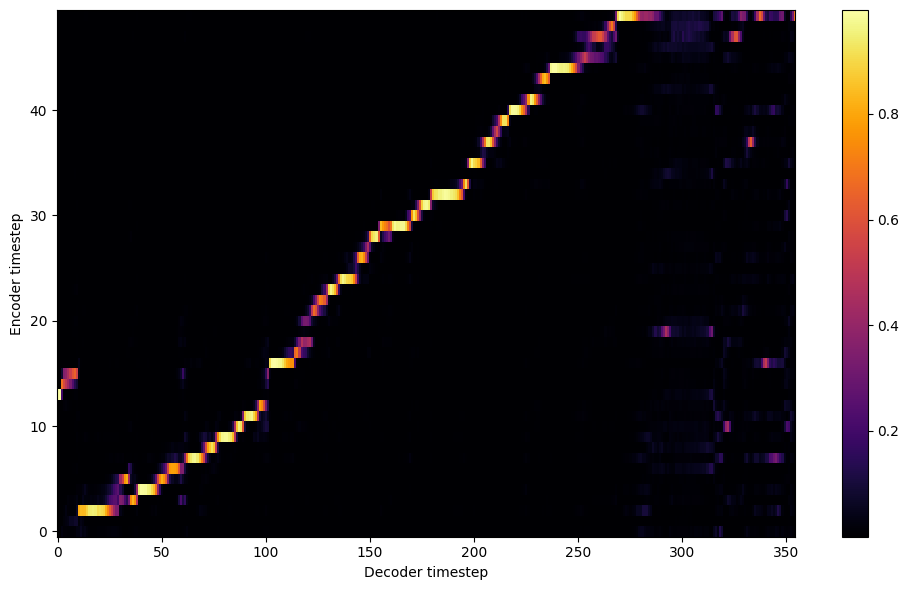


Starting Epoch: 143 Iteration: 2145


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 143 Validation loss 2160:  0.089853  Time: 0.4m LR: 0.000300


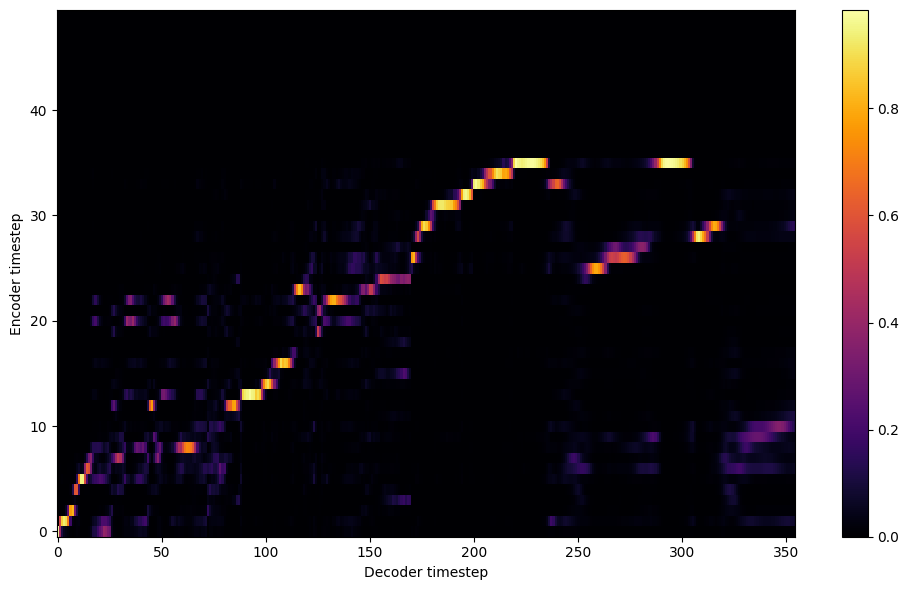


Starting Epoch: 144 Iteration: 2160


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 144 Validation loss 2175:  0.089165  Time: 0.4m LR: 0.000300


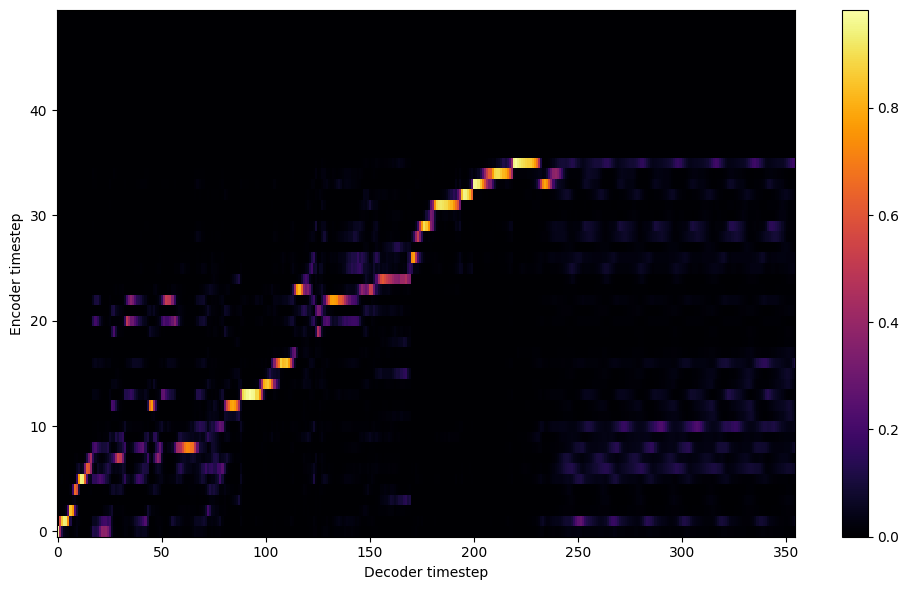


Starting Epoch: 145 Iteration: 2175


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 145 Validation loss 2190:  0.088962  Time: 0.4m LR: 0.000300


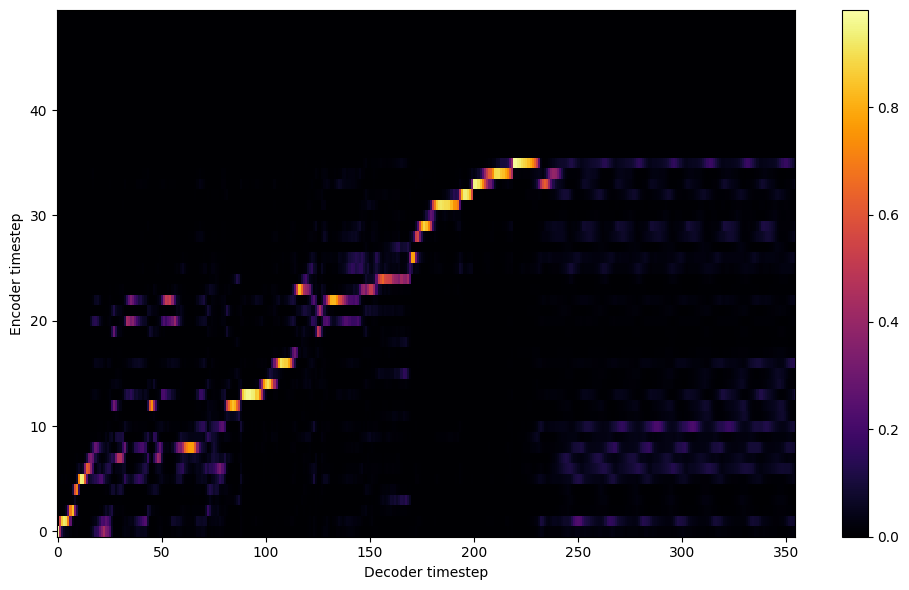


Starting Epoch: 146 Iteration: 2190


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 146 Validation loss 2205:  0.088969  Time: 0.4m LR: 0.000300


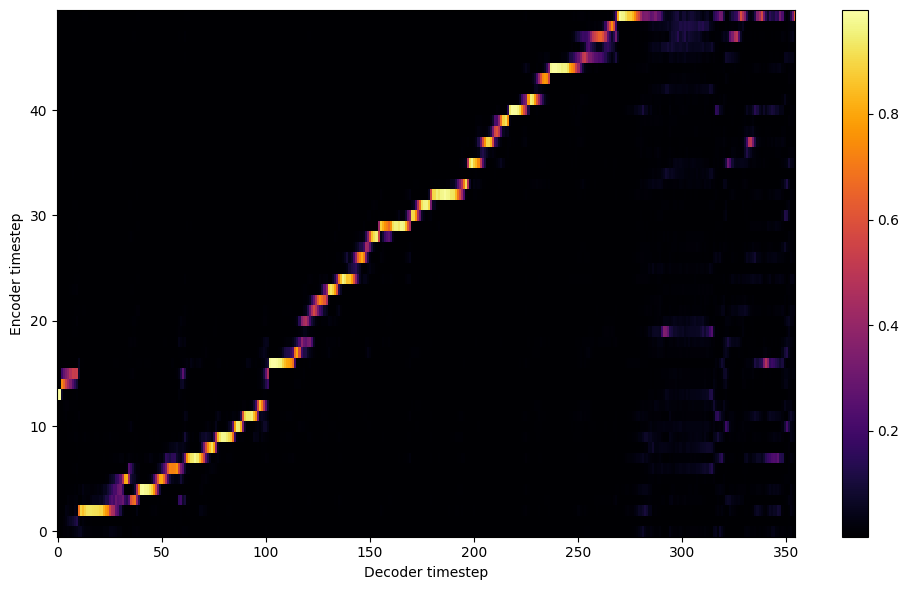


Starting Epoch: 147 Iteration: 2205


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 147 Validation loss 2220:  0.086768  Time: 0.4m LR: 0.000300


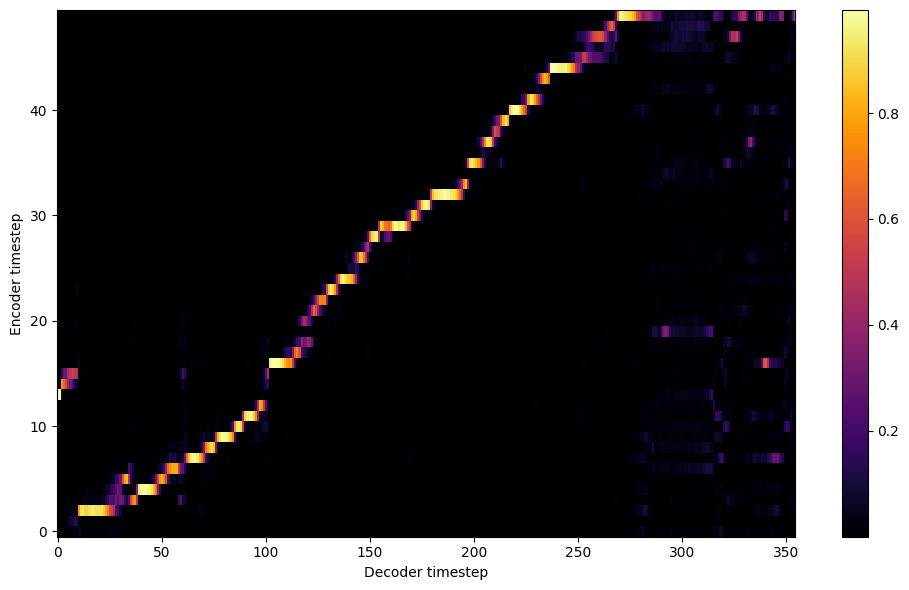


Starting Epoch: 148 Iteration: 2220


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 148 Validation loss 2235:  0.085301  Time: 0.4m LR: 0.000300


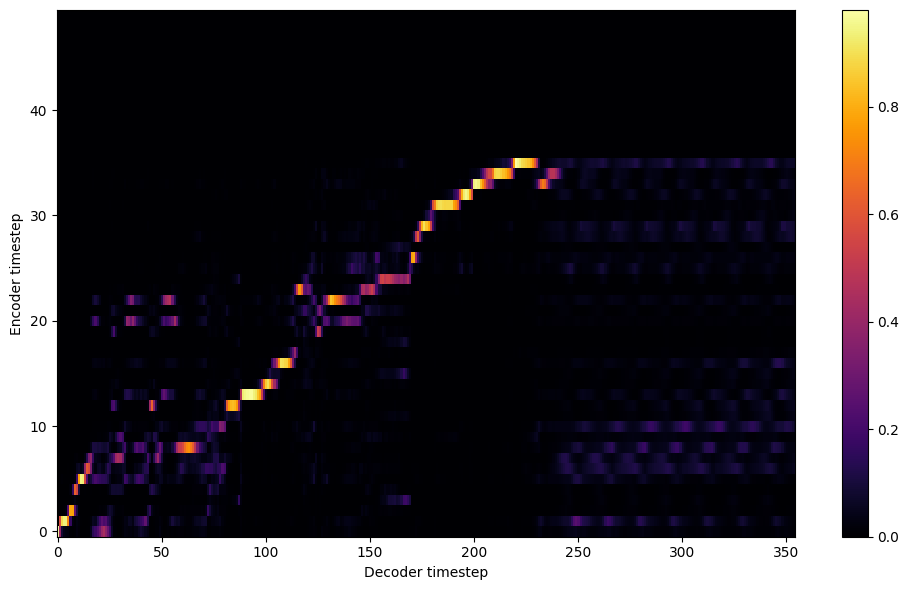


Starting Epoch: 149 Iteration: 2235


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 149 Validation loss 2250:  0.086701  Time: 0.4m LR: 0.000300


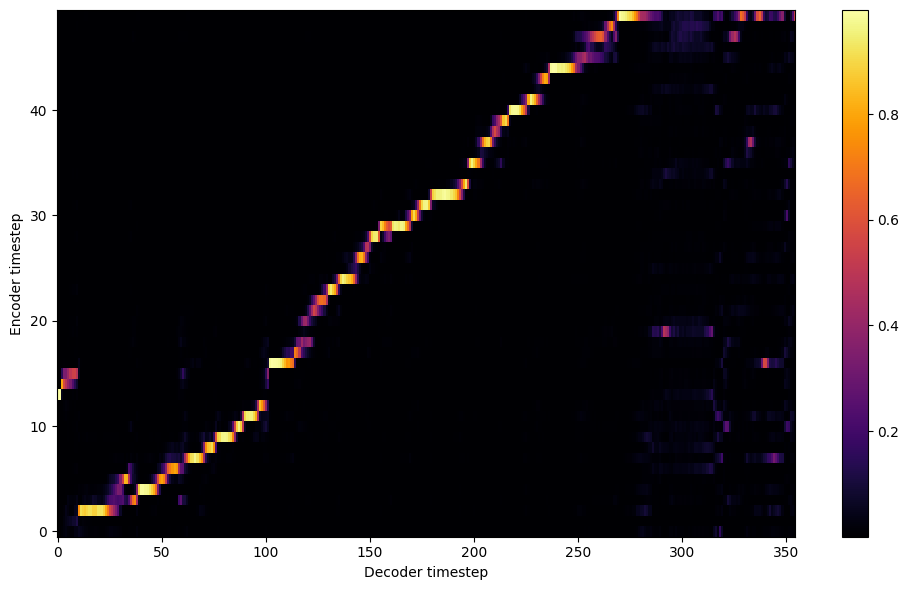

Saving model and optimizer state at iteration 2250 to /content/model//female_child
Model Saved

Starting Epoch: 150 Iteration: 2250


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 150 Validation loss 2265:  0.086535  Time: 0.4m LR: 0.000300


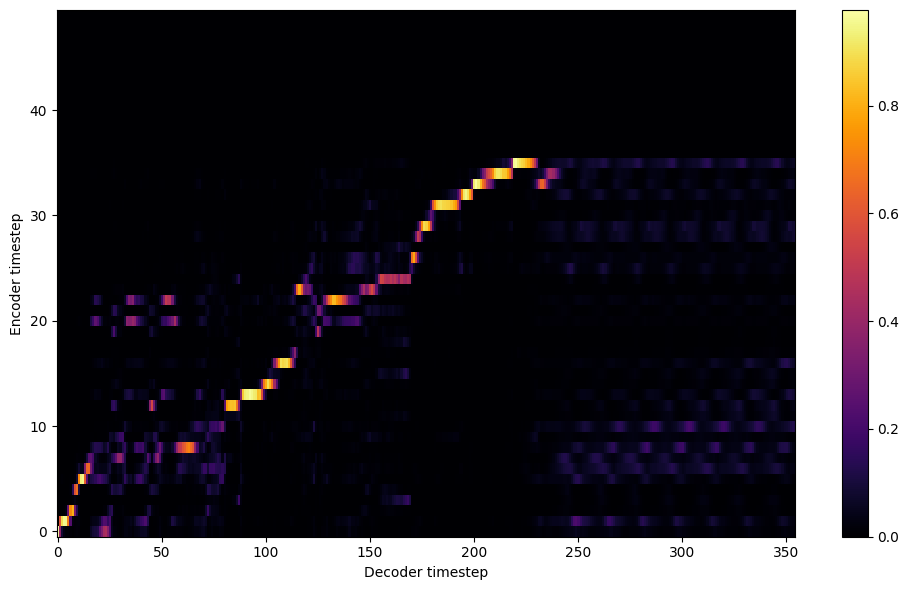


Starting Epoch: 151 Iteration: 2265


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 151 Validation loss 2280:  0.085892  Time: 0.4m LR: 0.000300


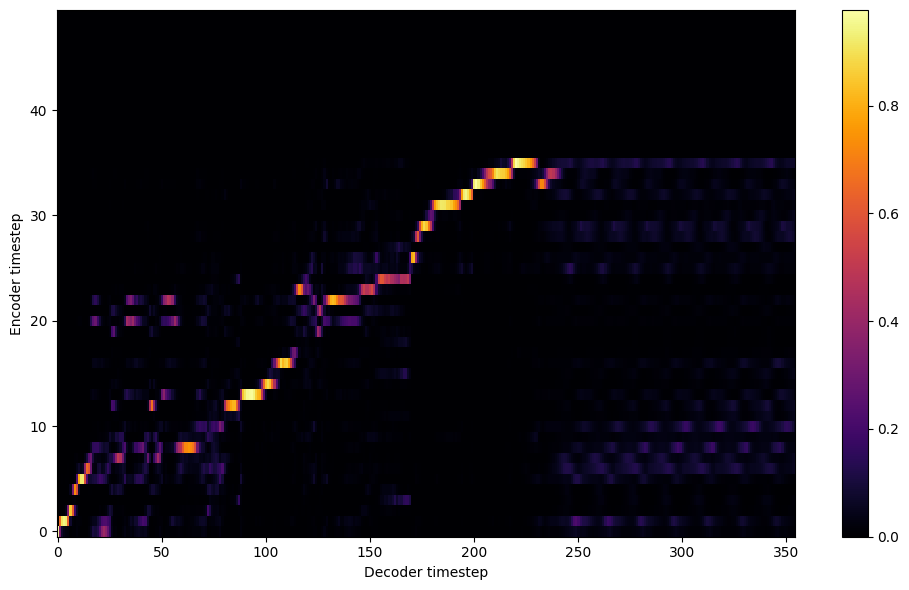


Starting Epoch: 152 Iteration: 2280


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 152 Validation loss 2295:  0.089244  Time: 0.4m LR: 0.000300


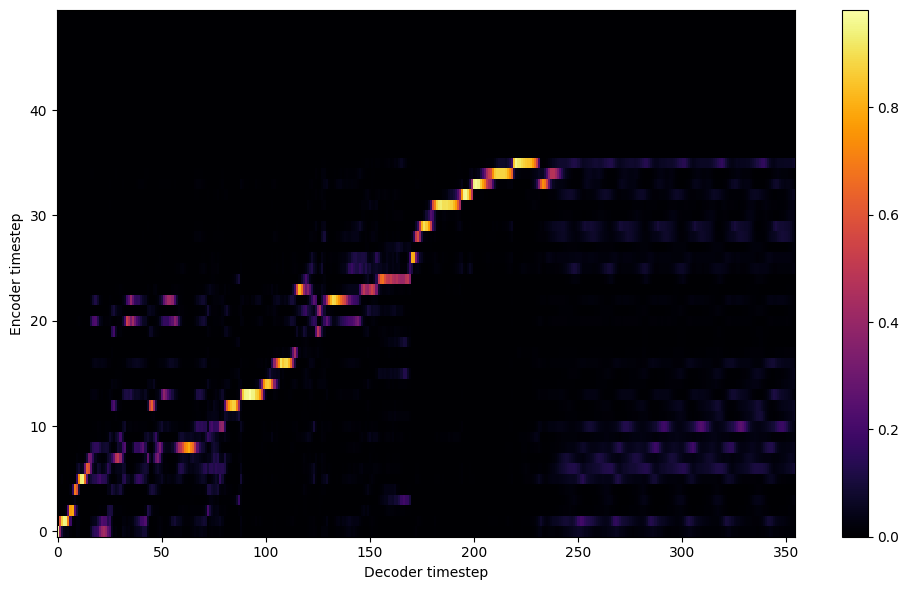


Starting Epoch: 153 Iteration: 2295


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 153 Validation loss 2310:  0.090121  Time: 0.4m LR: 0.000300


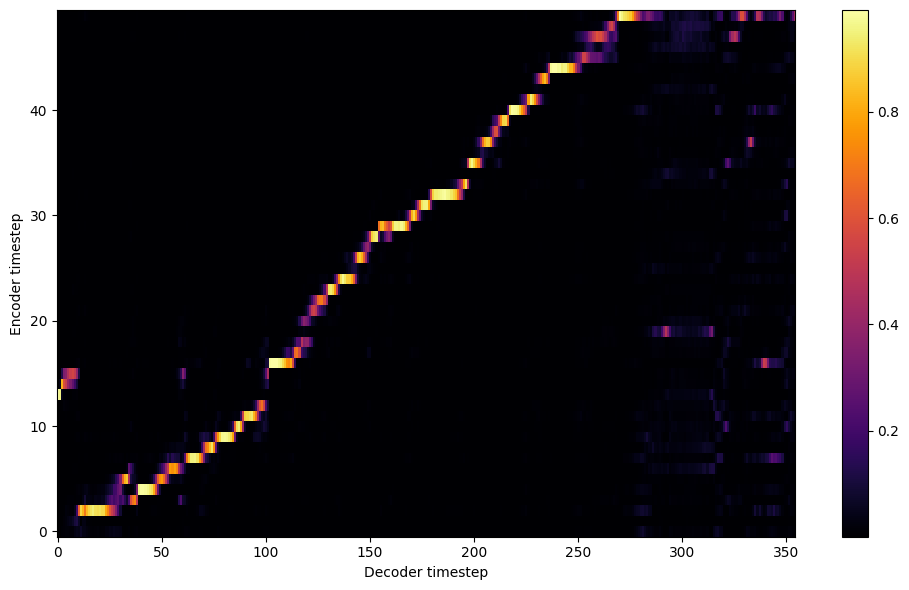


Starting Epoch: 154 Iteration: 2310


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 154 Validation loss 2325:  0.088285  Time: 0.4m LR: 0.000300


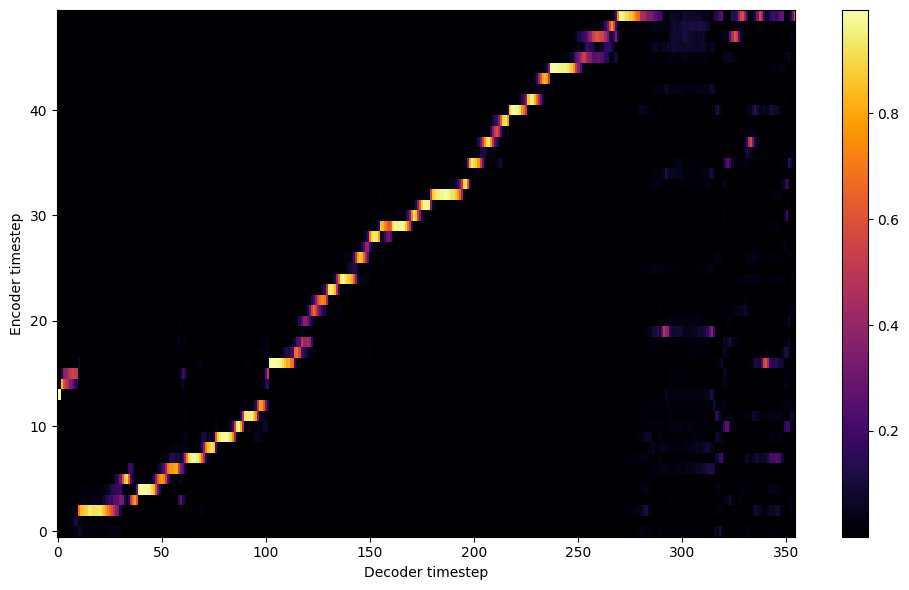


Starting Epoch: 155 Iteration: 2325


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 155 Validation loss 2340:  0.086201  Time: 0.4m LR: 0.000300


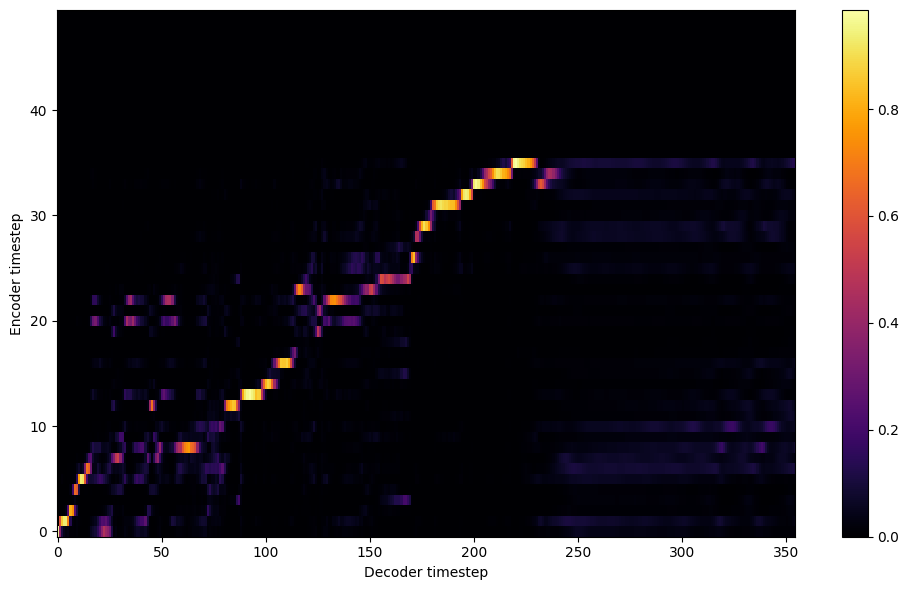


Starting Epoch: 156 Iteration: 2340


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 156 Validation loss 2355:  0.081922  Time: 0.4m LR: 0.000300


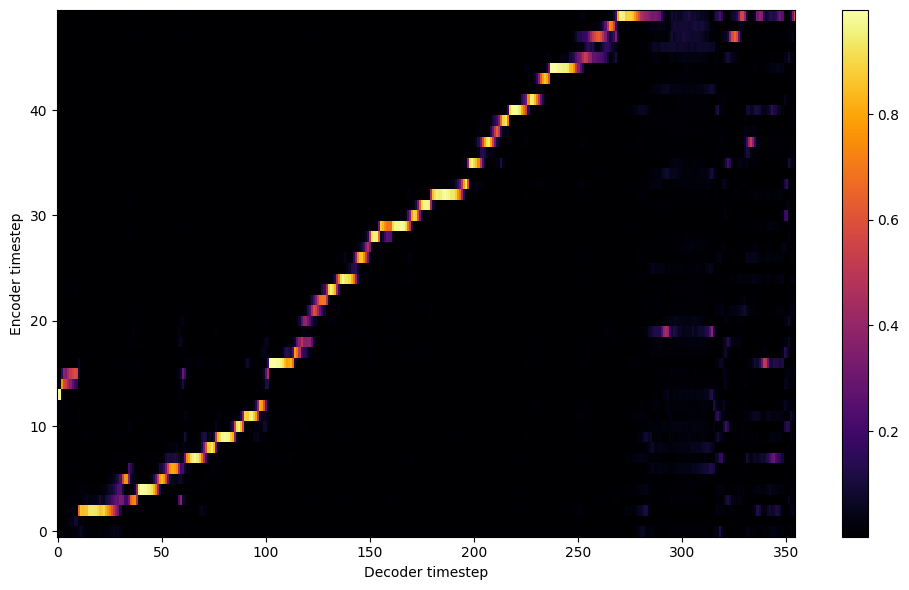


Starting Epoch: 157 Iteration: 2355


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 157 Validation loss 2370:  0.086932  Time: 0.4m LR: 0.000300


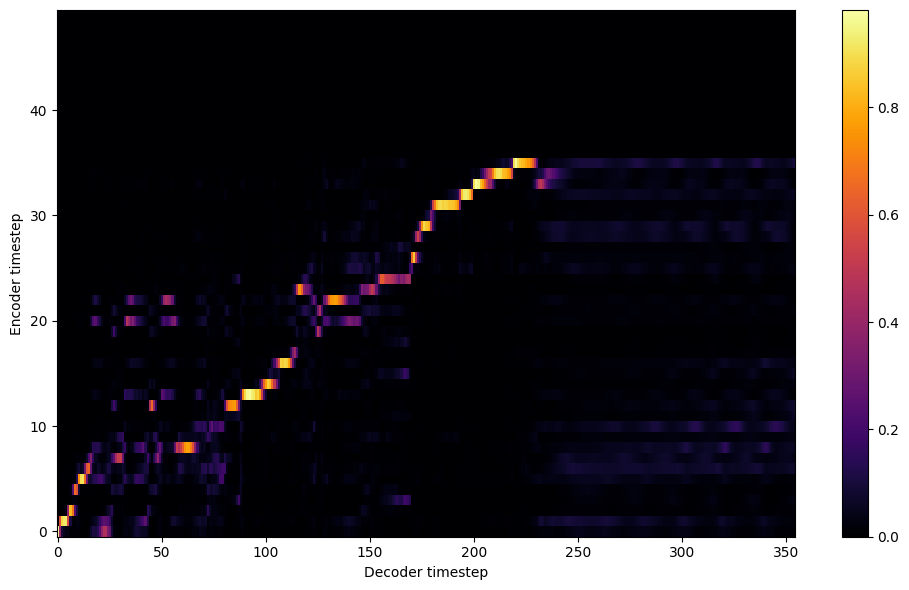


Starting Epoch: 158 Iteration: 2370


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 158 Validation loss 2385:  0.089786  Time: 0.4m LR: 0.000300


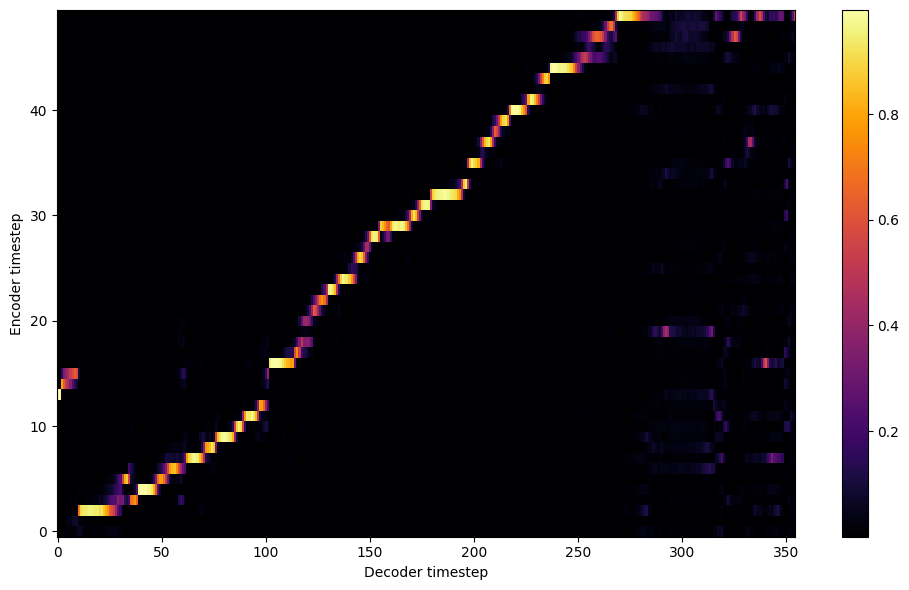


Starting Epoch: 159 Iteration: 2385


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 159 Validation loss 2400:  0.090729  Time: 0.4m LR: 0.000300


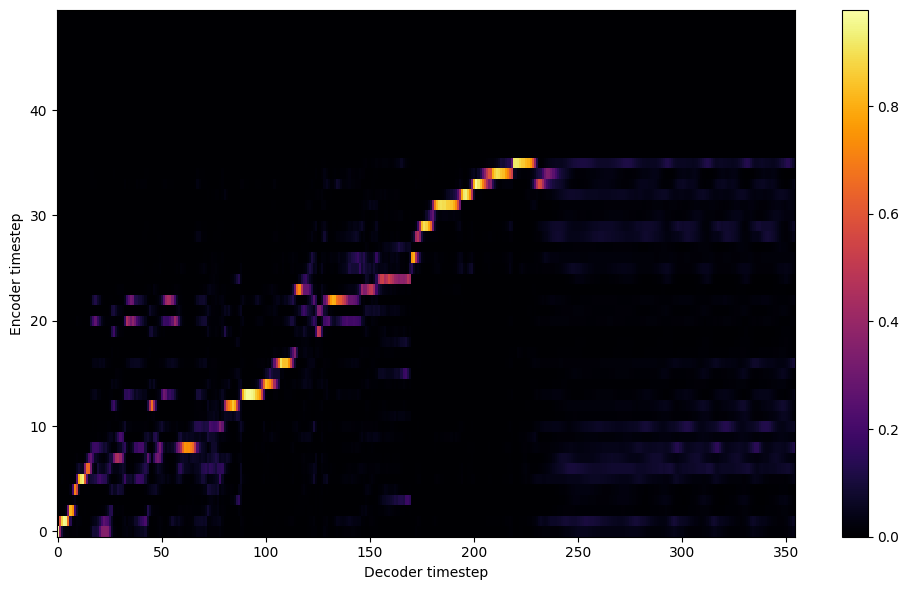

Saving model and optimizer state at iteration 2400 to /content/model//female_child
Model Saved

Starting Epoch: 160 Iteration: 2400


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 160 Validation loss 2415:  0.087574  Time: 0.4m LR: 0.000300


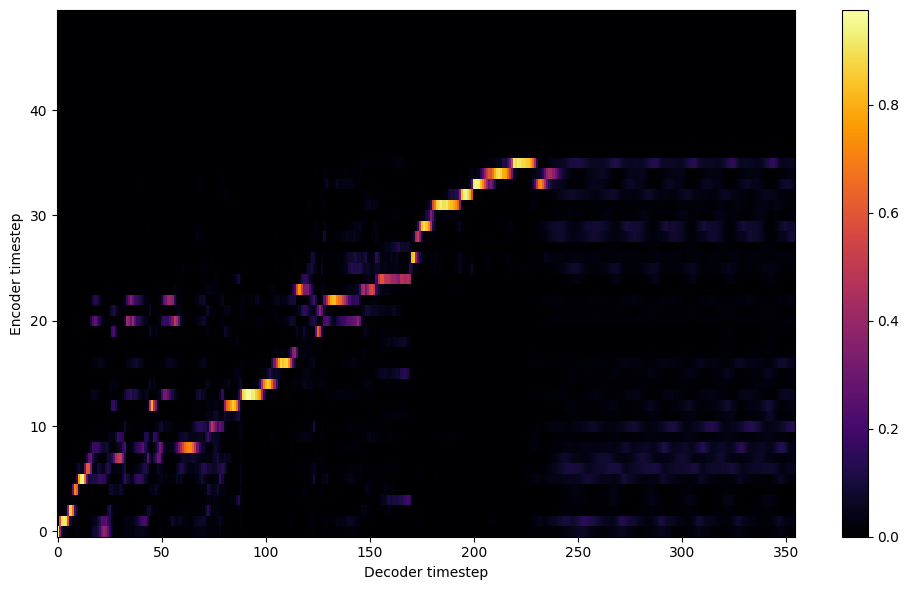


Starting Epoch: 161 Iteration: 2415


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 161 Validation loss 2430:  0.086447  Time: 0.4m LR: 0.000300


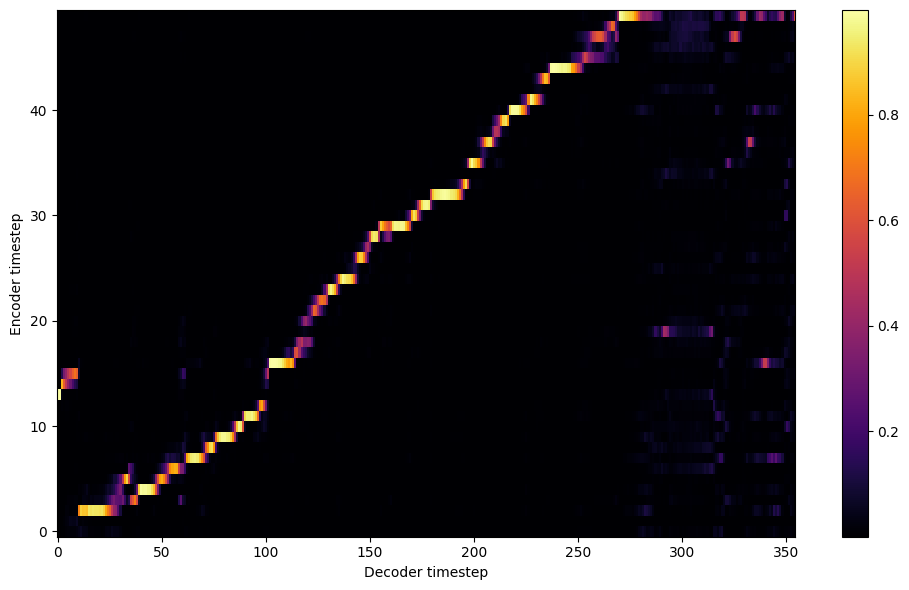


Starting Epoch: 162 Iteration: 2430


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 162 Validation loss 2445:  0.084007  Time: 0.4m LR: 0.000300


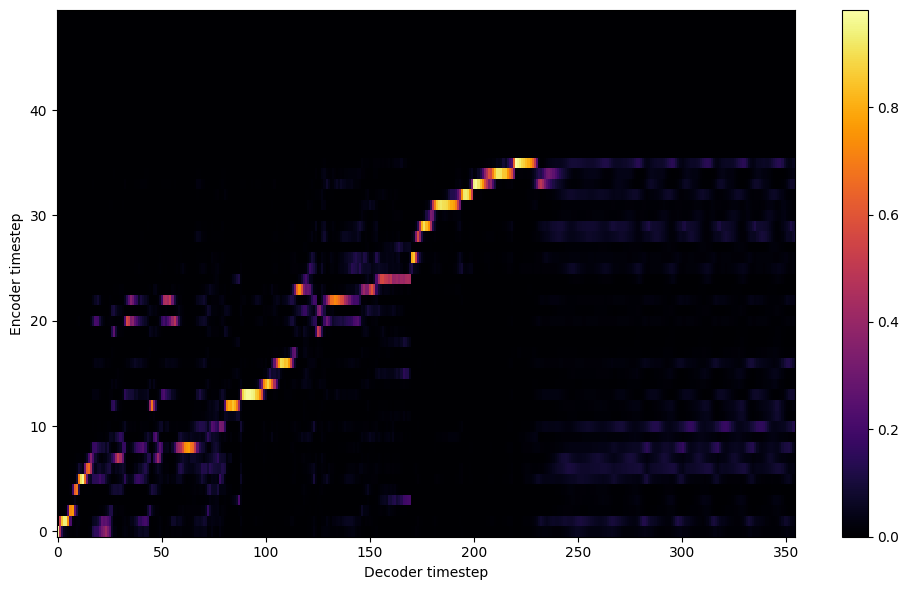


Starting Epoch: 163 Iteration: 2445


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 163 Validation loss 2460:  0.081231  Time: 0.4m LR: 0.000300


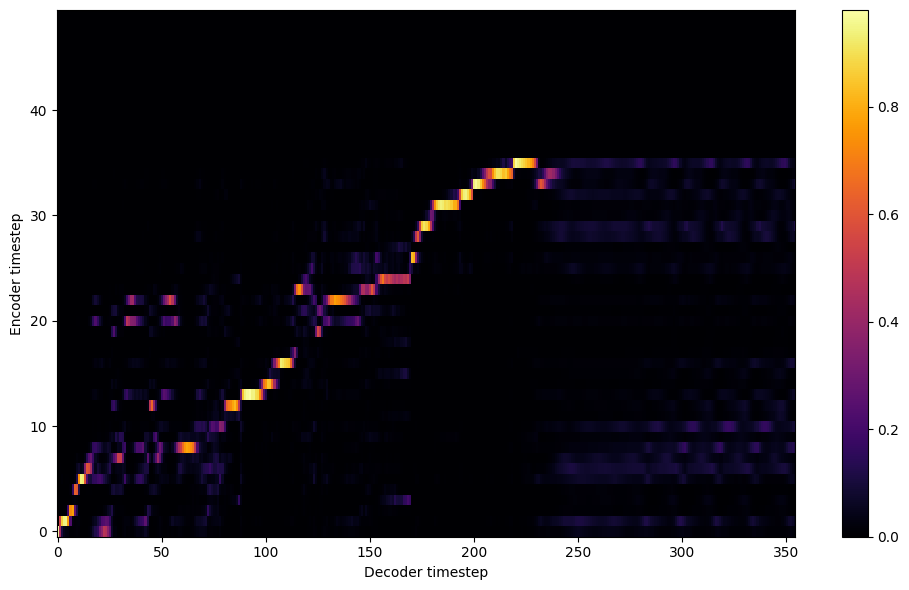


Starting Epoch: 164 Iteration: 2460


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 164 Validation loss 2475:  0.080771  Time: 0.4m LR: 0.000300


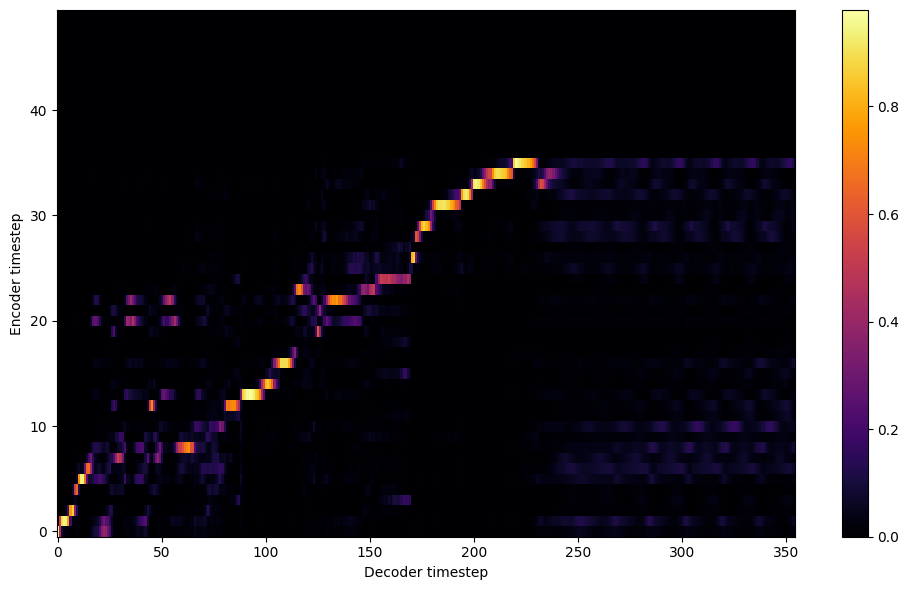


Starting Epoch: 165 Iteration: 2475


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 165 Validation loss 2490:  0.079945  Time: 0.4m LR: 0.000300


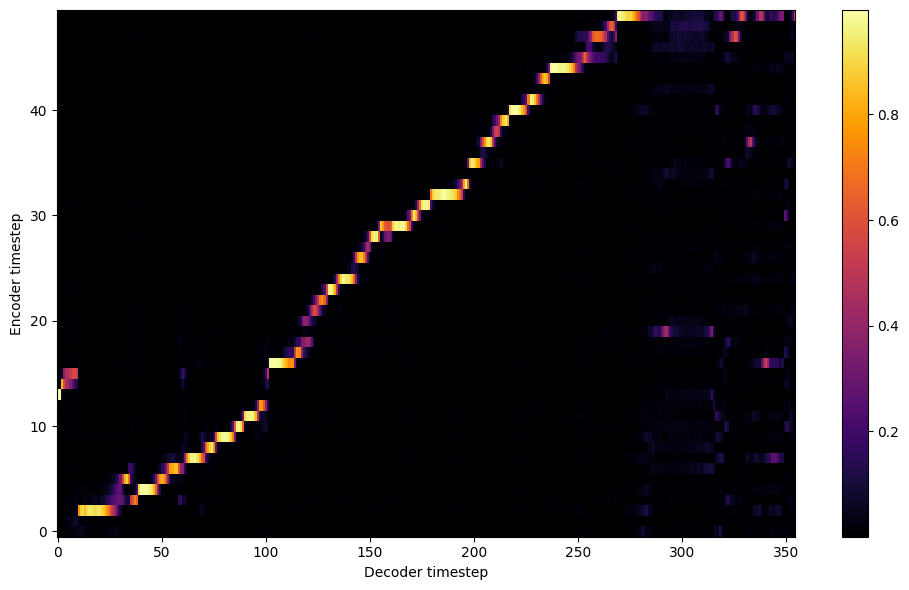


Starting Epoch: 166 Iteration: 2490


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 166 Validation loss 2505:  0.079738  Time: 0.4m LR: 0.000300


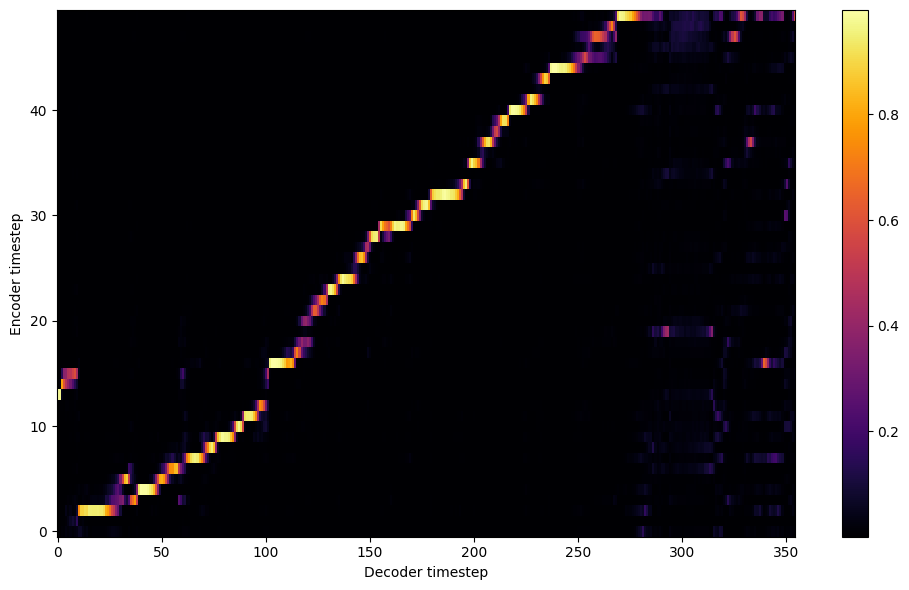


Starting Epoch: 167 Iteration: 2505


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 167 Validation loss 2520:  0.078328  Time: 0.4m LR: 0.000300


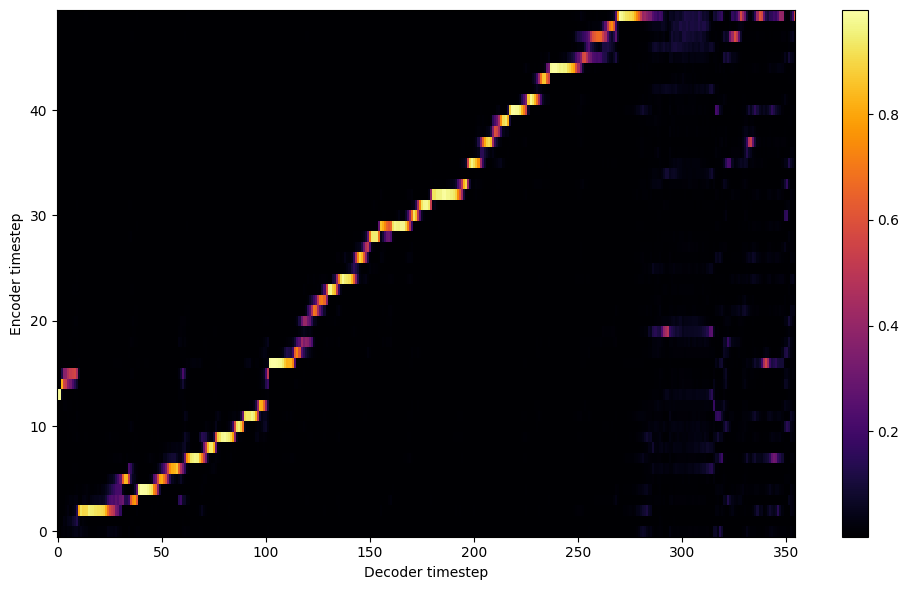


Starting Epoch: 168 Iteration: 2520


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 168 Validation loss 2535:  0.084288  Time: 0.4m LR: 0.000300


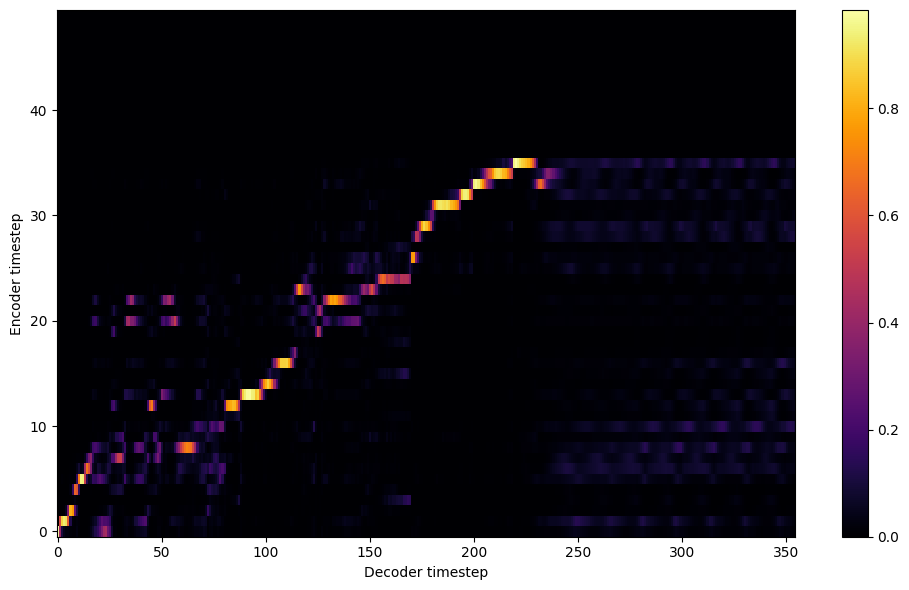


Starting Epoch: 169 Iteration: 2535


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 169 Validation loss 2550:  0.083822  Time: 0.4m LR: 0.000300


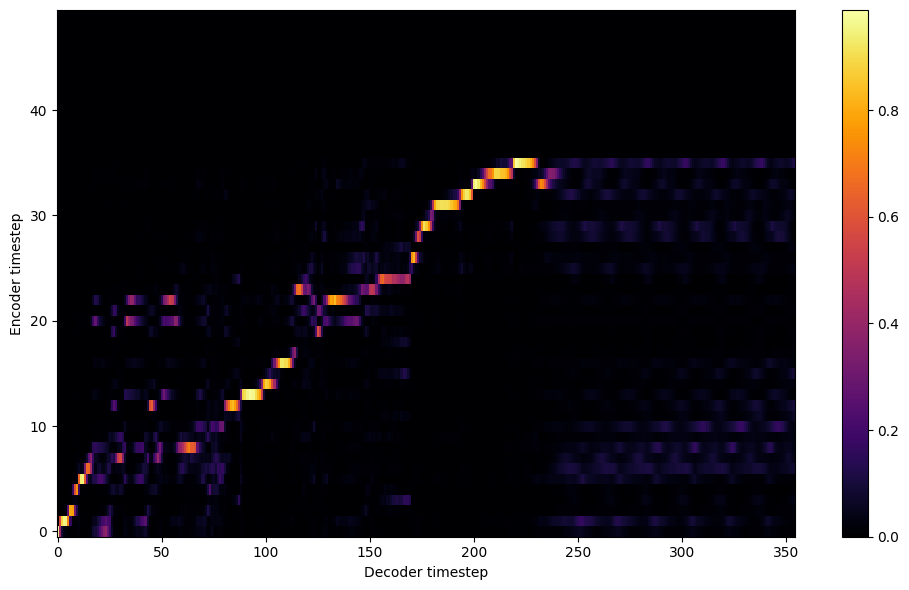

Saving model and optimizer state at iteration 2550 to /content/model//female_child
Model Saved

Starting Epoch: 170 Iteration: 2550


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 170 Validation loss 2565:  0.079514  Time: 0.4m LR: 0.000300


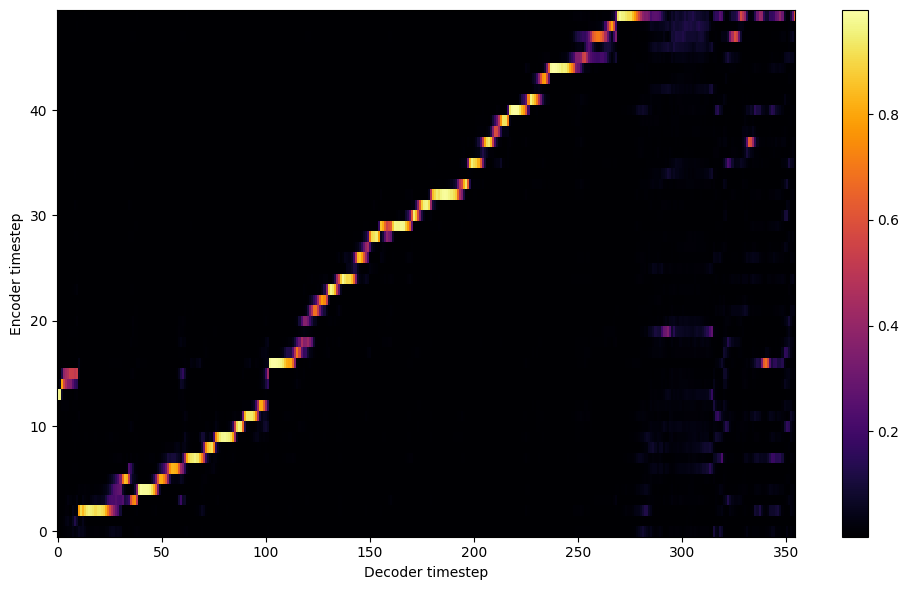


Starting Epoch: 171 Iteration: 2565


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 171 Validation loss 2580:  0.081474  Time: 0.4m LR: 0.000300


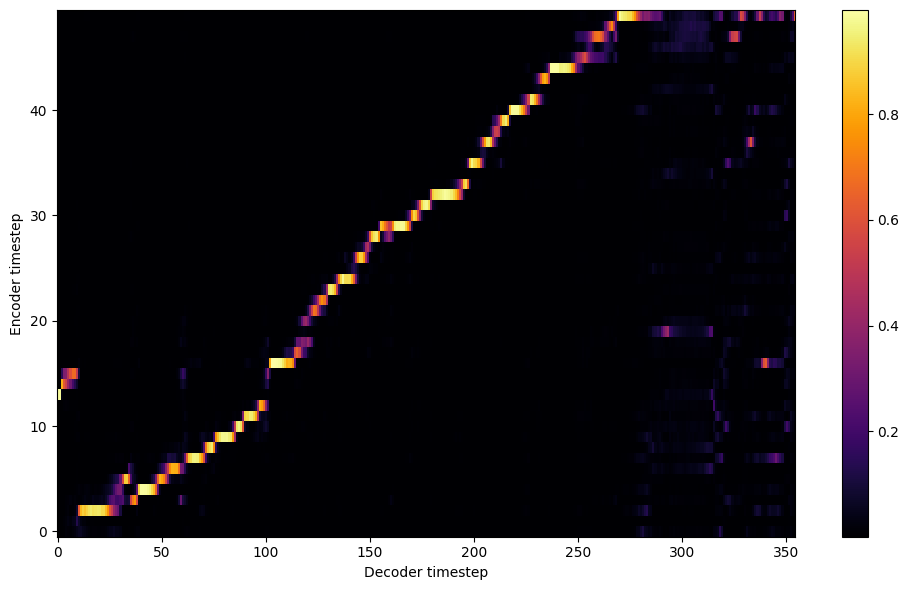


Starting Epoch: 172 Iteration: 2580


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 172 Validation loss 2595:  0.079091  Time: 0.4m LR: 0.000300


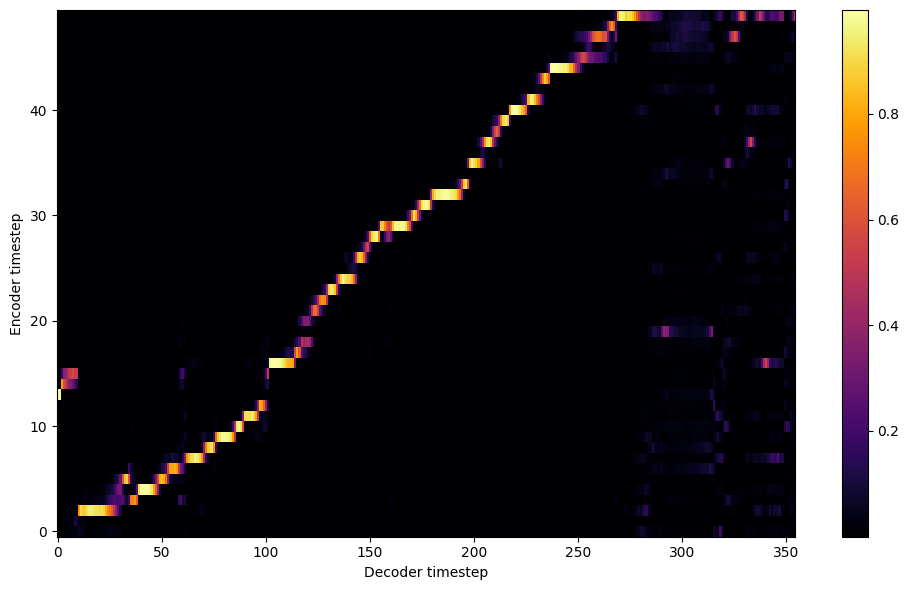


Starting Epoch: 173 Iteration: 2595


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 173 Validation loss 2610:  0.078943  Time: 0.4m LR: 0.000300


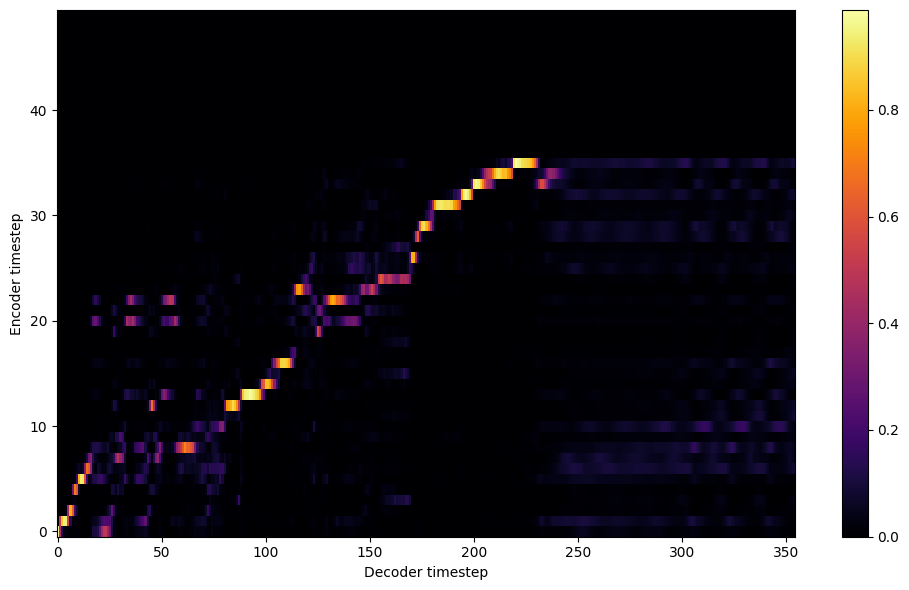


Starting Epoch: 174 Iteration: 2610


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 174 Validation loss 2625:  0.076524  Time: 0.4m LR: 0.000300


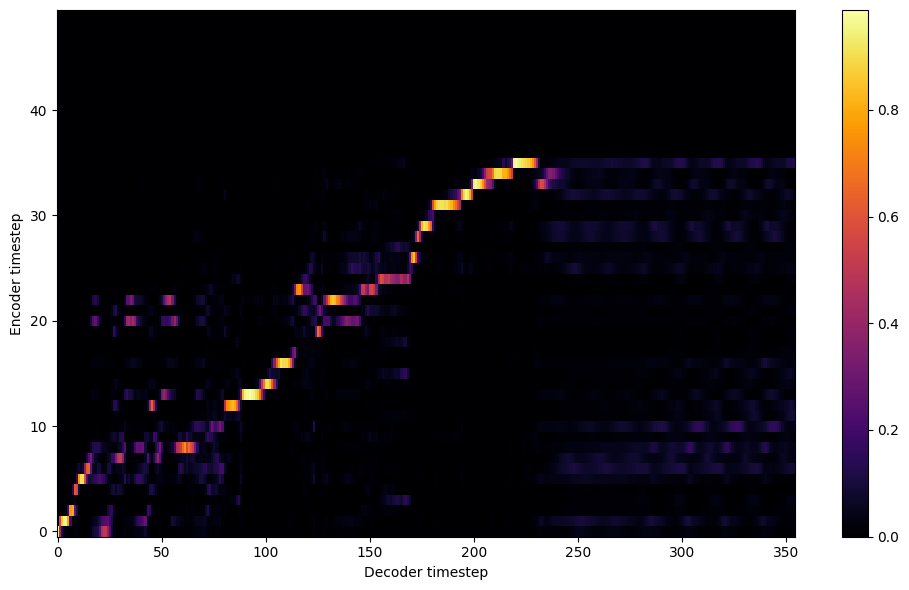


Starting Epoch: 175 Iteration: 2625


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 175 Validation loss 2640:  0.077038  Time: 0.4m LR: 0.000300


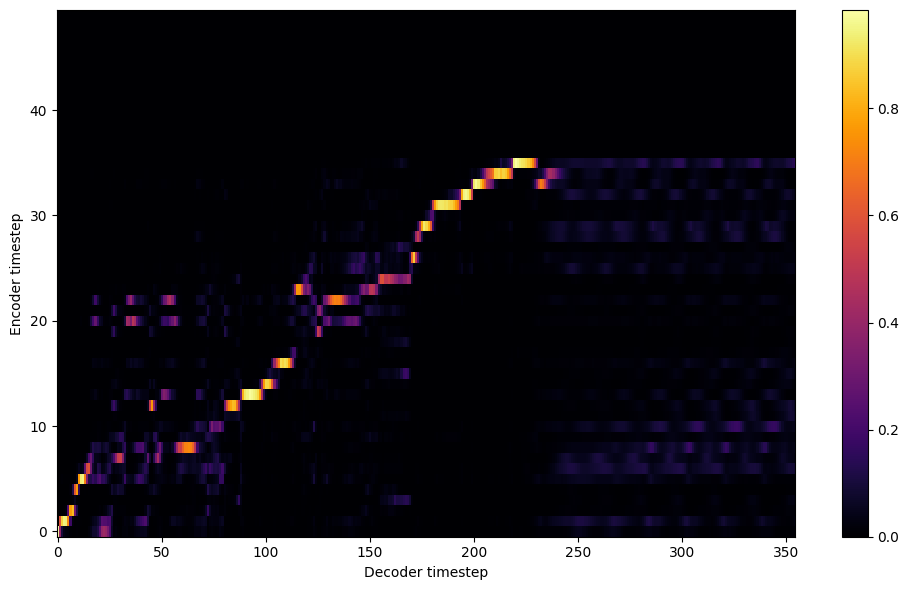


Starting Epoch: 176 Iteration: 2640


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 176 Validation loss 2655:  0.078538  Time: 0.4m LR: 0.000300


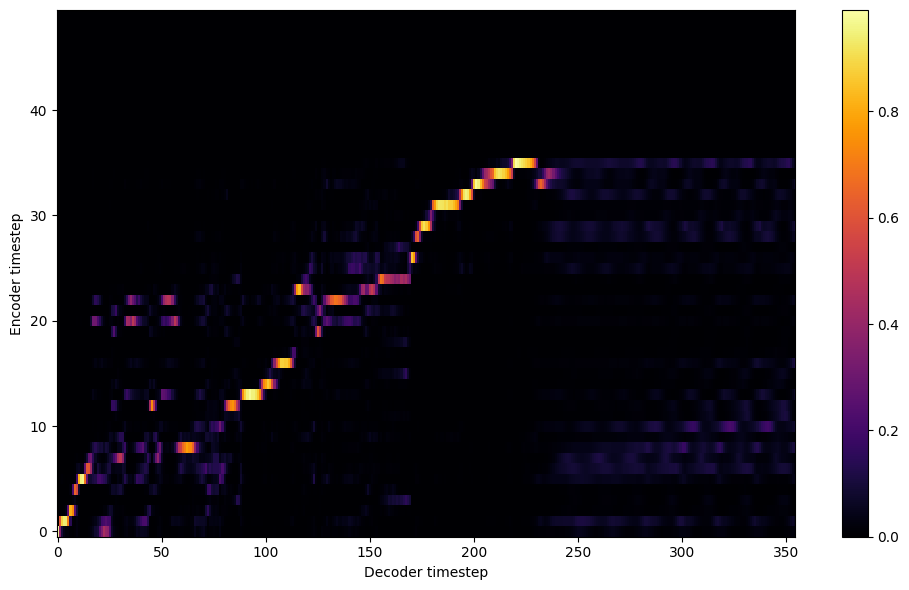


Starting Epoch: 177 Iteration: 2655


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 177 Validation loss 2670:  0.078198  Time: 0.4m LR: 0.000300


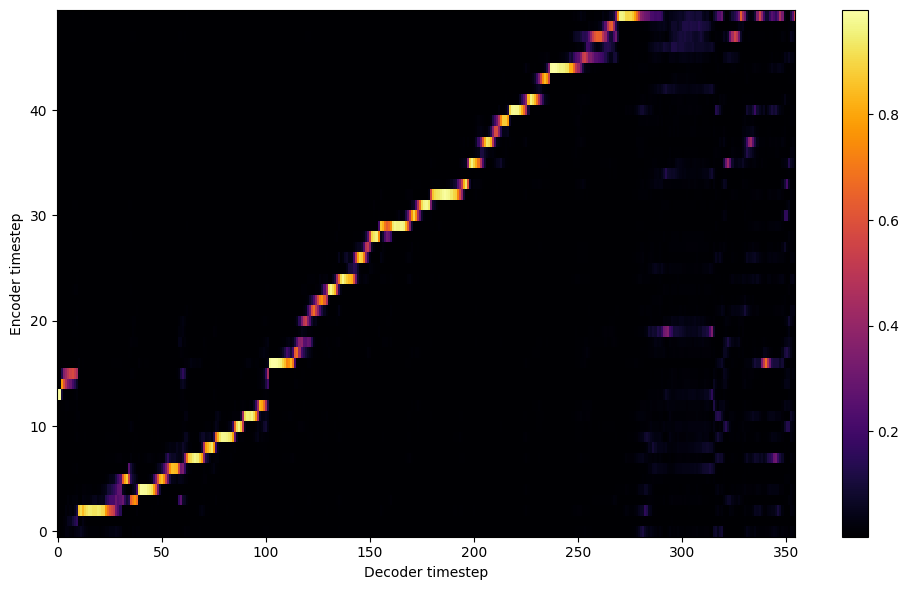


Starting Epoch: 178 Iteration: 2670


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 178 Validation loss 2685:  0.079158  Time: 0.4m LR: 0.000300


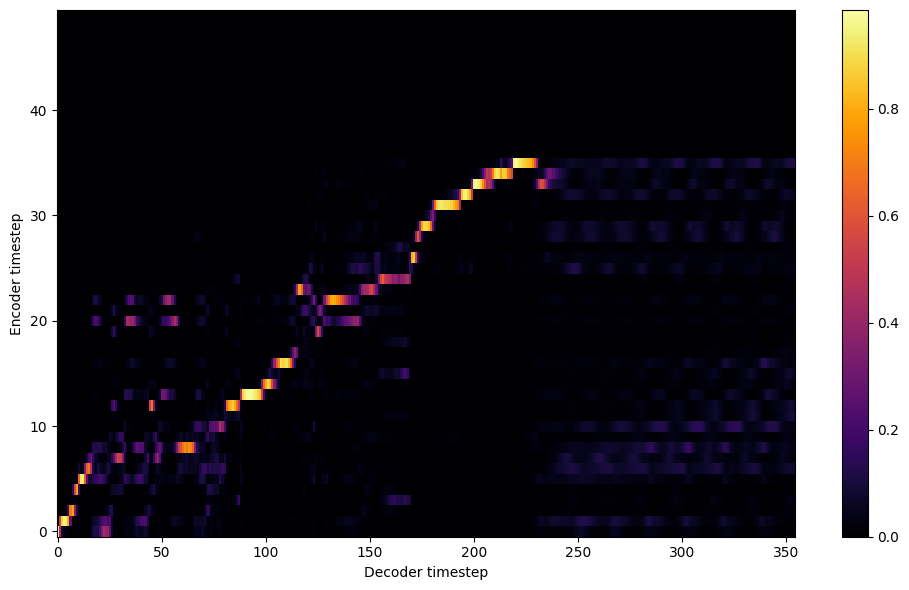


Starting Epoch: 179 Iteration: 2685


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 179 Validation loss 2700:  0.076611  Time: 0.4m LR: 0.000300


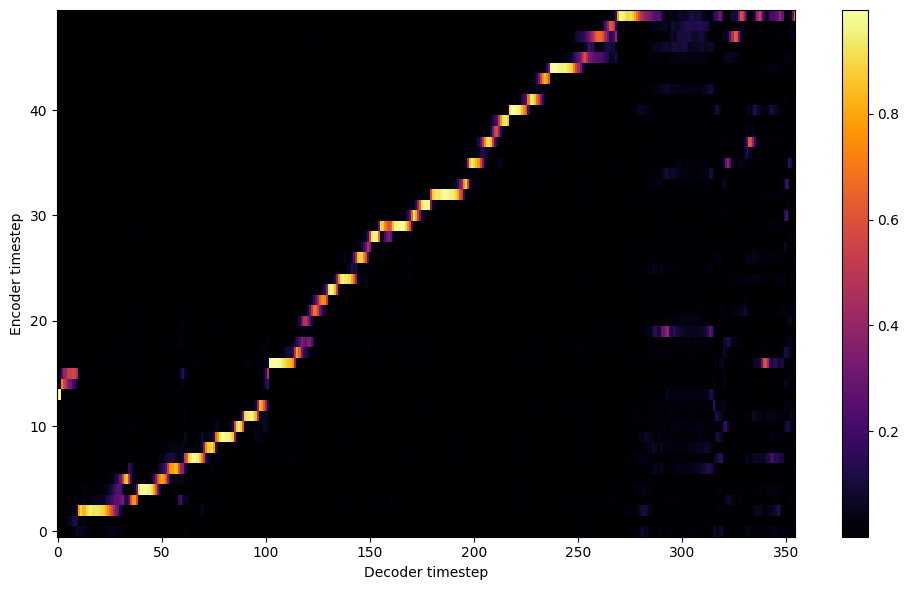

Saving model and optimizer state at iteration 2700 to /content/model//female_child
Model Saved

Starting Epoch: 180 Iteration: 2700


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 180 Validation loss 2715:  0.075697  Time: 0.4m LR: 0.000300


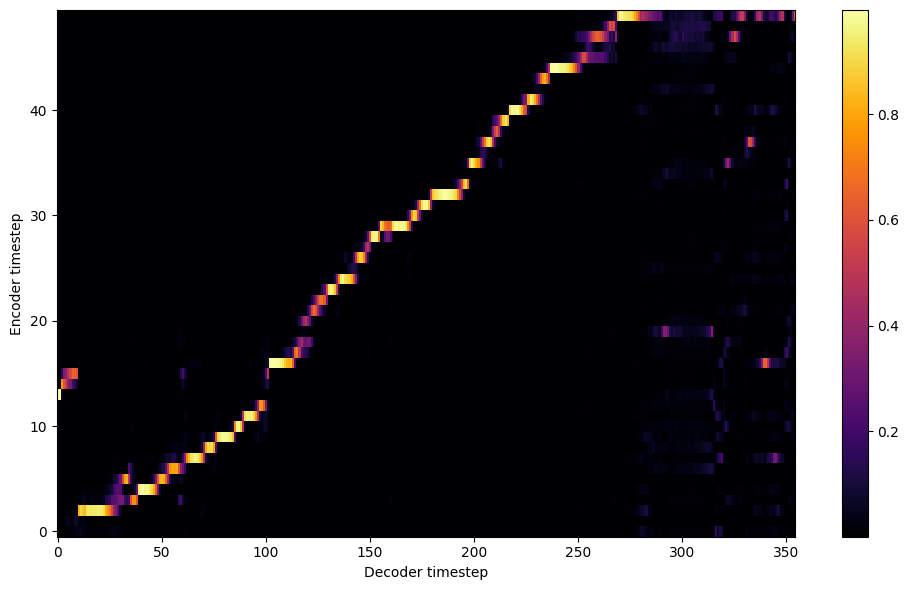


Starting Epoch: 181 Iteration: 2715


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 181 Validation loss 2730:  0.073468  Time: 0.4m LR: 0.000300


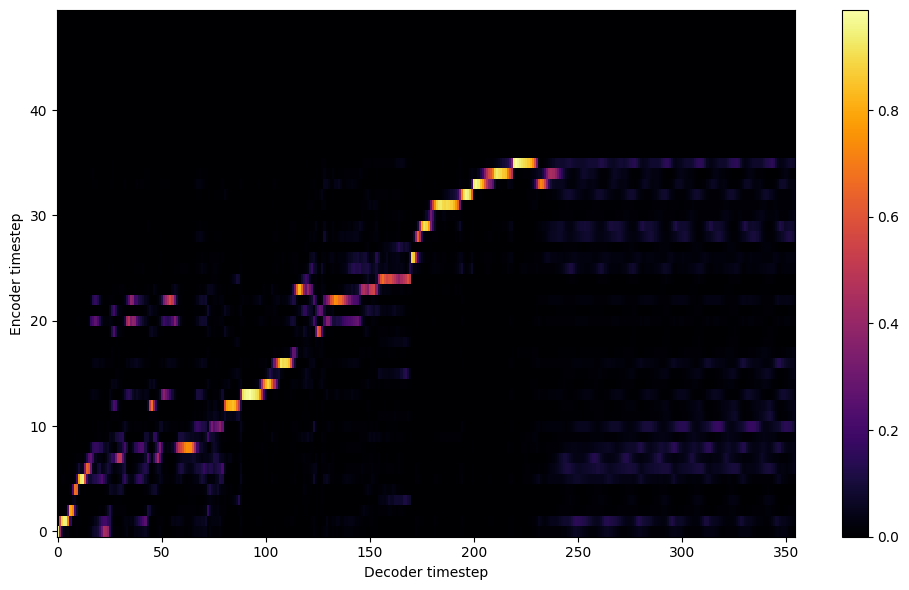


Starting Epoch: 182 Iteration: 2730


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 182 Validation loss 2745:  0.072981  Time: 0.4m LR: 0.000300


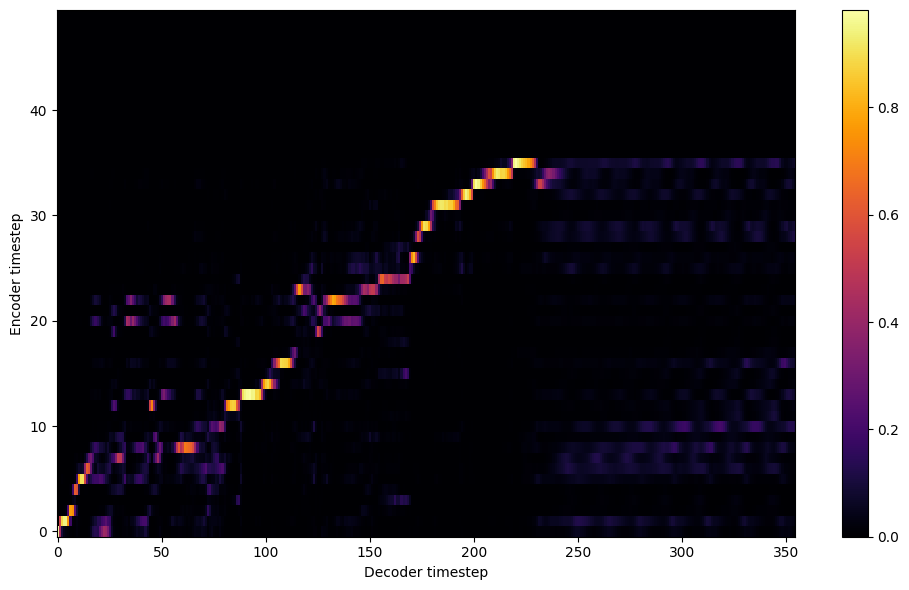


Starting Epoch: 183 Iteration: 2745


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 183 Validation loss 2760:  0.075005  Time: 0.4m LR: 0.000300


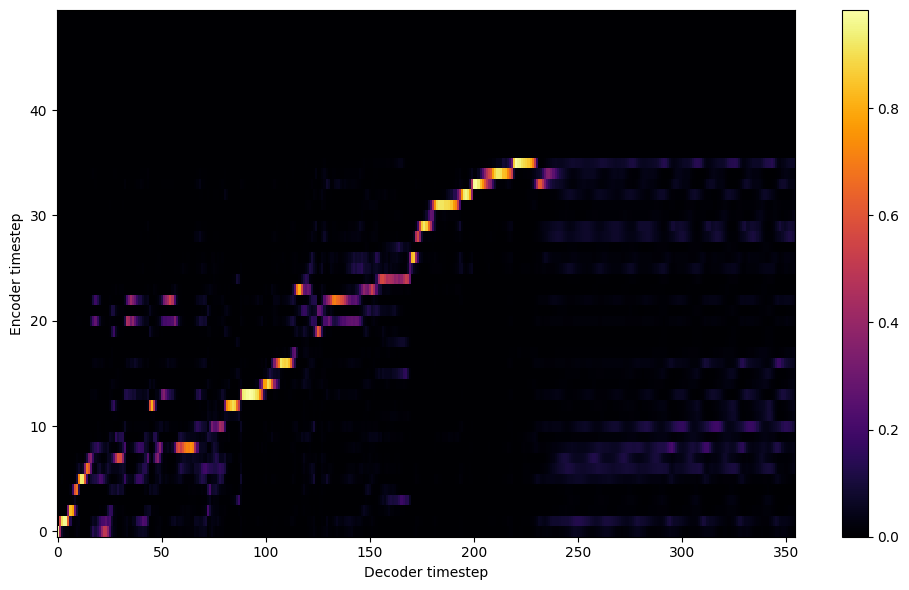


Starting Epoch: 184 Iteration: 2760


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 184 Validation loss 2775:  0.075998  Time: 0.4m LR: 0.000300


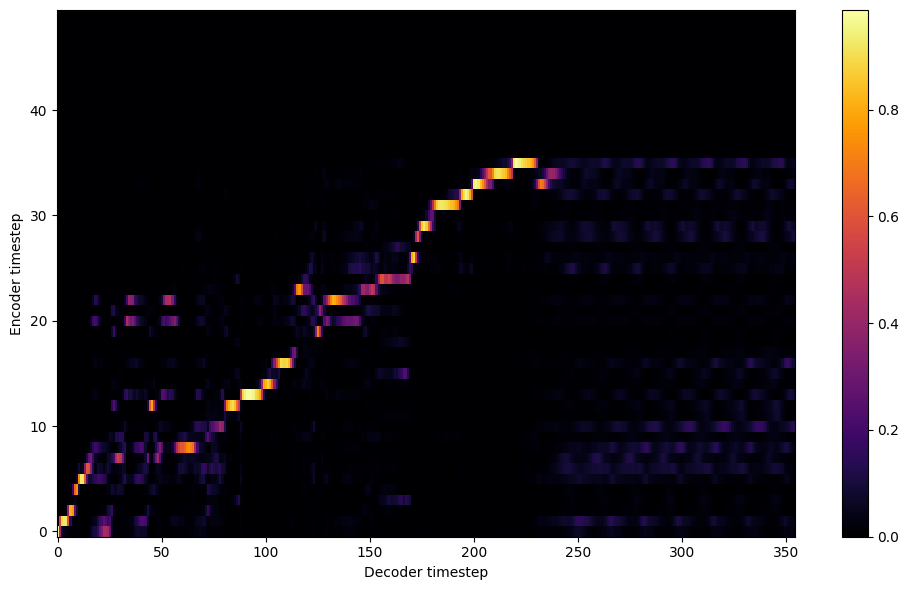


Starting Epoch: 185 Iteration: 2775


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 185 Validation loss 2790:  0.072214  Time: 0.4m LR: 0.000300


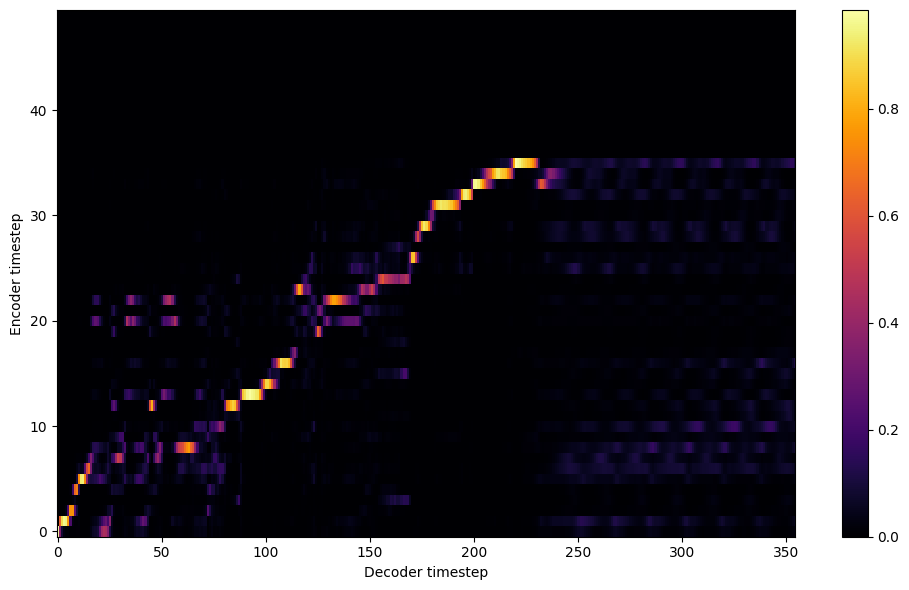


Starting Epoch: 186 Iteration: 2790


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 186 Validation loss 2805:  0.073398  Time: 0.4m LR: 0.000300


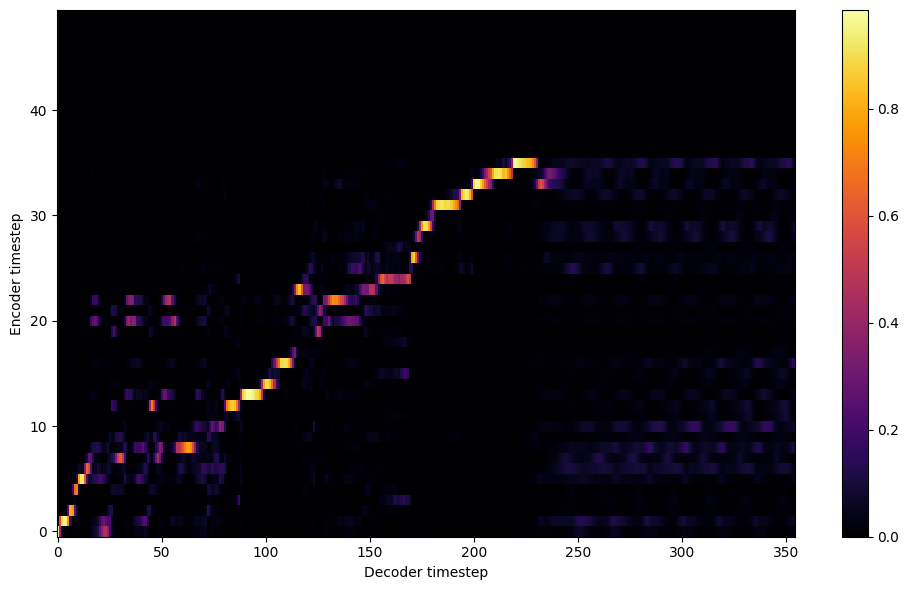


Starting Epoch: 187 Iteration: 2805


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 187 Validation loss 2820:  0.077059  Time: 0.4m LR: 0.000300


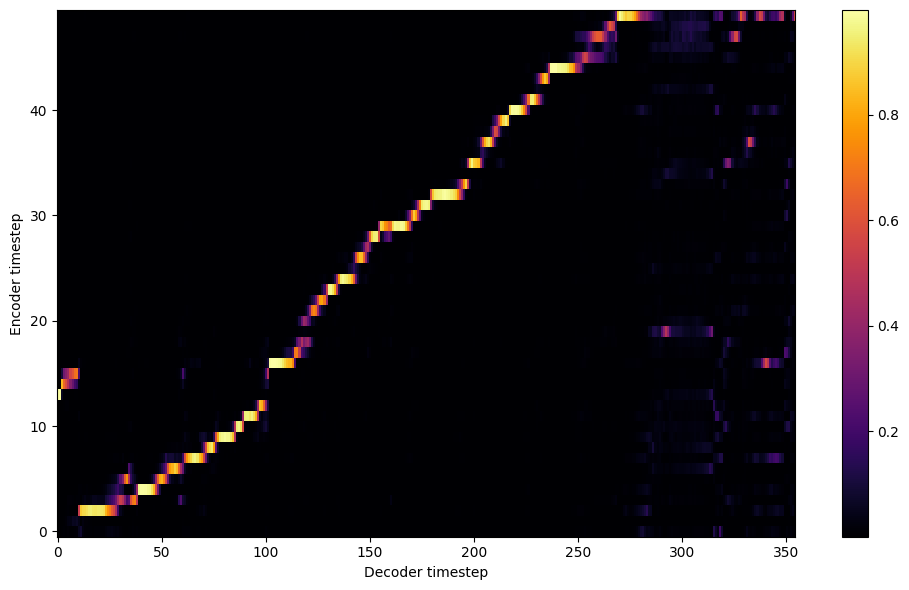


Starting Epoch: 188 Iteration: 2820


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 188 Validation loss 2835:  0.078258  Time: 0.4m LR: 0.000300


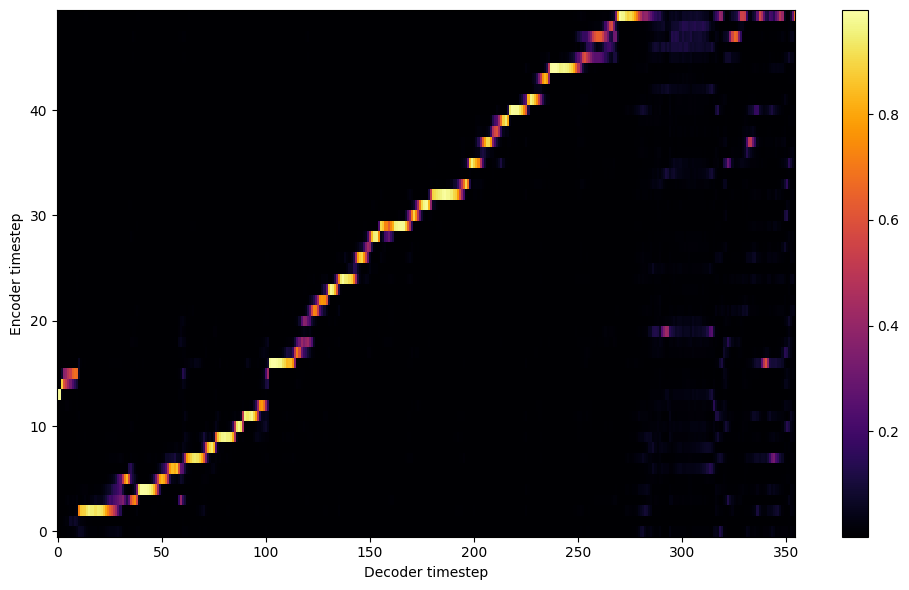


Starting Epoch: 189 Iteration: 2835


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 189 Validation loss 2850:  0.075692  Time: 0.4m LR: 0.000300


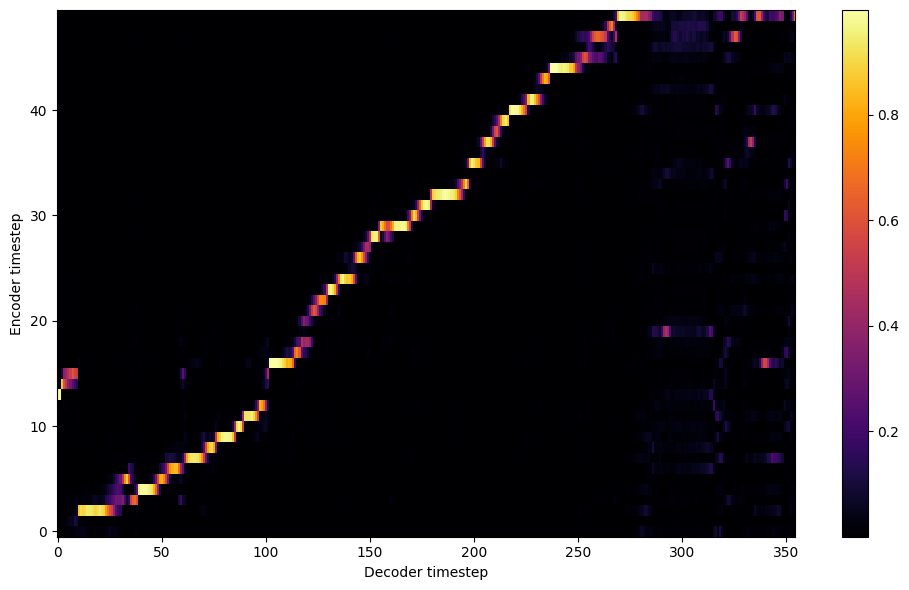

Saving model and optimizer state at iteration 2850 to /content/model//female_child
Model Saved

Starting Epoch: 190 Iteration: 2850


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 190 Validation loss 2865:  0.077814  Time: 0.4m LR: 0.000300


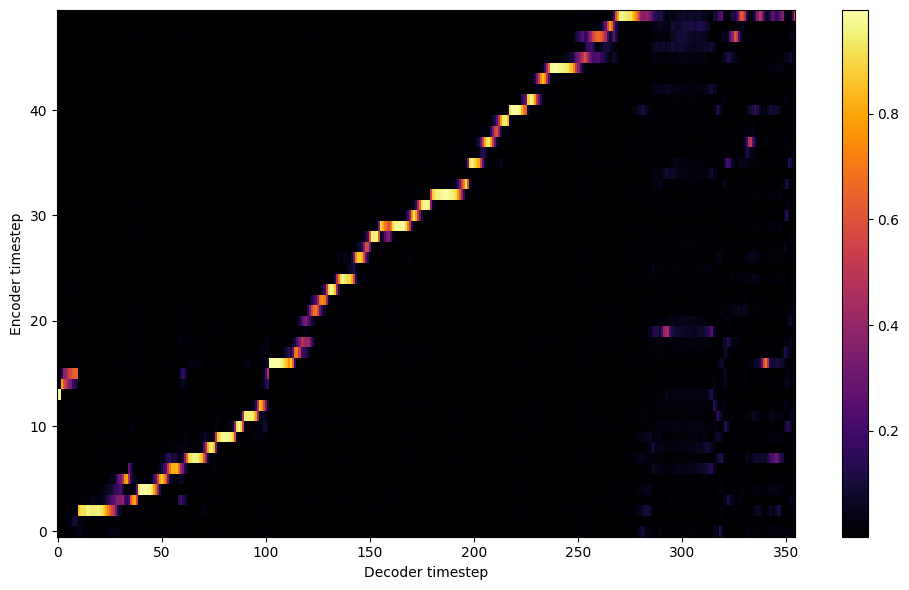


Starting Epoch: 191 Iteration: 2865


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 191 Validation loss 2880:  0.073831  Time: 0.4m LR: 0.000300


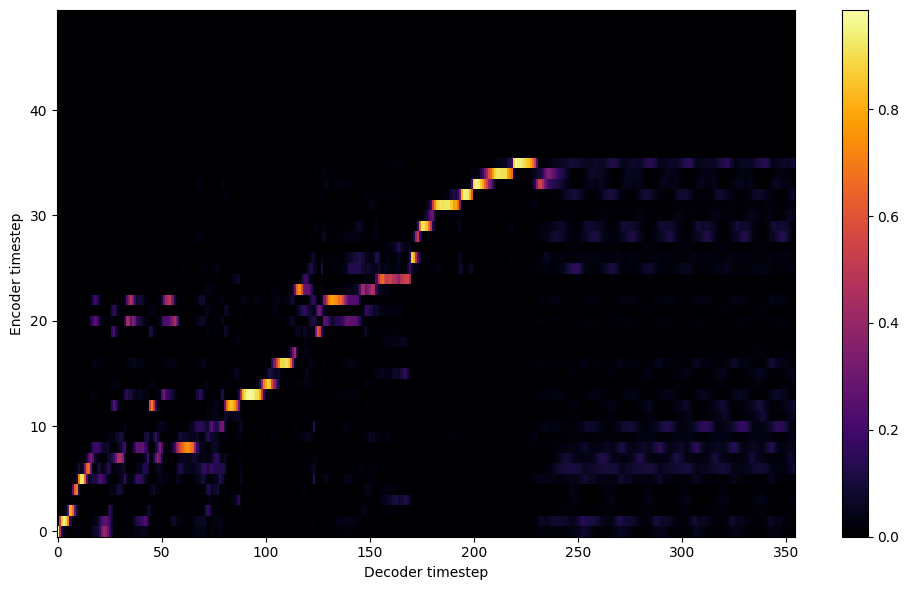


Starting Epoch: 192 Iteration: 2880


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 192 Validation loss 2895:  0.071510  Time: 0.4m LR: 0.000300


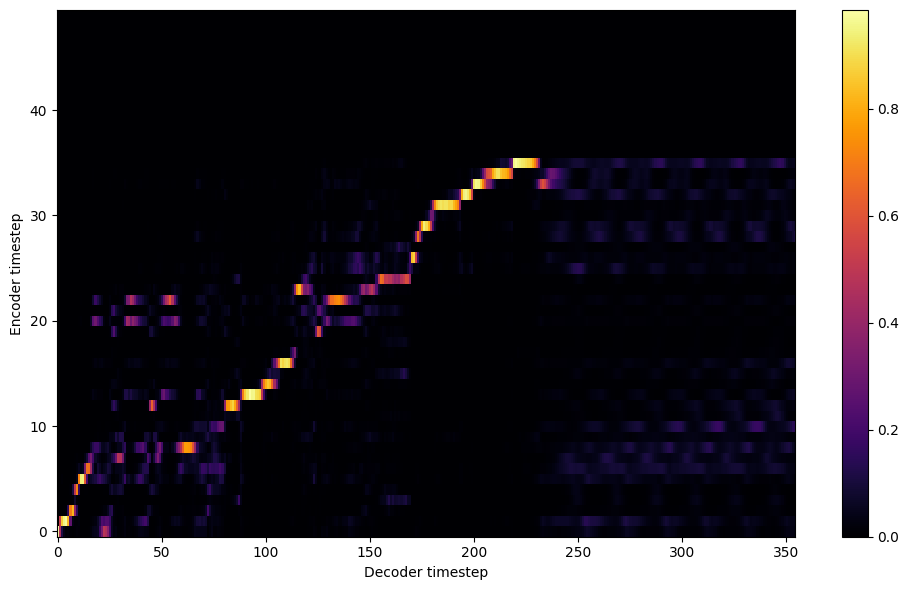


Starting Epoch: 193 Iteration: 2895


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 193 Validation loss 2910:  0.072645  Time: 0.4m LR: 0.000300


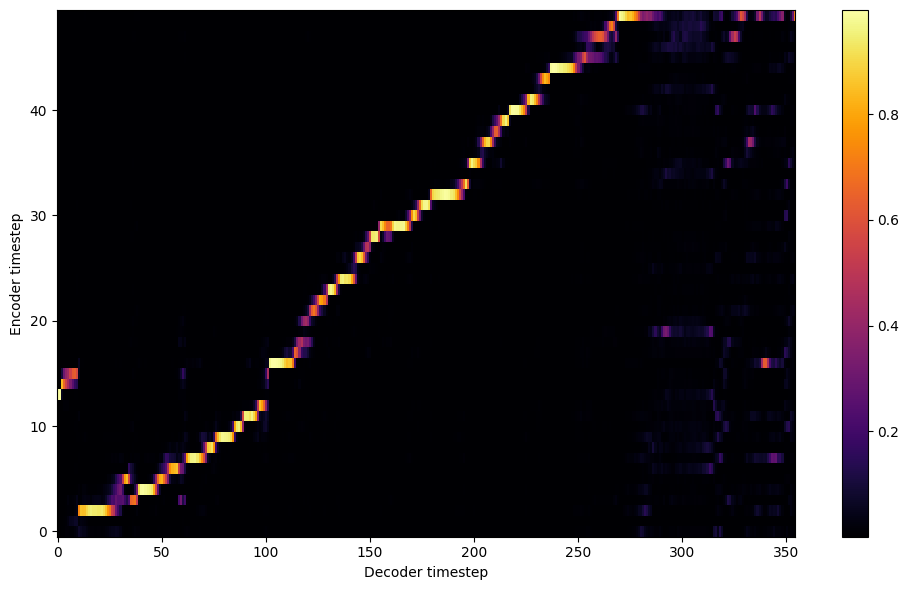


Starting Epoch: 194 Iteration: 2910


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 194 Validation loss 2925:  0.070693  Time: 0.4m LR: 0.000300


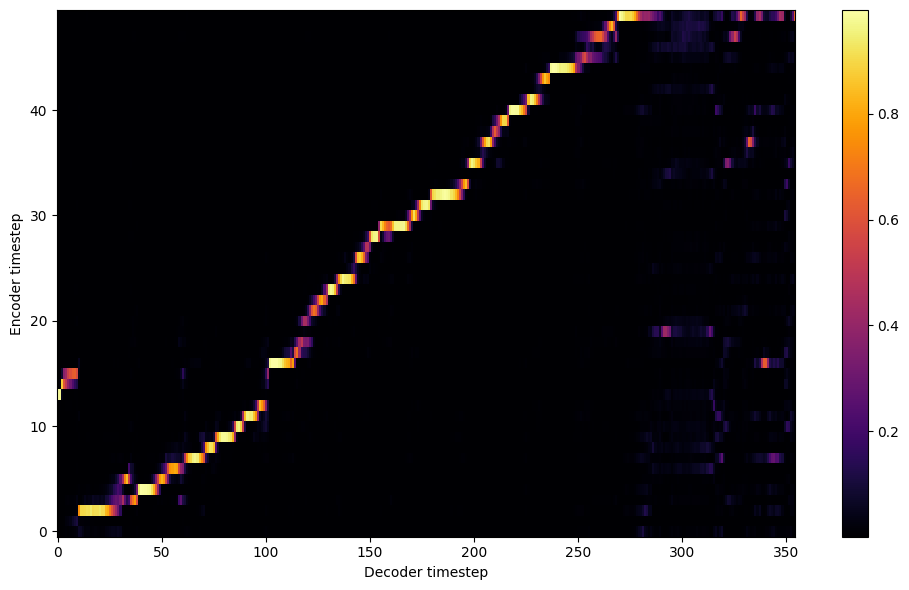


Starting Epoch: 195 Iteration: 2925


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 195 Validation loss 2940:  0.068774  Time: 0.4m LR: 0.000300


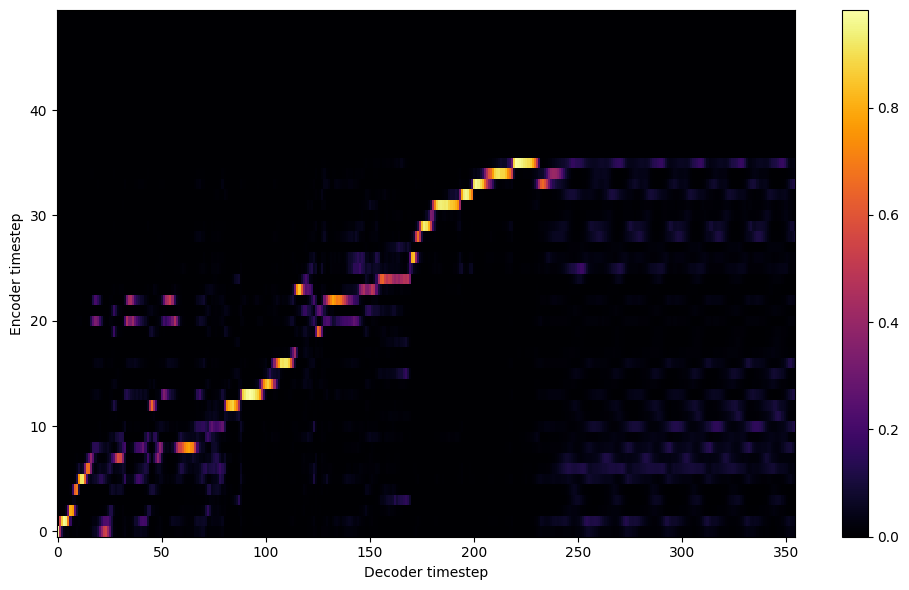


Starting Epoch: 196 Iteration: 2940


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 196 Validation loss 2955:  0.068868  Time: 0.4m LR: 0.000300


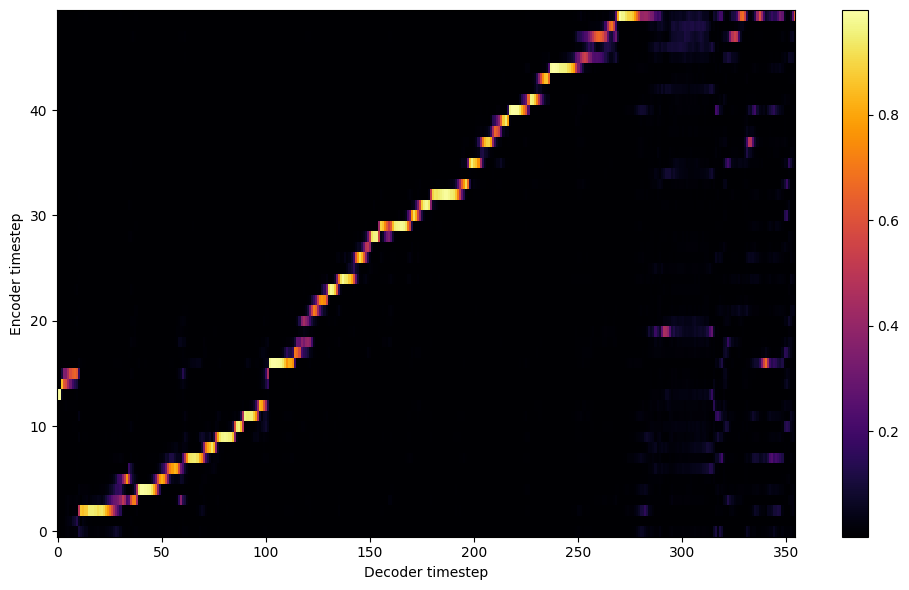


Starting Epoch: 197 Iteration: 2955


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 197 Validation loss 2970:  0.069661  Time: 0.4m LR: 0.000300


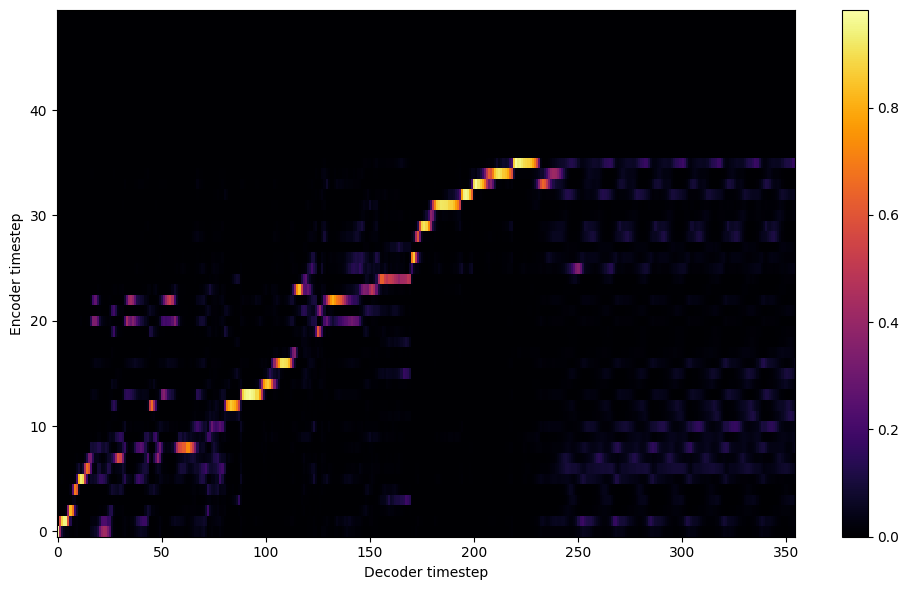


Starting Epoch: 198 Iteration: 2970


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 198 Validation loss 2985:  0.066908  Time: 0.4m LR: 0.000300


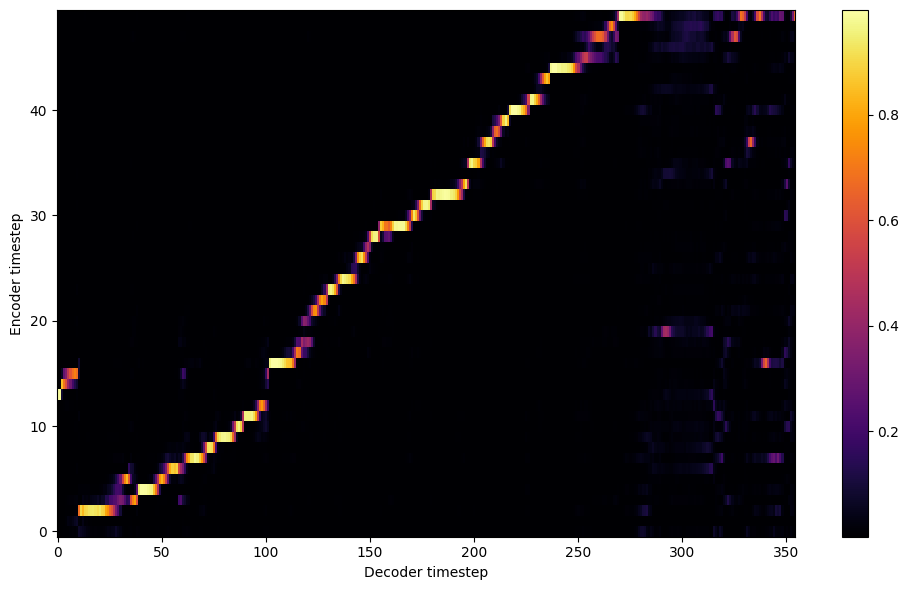


Starting Epoch: 199 Iteration: 2985


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 199 Validation loss 3000:  0.068909  Time: 0.4m LR: 0.000300


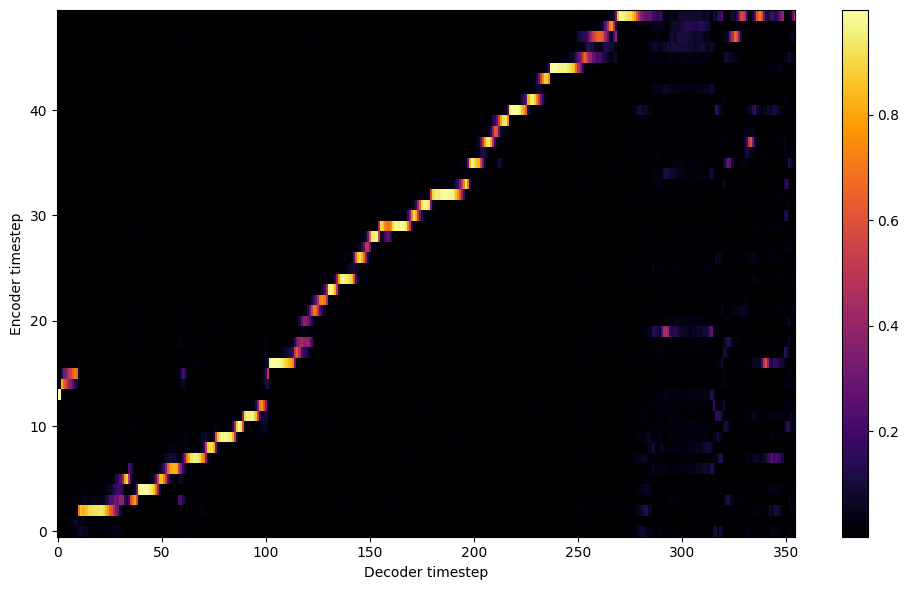

Saving model and optimizer state at iteration 3000 to /content/model//female_child
Model Saved

Starting Epoch: 200 Iteration: 3000


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 200 Validation loss 3015:  0.069517  Time: 0.4m LR: 0.000300


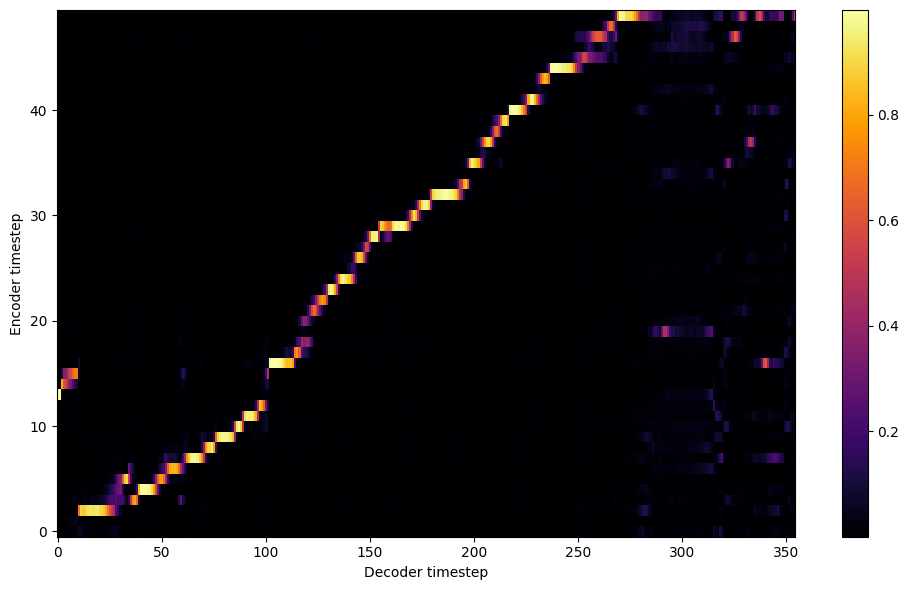


Starting Epoch: 201 Iteration: 3015


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 201 Validation loss 3030:  0.071006  Time: 0.4m LR: 0.000300


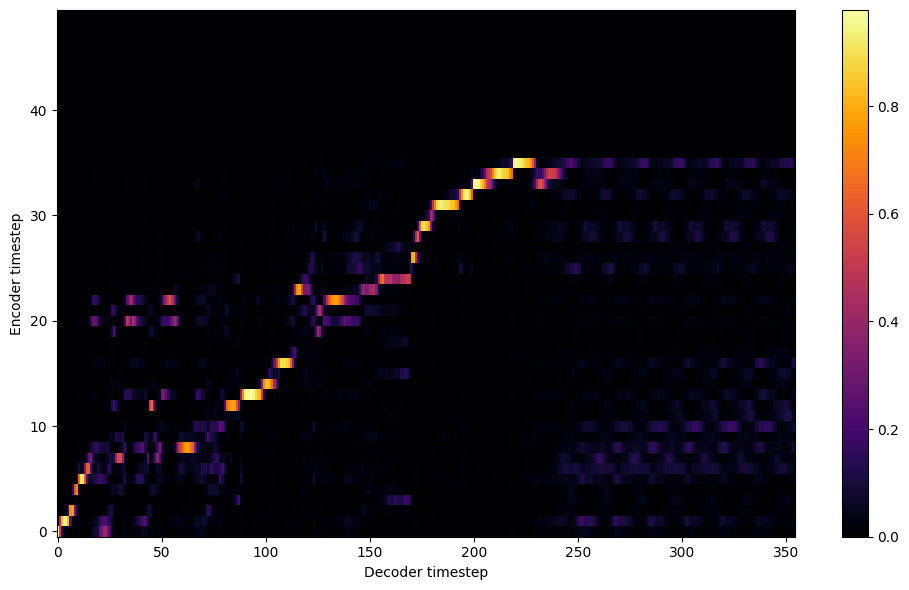


Starting Epoch: 202 Iteration: 3030


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 202 Validation loss 3045:  0.074376  Time: 0.4m LR: 0.000300


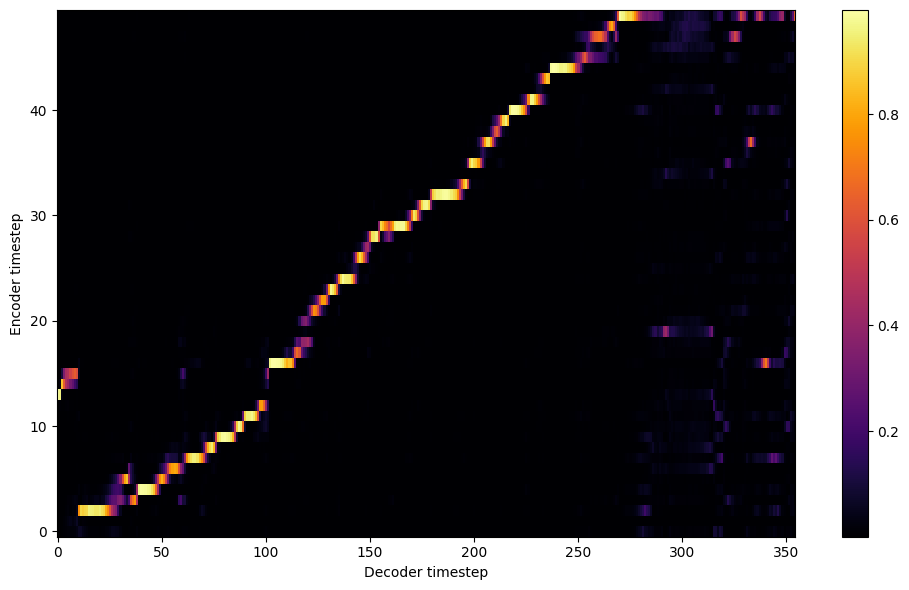


Starting Epoch: 203 Iteration: 3045


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 203 Validation loss 3060:  0.079981  Time: 0.4m LR: 0.000300


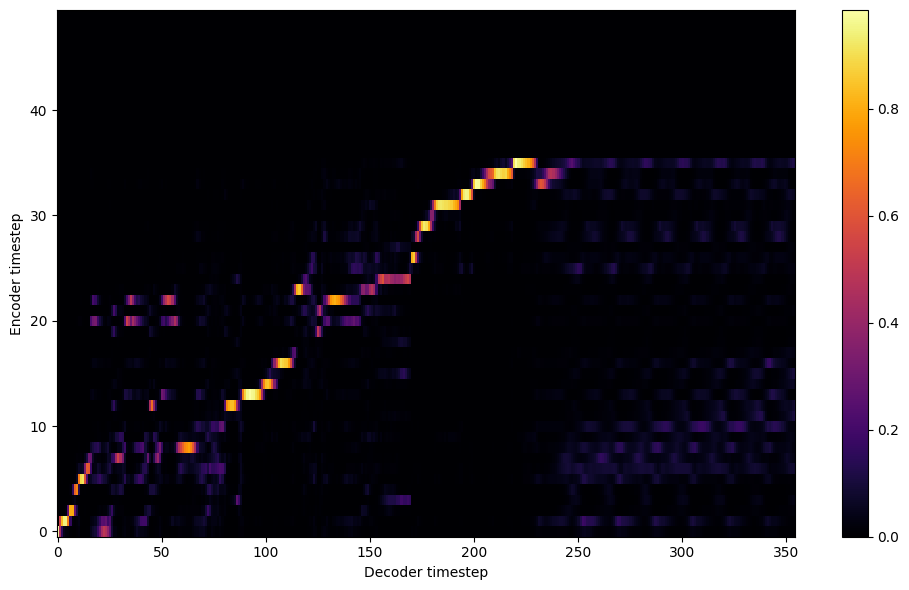


Starting Epoch: 204 Iteration: 3060


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 204 Validation loss 3075:  0.072278  Time: 0.4m LR: 0.000300


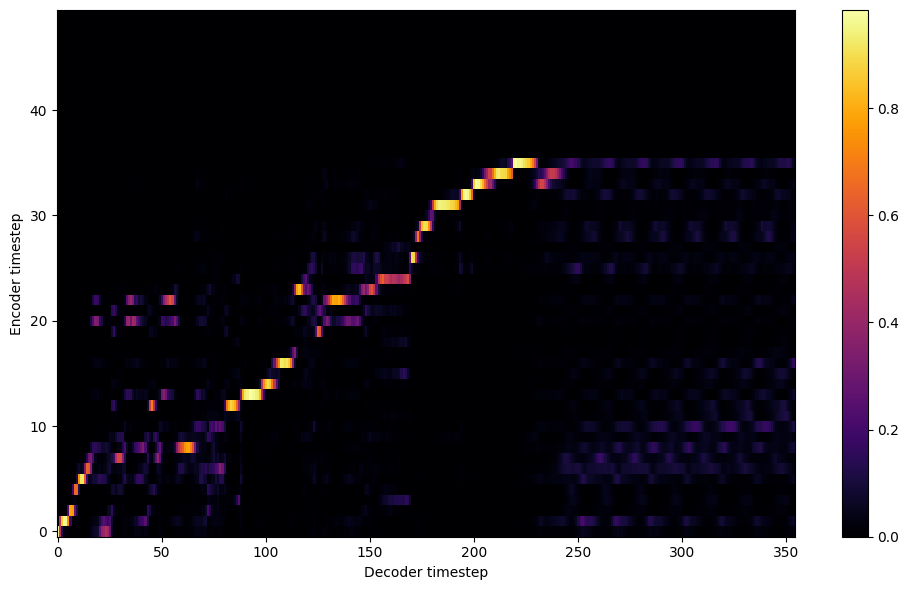


Starting Epoch: 205 Iteration: 3075


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 205 Validation loss 3090:  0.069619  Time: 0.4m LR: 0.000300


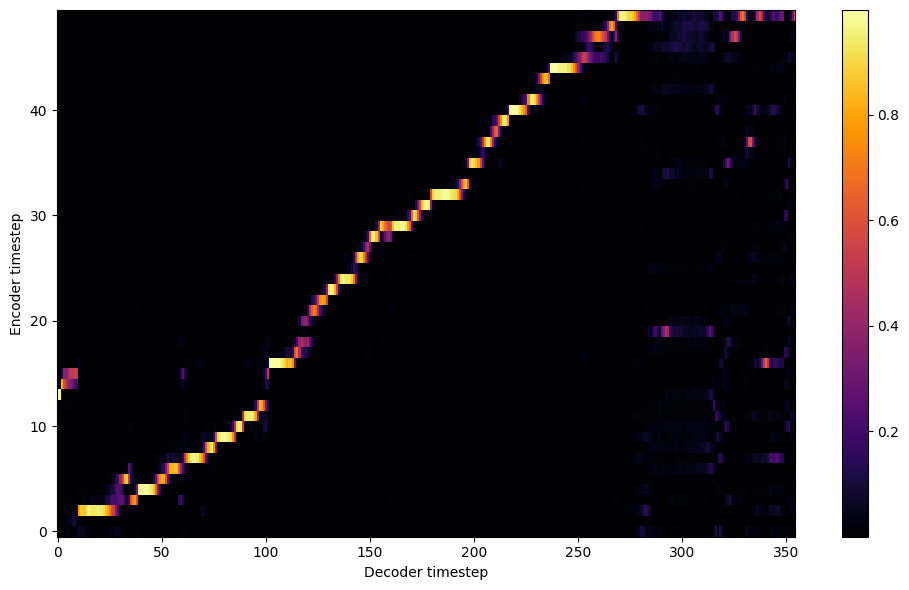


Starting Epoch: 206 Iteration: 3090


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 206 Validation loss 3105:  0.068909  Time: 0.4m LR: 0.000300


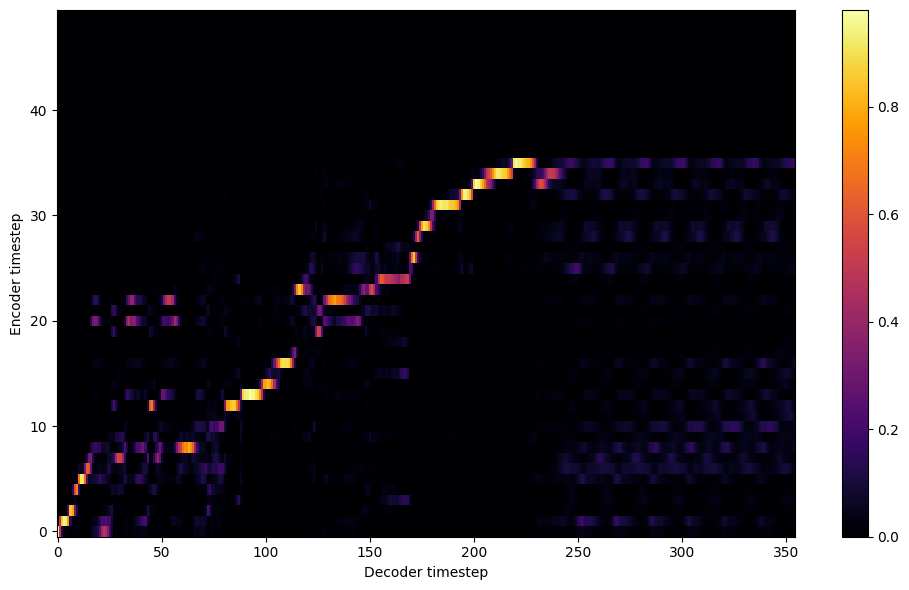


Starting Epoch: 207 Iteration: 3105


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 207 Validation loss 3120:  0.067240  Time: 0.4m LR: 0.000300


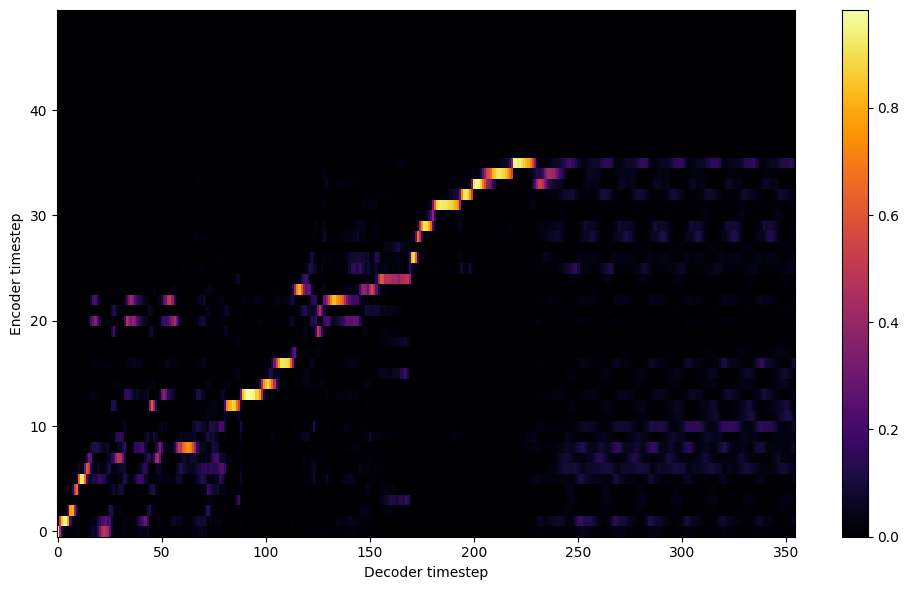


Starting Epoch: 208 Iteration: 3120


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 208 Validation loss 3135:  0.067699  Time: 0.4m LR: 0.000300


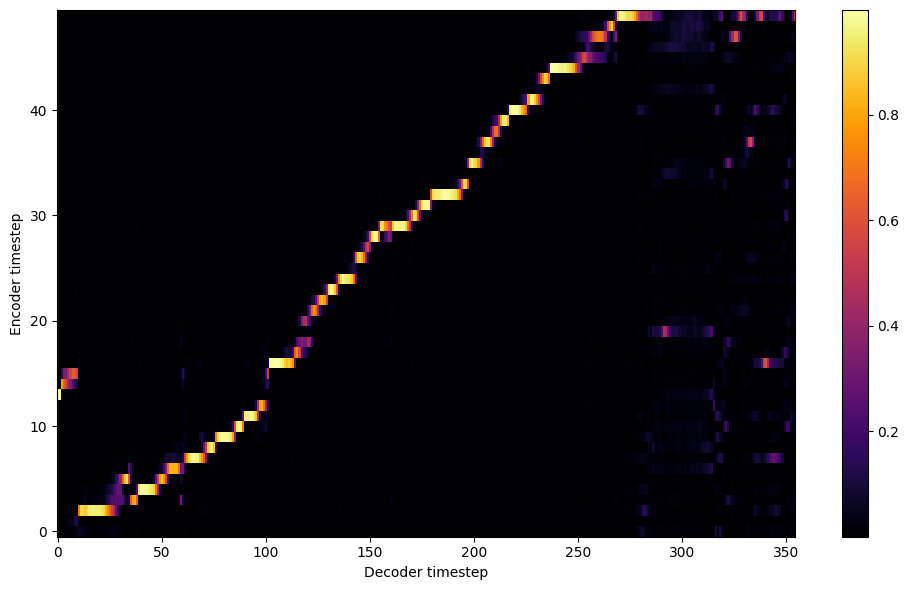


Starting Epoch: 209 Iteration: 3135


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 209 Validation loss 3150:  0.067941  Time: 0.4m LR: 0.000300


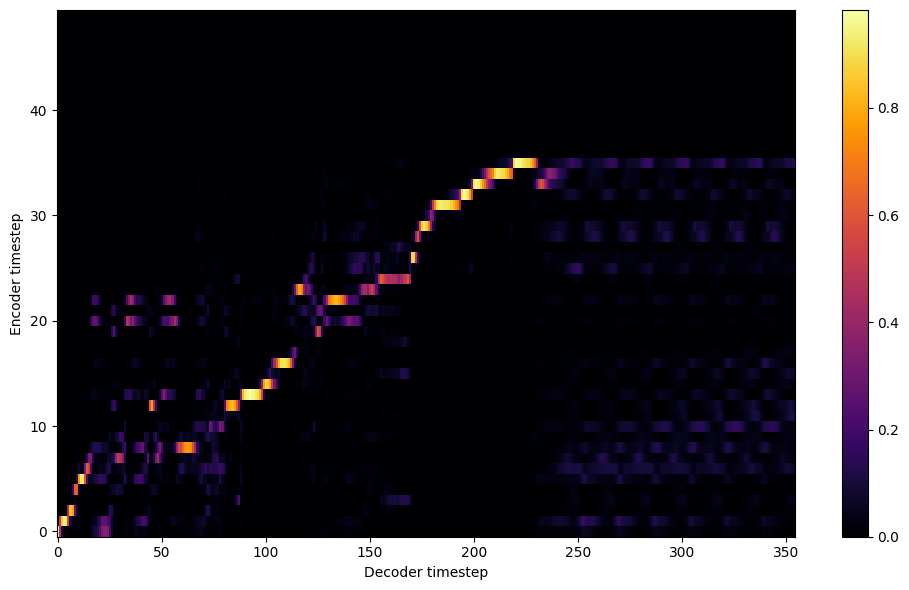

Saving model and optimizer state at iteration 3150 to /content/model//female_child
Model Saved

Starting Epoch: 210 Iteration: 3150


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 210 Validation loss 3165:  0.069162  Time: 0.4m LR: 0.000300


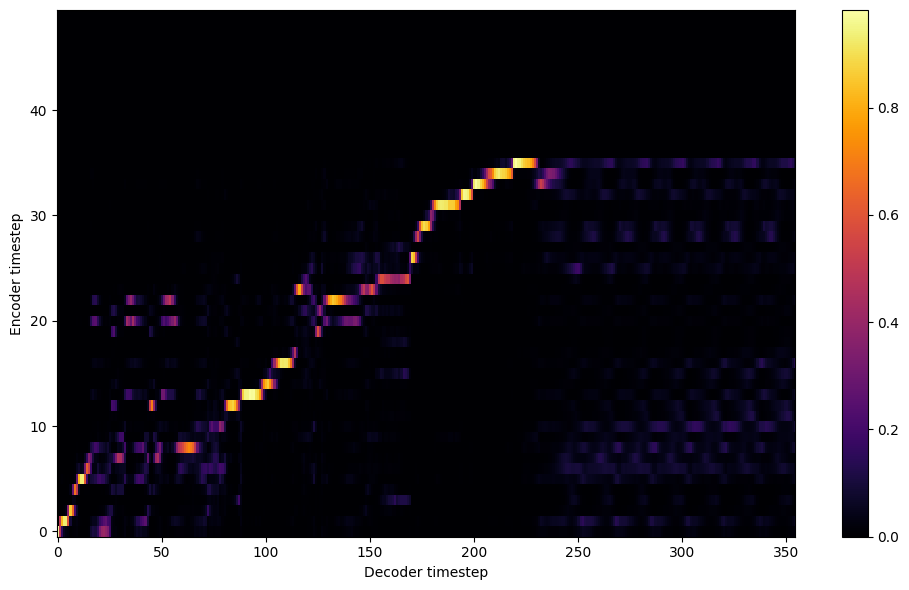


Starting Epoch: 211 Iteration: 3165


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 211 Validation loss 3180:  0.067174  Time: 0.4m LR: 0.000300


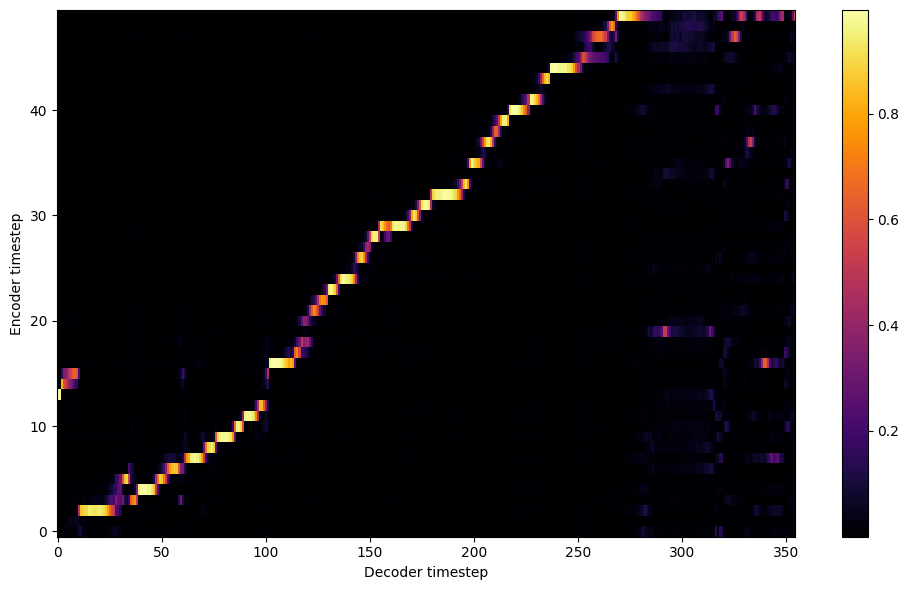


Starting Epoch: 212 Iteration: 3180


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 212 Validation loss 3195:  0.069587  Time: 0.4m LR: 0.000300


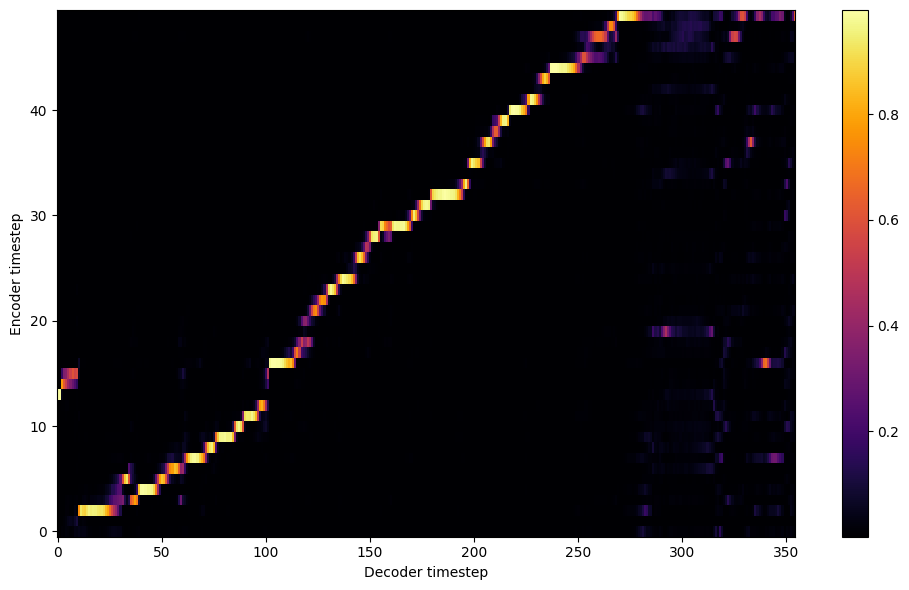


Starting Epoch: 213 Iteration: 3195


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 213 Validation loss 3210:  0.069071  Time: 0.4m LR: 0.000300


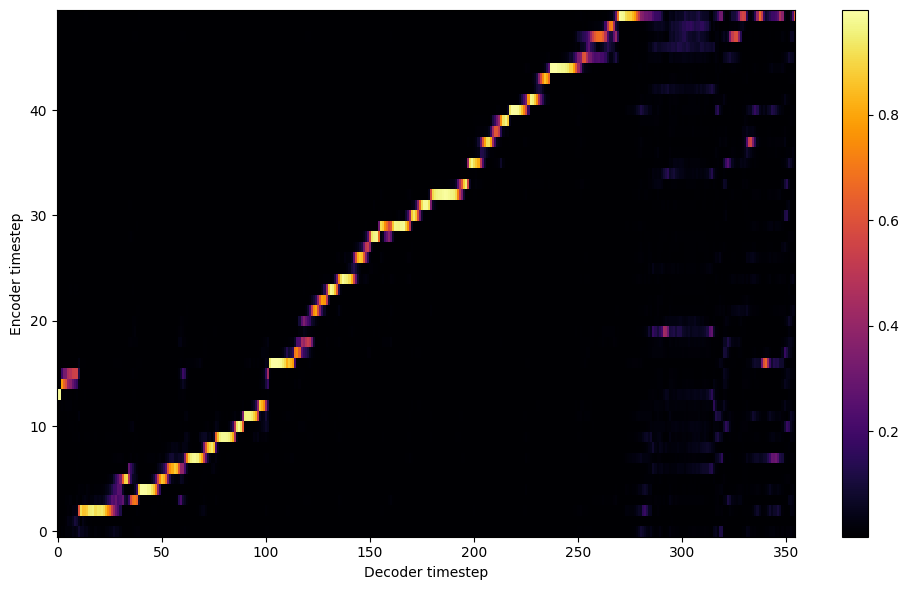


Starting Epoch: 214 Iteration: 3210


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 214 Validation loss 3225:  0.068370  Time: 0.4m LR: 0.000300


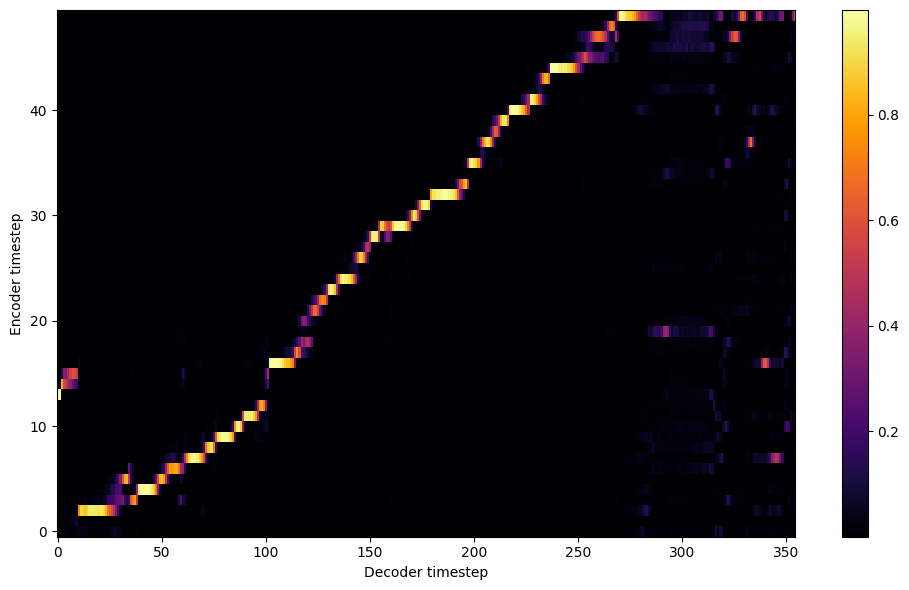


Starting Epoch: 215 Iteration: 3225


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 215 Validation loss 3240:  0.065612  Time: 0.4m LR: 0.000300


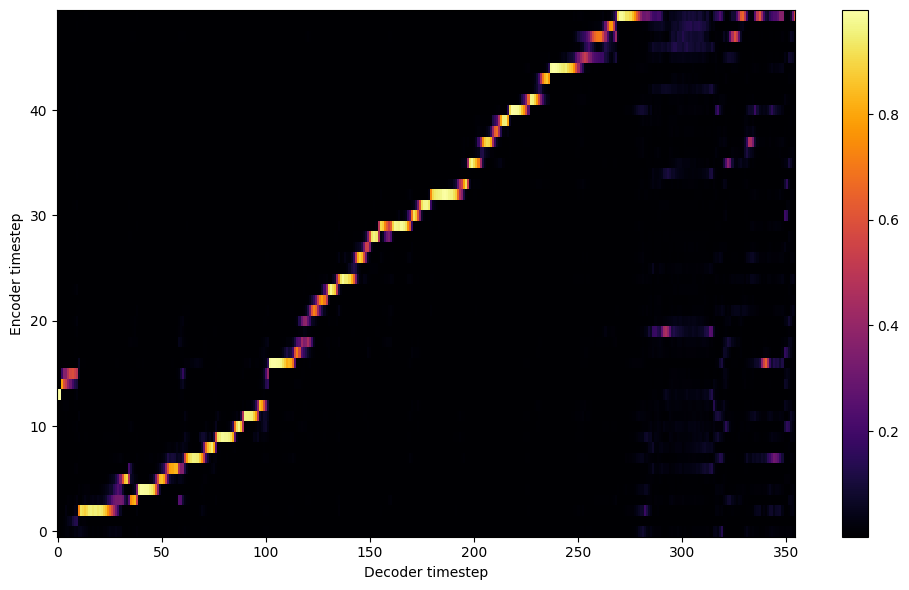


Starting Epoch: 216 Iteration: 3240


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 216 Validation loss 3255:  0.065072  Time: 0.4m LR: 0.000300


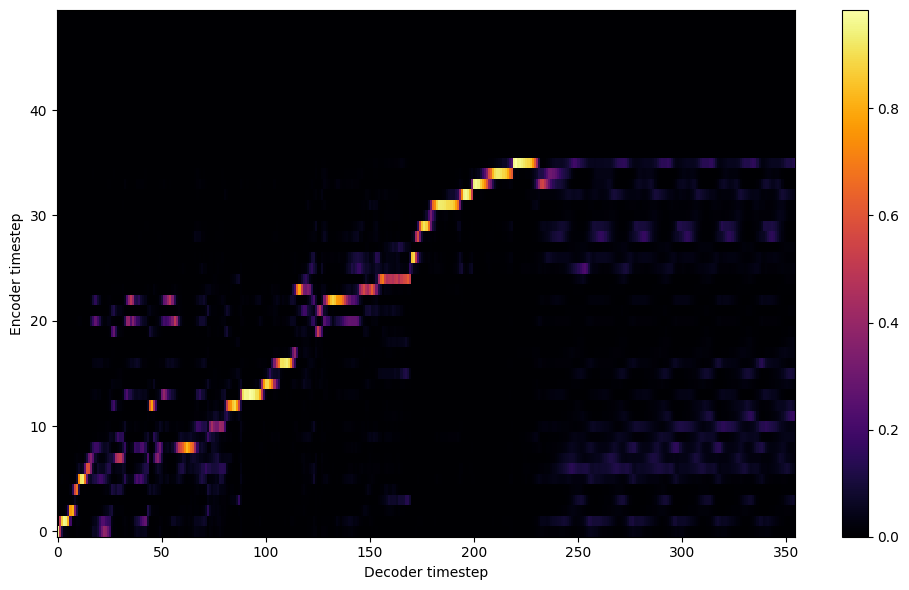


Starting Epoch: 217 Iteration: 3255


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 217 Validation loss 3270:  0.065370  Time: 0.4m LR: 0.000300


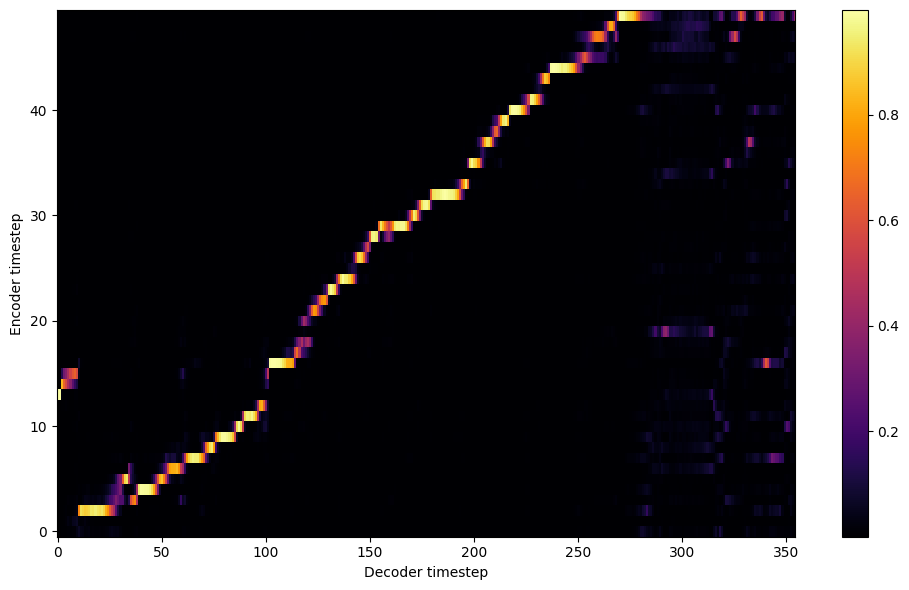


Starting Epoch: 218 Iteration: 3270


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 218 Validation loss 3285:  0.064474  Time: 0.4m LR: 0.000300


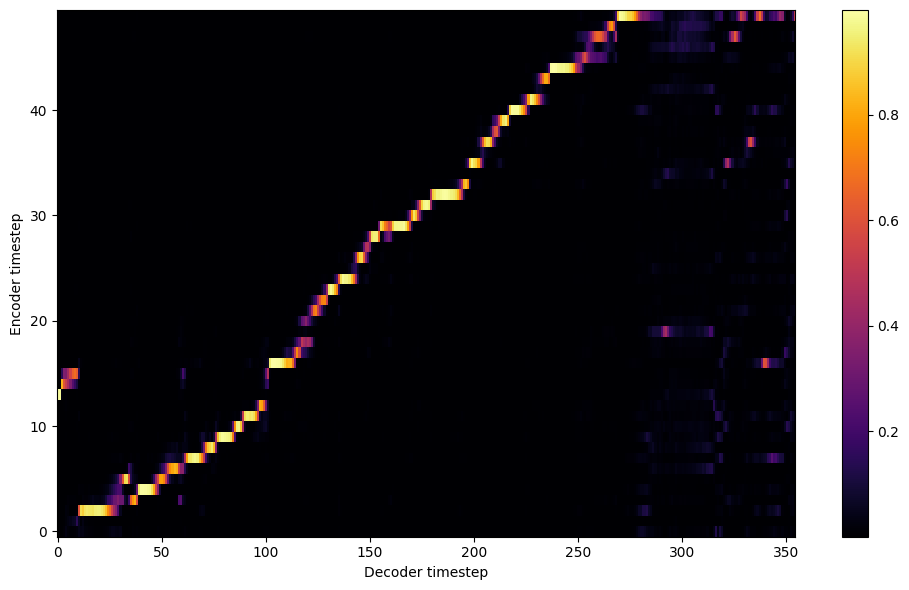


Starting Epoch: 219 Iteration: 3285


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 219 Validation loss 3300:  0.066688  Time: 0.4m LR: 0.000300


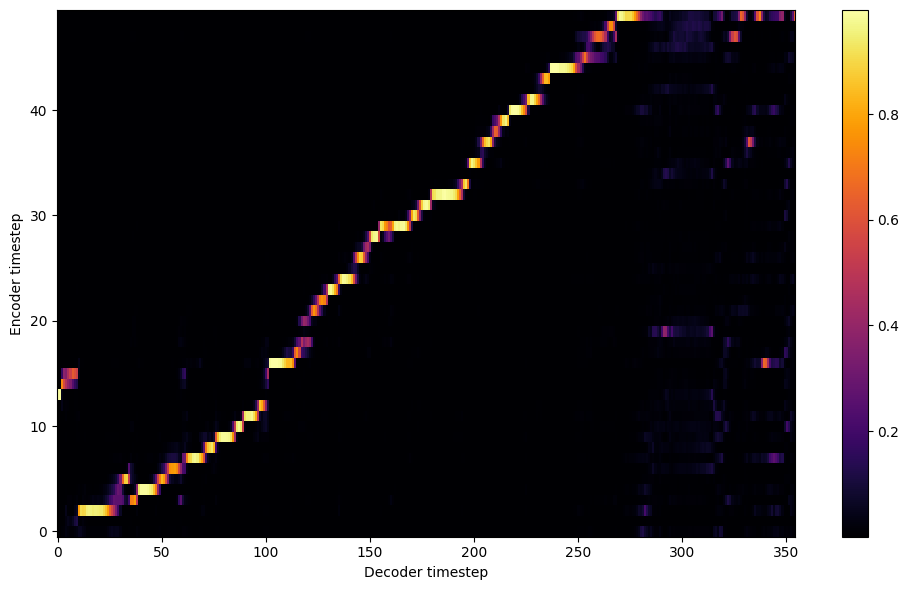

Saving model and optimizer state at iteration 3300 to /content/model//female_child
Model Saved

Starting Epoch: 220 Iteration: 3300


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch: 220 Validation loss 3315:  0.065571  Time: 0.4m LR: 0.000300


KeyboardInterrupt: 

In [ ]:
#train you model now
save_interval =  10

backup_interval =  -1

print('FP16 Run:', hparams.fp16_run)
print('Dynamic Loss Scaling:', hparams.dynamic_loss_scaling)
print('Distributed Run:', hparams.distributed_run)
print('cuDNN Enabled:', hparams.cudnn_enabled)
print('cuDNN Benchmark:', hparams.cudnn_benchmark)
train(output_directory, log_directory, checkpoint_path,
      warm_start, n_gpus, rank, group_name, hparams, log_directory2,
      save_interval, backup_interval)

## 7) Implementation of your own model and check Results For GPU and save mel_outputs

In [ ]:
#for gPu TTS Notebook and get results and give your own tacatron2 model Id
import logging

logging.getLogger('matplotlib').setLevel(logging.WARNING)
logging.getLogger('numba').setLevel(logging.WARNING)
logging.getLogger('librosa').setLevel(logging.WARNING)


#Universal HiFi-GAN (has some robotic noise): 1qpgI41wNXFcH-iKq1Y42JlBC9j0je8PW
tacotron_id = "15cwbdhE7kfNWpE_BcYOoXsswiCFLQA1o"

hifigan_id = "universal"

#_leave blank or enter "universal" for universal model_



if tacotron_id != "":
    TACOTRON2_ID = tacotron_id
else:
    raise Exception("No ID provided.")

if hifigan_id in {"", "universal"}:
    HIFIGAN_ID = "universal"
    print("Using universal Hifi-Gan model.")
else:
    HIFIGAN_ID = hifigan_id

# Check if Initialized
try:
    initialized
except NameError:
    print("Setting up, please wait.\n")
    !pip install tqdm -q
    from tqdm.notebook import tqdm
    with tqdm(total=5, leave=False) as pbar:
        import os
        from os.path import exists, join, basename, splitext
        !pip install resampy
        !pip install git+https://github.com/wkentaro/gdown.git
        git_repo_url = 'https://github.com/justinjohn0306/TTS-TT2.git'
        project_name = splitext(basename(git_repo_url))[0]
        if not exists(project_name):
            # clone and install
            !git clone -q --recursive {git_repo_url}
            !git clone -q --recursive https://github.com/justinjohn0306/hifi-gan
            !pip install -q unidecode
        pbar.update(1) # downloaded TT2 and HiFi-GAN
        import sys
        sys.path.append('hifi-gan')
        sys.path.append(project_name)
        import time
        import matplotlib
        import matplotlib.pylab as plt
        import gdown
        d = 'https://drive.google.com/uc?id='

        %matplotlib inline
        import IPython.display as ipd
        import numpy as np
        import torch
        import json
        from hparams import create_hparams
        from model import Tacotron2
        from layers import TacotronSTFT
        from audio_processing import griffin_lim
        from text import text_to_sequence
        from env import AttrDict
        from meldataset import mel_spectrogram, MAX_WAV_VALUE
        from models import Generator
        from denoiser import Denoiser
        import resampy
        import scipy.signal

        pbar.update(1) # initialized Dependancies

        graph_width = 900
        graph_height = 360
        def plot_data(data, figsize=(int(graph_width/100), int(graph_height/100))):
            %matplotlib inline
            fig, axes = plt.subplots(1, len(data), figsize=figsize)
            for i in range(len(data)):
                axes[i].imshow(data[i], aspect='auto', origin='lower',
                            interpolation='none', cmap='inferno')
            fig.canvas.draw()
            plt.show()

        # Setup Pronounciation Dictionary
        !wget 'https://github.com/justinjohn0306/FakeYou-Tacotron2-Notebook/releases/download/CMU_dict/merged.dict.txt'
        thisdict = {}
        for line in reversed((open('merged.dict.txt', "r").read()).splitlines()):
            thisdict[(line.split(" ",1))[0]] = (line.split(" ",1))[1].strip()

        pbar.update(1) # Downloaded and Set up Pronounciation Dictionary

        def ARPA(text, punctuation=r"!?,.;", EOS_Token=True):
            out = ''
            for word_ in text.split(" "):
                word=word_; end_chars = ''
                while any(elem in word for elem in punctuation) and len(word) > 1:
                    if word[-1] in punctuation: end_chars = word[-1] + end_chars; word = word[:-1]
                    else: break
                try:
                    word_arpa = thisdict[word.upper()]
                    word = "{" + str(word_arpa) + "}"
                except KeyError: pass
                out = (out + " " + word + end_chars).strip()
            if EOS_Token and out[-1] != ";": out += ";"
            return out

        def get_hifigan(MODEL_ID, conf_name):
            # Download HiFi-GAN
            hifigan_pretrained_model = 'hifimodel_' + conf_name
            #gdown.download(d+MODEL_ID, hifigan_pretrained_model, quiet=False)

            if MODEL_ID == 1:
              !wget "https://github.com/justinjohn0306/tacotron2/releases/download/assets/Superres_Twilight_33000" -O $hifigan_pretrained_model
            elif MODEL_ID == "universal":
              !wget "https://github.com/justinjohn0306/tacotron2/releases/download/assets/g_02500000" -O $hifigan_pretrained_model
            else:
              gdown.download(d+MODEL_ID, hifigan_pretrained_model, quiet=False)

            # Load HiFi-GAN
            conf = os.path.join("hifi-gan", conf_name + ".json")
            with open(conf) as f:
                json_config = json.loads(f.read())
            h = AttrDict(json_config)
            torch.manual_seed(h.seed)
            hifigan = Generator(h).to(torch.device("cuda"))
            state_dict_g = torch.load(hifigan_pretrained_model, map_location=torch.device("cuda"))
            hifigan.load_state_dict(state_dict_g["generator"])
            hifigan.eval()
            hifigan.remove_weight_norm()
            denoiser = Denoiser(hifigan, mode="normal")
            return hifigan, h, denoiser

        # Download character HiFi-GAN
        hifigan, h, denoiser = get_hifigan(HIFIGAN_ID, "config_v1")
        # Download super-resolution HiFi-GAN
        hifigan_sr, h2, denoiser_sr = get_hifigan(1, "config_32k")
        pbar.update(1) # Downloaded and Set up HiFi-GAN

        def has_MMI(STATE_DICT):
            return any(True for x in STATE_DICT.keys() if "mi." in x)

        def get_Tactron2(MODEL_ID):
            # Download Tacotron2
            tacotron2_pretrained_model = 'MLPTTS'
            gdown.download(d+MODEL_ID, tacotron2_pretrained_model, quiet=False)
            if not exists(tacotron2_pretrained_model):
                raise Exception("Tacotron2 model failed to download!")
            # Load Tacotron2 and Config
            hparams = create_hparams()
            hparams.sampling_rate = 22050
            hparams.max_decoder_steps = 3000 # Max Duration
            hparams.gate_threshold = 0.25 # Model must be 25% sure the clip is over before ending generation
            model = Tacotron2(hparams)
            state_dict = torch.load(tacotron2_pretrained_model)['state_dict']
            if has_MMI(state_dict):
                raise Exception("ERROR: This notebook does not currently support MMI models.")
            model.load_state_dict(state_dict)
            _ = model.cuda().eval().half()
            return model, hparams

        model, hparams = get_Tactron2(TACOTRON2_ID)
        previous_tt2_id = TACOTRON2_ID

        pbar.update(1) # Downloaded and Set up Tacotron2

        # Extra Info
        def end_to_end_infer(text, pronounciation_dictionary, show_graphs):

            for i in [x for x in text.split("\n") if len(x)]:
                if not pronounciation_dictionary:
                    if i[-1] != ";":
                        i = i + ";"
                else:
                    i = ARPA(i)
                with torch.no_grad(): # save VRAM by not including gradients
                    sequence = np.array(text_to_sequence(i, ['english_cleaners']))[None, :]
                    sequence = torch.autograd.Variable(torch.from_numpy(sequence)).cuda().long()
                    mel_outputs, mel_outputs_postnet, _, alignments = model.inference(sequence)
                    mel_outputs_2d = mel_outputs.view(mel_outputs.size(1), mel_outputs.size(2))


                    if show_graphs:
                        plot_data((mel_outputs_postnet.float().data.cpu().numpy()[0],
                                alignments.float().data.cpu().numpy()[0].T))
                    y_g_hat = hifigan(mel_outputs_postnet.float())
                    audio = y_g_hat.squeeze()
                    audio = audio * MAX_WAV_VALUE
                    audio_denoised = denoiser(audio.view(1, -1), strength=35)[:, 0]
                    torch.save(mel_outputs_2d, '/content/drive/MyDrive/waveglow/waveglow/mel_spectrograms')
                    # Resample to 32k
                    audio_denoised = audio_denoised.cpu().numpy().reshape(-1)

                    normalize = (MAX_WAV_VALUE / np.max(np.abs(audio_denoised))) ** 0.9
                    audio_denoised = audio_denoised * normalize
                    wave = resampy.resample(
                        audio_denoised,
                        h.sampling_rate,
                        h2.sampling_rate,
                        filter="sinc_window",
                        window=scipy.signal.windows.hann,
                        num_zeros=8,
                    )
                    wave_out = wave.astype(np.int16)

                    # HiFi-GAN super-resolution
                    wave = wave / MAX_WAV_VALUE
                    wave = torch.FloatTensor(wave).to(torch.device("cuda"))
                    new_mel = mel_spectrogram(
                        wave.unsqueeze(0),
                        h2.n_fft,
                        h2.num_mels,
                        h2.sampling_rate,
                        h2.hop_size,
                        h2.win_size,
                        h2.fmin,
                        h2.fmax,
                    )
                    y_g_hat2 = hifigan_sr(new_mel)
                    audio2 = y_g_hat2.squeeze()
                    audio2 = audio2 * MAX_WAV_VALUE
                    audio2_denoised = denoiser(audio2.view(1, -1), strength=35)[:, 0]

                    # High-pass filter, mixing and denormalizing
                    audio2_denoised = audio2_denoised.cpu().numpy().reshape(-1)
                    b = scipy.signal.firwin(
                        101, cutoff=10500, fs=h2.sampling_rate, pass_zero=False
                    )
                    y = scipy.signal.lfilter(b, [1.0], audio2_denoised)
                    y *= superres_strength
                    y_out = y.astype(np.int16)
                    y_padded = np.zeros(wave_out.shape)
                    y_padded[:y_out.shape[0]] = y_out
                    sr_mix = wave_out + y_padded
                    sr_mix = sr_mix / normalize

                    print("")
                    ipd.display(ipd.Audio(sr_mix.astype(np.int16), rate=h2.sampling_rate))

    from IPython.display import clear_output
    clear_output()
    initialized = "Ready"

if previous_tt2_id != TACOTRON2_ID:
    print("Updating Models")
    model, hparams = get_Tactron2(TACOTRON2_ID)
    hifigan, h, denoiser = get_hifigan(HIFIGAN_ID, "config_v1")
    previous_tt2_id = TACOTRON2_ID

pronounciation_dictionary = False # {type:"boolean"}
# disables automatic ARPAbet conversion, useful for inputting your own ARPAbet pronounciations or just for testing
show_graphs = True # {type:"boolean"}
max_duration = 20 # {type:"integer"}
model.decoder.max_decoder_steps = max_duration * 80
stop_threshold = 0.5 # {type:"number"}
model.decoder.gate_threshold = stop_threshold
superres_strength = 10 # {type:"number"}



print(f"Current Config:\npronounciation_dictionary: {pronounciation_dictionary}\nshow_graphs: {show_graphs}\nmax_duration (in seconds): {max_duration}\nstop_threshold: {stop_threshold}\nsuperres_strength: {superres_strength}\n\n")

time.sleep(1)
print("Enter/Paste your text.")
contents = []
while True:
    try:
        print("-"*50)
        line = input()
        if line == "":
            continue
        end_to_end_infer(line, not pronounciation_dictionary, show_graphs)
    except EOFError:
        break
    except KeyboardInterrupt:
        print("Stopping...")
        break


Using universal Hifi-Gan model.
Setting up, please wait.



  0%|          | 0/5 [00:00<?, ?it/s]

  Cloning https://github.com/wkentaro/gdown.git to /tmp/pip-req-build-8meaw7es
  Running command git clone --filter=blob:none --quiet https://github.com/wkentaro/gdown.git /tmp/pip-req-build-8meaw7es
  Resolved https://github.com/wkentaro/gdown.git to commit 8ddd2916a3d6b09eeeddf2f59718d61c87a9c440
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


ModuleNotFoundError: No module named 'env'

Using universal Hifi-Gan model.
Current Config:
pronounciation_dictionary: False
show_graphs: True
max_duration (in seconds): 20
stop_threshold: 0.5
superres_strength: 10


Enter/Paste your text.
--------------------------------------------------
hello people hope you doing well i am reall happy from you  and i want to help youi if you want whenever you ask


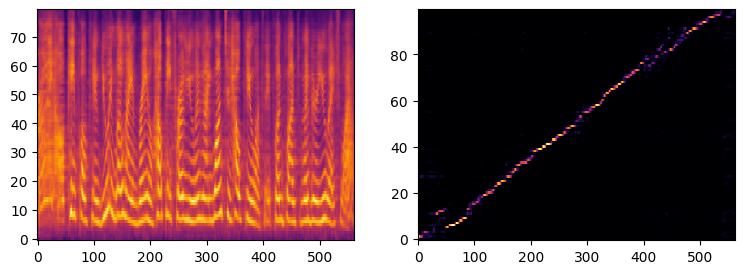

RuntimeError: File /content/drive/MyDrive/waveglow/waveglow/mel_spectrograms cannot be opened.

In [ ]:
#for gPu TTS Notebook and get results and give your own tacatron2 model Id
import logging

logging.getLogger('matplotlib').setLevel(logging.WARNING)
logging.getLogger('numba').setLevel(logging.WARNING)
logging.getLogger('librosa').setLevel(logging.WARNING)


#Universal HiFi-GAN (has some robotic noise): 1qpgI41wNXFcH-iKq1Y42JlBC9j0je8PW
tacotron_id = "15cwbdhE7kfNWpE_BcYOoXsswiCFLQA1o"

hifigan_id = "universal"

#_leave blank or enter "universal" for universal model_



if tacotron_id != "":
    TACOTRON2_ID = tacotron_id
else:
    raise Exception("No ID provided.")

if hifigan_id in {"", "universal"}:
    HIFIGAN_ID = "universal"
    print("Using universal Hifi-Gan model.")
else:
    HIFIGAN_ID = hifigan_id

# Check if Initialized
try:
    initialized
except NameError:
    print("Setting up, please wait.\n")
    !pip install tqdm -q
    from tqdm.notebook import tqdm
    with tqdm(total=5, leave=False) as pbar:
        import os
        from os.path import exists, join, basename, splitext
        !pip install resampy
        !pip install git+https://github.com/wkentaro/gdown.git
        git_repo_url = 'https://github.com/justinjohn0306/TTS-TT2.git'
        project_name = splitext(basename(git_repo_url))[0]
        if not exists(project_name):
            # clone and install
            !git clone -q --recursive {git_repo_url}
            !git clone -q --recursive https://github.com/justinjohn0306/hifi-gan
            !pip install -q unidecode
        pbar.update(1) # downloaded TT2 and HiFi-GAN
        import sys
        sys.path.append('hifi-gan')
        sys.path.append(project_name)
        import time
        import matplotlib
        import matplotlib.pylab as plt
        import gdown
        d = 'https://drive.google.com/uc?id='

        %matplotlib inline
        import IPython.display as ipd
        import numpy as np
        import torch
        import json
        from hparams import create_hparams
        from model import Tacotron2
        from layers import TacotronSTFT
        from audio_processing import griffin_lim
        from text import text_to_sequence
        from env import AttrDict
        from meldataset import mel_spectrogram, MAX_WAV_VALUE
        from models import Generator
        from denoiser import Denoiser
        import resampy
        import scipy.signal

        pbar.update(1) # initialized Dependancies

        graph_width = 900
        graph_height = 360
        def plot_data(data, figsize=(int(graph_width/100), int(graph_height/100))):
            %matplotlib inline
            fig, axes = plt.subplots(1, len(data), figsize=figsize)
            for i in range(len(data)):
                axes[i].imshow(data[i], aspect='auto', origin='lower',
                            interpolation='none', cmap='inferno')
            fig.canvas.draw()
            plt.show()

        # Setup Pronounciation Dictionary
        !wget 'https://github.com/justinjohn0306/FakeYou-Tacotron2-Notebook/releases/download/CMU_dict/merged.dict.txt'
        thisdict = {}
        for line in reversed((open('merged.dict.txt', "r").read()).splitlines()):
            thisdict[(line.split(" ",1))[0]] = (line.split(" ",1))[1].strip()

        pbar.update(1) # Downloaded and Set up Pronounciation Dictionary

        def ARPA(text, punctuation=r"!?,.;", EOS_Token=True):
            out = ''
            for word_ in text.split(" "):
                word=word_; end_chars = ''
                while any(elem in word for elem in punctuation) and len(word) > 1:
                    if word[-1] in punctuation: end_chars = word[-1] + end_chars; word = word[:-1]
                    else: break
                try:
                    word_arpa = thisdict[word.upper()]
                    word = "{" + str(word_arpa) + "}"
                except KeyError: pass
                out = (out + " " + word + end_chars).strip()
            if EOS_Token and out[-1] != ";": out += ";"
            return out

        def get_hifigan(MODEL_ID, conf_name):
            # Download HiFi-GAN
            hifigan_pretrained_model = 'hifimodel_' + conf_name
            #gdown.download(d+MODEL_ID, hifigan_pretrained_model, quiet=False)

            if MODEL_ID == 1:
              !wget "https://github.com/justinjohn0306/tacotron2/releases/download/assets/Superres_Twilight_33000" -O $hifigan_pretrained_model
            elif MODEL_ID == "universal":
              !wget "https://github.com/justinjohn0306/tacotron2/releases/download/assets/g_02500000" -O $hifigan_pretrained_model
            else:
              gdown.download(d+MODEL_ID, hifigan_pretrained_model, quiet=False)

            # Load HiFi-GAN
            conf = os.path.join("hifi-gan", conf_name + ".json")
            with open(conf) as f:
                json_config = json.loads(f.read())
            h = AttrDict(json_config)
            torch.manual_seed(h.seed)
            hifigan = Generator(h).to(torch.device("cuda"))
            state_dict_g = torch.load(hifigan_pretrained_model, map_location=torch.device("cuda"))
            hifigan.load_state_dict(state_dict_g["generator"])
            hifigan.eval()
            hifigan.remove_weight_norm()
            denoiser = Denoiser(hifigan, mode="normal")
            return hifigan, h, denoiser

        # Download character HiFi-GAN
        hifigan, h, denoiser = get_hifigan(HIFIGAN_ID, "config_v1")
        # Download super-resolution HiFi-GAN
        hifigan_sr, h2, denoiser_sr = get_hifigan(1, "config_32k")
        pbar.update(1) # Downloaded and Set up HiFi-GAN

        def has_MMI(STATE_DICT):
            return any(True for x in STATE_DICT.keys() if "mi." in x)

        def get_Tactron2(MODEL_ID):
            # Download Tacotron2
            tacotron2_pretrained_model = 'MLPTTS'
            gdown.download(d+MODEL_ID, tacotron2_pretrained_model, quiet=False)
            if not exists(tacotron2_pretrained_model):
                raise Exception("Tacotron2 model failed to download!")
            # Load Tacotron2 and Config
            hparams = create_hparams()
            hparams.sampling_rate = 22050
            hparams.max_decoder_steps = 3000 # Max Duration
            hparams.gate_threshold = 0.25 # Model must be 25% sure the clip is over before ending generation
            model = Tacotron2(hparams)
            state_dict = torch.load(tacotron2_pretrained_model)['state_dict']
            if has_MMI(state_dict):
                raise Exception("ERROR: This notebook does not currently support MMI models.")
            model.load_state_dict(state_dict)
            _ = model.cuda().eval().half()
            return model, hparams

        model, hparams = get_Tactron2(TACOTRON2_ID)
        previous_tt2_id = TACOTRON2_ID

        pbar.update(1) # Downloaded and Set up Tacotron2

        # Extra Info
        def end_to_end_infer(text, pronounciation_dictionary, show_graphs):

            for i in [x for x in text.split("\n") if len(x)]:
                if not pronounciation_dictionary:
                    if i[-1] != ";":
                        i = i + ";"
                else:
                    i = ARPA(i)
                with torch.no_grad(): # save VRAM by not including gradients
                    sequence = np.array(text_to_sequence(i, ['english_cleaners']))[None, :]
                    sequence = torch.autograd.Variable(torch.from_numpy(sequence)).cuda().long()
                    mel_outputs, mel_outputs_postnet, _, alignments = model.inference(sequence)
                    mel_outputs_2d = mel_outputs.view(mel_outputs.size(1), mel_outputs.size(2))


                    if show_graphs:
                        plot_data((mel_outputs_postnet.float().data.cpu().numpy()[0],
                                alignments.float().data.cpu().numpy()[0].T))
                    y_g_hat = hifigan(mel_outputs_postnet.float())
                    audio = y_g_hat.squeeze()
                    audio = audio * MAX_WAV_VALUE
                    audio_denoised = denoiser(audio.view(1, -1), strength=35)[:, 0]
                    # torch.save(mel_outputs_2d, '/content/drive/MyDrive/waveglow/waveglow/mel_spectrograms')
                    # Resample to 32k
                    audio_denoised = audio_denoised.cpu().numpy().reshape(-1)

                    normalize = (MAX_WAV_VALUE / np.max(np.abs(audio_denoised))) ** 0.9
                    audio_denoised = audio_denoised * normalize
                    wave = resampy.resample(
                        audio_denoised,
                        h.sampling_rate,
                        h2.sampling_rate,
                        filter="sinc_window",
                        window=scipy.signal.windows.hann,
                        num_zeros=8,
                    )
                    wave_out = wave.astype(np.int16)

                    # HiFi-GAN super-resolution
                    wave = wave / MAX_WAV_VALUE
                    wave = torch.FloatTensor(wave).to(torch.device("cuda"))
                    new_mel = mel_spectrogram(
                        wave.unsqueeze(0),
                        h2.n_fft,
                        h2.num_mels,
                        h2.sampling_rate,
                        h2.hop_size,
                        h2.win_size,
                        h2.fmin,
                        h2.fmax,
                    )
                    y_g_hat2 = hifigan_sr(new_mel)
                    audio2 = y_g_hat2.squeeze()
                    audio2 = audio2 * MAX_WAV_VALUE
                    audio2_denoised = denoiser(audio2.view(1, -1), strength=35)[:, 0]

                    # High-pass filter, mixing and denormalizing
                    audio2_denoised = audio2_denoised.cpu().numpy().reshape(-1)
                    b = scipy.signal.firwin(
                        101, cutoff=10500, fs=h2.sampling_rate, pass_zero=False
                    )
                    y = scipy.signal.lfilter(b, [1.0], audio2_denoised)
                    y *= superres_strength
                    y_out = y.astype(np.int16)
                    y_padded = np.zeros(wave_out.shape)
                    y_padded[:y_out.shape[0]] = y_out
                    sr_mix = wave_out + y_padded
                    sr_mix = sr_mix / normalize

                    print("")
                    ipd.display(ipd.Audio(sr_mix.astype(np.int16), rate=h2.sampling_rate))

    from IPython.display import clear_output
    clear_output()
    initialized = "Ready"

if previous_tt2_id != TACOTRON2_ID:
    print("Updating Models")
    model, hparams = get_Tactron2(TACOTRON2_ID)
    hifigan, h, denoiser = get_hifigan(HIFIGAN_ID, "config_v1")
    previous_tt2_id = TACOTRON2_ID

pronounciation_dictionary = False # {type:"boolean"}
# disables automatic ARPAbet conversion, useful for inputting your own ARPAbet pronounciations or just for testing
show_graphs = True # {type:"boolean"}
max_duration = 20 # {type:"integer"}
model.decoder.max_decoder_steps = max_duration * 80
stop_threshold = 0.5 # {type:"number"}
model.decoder.gate_threshold = stop_threshold
superres_strength = 10 # {type:"number"}



print(f"Current Config:\npronounciation_dictionary: {pronounciation_dictionary}\nshow_graphs: {show_graphs}\nmax_duration (in seconds): {max_duration}\nstop_threshold: {stop_threshold}\nsuperres_strength: {superres_strength}\n\n")

time.sleep(1)
print("Enter/Paste your text.")
contents = []
while True:
    try:
        print("-"*50)
        line = input()
        if line == "":
            continue
        end_to_end_infer(line, not pronounciation_dictionary, show_graphs)
    except EOFError:
        break
    except KeyboardInterrupt:
        print("Stopping...")
        break


## synthesis audio throgh mel_spectrograms.pt using waveglow


In [ ]:
%cd  /content/drive/MyDrive/waveglow/waveglow

In [ ]:
%cd apex

In [ ]:
!pip install -v --disable-pip-version-check --no-cache-dir --no-build-isolation --config-settings "--build-option=--cpp_ext" --config-settings "--build-option=--cuda_ext" ./


In [ ]:
%cd /content/drive/MyDrive/waveglow/waveglow

In [ ]:
!python inference.py -f <(ls mel_spectrograms/*.pt) -w waveglow_256channels_universal_v5.pt -o . --is_fp16 -s 0.6